In [1]:
from sklearn import preprocessing
import numpy as np
import pandas as pd
import os

In [2]:
def derivative(x):
    return x * (1.0 - x)

In [3]:
def sigmoid(x):
    return 1.0 / (1.0 + np.exp(-x))

In [4]:
NEWLINE = '\n'

HAM = 'ham'
SPAM = 'spam'

SOURCES = [
    ('dataSets/beck-s',      HAM),
    ('dataSets/farmer-d',    HAM),
    ('dataSets/kaminski-v',  HAM),
    ('dataSets/kitchen-l',   HAM),
    ('dataSets/lokay-m',     HAM),
    ('dataSets/williams-w3', HAM),
    ('dataSets/BG',          SPAM),
    ('dataSets/GP',          SPAM),
    ('dataSets/SH',          SPAM)
]

SKIP_FILES = {'cmds'}


def read_files(path):
    '''
    Generator of pairs (filename, filecontent)
    for all files below path whose name is not in SKIP_FILES.
    The content of the file is of the form:
        header....
        <emptyline>
        body...
    This skips the headers and returns body only.
    '''
    for root, dir_names, file_names in os.walk(path):
        for path in dir_names:
            read_files(os.path.join(root, path))
        for file_name in file_names:
            if file_name not in SKIP_FILES:
                file_path = os.path.join(root, file_name)
                if os.path.isfile(file_path):
                    past_header, lines = False, []
                    f = open(file_path, encoding="latin-1")
                    for line in f:
                        if past_header:
                            lines.append(line)
                        elif line == NEWLINE:
                            past_header = True
                    f.close()
                    content = NEWLINE.join(lines)
                    yield file_path, content


def build_data_frame(l, path, classification):
    rows = []
    index = []
    for i, (file_name, text) in enumerate(read_files(path)):
        rows.append({'text': text, 'class': classification})
        index.append(file_name)
   
    data_frame = pd.DataFrame(rows, index=index)
    return data_frame, len(rows)

def load_data():
    data = pd.DataFrame({'text': [], 'class': []})
    l = 0
    for path, classification in SOURCES:
        data_frame, nrows = build_data_frame(l, path, classification)
        data = data.append(data_frame)
        l += nrows
    data = data.reindex(np.random.permutation(data.index))
    return data

In [5]:
# We will load the Email spam dataset into Panadas dataframe here . 
data=load_data()

In [6]:
data = data.sample(frac=1).reset_index(drop=True)
data = data[:10000]
print(len(data))
print(data)

10000
                                                   text class
0     ------a1775aa55d-wanadoo.fr\n\nContent-Type: t...  spam
1     This is a multi-part message in MIME format.\n...  spam
2     Houston voters are facing a very exciting elec...   ham
3     <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Tr...  spam
4     <META HTTP-EQUIV=3D"Content-Type" =\n\nCONTENT...  spam
...                                                 ...   ...
9995  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam
9996  \n\n\n\n\n\nBUSINESS HIGHLIGHTS\n\n\n\nEnron I...   ham
9997  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam
9998  hey - i feel great\n\n\n\nH_Y-D,R-o_C-0.D'O^N'...  spam
9999  \n\n\n\nStart Date: 12/19/01; HourAhead hour: ...   ham

[10000 rows x 2 columns]


In [7]:
# We change the dataframe index from filenames to indices here. 
new_index=[x for x in range(len(data))]
data.index=new_index

In [8]:
print(data)

                                                   text class
0     ------a1775aa55d-wanadoo.fr\n\nContent-Type: t...  spam
1     This is a multi-part message in MIME format.\n...  spam
2     Houston voters are facing a very exciting elec...   ham
3     <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Tr...  spam
4     <META HTTP-EQUIV=3D"Content-Type" =\n\nCONTENT...  spam
...                                                 ...   ...
9995  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam
9996  \n\n\n\n\n\nBUSINESS HIGHLIGHTS\n\n\n\nEnron I...   ham
9997  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam
9998  hey - i feel great\n\n\n\nH_Y-D,R-o_C-0.D'O^N'...  spam
9999  \n\n\n\nStart Date: 12/19/01; HourAhead hour: ...   ham

[10000 rows x 2 columns]


In [9]:
type(data)

pandas.core.frame.DataFrame

In [10]:
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer

In [11]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

vectorizer = TfidfVectorizer(lowercase=True, stop_words="english",
                             encoding='latin-1',min_df=8) 


In [12]:
train_matrix = vectorizer.fit_transform(data['text'])

In [13]:
train_matrix

<10000x16616 sparse matrix of type '<class 'numpy.float64'>'
	with 1016938 stored elements in Compressed Sparse Row format>

In [14]:
print(train_matrix.shape)

(10000, 16616)


In [15]:
import nltk
# nltk.download('stopwords')
from nltk.corpus import stopwords

# def cleaner(df, col_name):
#     stop = stopwords.words('english')

#     def remove_stops(x, stopwordseq):
#         return ' '.join(x for x in x.split() if x not in stopwordseq)

#     data[col_name] = data[col_name].str.lower()\
#                                .str.replace('[^\w\s]', '').apply(remove_stops, stop)
#     return df

# data = data.pipe(cleaner, 'text')

In [16]:
print(data.isna())

       text  class
0     False  False
1     False  False
2     False  False
3     False  False
4     False  False
...     ...    ...
9995  False  False
9996  False  False
9997  False  False
9998  False  False
9999  False  False

[10000 rows x 2 columns]


In [17]:
print(data.isna().sum())
print(data.isna().sum())

text     0
class    0
dtype: int64
text     0
class    0
dtype: int64


In [18]:
duplicate_rows_df = data[data.duplicated(['text'])]
print("number of duplicate rows: ", duplicate_rows_df.shape)
print("Unique entries length: ", len(data.text.unique()))
print("Total entries length: ", len(data.text))

number of duplicate rows:  (237, 2)
Unique entries length:  9763
Total entries length:  10000


In [19]:
print("Shape of dataframe before dropping duplicates: ", data.shape)
print("shape of dataframe after dropping duplicates: ", data.drop_duplicates(subset="text").shape)

Shape of dataframe before dropping duplicates:  (10000, 2)
shape of dataframe after dropping duplicates:  (9763, 2)


In [20]:
print("data types: \n", data.dtypes)

data types: 
 text     object
class    object
dtype: object


In [21]:
print(data)

                                                   text class
0     ------a1775aa55d-wanadoo.fr\n\nContent-Type: t...  spam
1     This is a multi-part message in MIME format.\n...  spam
2     Houston voters are facing a very exciting elec...   ham
3     <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Tr...  spam
4     <META HTTP-EQUIV=3D"Content-Type" =\n\nCONTENT...  spam
...                                                 ...   ...
9995  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam
9996  \n\n\n\n\n\nBUSINESS HIGHLIGHTS\n\n\n\nEnron I...   ham
9997  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam
9998  hey - i feel great\n\n\n\nH_Y-D,R-o_C-0.D'O^N'...  spam
9999  \n\n\n\nStart Date: 12/19/01; HourAhead hour: ...   ham

[10000 rows x 2 columns]


In [22]:
from nltk.corpus import stopwords
stop = stopwords.words('english')

In [23]:
print(stop)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [24]:
data['text'].apply(lambda x: [item for item in x if item not in stop])

0       [-, -, -, -, -, -, 1, 7, 7, 5, 5, 5, -, w, n, ...
1       [T, h,  ,  ,  , u, l, -, p, r,  , e, g, e,  , ...
2       [H, u, n,  , v, e, r,  , r, e,  , f, c, n, g, ...
3       [<, !, D, O, C, T, Y, P, E,  , H, T, M, L,  , ...
4       [<, M, E, T, A,  , H, T, T, P, -, E, Q, U, I, ...
                              ...                        
9995    [<, !, D, O, C, T, Y, P, E,  , H, T, M, L,  , ...
9996    [\n, \n, \n, \n, \n, \n, B, U, S, I, N, E, S, ...
9997    [<, !, D, O, C, T, Y, P, E,  , H, T, M, L,  , ...
9998    [h, e,  , -,  ,  , f, e, e, l,  , g, r, e, \n,...
9999    [\n, \n, \n, \n, S, r,  , D, e, :,  , 1, 2, /,...
Name: text, Length: 10000, dtype: object

In [25]:
print(data)

                                                   text class
0     ------a1775aa55d-wanadoo.fr\n\nContent-Type: t...  spam
1     This is a multi-part message in MIME format.\n...  spam
2     Houston voters are facing a very exciting elec...   ham
3     <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Tr...  spam
4     <META HTTP-EQUIV=3D"Content-Type" =\n\nCONTENT...  spam
...                                                 ...   ...
9995  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam
9996  \n\n\n\n\n\nBUSINESS HIGHLIGHTS\n\n\n\nEnron I...   ham
9997  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam
9998  hey - i feel great\n\n\n\nH_Y-D,R-o_C-0.D'O^N'...  spam
9999  \n\n\n\nStart Date: 12/19/01; HourAhead hour: ...   ham

[10000 rows x 2 columns]


In [26]:
data['text'] = data['text'].astype(str)

In [27]:
print("data types: \n", data.dtypes)

data types: 
 text     object
class    object
dtype: object


In [28]:
#We will add two more columns to our dataframe for tokenized text and token count.
def token_count(row):
    'returns token count'
    text=row['tokenized_text']
    length=len(text.split())
    return length

def tokenize(row):
    "tokenize the text using default space tokenizer"
    text=row['text']
    lines=(line for line in text.split(NEWLINE) )
    tokenized=""
    for sentence in lines:
        tokenized+= " ".join(tok for tok in sentence.split())
    return tokenized

In [29]:
#We will use apply functions on dataframe to add the columns for :

#* Tokenized text
#* Token Count
#* Language
#Language column in this case is not necessary as we only have english text. However this approach is good for properly dealing with multi lingual data.



data['tokenized_text']=data.apply(tokenize, axis=1)

In [30]:
data['token_count']=data.apply(token_count, axis=1)

In [31]:
# Checking the data
data.head()

,text,class,tokenized_text,token_count
0,------a1775aa55d-wanadoo.fr\n\nContent-Type: t...,spam,------a1775aa55d-wanadoo.frContent-Type: text/...,60
1,This is a multi-part message in MIME format.\n...,spam,This is a multi-part message in MIME format.--...,33
2,Houston voters are facing a very exciting elec...,ham,Houston voters are facing a very exciting elec...,139
3,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",spam,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",845
4,"<META HTTP-EQUIV=3D""Content-Type"" =\n\nCONTENT...",spam,"<META HTTP-EQUIV=3D""Content-Type"" =CONTENT=3D""...",30


In [32]:
print("data types: \n", data.dtypes)

data types: 
 text              object
class             object
tokenized_text    object
token_count        int64
dtype: object


In [33]:
data['tokenized_text'] = data['tokenized_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

In [34]:
def tokenized_count(row):
    'returns token count'
    text=row['tokenized_text']
    length=len(text.split())
    return length

data['final_token_count']=data.apply(token_count, axis=1)

In [35]:
data.head()

,text,class,tokenized_text,token_count,final_token_count
0,------a1775aa55d-wanadoo.fr\n\nContent-Type: t...,spam,------a1775aa55d-wanadoo.frContent-Type: text/...,60,54
1,This is a multi-part message in MIME format.\n...,spam,This multi-part message MIME format.------=_Ne...,33,30
2,Houston voters are facing a very exciting elec...,ham,Houston voters facing exciting election year. ...,139,94
3,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",spam,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",845,788
4,"<META HTTP-EQUIV=3D""Content-Type"" =\n\nCONTENT...",spam,"<META HTTP-EQUIV=3D""Content-Type"" =CONTENT=3D""...",30,29


In [36]:
vect = TfidfVectorizer(stop_words='english', max_df=0.50, min_df=2)
X = vect.fit_transform(data.tokenized_text)

In [37]:
print(X.shape)

(10000, 72246)


In [38]:
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
X_dense = X.todense()
coords = PCA(n_components=2).fit_transform(X_dense)
plt.scatter(coords[:, 0], coords[:, 1], c='#BEF4FB')
plt.show()

<Figure size 640x480 with 1 Axes>

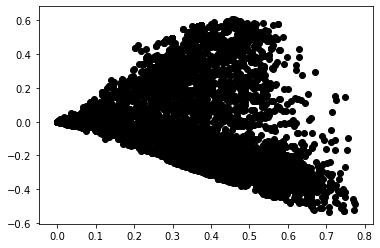

In [39]:
coords = TruncatedSVD(n_components=2, n_iter=10).fit_transform(X)
plt.scatter(coords[:, 0], coords[:, 1], c='#000000')
plt.show()

#ignore this one

In [40]:
from sklearn.feature_extraction.text import TfidfVectorizer
features = vect.get_feature_names()

In [41]:
print(features)

['00', '000', '0000', '00000', '000000', '000000000007590', '000000000007590request', '00000001', '000000border', '000000size', '000023', '0000283', '000033', '000033size', '00005', '000060', '000066', '000066size', '000079size', '000080', '000080face', '000080size', '000080topmargin', '000081', '000082', '000099', '0000a0', '0000c4', '0000cc', '0000delivered', '0000e1', '0000e6', '0000ee', '0000f0', '0000f2', '0000f4', '0000ff', '0000ffsize', '0000message', '0000received', '0000size', '0000subject', '0001', '0001pt', '00036004', '0006', '000601d68703', '00065', '0007571982attn', '000d01c4b168', '000e', '000equity', '000here', '000individual', '000megawatts', '000mm', '000mmbtu', '000mw', '000names', '000orders', '000signing', '000this', '000us', '000when', '001', '0010', '0011', '0012', '0013', '0014', '0015', '00156', '0016', '0017', '0018', '0019', '00190', '00191', '002', '0020', '0020489', '0021', '00212', '0022', '00225', '00226', '0023', '00232', '0024', '00243', '00244', '00249

In [42]:
def top_tfidf_feats(row, features, top_n=20):
    topn_ids = np.argsort(row)[::-1][:top_n]
    top_feats = [(features[i], row[i]) for i in topn_ids]
    df = pd.DataFrame(top_feats, columns=['features', 'score'])
    return df
def top_feats_in_doc(X, features, row_id, top_n=25):
    row = np.squeeze(X[row_id].toarray())
    return top_tfidf_feats(row, features, top_n)

In [43]:
print(top_feats_in_doc(X, features, 1, 10))

                    features     score
0                         3d  0.460906
1                    content  0.220004
2                   ccd0gbdw  0.201386
3  e246713fd43ca80f9c6cd578c  0.201386
4                    lummemi  0.201386
5                     tardes  0.195027
6                     2einfo  0.182659
7                       text  0.166958
8                       type  0.166081
9                     2e1437  0.164388


In [44]:
def top_mean_feats(X, features, grp_ids=None, min_tfidf=0.1, top_n=25):

    if grp_ids:

        D = X[grp_ids].toarray()

    else:

        D = X.toarray()



    D[D < min_tfidf] = 0

    tfidf_means = np.mean(D, axis=0)

    return top_tfidf_feats(tfidf_means, features, top_n)

In [45]:
print(top_mean_feats(X, features, None, 0.1, 10))

  features     score
0       br  0.122640
1       3d  0.070793
2     font  0.050755
3       td  0.034853
4     nbsp  0.026481
5       tr  0.021930
6    enron  0.014789
7      ect  0.014512
8     span  0.014464
9      div  0.014458


In [46]:
from sklearn.cluster import KMeans, MiniBatchKMeans
n_clusters = 3
clf = KMeans(n_clusters=n_clusters, max_iter=100, init='k-means++', n_init=1)
labels = clf.fit_predict(X)

In [47]:
X_dense = X.todense()
pca = PCA(n_components=2).fit(X_dense)
coords = pca.transform(X_dense)

In [48]:
label_colors = ["#2AB0E9", "#2BAF74", "#D7665E", "#CCCCCC", "#D2CA0D", "#522A64", "#A3DB05", "#FC6514"]
colors = [label_colors[i] for i in labels]

In [49]:
centroids = clf.cluster_centers_
centroid_coords = pca.transform(centroids)

In [50]:
def top_feats_per_cluster(X, y, features, min_tfidf=0.1, top_n=25):
    dfs = []
    labels = np.unique(y)
    for label in labels:
        ids = np.where(y==label) 
        feats_df = top_mean_feats(X, features, ids, min_tfidf=min_tfidf, top_n=top_n)
        feats_df.label = label
        dfs.append(feats_df)
    return dfs

def plot_tfidf_classfeats_h(dfs):
    fig = plt.figure(figsize=(12, 9), facecolor="w")
    x = np.arange(len(dfs[0]))
    for i, df in enumerate(dfs):
        ax = fig.add_subplot(1, len(dfs), i+1)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.set_frame_on(False)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()
        ax.set_xlabel("Tf-Idf Score", labelpad=16, fontsize=14)
        ax.set_title("cluster = " + str(df.label), fontsize=16)
        ax.ticklabel_format(axis='x', style='sci', scilimits=(-2,2))
        ax.barh(x, df.score, align='center', color='#7530FF')
        ax.set_yticks(x)
        ax.set_ylim([-1, x[-1]+1])
        yticks = ax.set_yticklabels(df.features)
        plt.subplots_adjust(bottom=0.09, right=0.97, left=0.15, top=0.95, wspace=0.52)
    plt.show()

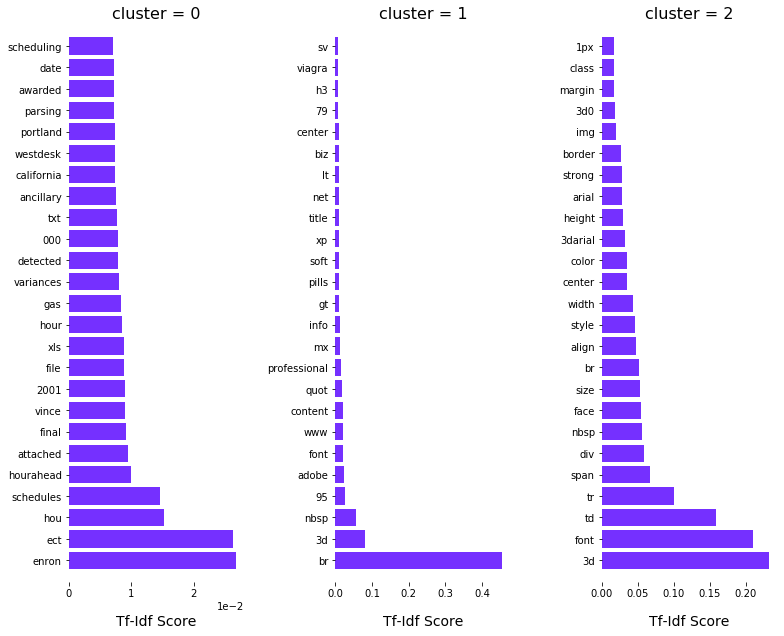

In [51]:
plot_tfidf_classfeats_h(top_feats_per_cluster(X, labels, features, 0.1, 25))

In [52]:
train_data = data[:7000]
test_data = data[7000:]
print("TRAIN DATA SHAPE: ", train_data.shape)
print("TEST DATA SHAPE: ", test_data.shape)
print("Train data: ", train_data)
print("Test dats: ", test_data)

TRAIN DATA SHAPE:  (7000, 5)
TEST DATA SHAPE:  (3000, 5)
Train data:                                                     text class  \
0     ------a1775aa55d-wanadoo.fr\n\nContent-Type: t...  spam   
1     This is a multi-part message in MIME format.\n...  spam   
2     Houston voters are facing a very exciting elec...   ham   
3     <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Tr...  spam   
4     <META HTTP-EQUIV=3D"Content-Type" =\n\nCONTENT...  spam   
...                                                 ...   ...   
6995  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2//E...  spam   
6996  Let's agree the switch happens November 1st an...   ham   
6997                                         Thank you.   ham   
6998  TO: Houston Area Employees Participating in Do...   ham   
6999  ----760596_27560354.kj659\n\nContent-Type: tex...  spam   

                                         tokenized_text  token_count  \
0     ------a1775aa55d-wanadoo.frContent-Type: text/...           60   
1    

In [53]:
from collections import Counter
import pprint

spam_counts = Counter()
ham_counts = Counter()
total_counts = Counter()
spam_ham_ratios = Counter()

pp = pprint.PrettyPrinter(indent=4)

In [54]:
for index, row in train_data.iterrows():
    if(row['class'] == "ham"):
        for word in row['tokenized_text'].split(" "):
            ham_counts[word] += 1
            total_counts[word] += 1
    else:
        for word in row['tokenized_text'].split(" "):
            spam_counts[word] += 1
            total_counts[word] += 1

In [55]:
pp.pprint(spam_counts.most_common()[0:30])

[   ('1px', 4001),
    ('HTML', 3198),
    ('medium', 2930),
    ('-', 2912),
    ('I', 2806),
    ('Helvetica,', 2704),
    ('solid;', 2555),
    ('face=3DArial', 2489),
    ('The', 2338),
    ('none;', 2206),
    ('This', 2177),
    ('align=3Dmiddle', 1880),
    ('face=3DVerdana', 1720),
    ('<a', 1699),
    ('message', 1664),
    ('"-//W3C//DTD', 1615),
    ('PUBLIC', 1586),
    ('New', 1572),
    ('0cm', 1525),
    ('FONT-FAMILY:', 1450),
    ('Arial,', 1351),
    ('BORDER-BOTTOM:', 1344),
    ('statements', 1323),
    ('may', 1297),
    ('de', 1282),
    ('information', 1246),
    ('company', 1239),
    ('style=3D"FONT-SIZE:', 1195),
    ('<font', 1118),
    ('BORDER-LEFT:', 1080)]


In [56]:
for word,count in list(total_counts.most_common()):
    if(count > 100):
        spam_ham_ratio = spam_counts[word] / float(ham_counts[word]+1)
        spam_ham_ratios[word] = spam_ham_ratio

for word,ratio in spam_ham_ratios.most_common():
    if(ratio > 1):
        spam_ham_ratios[word] = np.log(ratio)
    else:
        spam_ham_ratios[word] = -np.log((1 / (ratio+0.01)))

In [57]:
# words most frequently seen in a text with a "spam" label
pp.pprint(spam_ham_ratios.most_common()[0:30])

[   ('1px', 8.294299608857235),
    ('Helvetica,', 7.902487437162855),
    ('solid;', 7.845807502637805),
    ('face=3DArial', 7.819636302367592),
    ('none;', 7.698936199813447),
    ('align=3Dmiddle', 7.539027055823995),
    ('face=3DVerdana', 7.450079569807499),
    ('"-//W3C//DTD', 7.387090235656757),
    ('0cm', 7.329749689041512),
    ('FONT-FAMILY:', 7.27931883541462),
    ('Arial,', 7.208600337960199),
    ('BORDER-BOTTOM:', 7.203405521083095),
    ('style=3D"FONT-SIZE:', 7.085901464365611),
    ('<font', 7.0192966537150445),
    ('BORDER-LEFT:', 6.984716320118266),
    ('BORDER-TOP:', 6.93537044601511),
    ('<!DOCTYPE', 6.910750787961936),
    ('MIME', 6.877296071497429),
    ('cellPadding=3D0', 6.846943139585379),
    ('cellSpacing=3D0', 6.841615476477592),
    ('multi-part', 6.837332814685591),
    ('border="0"', 6.816735880594968),
    ('COLOR:', 6.803505257608338),
    ('XP', 6.785587645007929),
    ('align=3Dcenter><FONT', 6.769641976852503),
    ('HTTP-EQUIV=3D"Content

In [58]:

# words most frequently seen in a text with a "ham" label
pp.pprint(list(reversed(spam_ham_ratios.most_common()))[0:30])

[   ('EPMI', -4.605170185988092),
    ('Sally', -4.605170185988092),
    ('dbCaps97Data:', -4.605170185988092),
    ('FERC', -4.605170185988092),
    ('ENA', -4.605170185988092),
    ('Paso', -4.605170185988092),
    ('detected.LOG', -4.605170185988092),
    ('Daren', -4.605170185988092),
    ('variances', -4.605170185988092),
    ('FW:', -4.605170185988092),
    ('awarded.', -4.605170185988092),
    ('dbCaps97Data!!!Unknown', -4.605170185988092),
    ('Scheduling\\ISO', -4.605170185988092),
    ('O:\\Portland\\WestDesk\\California', -4.605170185988092),
    ('MESSAGES:PARSING', -4.605170185988092),
    ('schedules', -4.605170185988092),
    ('Kitchen,', -4.605170185988092),
    ('HPL', -4.605170185988092),
    ('hour:', -4.605170185988092),
    ("Enron's", -4.605170185988092),
    ('database.Alias:', -4.605170185988092),
    ('HourAhead', -4.605170185988092),
    ('Houston', -4.605170185988092),
    ('0.00', -4.605170185988092),
    ('Forwarded', -4.605170185988092),
    ('AMTo:', -4.

In [59]:
#Encoding
vocab = set(total_counts.keys())
vocab_size = len(vocab)
print(vocab_size)

274070


In [60]:
vocab_vector = np.zeros((1, vocab_size))
pp.pprint(vocab_vector.shape)
pp.pprint(vocab_vector)

(1, 274070)
array([[0., 0., 0., ..., 0., 0., 0.]])


In [61]:
#  Maps a word to its column in the vocab_vector
word_column_dict = {}

for i, word in enumerate(vocab):
    # {key: value} is {word: column}
    word_column_dict[word] = i
    
pp.pprint(word_column_dict)

{   '': 0,
    '!': 266436,
    '!!': 91461,
    '!!!': 52940,
    '!!!!!!!!!!!!!!': 90486,
    '!!!!!!!!</font></p><p><a': 69494,
    '!!!!!!!</font></p><p': 169443,
    '!!!!!!!</span></font></p><table': 263399,
    '!!!!!!</font></td></tr></table><p': 239499,
    "!!!!.It's": 103182,
    '!!!!</font></font><br>&nbsp;<p': 153486,
    '!!!!MUITO': 32589,
    '!!!$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$$FOLLOW': 97506,
    '!!!&nbsp;</font></font></font></b></blockquote><font': 132186,
    '!!!,<br><br>This': 83141,
    '!!!--Irish': 185491,
    '!!!</FONT></FONT></I></B><P><B><FONT': 98961,
    '!!!</FONT></P><P': 13436,
    '!!!</a></font></b></font><BR></td></tr></table></center></div><p>If': 134701,
    '!!!</a><o:p></o:p></span></b></p></td></tr><tr': 186781,
    '!!!</font></font></b></blockquote><blockquote><font': 146725,
    '!!!</span></a></span></b><span': 26998,
    '!!!</span></a><o:p></o:p></span></b>=</p></td></tr><tr': 46304,
    '!!!</span></a><o:p></o:p>

    '"Stein,': 271471,
    '"Steve': 186366,
    '"Stock': 217040,
    '"Stop': 261989,
    '"Strong': 62132,
    '"Successful': 53355,
    '"Sundae': 231537,
    '"Sunny': 190885,
    '"SunnyJim"': 107253,
    '"Supply': 91408,
    '"TAccount"': 36535,
    '"TGK".': 103902,
    '"THANKS': 110898,
    '"THE': 268662,
    '"THIRTY': 272559,
    '"TO': 133061,
    '"TURN"': 266541,
    '"Taft,': 270758,
    '"Ten': 191414,
    '"Term"': 121776,
    '"Thanks': 209843,
    '"That': 171586,
    '"The': 118375,
    '"TheTemperate': 148320,
    '"TheZone?"': 218501,
    '"TheeXPATRIATE': 242978,
    '"TheeXpatriate': 201976,
    '"Thegas': 202867,
    '"Then': 235325,
    '"There': 193472,
    '"There\'s': 107076,
    '"Thermogenics"': 11079,
    '"These': 269467,
    '"ThinData': 21804,
    '"This': 78696,
    '"Thomas,': 28110,
    '"Those': 141613,
    '"Three': 128020,
    '"Tiffany': 46899,
    '"Times': 187354,
    '"To"': 80328,
    '"Tom\'s': 171988,
    '"Too': 12930,
    '"Trading':

    '"scheduled,"': 176234,
    '"securities".': 140272,
    '"sell"': 193871,
    '"send"': 234892,
    '"settle"': 272450,
    '"shall': 83130,
    '"shareholders\'': 224874,
    '"short': 11494,
    '"shot>heard': 266969,
    '"show': 6525,
    '"sick"': 239758,
    '"sign-post': 29034,
    '"sign-postin': 25855,
    '"significant': 21073,
    '"significantly"': 196703,
    '"skills"': 35065,
    '"skunkworks"': 106804,
    '"skyscraper"': 182936,
    '"small"': 109494,
    '"smart': 270666,
    '"smiles': 98727,
    '"snapshot"': 7077,
    '"sniffing': 117063,
    '"so': 188098,
    '"solution"': 83867,
    '"solve': 145586,
    '"solving"': 235765,
    '"sometime': 187245,
    '"soul': 144132,
    '"source': 263337,
    '"space".': 52429,
    '"special': 111685,
    '"special"': 75987,
    '"speculative': 234476,
    '"spider': 75729,
    '"spoiler"': 272061,
    '"spot': 46826,
    '"spot"': 88038,
    '"spot"==20basis': 241403,
    '"spot"basis': 70995,
    '"spread': 81754,
   

    '#330000}.s1': 61920,
    '#333': 267505,
    '#333333">August': 144455,
    '#333333">Casa': 122340,
    '#333333;': 81676,
    '#333333;font-size:': 105561,
    '#333333;}.style34': 30210,
    '#333333;}.style79': 218438,
    '#333399;': 230589,
    '#336699;': 87793,
    '#3366FF;}style7': 213768,
    '#3366ff"><FONT': 165324,
    '#3366ff">Kerri': 93222,
    '#3366ff">laughter': 104084,
    '#3366ff">lethal': 5933,
    '#3366ff;': 189670,
    '#3366ff=">Act': 155647,
    '#339966;': 223161,
    '#33CC33}style10': 188974,
    '#33cc33;': 155809,
    '#34': 254643,
    '#341832.': 71370,
    '#349': 132762,
    '#359': 63207,
    '#367886924JB': 111528,
    '#3949),': 15680,
    '#3:': 168418,
    '#3:"The': 204457,
    '#3:</b><br><a': 206672,
    '#3:</font></font></b></blockquote><blockquote><b><font': 141860,
    '#3:<BR>Macromedia': 31374,
    '#3</=span><span': 111829,
    '#3</span><span': 159198,
    '#3<br>': 170452,
    '#3<br><b': 132021,
    '#3A': 242772,
    '#3B': 

    '$0.25': 55651,
    '$0.258': 224080,
    '$0.25<br>We': 158904,
    '$0.265Coastal': 107102,
    '$0.26El': 76918,
    '$0.28': 130063,
    '$0.2810': 229867,
    '$0.28Rating:': 39318,
    '$0.30': 6112,
    '$0.32<br>We': 35059,
    '$0.35': 257544,
    '$0.36&nbsp;': 202504,
    '$0.37': 62568,
    '$0.37Is': 86504,
    '$0.3883': 8546,
    '$0.38<BR>Long-term': 77693,
    '$0.39<br>Shares': 85592,
    '$0.3O': 234873,
    '$0.40+++++++++++++++++++++++++++++++++++++++Symbol:': 155876,
    '$0.40-$0.45/sh,': 220893,
    '$0.42<br><br><b>Projected': 95547,
    '$0.42Projected': 69680,
    '$0.43.': 129071,
    '$0.43/sh).': 146338,
    '$0.45': 200339,
    '$0.451-2': 86165,
    '$0.45<BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<BR><BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&=nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 200953,
    '$0.45<BR>Projected': 126733,
    '$0.45<BR>SPECULATIVE': 180366,
    '$0.45<br>------------------------------------

    '$199<br>No': 122441,
    '$19MM.': 268231,
    '$1<BR><BR><BR>China': 255818,
    '$1<p>10': 124114,
    '$1=.00to': 126139,
    '$1=.2bn': 239290,
    '$1=09.50</span></p>=09=09<p': 7496,
    '$1=20billion': 259848,
    '$1MM': 265679,
    '$1Million': 199074,
    '$1Million=First': 108151,
    '$1O0': 116070,
    '$1OO': 177241,
    '$1OO</b>': 13773,
    '$1You': 72501,
    '$1bn': 69312,
    '$1m.I': 203544,
    '$1mm': 137851,
    '$1range<br><br>st.oc.k': 27239,
    '$2': 131080,
    '$2,000': 127763,
    '$2,000),': 177922,
    '$2,000,000.00.<BR><BR>You': 4157,
    '$2,000.00': 166287,
    '$2,120': 4361,
    '$2,405706.43.': 219157,
    '$2,460': 37645,
    '$2,500': 183793,
    '$2,500,000': 243167,
    '$2,500/yearSr.': 117094,
    '$2,50Opertransmission.*Establishing': 212668,
    '$2,571,135.73booked': 63592,
    '$2,5O0<BR>per<BR>transmission.<BR><BR>*Estab|ishing': 82643,
    '$2,5O0pertransmission.*Estab|ishing': 81352,
    '$2-3': 88177,
    '$2-3is': 262090,
    

    '$519.73.Thanks-Katherine5-8643Daren': 88266,
    '$519.95</b></font><br>&': 242676,
    '$519.95</b></font><br><b>CorelDraw': 201748,
    '$519.95</b></font><br><br>We': 35292,
    '$52': 255241,
    '$52.35mm': 168104,
    '$520': 43621,
    '$52040': 11629,
    '$520</font></B></td></tr></table><table': 190787,
    '$525': 31619,
    '$526,477.71,': 53986,
    '$52600': 166856,
    '$529.99</b></font><br><b>Ad0be': 15448,
    '$529.99</b></font><br><b>Micros0ft': 49162,
    '$53': 92462,
    '$53Carisoprodol': 235859,
    '$53Plavix': 33382,
    '$54,000Sept.': 177328,
    '$54.95': 167474,
    '$54.95</b></font><br><b>Ad0be': 57386,
    '$54.95</b></font><br><b>CorelDraw': 131748,
    '$54.95CorelDraw': 271534,
    '$543': 246283,
    '$544': 28057,
    '$546': 20624,
    '$55': 96677,
    '$55)': 28921,
    '$55,000,in': 165290,
    '$55,587.': 223458,
    '$55,700)Enterprise': 34718,
    '$55/MWh,which': 236022,
    '$550.00&nbsp;<BR><BR>Microsoft': 256038,
    '$550/month': 

    '&#8212;<br><table': 121147,
    '&#8216;new': 8093,
    '&#8220;Computational': 216144,
    '&#8220;Computing': 154983,
    '&#8220;Subject&#8221;</strong></font></div></td></tr></table></td></tr></table></body></html>': 272822,
    '&#8220;What-You-See-Is-What-You-Do&#8221;approach': 110026,
    '&#8220;accounting': 16307,
    '&#8220;concretely&#8221;': 1960,
    '&#8220;debits': 2419,
    '&#8220;drivers,&#8221;': 53980,
    '&#8220;new': 111110,
    '&#8220;real&#8221;': 190317,
    '&#8220;recover&#8221;time.': 122760,
    '&#8220;tools&#8221;': 120125,
    '&#8220;tools.&#8221;': 12816,
    '&#8226;': 49708,
    '&#8226;Word': 134927,
    '&#82;&#111;<a': 103850,
    '&#8364;1.000.000.00(One': 209908,
    '&#8364;10,000,000.00': 175289,
    '&#8364;100,000</span></b>': 265391,
    '&#8364;50': 201092,
    '&#8364;50,': 71111,
    '&#83;&#108;&#101;&#101;&#112;</FONT></P><P><FONT': 96948,
    '&#87;&#101;&#105;&#103;&#104;&#116;': 11475,
    '&#963;&#964;&#959;': 64623,
    '

    '&quot;Wait': 241983,
    '&quot;We': 172014,
    '&quot;Weekend': 257435,
    '&quot;WeekendDrug&quot;<br>is': 14896,
    '&quot;Well': 217458,
    '&quot;Which': 214868,
    '&quot;Whitelight&quot;': 250175,
    '&quot;Wonder': 19917,
    '&quot;YOU&quot;': 25841,
    '&quot;a': 27151,
    '&quot;affinity&quot;).': 170093,
    '&quot;anticipate&quot;,': 29577,
    '&quot;anticipate(s),&quot;': 36723,
    '&quot;anticipate,&quot;': 139400,
    '&quot;anticipates&quot;': 205776,
    '&quot;anticipates&quot;,': 24805,
    '&quot;anticipates,&quot;': 2730,
    '&quot;anticipates,&quot;&nbsp;': 129271,
    '&quot;anticipates,&quot;<BR>or': 9092,
    '&quot;anticipates,&quot;<br>or': 170487,
    '&quot;back': 118909,
    '&quot;believe&quot;,': 251346,
    '&quot;believe&quot;,<BR>&quot;may&quot;,': 230389,
    '&quot;believe(s),&quot;': 245616,
    '&quot;believe,&quot;': 157133,
    '&quot;believes&quot;,': 30918,
    '&quot;believes&quot;,<BR>&quot;understands&quot;,': 128222,
    '

    '($$)': 119442,
    '($.04/mmbtu)': 252297,
    '($.60/5': 4181,
    '($/Dth)': 231757,
    '($/Dth/day)': 140196,
    '($1)': 196389,
    '($1,000': 68480,
    '($1.50)': 199188,
    '($1.80': 186570,
    '($1.88': 15484,
    '($1.8O': 83210,
    '($1.99': 88148,
    '($1.9mm)': 271167,
    '($10,500,000),that': 173637,
    '($100K': 252057,
    '($12,': 19948,
    '($14MM);': 186841,
    '($15.5': 76333,
    '($159': 108351,
    '($16MM);': 149639,
    '($2.045.238.63': 190225,
    '($2.25': 101271,
    '($2.99': 13059,
    '($20,500,000': 95033,
    '($20MM);': 184913,
    '($247.00).<BR>In': 39796,
    '($25.5': 3841,
    '($25M)plus': 78448,
    '($260mm)': 9381,
    '($279': 207948,
    '($291M)..The': 21302,
    '($2MM)Las': 182498,
    '($2MM)Municipals': 31731,
    '($2MM)Total:': 199977,
    '($3-$6': 167575,
    '($3.5M),': 199992,
    '($30': 50357,
    '($30)': 262790,
    '($375': 6595,
    '($39).This': 26324,
    '($3MM);': 197,
    '($4.75': 27861,
    '($40MM+).':

    '(503)464-8692.': 232522,
    '(504)': 66730,
    '(51%)-': 150633,
    '(510)': 62061,
    '(512)': 84130,
    '(512/386-9627)Max': 64429,
    '(512/457-8635)Lydia': 90739,
    '(512/476-1725)That': 30041,
    '(519)': 83163,
    '(522)': 27175,
    '(53': 61147,
    '(54%)-': 216965,
    '(540': 249108,
    '(548': 191202,
    '(55': 143486,
    '(55)': 166383,
    '(56%)-': 14099,
    '(56-2)7774877</P><P': 272990,
    '(56-2)7774877Fax': 172185,
    '(56-2)7774882</P><P': 198075,
    '(56-2)7774882Address': 106103,
    '(561)': 45068,
    '(562)': 180997,
    '(562)365-8100</SPAN></SPAN></B><B><SPAN': 153376,
    '(57%)-': 147557,
    '(5:30pm': 250762,
    '(5hours)': 163882,
    '(5th': 66574,
    '(6': 2482,
    '(6)': 232233,
    '(6/12),': 208061,
    '(6/15),': 200342,
    '(6/18).': 186131,
    '(6/23)=0DRegular': 204106,
    '(6/24)=0DLast': 198896,
    '(604)': 147437,
    '(605)': 70519,
    '(61': 36710,
    '(61%)-': 95264,
    '(61-24-158-121.rev.home.ne.jp': 28732

    '(DAS)': 185115,
    '(DBND)': 134895,
    '(DD)': 90646,
    '(DDSR)': 39758,
    '(DEFS)': 198824,
    '(DETM': 202465,
    '(DFMC)': 130394,
    '(DIU):</SPAN>Anticonceptivo': 254296,
    '(DM': 142689,
    '(DMFCC)': 191768,
    '(DMFCC)--VIASPACE': 112908,
    '(DMFCC)--and': 109466,
    '(DPC)': 178959,
    '(DPC).': 249097,
    '(DPU)': 167615,
    '(DR)': 38232,
    '(DRC)': 68613,
    '(DRC).': 204824,
    '(DRPT)<BR><BR>Price:': 96143,
    '(DS-3,': 12663,
    "(DSI's)Alcoa": 53529,
    '(DV)': 103621,
    '(DVD': 125969,
    '(DYN,': 273958,
    '(Dave': 153041,
    '(David': 7455,
    '(David.Oxley@ENRON.com)': 88689,
    '(Dazzle': 81789,
    '(Deal': 52866,
    '(Debtor': 250395,
    '(Deceased)': 170668,
    '(Deemed': 247698,
    '(Device': 242855,
    '(Devon': 255395,
    '(Dihydroco*dein).': 137166,
    '(Director': 244277,
    '(Diverse': 101017,
    '(Do': 58063,
    '(Document': 2192,
    '(Documentlink:': 149958,
    '(Dominion': 132628,
    "(Don't": 23104,


    '(NGPL)': 189571,
    '(NGPL,': 132217,
    '(NGX)': 147662,
    '(NINE': 11742,
    '(NL)EGHENSTRAAT': 106450,
    '(NL)N.B.': 149479,
    '(NNPC)': 47671,
    '(NNPC).': 234529,
    '(NNPC).&nbsp;': 34946,
    '(NQB:': 43658,
    '(NRG,': 247052,
    '(NSC)': 249845,
    '(NSO),': 206569,
    '(NST)': 202399,
    '(NTPC)': 123087,
    '(NTSB)': 40688,
    '(NTSC': 8918,
    '(NUS,': 194150,
    '(NYMEX)?': 80593,
    '(NYSE': 80462,
    '(NYSE)': 42456,
    '(NYSE:': 5131,
    '(NYSE:HRS)Read': 175584,
    '(NYSE:MOT)': 234934,
    '(Nasdaq:': 257728,
    '(National': 184605,
    '(Net-net:': 205947,
    '(Network': 14837,
    '(New': 269780,
    '(Next': 99328,
    '(No': 268558,
    '(No.': 246252,
    '(Non-Holiday)2': 172598,
    '(Normal)Importance:': 157203,
    '(Normally': 271681,
    '(Norwegian': 188555,
    '(Not': 132887,
    '(Note': 149065,
    '(NotesMail:': 102935,
    '(Nov': 53763,
    '(Now,': 184591,
    '(O': 161243,
    '(O)-----Original': 166065,
    '(O)>'

    '(YPIL)': 143228,
    '(YahooBB218135092134.bbtec.net': 39520,
    '(YahooBB219017052037.bbtec.net': 17305,
    '(YahooBB221030064059.bbtec.net': 170073,
    '(Yellow': 146547,
    '(Yes/No)*': 112552,
    '(Yes/No)This': 229728,
    '(You': 99158,
    '(Your': 137848,
    '(ZANU-PF)': 35901,
    '(ZENITH': 254272,
    '(ZENITHINTERNATIONAL': 64009,
    '(Zapp-SMTP)': 109549,
    '(Zonal': 111612,
    '([127.0.0.1])Arrival-Date:': 262839,
    '([127.0.0.1])by': 155573,
    '([143.233.247.176])<BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 237268,
    '([172.16.253.240])with': 72298,
    '([172.16.4.16])(envelope-sender': 231790,
    '([172.28.10.37])': 80912,
    '([192.152.140.9])': 263477,
    '([192.168.110.38])': 69744,
    '([202.72.191.201])': 129413,
    '([203.128.23.64])by': 32624,
    '([213.218.77.204])(envelope-sender': 131127,
    '([216.120.225.22])by': 70144,
    '([219.99.25.107]': 117402,
    '(_)': 269647,
    "(``ATA'')": 227982,
    "(``Carboloy'')<BR>has": 51

    '(pages': 67060,
    '(pantheon-po01.its.yale.edu': 63921,
    '(parents': 247794,
    '(partial': 151791,
    '(party': 138447,
    '(passive': 273322,
    '(pay': 33742,
    '(payables': 14170,
    '(payment': 94854,
    '(pending': 14968,
    '(per': 42538,
    '(percentual': 88765,
    '(perfect': 51461,
    '(perhaps': 192786,
    '(permanent': 131629,
    '(pg)': 183547,
    '(pg.': 240773,
    '(phase': 138773,
    '(phone': 155689,
    '(phone)713-646-3393': 152394,
    '(physical)': 127776,
    '(physical)GTC': 30837,
    '(pioneering': 50830,
    '(pixels)</B></FONT></TD><TD=20style=3D"BORDER-RIGHT:': 133967,
    '(planta': 60499,
    '(play': 125127,
    '(please': 8711,
    '(please,': 177001,
    '(plug': 67839,
    '(plus': 170139,
    '(point': 133695,
    '(polyester/polyim=ide)=20film=2E': 121249,
    '(porque=es': 201473,
    '(possible)I': 11843,
    '(post': 245361,
    '(postmark': 254621,
    '(potential': 245541,
    '(preferably': 35741,
    '(previous': 137

    '+165%<BR>Results': 106071,
    '+2': 267750,
    '+2%/-18%': 4335,
    '+2.....': 133167,
    '+2.....$500': 100993,
    '+2.5%': 9184,
    '+2.6%': 26254,
    '+20': 61560,
    '+20%/0%': 205085,
    '+22': 137478,
    '+25k': 156430,
    '+25kGupta': 1226,
    '+25kImai': 45109,
    '+25kKing': 259164,
    '+25kMisra': 104070,
    '+25kSteffes': 114433,
    '+27': 181092,
    '+27-73-286-2518': 260446,
    '+27-73-286-2518E-Mail': 95998,
    '+27-83-550-4536.': 162793,
    '+27-83-550-4536.</SPAN></STRONG><STRONG><SPAN': 257999,
    '+27-83-550-4536.MY': 233007,
    '+3.....': 235686,
    '+300%': 4096,
    '+31': 49537,
    '+31-616-116-943.Email:standfinbv@netscape.netThey': 1741,
    '+31-645-566-893<BR>Email:': 154997,
    '+31-84-733-3998.TEL': 204834,
    '+33': 122838,
    '+34': 105568,
    '+34-652-541-356Fax:': 14476,
    '+352': 71855,
    '+357': 213182,
    '+39-340-911-6212.Email:': 158382,
    '+4.....': 129729,
    '+44': 159367,
    '+44-': 87985,
    '+44-20-70

    '------=_NextPart_000_0034_01C221EC.6C64FAAA270Content-Type:': 211475,
    '------=_NextPart_000_00A3_65E24E1C.A3468E63Content-Type:': 172559,
    '------=_NextPart_000_00A6_65D74A6D.D6752B68Content-Type:': 98171,
    '------=_NextPart_000_00A8_33A71B3A.A8744E52Content-Type:': 162340,
    '------=_NextPart_000_00B0_35C58D0E.D7267B06Content-Type:': 107684,
    '------=_NextPart_000_00B3_51A40A1A.A7486A51Content-Type:': 203328,
    '------=_NextPart_000_00C3_60B88E3C.B6533E22Content-Type:': 239529,
    '------=_NextPart_000_00D0_60C23C5B.C2145E20Content-Type:': 219597,
    '------=_NextPart_000_00D2_37D32C7A.E3536A81Content-Type:': 96567,
    '------=_NextPart_000_00E2_80E42E6E.B7623D35Content-Type:': 218770,
    '------=_NextPart_000_00E3_44B55B3D.C1001A02Content-Type:': 238761,
    '------=_NextPart_000_00RS_09S6945SI_07T.486E42K0Content-Type:': 59766,
    '------=_NextPart_009_0086_NWIQTWZF.ISFQBUZMContent-Type:': 169967,
    '------=_NextPart_140651204956111598220952581Content-ty

    '--><DIV><FONT': 194100,
    '--><FONT': 164304,
    '--><HTML><HEAD></head><BODY': 115710,
    '--><HTML><HEAD><META': 269389,
    '--><HTML><HEAD><SCRIPT': 272825,
    '--><HTML><HEAD><STYLE></STYLE><BODY': 257250,
    '--><HTML><HEAD><TITLE>Pagina': 261653,
    '--><HTML><HEAD><TITLE>chase</TITLE><META': 95992,
    '--><LINKhref=3D"http://www.ncua.gov/Common/CSS/NCUACss.css"': 186884,
    '--><MAPname=ImageMap1><AREA': 171145,
    '--><P': 131299,
    '--><P><FONT': 6833,
    '--><SCRIPT': 37159,
    '--><TABLE': 5775,
    '--><TD': 72795,
    '--><TITLE></TITLE><STYLE': 58279,
    '--><TR><TD': 131480,
    '--><TR><TD><P><IMG': 107095,
    '--><br><br><br><table': 131166,
    '--><br><br><table': 211839,
    '--><br><p>Absolute': 235830,
    '--><br><table': 18596,
    '--><br><tt><hr': 160386,
    '--><br>=B5@</p><!--': 175849,
    '--><center><table': 87572,
    '--><div': 271240,
    '--><font': 31310,
    '--><form': 178380,
    '--><hr': 159317,
    '--><html><HEAD><meta':

    '..."': 87173,
    '...)-': 138157,
    '...)5.I': 93856,
    '...*': 135310,
    '...***': 48161,
    '....': 131594,
    '.....': 254992,
    '.....#': 13802,
    '......': 264000,
    '.......': 222971,
    '........': 169775,
    '.........': 22154,
    '.........----------------------': 254958,
    '...........': 161499,
    '.............': 170023,
    '..............': 3954,
    '................': 144623,
    '.................': 73692,
    '.....................': 66168,
    '......................': 5358,
    '........................': 244617,
    '.........................': 91858,
    '..........................': 204276,
    '.............................': 183550,
    '...................................': 35090,
    '...........................................................</font></p><p><font': 266221,
    '....................................................>': 269481,
    '....................................................>**********NOTE**********The': 232853,

    '.km': 56363,
    '.lent': 83821,
    '.lingers': 217193,
    '.listprice': 134932,
    '.longevity': 188948,
    '.madras': 250380,
    '.marcia': 159402,
    '.mayer': 51531,
    '.metalliferous': 86248,
    '.modesto': 131239,
    '.name,': 204227,
    '.net': 26516,
    '.northampton': 214098,
    '.opal': 228073,
    '.orgname': 118052,
    '.ova2': 31396,
    '.pad{height:1%;}--></style></head><body': 134398,
    '.php<BR><BR>out': 59552,
    '.pluto': 212114,
    '.pose': 43027,
    '.pp_button': 260159,
    '.pp_footer': 21645,
    '.pp_heading': 200328,
    '.pp_label': 71402,
    '.pp_sansserif': 144441,
    '.pp_sansserif{font-family:verdana,arial,helvetica,sans-serif;': 198918,
    '.pp_serif': 128061,
    '.pp_serifbig': 245296,
    '.pp_serif{font-family:': 55660,
    '.pp_sidebartext': 34932,
    '.pp_sidebartextbold': 106139,
    '.pp_smaller': 114035,
    '.pp_smallersidebar': 44924,
    '.pp_subheading': 269233,
    '.pp_subheadingeoa': 206472,
    '.ppem106': 134

    '0.28': 86075,
    '0.3': 127654,
    '0.3.': 134979,
    '0.3.You': 50480,
    '0.33Is': 118946,
    '0.3420%': 136361,
    '0.3512': 87084,
    '0.39<BR><BR>Speculative': 213489,
    '0.39Speculative': 269715,
    '0.3pt">=20</SPAN><B><SPAN=20style=3D"FONT-SIZE:': 119446,
    '0.3pt">=20</SPAN><SPAN=20style=3D"FONT-SIZE:': 120203,
    '0.41': 180300,
    '0.4153%': 59069,
    '0.45pt">=20</SPAN></B><SPAN=20style=3D"FONT-SIZE:': 115208,
    '0.4O': 15225,
    '0.5': 138204,
    '0.50': 139804,
    '0.51Major': 184568,
    '0.52': 229322,
    '0.55': 198622,
    '0.567Isobutane': 269378,
    '0.5in': 175340,
    '0.5in"><font': 114060,
    '0.5in;': 107926,
    '0.5pt">=20</SPAN></B></P></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 166127,
    '0.5pt">=20</SPAN></B><SPAN=20style=3D"FONT-SIZE:': 17469,
    '0.5pt">=20</SPAN><B><SPAN=20style=3D"FONT-SIZE:': 4115,
    '0.5pt">=20</SPAN><SPAN=20style=3D"FONT-SIZE:': 145321,
    '0.6-2.5': 130272,
    "0.65',": 15612,
    '0.6Position': 

    '03/21/200102:31': 92670,
    '03/21/200110:27': 263451,
    '03/22/200010:27': 19913,
    '03/22/2001': 142331,
    '03/23/2001': 173830,
    '03/25/2001': 94634,
    '03/26/2001': 239597,
    '03/27/2000': 137919,
    '03/27/200009:43': 57128,
    '03/27/2001': 237089,
    '03/27/200104:04': 147910,
    '03/28/2000': 102266,
    '03/28/2000>': 136933,
    '03/28/2001': 123363,
    '03/29/200003:30': 46330,
    '03/29/200007:37': 52827,
    '03/29/2001': 155751,
    '03/29/200101:44': 201118,
    '03/30/2000': 130673,
    '03/30/2001': 188875,
    '03/31/00': 177986,
    '03/31/2000': 61592,
    '03/31/200011:50AM': 207289,
    '03/31/2001': 102219,
    '03/O1/2005.': 162540,
    '0306': 271311,
    '0306ENRON': 207472,
    '03101Your': 267362,
    '0312.': 30173,
    '0330': 94486,
    '033O206': 165130,
    '034-1416-4612-750,': 7802,
    '0364).': 58035,
    '0367826': 183798,
    '0395-6': 120377,
    '03:00': 255050,
    '03:01': 236675,
    '03:02': 16392,
    '03:02:03': 84

    '07:02': 1109,
    '07:02:11': 58960,
    '07:02:46': 62413,
    '07:04': 215421,
    '07:05:09': 7714,
    '07:06:08': 194689,
    '07:06:09': 204248,
    '07:07': 134202,
    '07:13': 222011,
    '07:14': 95550,
    '07:16': 10195,
    '07:16:10': 29056,
    '07:17': 58610,
    '07:17:45': 249264,
    '07:19': 246099,
    '07:23': 255639,
    '07:24AM': 41953,
    '07:25': 38278,
    '07:25:36': 268466,
    '07:26:09': 149071,
    '07:26AM': 212026,
    '07:28': 30861,
    '07:29': 197907,
    '07:31': 264525,
    '07:32': 74508,
    '07:32AM': 77981,
    '07:33': 253840,
    '07:35': 78,
    '07:36:19': 75969,
    '07:37:42': 188163,
    '07:38': 262532,
    '07:38:42': 17562,
    '07:38AM': 158185,
    '07:39': 177553,
    '07:41': 11585,
    '07:42': 121954,
    '07:42:32': 94110,
    '07:43': 7514,
    '07:44:36': 181700,
    '07:45': 16245,
    '07:45:53': 130376,
    '07:46:13': 82834,
    '07:46:57': 8156,
    '07:47': 227782,
    '07:48': 178214,
    '07:50': 263939,
    

    '0pt">We': 58194,
    '0pt">What': 147571,
    '0pt"align=center><FONTsize=5><SPAN': 229011,
    '0pt-0ut': 42596,
    '0pt-0ut?</a></body>': 108793,
    '0pt0ut': 114397,
    '0pt10nsBrand': 59646,
    '0pt;': 66114,
    '0pting': 210421,
    '0px': 134908,
    '0px"': 122962,
    '0px"=20borderColor=3D#000000': 201335,
    '0px"=20borderColor=3D#0000c4': 69420,
    '0px"=20borderColor=3D#111111': 112977,
    '0px"=20vAlign=3Dtop': 117710,
    '0px">&nbsp;</P></TD></TR></TBODY></TABLE><P': 252739,
    '0px">&nbsp;</P></TD></TR><TR><TD': 266021,
    '0px">&nbsp;</P><P': 160296,
    '0px">&nbsp;</p><font': 123558,
    '0px">&nbsp;</p><p': 26993,
    '0px"></FONT><DIV': 16527,
    '0px"></STRONG></SPAN></FONT><DIV': 181711,
    '0px"><BLOCKQUOTE': 77465,
    '0px"><DIV': 95971,
    '0px"><DIV></DIV><TABLE': 17707,
    '0px"><FONT': 165291,
    '0px"><IMG': 215167,
    '0px"><P><FONT': 102142,
    '0px"><b><font': 99012,
    '0px"><font': 83678,
    '0px"><strong><font': 410,
    '0px

    '1/19': 204713,
    '1/19/00D1': 37357,
    '1/19/02;': 59358,
    '1/2': 111360,
    '1/2"': 233872,
    '1/2,': 127514,
    '1/2/02;': 158906,
    '1/2/2002': 230544,
    '1/20/02;': 204129,
    '1/21/02;': 237816,
    '1/22/02': 220178,
    '1/22/02;': 110911,
    '1/23/02;': 255169,
    '1/24)!<BR><BR>Our': 111426,
    '1/24/02;': 173192,
    '1/25/00': 256217,
    '1/25/01': 64455,
    '1/25/02;': 37845,
    '1/26/02;': 123355,
    '1/27/02;': 222893,
    '1/28/02;': 14689,
    '1/29/02': 176843,
    '1/29/02;': 129822,
    '1/3': 122972,
    '1/3/00': 86305,
    '1/3/00.': 93780,
    '1/3/02;': 80656,
    '1/3/02SC_ID:': 211880,
    '1/3/2002': 156489,
    '1/30': 224594,
    '1/30/02;': 202321,
    '1/30/02TIE_POINT:': 46199,
    '1/31/02;': 202856,
    '1/31/2000.Would': 213143,
    '1/31/2002': 127834,
    '1/31/2002.': 103819,
    '1/4': 92803,
    '1/4/00': 262534,
    '1/4/00.Gary----------------------': 127906,
    '1/4/01': 184317,
    '1/4/02;': 124801,
    '1/4/02SC

    '10:45': 246432,
    '10:45amDancing': 69304,
    '10:46': 220373,
    '10:46AM': 19635,
    '10:47': 140908,
    '10:48': 23521,
    '10:48:02': 201044,
    '10:48:57': 60702,
    '10:50': 80940,
    '10:51': 113091,
    '10:51AM': 197236,
    '10:52': 228317,
    '10:53': 35201,
    '10:54': 151004,
    '10:55': 116721,
    '10:56': 144629,
    '10:56:08': 92967,
    '10:56:36': 81456,
    '10:56AM': 61118,
    '10:57': 117567,
    '10:57:23': 270942,
    '10:57:43': 8154,
    '10:57:44': 14484,
    '10:57:46': 168742,
    '10:58': 191819,
    '10:58:41': 46660,
    '10:58:43': 14132,
    '10:59': 23528,
    '10:59:32': 231430,
    '10:59:38': 65299,
    '10:=08=20AM': 225474,
    '10;': 240019,
    '10;TEXT-ALIGN:': 162930,
    '10;border-left:1px': 37648,
    '10</b>': 171499,
    '10</b></font></td><td>$90</td></tr><tr>': 8830,
    '10</b></font><div': 95699,
    '10</span></p><p': 141610,
    '10</span></p>=09=09<p': 210320,
    "10</span><=/strong><strong><spanstyle=3D'font-

    '11pt"></FONT></FONT><FONT': 269480,
    '11pt"><B><SPAN': 128811,
    '11pt"><BR></FONT><B><I><FONT': 153793,
    '11pt"><FONT': 196785,
    '11pt">=20(256MB/533FSB)</SPAN></FONT></P></TD><TD=20style=3D"BORDER-RIGHT:': 52942,
    '11pt">This': 155199,
    '11pt">VISIT:': 115385,
    '11pt;': 124548,
    '11px': 267661,
    '11px">The': 110126,
    '11px">This': 54528,
    '11px&#125;--></STYLE><base': 272203,
    '11px&#125;style53': 181569,
    '11px/10pt': 59787,
    '11px;': 25537,
    '11px;COLOR:': 253200,
    '11px;FONT-FAMILY:': 233394,
    '11px;LINE-HEIGHT:': 36208,
    '11px;font-family:Tahoma;color:#FFF;font-weight:normal;}</style></head><body><center><table': 1264,
    '11px;font-style:': 217635,
    '11px;font-weight:': 248311,
    '11px;font-weight:bold;color:': 172023,
    '11px;padding-left:': 178019,
    '11px;text-decoration:': 154741,
    '11th': 224676,
    '11th,': 115663,
    '11th.': 115091,
    '11thPlease': 171815,
    '11thStock': 56922,
    '11thWHERE:':

    '13.5pt"bgColor=#003366': 19584,
    '13.5pt;': 143054,
    '13.60</FONT></B></TD></TR><TR': 55863,
    '13.8%': 218546,
    '13.84)TRANS_TYPE:': 42382,
    '13.87': 15884,
    '13.O0': 245218,
    '13.Please': 44628,
    '13.The': 168310,
    '130': 121546,
    '130%"></span></font></h2></td></tr><tr><td><p': 179097,
    '130%"><font': 13670,
    '130%;': 94972,
    '130-mile': 133626,
    '130.50</FONT></B></TD></TR><TR><TD': 187710,
    '1300': 61469,
    '13000?AimeeFrom:': 175759,
    '1302': 243971,
    '1302/1341)': 43940,
    '130<SPAN': 144729,
    '130Fax:': 215192,
    '130lbs': 136061,
    '131': 54647,
    '1313': 89032,
    '1314': 114284,
    '13158Remember,': 101881,
    '131720Bass': 155564,
    '132': 91549,
    '132,200': 168914,
    '132/756/4107<BR>Batch': 97498,
    '132/756/4509': 256122,
    '1320': 79515,
    '1320=20=PRINTER</B></FONT></P></TD></TR></TBODY></TABLE></FONT></FONT></FONT></FO=NT></FONT></FONT></FONT></FONT></FONT></TD></TR><TR><TD=20style=3D"

    '15th': 40878,
    '15th,': 149947,
    '15th,?': 77781,
    '15th.': 180046,
    '15th.Thanks!Shirley': 103122,
    '15th.ThanksShelly': 197476,
    '15thImportance:': 127678,
    '15thStock': 109938,
    '15thTheresa': 218904,
    '15thTime:': 115373,
    '16': 53543,
    '16#': 227482,
    '16%': 50003,
    '16)': 219283,
    '16).': 116281,
    '16,': 62276,
    '16,000': 101435,
    '16,000,000': 18268,
    '16,000mmbtu/day.': 83960,
    '16,149Contract': 87805,
    '16,149I': 243584,
    '16,817,132EOL': 178902,
    '16,866May.': 221388,
    '16-17': 76246,
    '16-18,': 180729,
    '16-20': 216157,
    '16-43-85-33-15-73': 65894,
    '16-b=it': 45041,
    '16-bit': 137329,
    '16-channel': 213964,
    '16-inchtemporary': 114145,
    '16-yard': 223962,
    '16.': 50420,
    '16.00</FONT></B></TD></TR><TR><TD': 19671,
    '16.0pt">No': 190403,
    '16.187': 124504,
    '16.2': 55370,
    '16.20': 92569,
    '16.37SP-15': 67136,
    '16.41.': 213689,
    '16.5': 99068,
    '16

    '19.93Mid': 1356,
    '19/01/2001': 66932,
    '19/04/2001': 46643,
    '19/1/2005------=_NextPart_000_1BD6_01C5B2FD.3D0C6660--': 34348,
    '190': 32132,
    '1901New': 114180,
    '1902</font></p><p><font': 171626,
    '1904': 165783,
    '190610/11/2001': 108999,
    '1907': 238512,
    '19087mmbtus': 2605,
    '1910,': 6675,
    '1910/13/2001': 19747,
    '1910/15/2001': 249325,
    '19103': 35689,
    '19104-6297fdiebold@sas.upenn.eduhttp://www.ssc.upenn.edu/~diebold(215)': 64712,
    '19104-6371Tel': 57163,
    '19104Phone:': 83137,
    '19107=20<P>If': 133677,
    '1911': 112384,
    '1912,': 255632,
    '1917': 49991,
    '1917..051102MX4': 61251,
    '192,': 117347,
    '192-867-2238<BR>Mobile:': 9354,
    '192.216.57.100dns1-ext.ubswenergy.com': 68630,
    '192.216.57.101It': 99381,
    '1924': 156825,
    '1926': 179218,
    '1927': 91987,
    '192MB': 94331,
    '192px"><img': 120760,
    '193-349-3418Email:': 70244,
    '1931.': 27572,
    '1933': 249221,
    '1933,': 

    '1pt">eagle': 135456,
    '1pt;': 255487,
    '1ptsolid;': 99918,
    '1px': 213065,
    '1px"': 19537,
    '1px"=>IJ</font>ea<FONT': 265552,
    '1px"=>T</font>anteed<FONT': 225071,
    '1px">!</font>e-financed!</font=></td><td': 159305,
    '1px">!</font>ee!</font></p>': 165545,
    '1px">!</font>f': 10947,
    '1px">!</font>s!!</font></p><p': 201749,
    '1px">!</font>uired<br><br>Discrete': 12375,
    '1px">"</font>ands': 10478,
    '1px">"</font>ion': 166428,
    '1px">"</font>s.</td></tr><tr><td': 42262,
    '1px">#</font>e': 16003,
    '1px">#</font>ere</font></a></font></a></fon=t></td><td': 25716,
    '1px">#</font>ue=20further': 199419,
    '1px">$</font>et.': 79095,
    '1px">$</font>s,P<FONT': 63373,
    '1px">%</font>ello=20de<FONT': 16012,
    '1px">%</font>olve': 79336,
    '1px">%</font>ous<FONT': 22575,
    '1px">%</font>xed': 7865,
    '1px">&</font>cc<=FONT': 131754,
    '1px">&</font>ifetime': 37859,
    '1px">&</font>ut': 233662,
    '1px">&</font>wn': 218148,


    '2,295.003': 237971,
    '2,328': 33190,
    '2,337': 13244,
    '2,400': 265857,
    '2,400,440EPMI': 131821,
    '2,409Credit/Legal': 247121,
    '2,410,000': 84443,
    '2,492': 109798,
    '2,500,000': 264040,
    '2,500.00Keiser': 177850,
    '2,550': 197768,
    '2,550,900': 183488,
    '2,578': 121308,
    '2,660': 5206,
    '2,66612/01': 268227,
    '2,673,120': 53868,
    '2,677': 56395,
    '2,692,035Real': 125762,
    '2,725': 150857,
    '2,750': 81368,
    '2,750,401': 77980,
    '2,800': 142384,
    '2,822': 22093,
    '2,833,539.74Thanks,Megan': 142844,
    '2,846,818.24': 18390,
    '2,O00': 20667,
    '2,O0O': 100446,
    '2,OO0': 141680,
    '2-': 73698,
    '2-10': 83256,
    '2-10-20-30-33-55': 48854,
    '2-13.5A': 204829,
    '2-14-2000': 87121,
    '2-24-31-48-50-4-9,': 83538,
    '2-3': 179523,
    '2-34-90-57-1101': 180130,
    '2-4': 77444,
    '2-4.': 35179,
    '2-5': 104578,
    '2-6': 200743,
    '2-7': 168114,
    '2-D': 177774,
    '2-acre': 72909,
 

    '20011:30pm-2:15pm': 156844,
    '20012/12/01': 259582,
    '20012/20/01': 53770,
    '20012/25/01': 67833,
    '20012/26/01': 113553,
    '20012/27/01': 225073,
    '20013/20/01': 122650,
    '20013/22/01': 234142,
    '20013/29/01': 95487,
    '20013/7/01': 76295,
    '20014/4/01': 73258,
    '20015/9/01': 143348,
    '20016<BR>To': 14844,
    '20016<br><br></p></body></html>----9D16F27BF1D586103FA--': 172643,
    '20018/29/01': 42900,
    '2001:': 73848,
    '2001:Counterparty': 267736,
    '2001:Finance:Project': 250516,
    '2001:THE': 179981,
    '2001;': 113866,
    '2001;_': 86579,
    '2001</b></font>': 128423,
    '2001</font><hr': 205732,
    '2001=.=20Toaccess': 17263,
    '2001=2E': 272280,
    '2001?2001': 203664,
    '2001Again': 118699,
    '2001Agenda': 214458,
    '2001Attached': 83375,
    '2001Bill-As': 229334,
    '2001Bob:We': 69963,
    '2001CP-FYI': 232864,
    '2001Congestion': 156177,
    '2001Copyright': 163638,
    '2001Course': 184072,
    '2001Customer

    '20mg</FONT></A></DIV><DIV>&nbsp;</DIV><DIV><A': 166010,
    '20mg</FONT></A></DIV><DIV><A': 53799,
    '20mg</td><td': 39266,
    '20mgI': 170003,
    '20mgLevitra': 29890,
    '20o2': 13971,
    '20o4-Off|ce': 74773,
    '20o4</b>': 273421,
    '20pt"': 182636,
    '20pt"=20face=3D"Arial': 155070,
    '20pt"=20face=3D"Century': 100971,
    '20pt"=20face=3D"Times': 14174,
    '20pt">&nbsp;&nbsp;': 102685,
    '20pt;': 79084,
    '20px': 118376,
    '20px">a': 94612,
    '20px&#125;--></style></HEAD><BODY><div': 210831,
    '20px;': 265129,
    '20px;"': 46683,
    '20px;"><table': 146512,
    '20px;">Rolex': 273150,
    '20px;">Visit': 91944,
    '20px;BORDER-TOP:': 230875,
    '20px;FONT-WEIGHT:': 163620,
    '20px;LINE-HEIGHT:': 210553,
    '20px;TEXT-ALIGN:': 201768,
    '20px;font-weight:': 206828,
    '20px;font-weight:bold;color:#000000;}pp_serif{font-family:': 168615,
    '20px;}#message': 167639,
    '20px;}LI.ppsmallborderli': 24273,
    '20px}#message': 69139,
    '20th'

    '2494': 94437,
    '2499': 201304,
    '24;': 147186,
    '24=20Hours!</FONT></B></DIV></TD></TR><TR><TD><DIV': 136048,
    '24=2px;': 194055,
    '24=4px;': 205487,
    '24HRS': 39350,
    '24Nordic': 39126,
    '24TH': 157081,
    '24VEZES</STRONG></FONT></FONT></DIV><DIV': 85161,
    '24W</FONT></TD><TD=20style=3D"BORDER-TOP:': 71256,
    '24hUma': 263377,
    '24hours': 163545,
    '24hrs': 241254,
    '24hrs.': 247766,
    '24kt.': 52134,
    '24pt"': 171752,
    '24pt"=20face=3D"Arial': 142504,
    '24pt"><FONT': 83231,
    '24pt"><FONTface=3DArial><O:P></O:P></FONT></SPAN></P><P': 215671,
    '24pt"><FONTsize=3D6><B>professionally</B>': 27710,
    '24pt;': 127275,
    '24px"=20face=3D"Verdana,': 127983,
    '24px"><EM><B>Recent': 130850,
    '24px"><P': 254277,
    '24px"><em>TIMING': 216612,
    '24px">HLLF</a></strong></P><div': 147459,
    '24px"face="Verdana,': 143353,
    '24px&#125;style36': 3255,
    '24px;': 213831,
    '24px;">NWWV&#133;&#133;THE': 239145,
    '24px

    '299': 104516,
    '299,-)</small></small></font></p><p><font': 68010,
    '299,746,769': 222656,
    '299.00<br><br>-': 50688,
    '299.00]': 80278,
    '299.9590': 179034,
    '299.O0': 241011,
    '299<o:p></o:p></B></P></TD>=0D=0A<TD': 228170,
    '299=E2=82=AC': 49870,
    '299^95': 180392,
    '29:?': 194135,
    '29;': 85205,
    '29Location:': 242250,
    '29New': 38080,
    '29TH': 239580,
    '29Th': 32931,
    '29cents,': 195546,
    '29electric': 79238,
    '29px': 173007,
    '29th': 194879,
    '29th)': 16723,
    '29th.': 4963,
    '29th<BR><BR><BR><BR>your': 206605,
    '29th<BR>The': 254138,
    '29th<br><br>Hurry!<br><br><br><br><br><br>chime': 96292,
    '29th<br><br>Hurry!<br><br><br><br><br><br>prometheus': 194086,
    '29thDana': 189710,
    '29thThe': 230061,
    '29thnice': 128090,
    '29thstock': 60466,
    '29thupdate': 193577,
    '2:': 110384,
    '2:00': 121054,
    '2:00*RSVPs': 41727,
    '2:00-3:30': 201848,
    '2:00-4:30': 95479,
    '2:00-4:30pm.

    '3/31/00': 264629,
    '3/31/01)': 204639,
    '3/31/03)': 256171,
    '3/31/05)': 11978,
    '3/31/2001': 127779,
    '3/3196057368FYI,': 113475,
    '3/31Susan': 253336,
    '3/6/01': 151178,
    '3/6Amoco': 73855,
    '3/7/01': 210304,
    '3/7/2O05': 254572,
    '3/7Williams': 241927,
    '3/8/01': 252053,
    '3/8/2001': 70327,
    '3/9/01': 27565,
    '30': 240062,
    '30%': 20183,
    '30%,': 25686,
    '30%shall': 61623,
    '30&nbsp;': 254608,
    '30,': 217264,
    '30,000': 214040,
    '30,000,000': 130234,
    '30,000/d': 247585,
    '30,000=20products!': 104759,
    '30,2003.': 54239,
    '30,2004.</li><li><p': 177384,
    '30,400': 240148,
    '30,41,': 260182,
    '30,786': 239259,
    '30,800': 231284,
    '30,</STRONG><BR><STRONG>41,': 105507,
    '30-31,': 96267,
    '30-40': 14012,
    '30-45': 26509,
    '30-50': 217850,
    '30-60%': 87611,
    '30-60days': 214589,
    '30-60daysand': 267309,
    '30-6O%': 77641,
    '30-Day': 76673,
    '30-day': 95860,
    '

    '35.85': 179961,
    '35.9': 263059,
    '35.95</FONT></B></TD></TR><TR': 230861,
    '350': 97897,
    '350.Thanks': 113051,
    '3506,': 156188,
    '3506<BR>on': 31672,
    '3507f.': 248321,
    '35097': 83668,
    '350mg': 179577,
    '351': 229949,
    '351-2174': 194426,
    '351-2277bdgevorgian@caiso.com': 168701,
    '351-976-1721': 26630,
    '35164618)': 188913,
    '352.70)TRANS_TYPE:': 117626,
    '352.73': 97964,
    '3521': 167195,
    '35230': 24755,
    '35251----------------------': 226018,
    '35251.Mary': 72412,
    '35251.Sunshine': 122681,
    '35251Mary': 120698,
    '353': 33339,
    '35300': 17511,
    '353px"></DIV><DIV': 183214,
    '35411697.ADDRESS:mikeewald2002@myway.comYOURS': 124348,
    '355': 174447,
    '35517)': 22768,
    '356-469-1055<BR>Email:': 44918,
    '3562': 120848,
    '3564': 223009,
    '35656.': 142370,
    '35754843<BR><BR>Best': 37211,
    '358-692-7657<BR>Email:': 43021,
    '358C,': 20175,
    '359+': 189506,
    '359411/8/2001':

    '4,117,198.00': 88244,
    '4,119': 32844,
    '4,197Grand': 76431,
    '4,342Grand': 45835,
    '4,400': 259885,
    '4,500mmbtu/d': 199124,
    '4,522,143EPMI': 99382,
    '4,609': 66555,
    '4,609BobFrom:': 253124,
    '4,609Total': 121580,
    '4,645': 200511,
    '4,8169/5/2000': 147203,
    "4,830'": 16580,
    '4,836,400': 255689,
    '4,8739/2/2000': 84973,
    '4,900': 47995,
    '4,920': 49889,
    '4,9689/3/2000': 223734,
    '4,9709/4/2000': 201735,
    '4,9719/7/2000': 30517,
    '4,9719/8/2000': 159447,
    '4,May': 111917,
    '4,O0O,O0OCurrent': 57606,
    '4,O0O,OO0<BR>Current': 240741,
    '4,O0O,OO0Current': 174848,
    '4,OOO,O00Current': 61887,
    '4-1': 188399,
    '4-1,': 83051,
    '4-12,': 208740,
    '4-16-01.mpp': 208007,
    '4-18-24-30-31-35': 41159,
    '4-24-01.': 151394,
    '4-25-01': 128805,
    '4-27-01': 210563,
    '4-35': 20156,
    '4-5': 7956,
    '4-5%': 156945,
    '4-5.': 172792,
    '4-5hours': 71925,
    '4-6': 117000,
    '4-8': 42158

    '450k': 17050,
    '450px;': 208316,
    '451971Sunrise,': 4622,
    '453': 20479,
    '4532Mobile:': 143428,
    '4539713-853-3989': 108843,
    '454-964-3413': 68829,
    '45405<br>(937)': 247057,
    '455-574-1857<BR>Email:': 128560,
    '455-985-3915Email:': 66402,
    '45505<br><br>___Instant': 177430,
    '456': 28653,
    '456,000': 149801,
    '456-2883': 250098,
    '456-4114': 68509,
    '456-555-2463<BR>Mobile:': 91365,
    '456.40</FONT></B></TD></TR><TR><TD': 117403,
    '456.67)TRANS_TYPE:': 7797,
    '456.70': 140890,
    '456228': 269540,
    '457': 23137,
    '457-0820': 50265,
    '457-2643Confirmation': 95880,
    '457-2665Confirmation': 163398,
    '457-332-1636': 97584,
    '457-6900': 90095,
    '457-817-1481Email:': 78898,
    '457811/11/2001': 41977,
    '458': 93499,
    '458.0pt': 227568,
    '458625': 193506,
    '459-796-8148<BR>Mobile:': 198822,
    '459.0O|earn': 256413,
    '4594': 160302,
    '45950,': 153151,
    '45EPMI': 66394,
    '45HE6': 177051

    '5.202McCombs': 37596,
    '5.245).': 74050,
    '5.25': 263403,
    '5.25.': 34712,
    '5.25pt"': 247130,
    '5.25pt"></td><td': 249253,
    '5.25pt"><td': 266478,
    '5.26%': 11859,
    '5.2AURORA': 169308,
    '5.3%Do': 260523,
    '5.3.': 216004,
    '5.3..': 91123,
    '5.3.0Diagnostic-Code:': 43628,
    '5.31%<p>Please': 109258,
    '5.31Line': 32167,
    '5.32%<p>Please': 214412,
    '5.32%For': 187933,
    '5.35SJ': 112423,
    '5.36%<p><p>Please': 15779,
    '5.36%<p>Please': 154964,
    '5.41%<p>Please': 62206,
    '5.4pt': 178737,
    "5.4pt'><p": 262980,
    "5.4pt'><tr": 76465,
    '5.4pt;': 91368,
    "5.4pt;=mso-yfti-tbllook:480'><tr": 190518,
    '5.4pt;mso-border-insideh:.5pt': 192306,
    '5.4pt;mso-para-margin:0cm;mso-para-margin-bottom:.0001pt;mso-pagination:widow-orphan;font-size:10.0pt;font-family:"Times': 77332,
    '5.4pt;mso-para-margin:0in;mso-para-margin-bottom:.0001pt;mso-pagination:widow-orphan;font-size:10.0pt;font-family:"Times': 203200,
    "5.4pt

    '576110/31/2001': 231583,
    '5762-----': 158483,
    '5762>-': 199175,
    '5764488#Also,': 70134,
    '577-645-9184': 174676,
    '5770000,': 164307,
    '5770111&nbsp;</font></b></font></td></tr><tr><td': 263042,
    '5772-54': 61067,
    '578': 27057,
    '578-218-4185Email:': 274058,
    '57892.Thank': 222439,
    '5790': 252504,
    '57=2E0pt;': 2363,
    '58': 160989,
    '58%,': 193929,
    '58&#3611;&#3619;&#3632;&#3648;&#3607;&#3624;</font><font': 261994,
    '58,680': 29089,
    '58.0%Weekly': 216798,
    '58.2': 200160,
    '58.3%In': 264090,
    '58.67SP': 211712,
    '58.70</FONT></B></TD></TR><TR><TD': 10010,
    '58.8%': 89728,
    '580': 140991,
    '580,000down': 195306,
    '580,147EPMI': 148901,
    '5800Houston,': 88990,
    '5806': 96769,
    '5811/2/2001': 217254,
    '581202': 240490,
    '582': 193295,
    '582-2367.Janette': 81301,
    '5825,': 106067,
    '58330749UI': 247868,
    '5836,085Deal': 224959,
    '584': 23084,
    '584-735-7773Mobile:': 17473

    '618': 146075,
    '619-028-747.Fax:': 218036,
    '619-216-0404.Thank': 77903,
    '619-543-8880<BR>Fax:': 256761,
    '619-543-8888<BR>Website:': 134212,
    '619-6400>': 6623,
    '62': 187782,
    '62%': 242042,
    '62,151.': 76267,
    '62,400': 117795,
    '62,840.00.': 190262,
    '62.1pt': 103313,
    '62.7': 255039,
    '620010/9/2001': 241354,
    '620;height:': 182096,
    '622311/5/2001': 58422,
    '6228': 36466,
    '622mmbtu/d': 211562,
    '623-311-9442': 200340,
    '623004)': 250765,
    '624,': 121004,
    '624-9009Fax:': 183988,
    '624-9617Email:': 219843,
    '625': 80402,
    '625,00!': 268564,
    '625,000.00=3D': 122652,
    '625D153FFAX-Postfix-Sender:': 255990,
    '625D153FFAfor': 178408,
    '625million': 147547,
    '626110/11/2001': 74447,
    '627-6467-0-': 203467,
    '628311/5/2001': 134024,
    '6296': 166435,
    '6296.Bob----------------------': 243906,
    '63': 25864,
    '63.00Mid': 55652,
    '63.6%The': 231012,
    '63.60</B></FONT></TD><

    '7.5pt">': 169437,
    '7.5pt">&nbsp;&nbsp;&nbsp;</SPAN></STRONG><STRONG><SPAN': 14807,
    '7.5pt"><FONT': 169684,
    '7.5pt"><SPAN': 261220,
    '7.5pt">Before': 86959,
    '7.5pt">Email:': 43661,
    '7.5pt">FROM:': 191787,
    '7.5pt">Finally,': 245532,
    '7.5pt">I': 5979,
    '7.5pt">It': 13577,
    '7.5pt">MY': 48624,
    '7.5pt">Security': 181172,
    '7.5pt">TEL:': 267938,
    '7.5pt">This': 118919,
    '7.5pt">US$11.5': 68555,
    '7.5pt">US$11.5</SPAN></STRONG><SPAN': 112583,
    '7.5pt">With': 46395,
    '7.5pt">because': 62408,
    '7.5pt">been': 148090,
    '7.5pt">conclusion': 642,
    '7.5pt">princejosephnkuma19@yahoo.co.in</SPAN></A></SPAN></STRONG><STRONG><SPAN': 213465,
    '7.5pt;': 163256,
    "7.5pt;}.RelatedLinksImage{'BORDER:": 56524,
    '7.6': 204386,
    '7.6%,': 218963,
    '7.6%.3.': 44051,
    '7.64': 108979,
    '7.65&quot;': 167467,
    '7.7%What': 194667,
    '7.97': 137732,
    '7.<font': 124402,
    '7.=0</font></a></td></tr><tr><td': 47933,
   

    '77.31%.': 186205,
    '77.35</FONT></B></TD></TR><TR><TD': 6968,
    '77.4pt;': 252779,
    '770-0080': 14468,
    '770-0080,select': 136793,
    '770-0080x1Fax:': 95255,
    '770-854-9833<BR>Email:': 2765,
    '77002': 190527,
    '77002(713)': 54603,
    '77002-2781(713)': 95279,
    '77002-7327Country:': 184349,
    '77002-7361(713)': 261216,
    '77002-7361713': 12798,
    '77002-7361>>': 3237,
    '77002-7361Phone:': 153640,
    '77002-7361T:': 16534,
    '77002713-345-3214kristin.gandy@enron.com<<': 68831,
    '77002713-830-8659': 196114,
    '77002Or': 117098,
    '77002Phone:': 162614,
    '77002Please': 72217,
    '77002T:': 238039,
    '77002Tel:': 110029,
    '77002Telephone:': 98945,
    '77002]Houston,': 78704,
    '77005*******************************************************************************': 203355,
    '77005-1892Phone:': 47265,
    '77005713/348-4677': 147485,
    '77005Phone:': 152745,
    '77008(713)853-7459(713)646-3490': 30292,
    '77019': 162544,
   

    '8-24': 80424,
    '8-66-97-22-65-99,': 270044,
    '8-66-97-22-65-99<BR><BR><BR><BR>RE:': 254346,
    '8-66-97-22-71-59': 121640,
    '8-76-97-45-71-64': 265001,
    '8-78-09-87-77-23': 253373,
    '8-9': 108309,
    '8-ball': 162532,
    '8-year-old': 168284,
    '8.': 100306,
    '8.0': 139529,
    '8.0,': 143936,
    '8.0.2': 207751,
    '8.0/CS': 90942,
    '8.0/CS$50': 43270,
    '8.0/CS(Including:': 21840,
    '8.0/CS</b></font></td></tr></table></td></tr><tr><td><table': 224510,
    '8.0/CS</b></th></tr><tr': 188767,
    '8.0/CS<br>$140': 253535,
    '8.0/CS<br>$50': 238832,
    '8.000/': 11653,
    '8.00Projected': 196668,
    '8.0</a><br>': 116273,
    '8.0</font></td><td><div': 121778,
    '8.0</font><br><br><center><img': 190628,
    '8.0<br>Adobe': 53678,
    '8.0MP': 233865,
    '8.0in;font-size:12.0pt;mso-bidi-font-size:10.0pt;font-family:"Times': 218792,
    '8.0pt">Forward-looking': 166251,
    '8.0pt;': 249550,
    '8.1': 21418,
    '8.1).As': 225225,
    '8.2-to-

    '8:00': 78322,
    '8:00-9:30am': 153870,
    '8:00:00': 124175,
    '8:00AM.': 217922,
    '8:00a.m.-noon': 42744,
    '8:00am': 183256,
    '8:00am,': 96611,
    '8:00am-5:00pm': 123734,
    '8:00am.Stan': 142400,
    '8:00amuntil': 85322,
    '8:00is': 82259,
    '8:00pm': 204226,
    '8:02': 90641,
    '8:03': 11951,
    '8:04': 159067,
    '8:05pm,': 113028,
    '8:06': 228355,
    '8:07': 113141,
    '8:08': 165295,
    '8:12': 206279,
    '8:13': 248322,
    '8:14PM<br>To:': 236793,
    '8:15': 150091,
    '8:17': 268911,
    '8:18': 90660,
    '8:19': 185351,
    '8:20': 233436,
    '8:21': 196161,
    '8:22': 65200,
    '8:26': 76372,
    '8:27': 222028,
    '8:28': 111572,
    '8:29': 124125,
    '8:30': 76881,
    '8:30.A': 8369,
    '8:30:00': 236067,
    '8:30PM': 27601,
    '8:30PMVince': 262781,
    '8:30am': 224642,
    '8:30am.': 58113,
    '8:31': 129660,
    '8:32': 260386,
    '8:33': 251571,
    '8:34': 129682,
    '8:35': 190668,
    '8:36': 156863,
    '8:37'

    '9603': 1714,
    '96035668/Sitara': 271884,
    '9604Old': 118718,
    '96060798': 206088,
    '960==20Mmbtu/d': 106123,
    '961-634-6165<BR>Email:': 73111,
    '962-0248.': 205681,
    '963,575*': 22572,
    '963-0324': 51806,
    '9636': 89968,
    '96378)': 188886,
    '96419372</BODY></HTML>': 219601,
    '965': 162776,
    '9656': 174724,
    '9658': 21131,
    '966<br>Houston,': 134364,
    '9676Brian,Here': 10911,
    '96814<br>This': 256029,
    '9682----------------------': 262536,
    '9682George-In': 164866,
    '9687': 139194,
    '9688': 32636,
    '96882456adm@apartmentt.netAgency': 245758,
    '969,369,461CDN': 174124,
    '9696': 51234,
    '96A&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;': 130911,
    '96A&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 189211,
    '97': 182986,
    '97%': 226409,
    '97,': 149398,
    '97-C': 167068,
    '97.23%To': 69458,
    '97.500/': 69732,
    '

    ':jp': 235912,
    ':notaris@myway.com<BR><BR><BR><BR><BR><BR><BR><BR>___________________________________________________________<BR><BR>Book': 95446,
    ':o)Enjoy': 150891,
    ':projecthoneypot@projecthoneypot.orgContact': 211885,
    ':site;<A': 206046,
    ':staceykn@yahoo.com.': 81930,
    ':xZ.bynw.': 156764,
    ';': 125116,
    ';&gt;<BR><BR></FONT></P></BODY></HTML>': 99820,
    ';&nbsp;&nbsp;': 129596,
    ';(': 254762,
    ';))<BR><BR></FONT></P></BODY></HTML>': 77590,
    ';)...<BR><BR>anyways': 174181,
    ';)...<br>anyways': 200355,
    ';)</TITLE></HEAD><BODY><!--': 233199,
    ';)</a></b></p></font><p><font': 131825,
    ';)<BR><BR>Whatever': 79476,
    ';)<BR><BR>cya': 250581,
    ';)<br>bye,': 201691,
    ';-)': 81607,
    ';-)</TITLE></HEAD><BODY><!--': 48242,
    ';-)</p><p>Ordering': 11026,
    ';-)</p><p>Orderinq': 237776,
    ';-)<BR><BR><aci></aci>Ordering': 233086,
    ";.'": 80522,
    ";.'`.": 80817,
    ";......-'`.......-'": 153343,
    ';.`.': 125946,

    '</SPAN><o:p></o:p></SPAN></B></P>=0D=0A<P': 256455,
    '</SPAN><o:p></o:p></SPAN></FONT></P><P><FONT': 29786,
    '</SPAN><o:p></o:p></SPAN></P><BR>------------------------------------------<BR><BR>Faites': 37236,
    '</SPAN><o:p></o=:p></SPAN></P>=0D=0A<P': 69099,
    '</SPAN><st1:PersonNamestyle="BACKGROUND-POSITION:': 12792,
    '</SPAN>A&nbsp;<SPAN': 267563,
    '</SPAN>A&nbsp;C<SPAN': 234899,
    '</SPAN>A&nbsp;Cl<SPAN': 230696,
    '</SPAN>A</FONT></TD><TD><FONT': 263589,
    '</SPAN>A</TD><TD></TD><TD': 117666,
    '</SPAN>AG</FONT></TD><TD></TD><TD': 201769,
    '</SPAN>AG</FONT></TD><TD><FONT': 178724,
    '</SPAN>AG</TD><TD><SPAN': 45054,
    '</SPAN>AG</TD><TD>A<SPAN': 92322,
    '</SPAN>AL</FONT></TD><TD></TD><TD': 166927,
    '</SPAN>AL</TD><TD>&nbsp;and&nbsp;many&nbsp;other.</TD></TR></TBODY></TABLE><DIV></DIV><DIV>&nbsp;</DIV><DIV><FONT': 60955,
    '</SPAN>ARE<SPAN=20class=3D580350805-31122003>&nbsp;': 133703,
    '</SPAN>AVE': 165575,
    '</SPAN>Athen': 92427,


    '</fOnt><br><a': 42042,
    '</fo=nt></li>': 254328,
    '</fo=nt></li></ul>': 263951,
    '</fon=t></li></ul><p><span': 218710,
    '</fon=t></p><ul><li': 15247,
    '</fon=t></td>=09=09</tr>=09<tr><td><font': 20051,
    '</fon=t><br': 226223,
    '</font=></li>': 180396,
    '</font=></td></tr></table><table': 271787,
    '</font=><a': 26896,
    '</font=><b><font': 93123,
    '</font>': 8362,
    '</font>&nbsp;</font></b></font></td></tr><tr><td': 199752,
    '</font>(i.e.<font': 98490,
    '</font></</TD><TD': 236536,
    '</font></=li>': 219402,
    '</font></=li><li': 199284,
    '</font></=p><ul>': 239107,
    '</font></=p><ul><li': 179309,
    '</font></B><BR></TD><TD': 7050,
    '</font></B><BR><Ahref="http://dr.bluehornet.com/ct/ct.php?t=1463&c=23558475&m=m&type=1"target=_blank>From': 26592,
    '</font></B><font': 181068,
    '</font></BODY></HTML>----50933165421088525Content-Type:': 43,
    '</font></TD><TD': 78232,
    '</font></TD><fontface=Arial><TD': 141843,
    '</

    '</span>=E2?=9C<a': 70302,
    '</span>A<span': 159026,
    '</span>AG<span': 21940,
    '</span>AN&nbsp;': 4558,
    '</span>Bottom': 104472,
    '</span>DUC<span': 12442,
    '</span>Free': 153318,
    '</span>GlobalBusiness': 122015,
    '</span>I<span': 273937,
    '</span>Issue': 88509,
    '</span>LIT<span': 92416,
    '</span>MAX</a><br><br>&nbsp;<a': 47604,
    '</span>OVER</a><br><br>&nbsp;<a': 52273,
    '</span>Please': 128049,
    '</span>R<span': 225029,
    '</span>RA</a><br><br>&nbsp;<a': 100279,
    '</span>RA<span': 221863,
    '</span>T<span': 61569,
    '</span>This': 270091,
    '</span>W<span': 150863,
    '</span>ZAC</a><br><br>&nbsp;<a': 130313,
    '</span>email<span': 130986,
    '</span>show': 29467,
    '</str=ong></font><br>Blonde': 73363,
    '</str=ong></font><br>Hot': 269927,
    '</strong>': 118298,
    '</strong>!': 205941,
    '</strong>&#145;': 150840,
    '</strong>&#8226;': 126797,
    "</strong>'s": 203625,
    '</strong>)has': 225614,
    '</s

    '<B>45years': 90409,
    '<B><A': 121481,
    '<B><A=20=href=3D"http://www.computron-me.com/">www.computron-me.com</A></B></FONT>=</FONT></P></TD></TR><TR><TD': 232175,
    '<B><A=20=href=3D"http://www.computron-me.com/">www.computron-me.com</A></B></FONT>=</P></TD></TR><TR><TD': 258530,
    '<B><FONT': 222127,
    '<B><FONT=20size=3D1>COMPROMISING</FONT></B></FONT></P></TD></TR><TR><TD': 203444,
    '<B><SPAN': 258931,
    '<B><a': 15270,
    '<B><u>it': 21684,
    '<B>AAAAutomobile': 223674,
    '<B>AMD': 138260,
    '<B>Alberto': 251626,
    '<B>BlueChips</B>': 57471,
    '<B>CD-ROM</B>': 147851,
    '<B>FREE</B></FONT><FONTcolor=#000033': 239179,
    '<B>Gusmer': 185559,
    '<B>H<!obttoze>G<!beem>H</B>': 208417,
    '<B>H<!th>GH</B>,': 176336,
    '<B>Home': 215336,
    '<B>IS': 186409,
    '<B>Includes</B>=20Interactive': 129861,
    '<B>Largest</B>': 57488,
    '<B>Logitech': 253025,
    '<B>MLS</B>,talk': 31110,
    "<B>NWWV's": 102436,
    "<B>NWWV's</B>": 97197,
    '<B>N

    '<FONT=20size=3D2>for': 46632,
    "<FONT=20size=3D5>'</FONT>": 224743,
    '<FONTcolor=#000000>Offer': 19200,
    '<FONTcolor=#000000>Offers': 103828,
    '<FONTcolor=#0000ff>IVCM</FONT>has': 78827,
    '<FONTcolor=#ff0000><STRONG>$10</STRONG></FONT>': 258560,
    '<FONTcolor=3D#0000ff>is': 209193,
    '<FONTcolor=3D#0000ff>them?</FONT></SPAN></FONT><O:P></O:P></STRONG></FONT></P><P': 146297,
    '<FONTcolor=3D#5959ff><FONT': 117575,
    '<FONTcolor=3D#ea0000>astound</FONT>': 180651,
    '<FONTcolor=3D#ff0000>YES!</FONT></FONT><BR><FONT': 154954,
    '<FONTcolor=3D#ff1c1c><STRONG>keyhomes.net</STRONG></FONT></FONT></FONT></EM></DIV><DIV': 66876,
    '<FONTcolor=3D#ff1c1c><STRONG>noniuk.co.uk</STRONG></FONT></FONT></FONT></EM></DIV><DIV': 58906,
    '<FONTcolor=lime>LIST': 44542,
    '<FONTcolor=lime>MORE': 159781,
    '<FONTcolor=red>LIST': 190849,
    '<FONTcolor=red>MORE': 146223,
    '<FONTface="Verdana,': 11839,
    '<FONTsize=4><FONT': 92657,
    '<GNPPGLBG.CULJCOIT.QSDSIAEQ.

    '<alkali>[<particulate>30': 226184,
    '<alkene>[<anxiety>60': 177648,
    '<allege>$<dispensable>': 45349,
    '<altair>': 168137,
    '<alton>[<pandemonium>200': 156576,
    '<alum>$<sforzando>': 121149,
    '<alundum>$<colander>': 147373,
    '<amanuensis>this': 2472,
    '<ammerman>': 224335,
    '<amulet>$<blackburn>': 58144,
    '<amy.fitzpatrick@enron.com>cc:Subject:': 139192,
    '<an>[<hued>30': 67592,
    '<anastasia>$<different>': 255476,
    '<and>': 166653,
    '<andes>[<genetic>20': 163957,
    '<andreas@garpmail.com>': 93698,
    '<andy@kalotay.com>': 54331,
    '<angelfish>': 43936,
    '<angelica>[<loathsome>60': 111834,
    '<angelina>[<conducive>90': 241493,
    '<angelo>[<ma>40': 108075,
    '<angola>': 255870,
    '<animism>:<century>': 107494,
    '<anneal>H<backgammon>eal<orthophosphate>t<april>h<doorkeeper>': 194831,
    '<annette>:': 169804,
    '<annulling>this': 267824,
    '<annunciate>': 230102,
    '<anorthosite>$<absent>': 252079,
    '<anselm>$<berm

    '<br></td></tr></table><br><font': 9216,
    '<br></td></tr><tr><td><a': 90052,
    '<br></td></tr><tr><td><center>': 248488,
    '<br></td><td': 220567,
    '<br></td><td>': 56758,
    '<br><A': 99491,
    '<br><BR>----': 228099,
    '<br><FONT': 129224,
    '<br><a': 79380,
    '<br><b>': 132377,
    '<br><b><a': 160176,
    '<br><b><i><font': 132636,
    '<br><b>Adobe': 45561,
    "<br><b>C'1^A_l_i.S&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;2o&nbsp;m,g</b>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;64&nbsp;&nbsp;P!||S&nbsp;&nbsp;&nbsp;<b>189.oo</b>": 74835,
    '<br><b>C^1.A,|^!.S&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;2o&nbsp;m.g</b>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;32&nbsp;&nbsp;P1LlS&nbsp;&nbsp;&nbsp;<b>128.oO</b>': 154098,
    '<br><b>C^I^A^L^I^S&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;2o&nbsp;m^g</b>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;3o&nbsp;&nbsp;PillS&nbsp;&nbsp;&nbsp;<b>159^95</b>': 94119,
    '<br><b>Corel': 145432,
    '<br><b>Estoque:</b>': 237187,
    '<br><b>L.E.V.I.T.R.A&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;2o&nbsp;m.g</b>&nbsp

    '<br>Tadalafil': 210158,
    '<br>Tel&eacute;fonos:': 273615,
    '<br>Tels:': 118025,
    '<br>The': 164382,
    '<br>TheraVitae': 99833,
    '<br>There': 106569,
    '<br>This': 155034,
    '<br>Time:': 161528,
    '<br>Tinner': 136401,
    '<br>To': 180254,
    '<br>U.L.T.R.A.M': 17166,
    '<br>USD': 173282,
    '<br>Vintner': 265853,
    '<br>Virinova': 14674,
    '<br>W1ND0WS': 264457,
    '<br>We': 153536,
    '<br>Whatever': 23545,
    '<br>When': 173344,
    '<br>Why': 231103,
    '<br>Wildly': 14818,
    '<br>Windows': 108895,
    '<br>With': 87083,
    '<br>YOU': 232937,
    '<br>Yangzhou': 113777,
    '<br>Yep,': 196336,
    '<br>You': 39871,
    '<br>You,': 8400,
    '<br>Your': 193621,
    '<br>ZAMAHA': 211048,
    '<br>a': 124061,
    '<br>a<!forming>nd': 208370,
    '<br>a<!hooked>nd': 60254,
    '<br>about': 210523,
    '<br>account': 97935,
    '<br>account.': 116096,
    '<br>actually': 182247,
    '<br>affluent': 177513,
    '<br>afmrdxcwe,': 78312,
    '<br>agn

    '<corroboree>$<playback>': 195386,
    '<corrodible>:<java>': 83496,
    '<cortical>': 102911,
    '<cortical>[<dice>120': 91935,
    '<cosgrove>$<haughty>': 106087,
    '<counsel>$<communion>79.99]': 28614,
    '<counterattack>$<boatman>': 244115,
    '<counterflow>$<serious>': 132771,
    '<countrify>$<grove>': 145229,
    '<countywide>[<cube>30': 43370,
    '<coup>$<imbroglio>': 264913,
    '<course': 187143,
    '<courtesan>[<sub>90': 268769,
    '<courtier>': 165827,
    '<cowman>$<stinky>': 162627,
    '<cowpea>': 67271,
    '<craig.johl@sgcib.com>': 164554,
    '<crandall>': 4884,
    '<creaky>i<dose>n<counterattack>t<courier>o': 88982,
    '<credenza><chinchilla>[<doorkeeper>30': 5082,
    '<credo>$<diagnoses>': 94872,
    '<crestfallen>[<firewall>30': 255467,
    '<cretin>[<uniform>60': 181198,
    '<cried>': 213104,
    "<criminal>V<dowitcher>i<cried>ag<whitaker>r<dactylic>a<enol><br><li><consequent>A<baccarat>n<ami>t<ductwork>i<sulfite>-<trastevere>D<adju=dicate>e<brindi

    '<html><head><title>discuss': 106331,
    '<html><head><title>dishevel</title></head><body><center><font': 175223,
    '<html><head><title>domenico</title></head><body><p><font': 64783,
    '<html><head><title>dosage</title></head><body><center><font': 227780,
    '<html><head><title>dusenberg</title></head><body><center><font': 254224,
    '<html><head><title>erudition</title></head><body><center><font': 260826,
    '<html><head><title>europium</title></head><body><center><font': 120896,
    '<html><head><title>expellable': 185760,
    '<html><head><title>expensive</title></head><body><center><font': 26046,
    '<html><head><title>gang</title></head><body><center><font': 174129,
    '<html><head><title>h0t': 219866,
    '<html><head><title>hamburger': 86287,
    '<html><head><title>inconstant99</title><meta': 163179,
    '<html><head><title>inveigle</title></head><body><center><font': 64554,
    '<html><head><title>jkh': 191593,
    '<html><head><title>kenyon': 201680,
    '<html>

    '<parade>$<coco>': 29931,
    '<paraxial>$<chemotherapy>': 161602,
    '<parke>$<mink>': 205164,
    '<part1.00080605.05090807@iwichnhd@hotmail.com>Content-Disposition:': 14852,
    '<part1.02010409.08080809@jhpmgbpfjjfpna@hotmail.com>Content-Disposition:': 619,
    '<part1.02050709.01020703@antifraud.ref.num989799@citibank.com>Content-Disposition:': 161624,
    '<part1.02050804.08030606@gyuwckh@hotmail.com>Content-Disposition:': 254276,
    '<part1.03080501.01010209@gkofotxcililo@hotmail.com>Content-Disposition:': 161635,
    '<part1.05050406.00010202@pvzox@hotmail.com>Content-Disposition:': 124209,
    '<part1.08080209.06070103@lgyozg@yahoo.com>Content-Disposition:': 21533,
    '<part1.09000202.00040409@cjlusmjxzdbyv@yahoo.com>Content-Disposition:': 55868,
    '<part1.14837770.24911255@canoe.com>R0lGODlhewLfA6IAAP////8AAADMAAAAzAAAAAAAAAAAAAAAACH5BAAAAAAALAAAAAB7At8DAAP/CLrc/jDKSau9OOvNu/9gKI5kaZ5oqq5s675wLM90bd94ru987//AoHBILBqPyKRyyWw6iYSo9CElMKILrELrqHK5LDBEfLVmvDjy1mvWqSlV1Lc

    '="><B>617</B></TD><TD': 125803,
    '="><B>623</B></TD><TD': 23395,
    '="><B><A=20href=3Dhttp://bookshelf.budulay.com/>Adobe': 253601,
    '="><B>Total<BR>Downloads</B></TD></TR><TR': 207872,
    '="><B>retail<BR>price</B></TD><TD': 251917,
    '="><B>you<BR>save</B></TD><TD': 180172,
    '=">=CE=9C=CE?=CF"=CE=B1=CF?=CE=AD=CF=81=CE?=CF"=CE?': 188636,
    '=">Cli<kabjp': 190217,
    '=">ClickH<font': 232828,
    '=">Dedicated': 118660,
    '=">guaran<font': 38918,
    '=">http://www.daattinggwifffexes.com</a></p><p><br>And': 158747,
    '="Awesome",': 126471,
    '="Better=20than': 253275,
    '="Did': 128242,
    '="FF0000"><H1>': 87905,
    '="FF0000"><H2>': 110074,
    '="FF0000"><H3>': 155432,
    '="FF0000"><H4>': 246074,
    '="FF0000"><H4>Rake': 75622,
    '="No,': 55047,
    '="The': 91395,
    '="\\"}\\"";voice-family:inherit;width:149px;height:96px}html>body': 193103,
    '="\\"}\\"";voice-family:inherit;width:181px}html>body': 267109,
    '="\\"}\\"";voice-family:inher

    '=/>a<k8hc': 139036,
    '=/>ck': 117476,
    '=/>ine': 50982,
    '=/>ip<aodyjwb': 183624,
    '=/>ip<yvfzafo': 84832,
    '=/>nl<fkxpwvr': 227999,
    '=/>nl<fzvmvt': 26290,
    '=/>ntati<dn71': 262018,
    '=/>r': 252421,
    '=/>v<xtuk': 218594,
    '=/FONT></STRONG></DIV></BODY></HTML>': 176625,
    '=/PRNewswire-FirstCall': 109591,
    '=/SPAN></FONT></DIV></BODY></HTML>': 139275,
    '=0': 179499,
    '=0"></v:f><v:f': 248277,
    '=0.45pt">=20</SPAN></B><SPAN=20style=3D"FONT-SIZE:': 236294,
    '=0.5pt">=20</SPAN></B><SPAN=20style=3D"FONT-SIZE:': 52459,
    '=000,000.00': 235215,
    '=0031-206-006-491.': 159314,
    '=0032-498-183-573.&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nb=sp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbs=p;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<BR>Email:': 216967,
    '=01&Center': 11935,
    '=01&ENE.=018': 159656,
    '=01&

    '=2005.': 55180,
    '=2005.After': 165919,
    '=2005</b></font></td><td>$95</td></tr><tr>': 35384,
    '=2005</font></a></td></tr><tr><td': 23153,
    '=2005</strong></font>=20is': 43699,
    '=2006': 263392,
    '=2006<o:p></o:p></SPAN></U></B></P>=0D=0A<P': 123889,
    '=200<BR>Private': 89168,
    '=201&nbsp;</FONT></TD><TD': 153766,
    '=201.': 217615,
    '=2017.&nbsp;': 215896,
    '=202pm': 112268,
    '=204.': 248044,
    '=208</FONT></TD><TD': 38717,
    '=20<!--': 168410,
    '=20<!gg>03': 81316,
    '=20<!gouged>05**<br>REA<!guidebook>SON': 123241,
    '=20<!mizalu>0<!byis>3': 19847,
    '=20</BODY></HTML>': 208732,
    '=20</CENTER></FONT></BODY></HTML>': 58740,
    '=20</FONT></HTML>': 138433,
    '=20</body></html>': 261243,
    '=20</body></html><br><br>punctual': 244955,
    '=20</font>': 108218,
    '=20</h3></a><br><br><br><br><br><br><br><br><br><br><br><br><h6><A': 83323,
    '=20</html>': 42279,
    '=20</html></body>': 238598,
    '=20</html>=20': 79726,
  

    '=43</FONT></TD><TD=20style=3D"BORDER-TOP:': 81109,
    '=440': 8041,
    '=441-671-4216': 122455,
    '=449.99]<br><li>Car<bleat>iso<pretentious>pro<pea>do<tenuous>l': 122262,
    '=449.99]<br><li>Car<shrift>iso<stickpin>pro<dabble>dol<chair>': 5755,
    '=44</FONT></TD><TD': 99789,
    '=44</FONT></TD><TD=20style=3D"BORDER-TOP:': 190744,
    '=45': 133405,
    '=45%-75%': 13205,
    '=480': 145478,
    '=483</FONT></TD><TD=20style=3D"BORDER-TOP:': 69245,
    '=48<o:p></o:p></B></P></TD>=0D=0A<TD': 157782,
    '=49.00</FONT></FONT></B></TD><FONT=20face=3DArial': 88953,
    '=4=208834464</FONT></B></TD><TD': 235175,
    '=4pt"><B><FONT=20face=3DArial': 94677,
    '=4pt"><FONT=20face=3D"Century': 241965,
    '=4pt">Magicstor': 229168,
    '=5': 271656,
    '=5$': 160812,
    '=5%-30%': 208271,
    '=5%-3O%': 127579,
    '=5.0;': 106727,
    '=5.12</FONT></FONT></B></TD><FONT=20face=3DArial': 177045,
    '=5.4pt"': 135689,
    '=5.4pt;': 29618,
    '=5.95</FONT></FONT></B></TD><FONT=

    '=</SPAN>Iity</FONT><LI><FONT': 261134,
    '=</SPAN>L</FONT></TD><TD><FONT': 5576,
    '=</SPAN>LIS&nbsp;VA</FONT></TD><TD><FONT': 53475,
    '=</SPAN>M&nbsp;<SPAN': 262498,
    '=</SPAN>M</FONT></TD><TD><FONT': 147992,
    '=</SPAN>Memory</SPAN></P></TD><TD=20style=3D"BORDER-RIGHT:': 207716,
    '=</SPAN>PRlCES.</FONT></DIV><DIV><FONT': 269517,
    '=</SPAN>PRlCES</FONT></DIV><DIV><FONT': 255160,
    '=</SPAN>Persoenliche': 123933,
    '=</SPAN>Player</SPAN></B><SPAN=20style=3D"FONT-SIZE:': 91374,
    '=</SPAN>RA&nbsp;<SPAN': 264535,
    '=</SPAN>RA&nbsp;C<SPAN': 161580,
    '=</SPAN>Recorder</SPAN></P></TD></TR><TR><TD': 237447,
    '=</SPAN>Recorder</SPAN><SPAN=20style=3D"FONT-SIZE:': 143223,
    '=</SPAN>RlCES.</FONT></DIV><DIV><FONT': 219521,
    '=</SPAN>S&nbsp;<SPAN': 181943,
    '=</SPAN>S&nbsp;V<SPAN': 120138,
    '=</SPAN>SHlPPlNG.</FONT></DIV><DIV><FONT': 75644,
    '=</SPAN>SHlPPlNG</FONT></DIV><DIV><FONT': 28620,
    '=</SPAN>ST': 22522,
    '=</SPAN>Save': 62336,
   

    '=<camden>$<elastomer>': 38029,
    '=<cameron>$<warden>': 11276,
    "=<can't>[<crevice>60": 249692,
    '=<can>Z<circuit>y<abolition>b<advertise>a<palazzo>n<cavendish><p>Ev<serenade>e<lentil>ry<ipso>t<stratford>hing': 15724,
    "=<canadian>Z<frenchman>e<chromatogram>b<syntax>u<negroes>t<bonanza>a<origi=nate>l<ganges><br><li>Me<attempt>n<catnip>'<blacksmith>s<decommission>": 76542,
    '=<cancelled><circumflex><fleck>T<pander>e<applause>n<arching><metallurgist=><judo>ua<wayward>te<taint>,': 203162,
    "=<cancelled>H<aeronautic>e<behind>a<bison>l<colt><egress><demultiplex><l'v=ov><brazil>t<h>h<stingy>": 108972,
    '=<cannot>S<certainty>R<warsaw>,<devoid>': 27088,
    '=<captivate>$<varsity>': 135878,
    '=<capture>D<defrock>i<toad>f<mayst>l<bausch><eva><fullerton><migrate>u<spe=ctra>c<breastwork>a<contravene>n<cruz>,<sophia>': 38805,
    '=<carabao>w/<mars><booky>': 221104,
    '=<carbohydrate>V<leninist>a<woodland>l<bertha>tr<bagel>e<bandwagon>x<colla=te>,<decompose>': 71285,


    '=<parson><lightface><option><euterpe>O<magog>r<raoul>t<deerskin>h<henchman=>o<axon>': 211961,
    '=<pascal>w<turkey><filial><calkins>o<college>r<confrontation>l<grail>d<dep=rivation>w<laplace>i<roger><tongue>d<shelve>e<burly><p>P<convolution>l<insurgent>e<cornflower>a<albania>s<supplementary>e<enoch>=<havoc>c<angus>o<listen>p<circumstantial>y<replicate>': 208919,
    '=<patchwork>C<bale><benevolent><cherub>y<lysenko>c<accusatory>l<marry>e<ei=detic>n<deacon>,': 143851,
    '=<patentee>[<retrofitting>20': 208211,
    '=<pathway>[<despair>40': 28630,
    '=<patriarchal>$<pawnshop>': 51738,
    '=<pauper>V<piotr>a<elegant>niq<step>a<br><li><anatole>S<pompano>ex<feat>u<cry>a<extempore>l<pig>': 234030,
    '=<pence>$<disulfide>': 257333,
    "=<pension>A<terminate>v<betwixt>a<stupefy>i<upstream>l<canna>a<nucleoli>b<=flourish>l<technology>e<annual>:</b><br><li>M<communicant><hysteric>e<rosenberg><pilferage>n<sing><datum>'<contra=variant><locknut>s<heublein><chump>": 53169,
    '=<perjur

    '=Adapter</B></P></TD></TR><TR': 10915,
    '=Additional': 93433,
    '=Adi<ante>pex,': 81685,
    '=Administrative': 270435,
    '=Admiral': 41956,
    '=Admiral,': 137799,
    '=Adobe': 75740,
    '=Advertising)': 197057,
    '=Advisor,Financial': 208139,
    '=Advisory': 141651,
    '=Ad|p3:x,': 53557,
    '=Africa': 190548,
    '=Africa,<BR>America,': 246906,
    '=Africa.': 104632,
    '=African': 155576,
    '=After': 5326,
    '=Agency!"': 253456,
    '=Agent': 72498,
    '=Agent</font></td><td': 168494,
    '=Agreements<BR>=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D==3D=3D=3D=3D=3D=3D=3D=3D<BR>GRAPEVINE,': 84744,
    '=Airline': 48616,
    '=Ajaokuta<BR>steelb': 25215,
    '=Alberta': 237666,
    '=Alconcon=0D=0AMadrid': 123944,
    '=Alert</font></strong></td></tr><tr><td': 263098,
    '=Alexander<BR>Arredondo,&quot;': 106250,
    '=Ali': 37802,
    '=All': 190545,
    '=All<BR>participants': 63655,
    '=Allergies.&nbsp;<BR><BR><A': 169607,
    '=Alleviat

    '=Children': 175782,
    '=Chiller;': 4173,
    '=China': 77969,
    '=China<BR>=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D==3D=3D<BR>Lincoln': 6792,
    '=China=20World': 98227,
    '=Chinese': 251357,
    '=Cholesterol...': 216328,
    '=Christian': 245019,
    '=Ci</FONT></TD><TD><FONT': 66184,
    '=Cia1iis,': 158155,
    '=Cia</cretaceous>lis</a><br><br><br><br><br><br><br><br><br><br><br><br><br><a': 241913,
    '=Cia</dodecahedron>lis</a><br><br><br><br><br><br><br><br><br><br><br><br><br><a': 259999,
    '=Cia</flattery>lis</a><br><br><br><br>Or': 51620,
    '=CiaLis,': 170926,
    '=Cialis.<BR><BR>Simply': 140322,
    '=Cia|is).</font></div></td></tr><tr><td': 203098,
    '=Cir.': 148407,
    '=CiteSeer&nbsp;=20database</FONT></DIV><DIV></FONT>&nbsp;</DIV></BODY></HTML>': 23138,
    '=City,': 55887,
    '=Claus': 14004,
    '=Clicking': 233628,
    '=Clients': 178326,
    '=Clifton,': 165298,
    '=Clinton,': 11436,
    '=Clinton.': 88921,
    '=Co</

    '=FCber': 3229,
    '=FCberall<BR>und': 58432,
    '=FCbrigens,': 185731,
    '=FD0308</B></FONT></TD></TR></TBODY></TABLE><TABLE': 236225,
    '=FDA-ap<irish>p<refute>rove<appendage>d': 37004,
    '=FDA-ap<period>p<firebug>rove<decontrolling>d': 212170,
    '=FDA-ap<tattle>p<tachometer>rove<impersonal>d': 16929,
    '=FE=F3=F4=E5': 35424,
    '=FE=FAss?': 177013,
    '=FEATURES=20:</FONT></B></TD><TD': 151793,
    '=FFFFFFA9': 177462,
    '=FL': 113997,
    '=FL<br><br>&quot;My': 20341,
    '=FLASH!!!</font><br>=20<font': 92309,
    '=FONT-FAMILY:': 205733,
    '=FONT-SIZE:': 38532,
    '=FONT-STYLE:': 121746,
    '=FONT-WEIGHT:': 27899,
    '=FOR=20</FONT><FONT': 152253,
    '=FORMATOSY': 178064,
    '=FREE': 212341,
    '=FREE!</FONT><FONT=20face=3DArial': 247060,
    '=FREE!</font><font': 19697,
    '=FROM': 63012,
    '=FTTH.<BR><BR><B>Invitation=20to': 86640,
    '=FTTH=20Initiatives': 66583,
    '=FTTH=20deployments': 243132,
    '=FTTH=20is': 163397,
    '=FURNISH': 258963,

    '=HREF=3D"http://dutyfreediscount.com/shopaff.asp?affid=3D357">http://dutyf=reediscount.com/shopaff.asp?affid=3D357</A>&quot;&gt;<BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 197972,
    '=HREF=3D"http://effectivedoctor.com/index.php?pid=3D7482">http://effective=doctor.com/index.php?pid=3D7482</A><BR><BR>---------------------------------------------------------ymm': 210292,
    '=HREF=3D"http://eightieth.prospectgrab.biz/frg/tpol">http://eightieth.pros=pectgrab.biz/frg/tpol</A><BR><BR><BR><BR>Sincerely<BR>Bob<BR><BR><BR><BR><BR><BR>8': 72081,
    '=HREF=3D"http://emabcfigjl.yourroyalhealth.info/?dhkgjlxtnqyemzgvabcfi">ht=tp://emabcfigjl.yourroyalhealth.info/?dhkgjlxtnqyemzgvabcfi</A>&quot;&gt;=&lt;CENTER&gt;&lt;font': 224200,
    '=HREF=3D"http://emabcfigjl.yourroyalhealth.info/?dhkgjlxtnqyemzgvabcfi">ht=tp://emabcfigjl.yourroyalhealth.info/?dhkgjlxtnqyemzgvabcfi</A>&quot;&gt;=&lt;IMG<BR>SRC=3D&quot;<A': 142652,
    '=HREF=3D"http://emailmarketing.6to23.com/">http://emailmarketi

    '=INCOME': 22345,
    '=INFORMATION<br>WELT-LEADER': 98458,
    '=INSTANT': 127427,
    '=INTERFACE<BR>&amp;=20STREETFINDER': 62218,
    '=INVESTING': 40641,
    '=INVOICED': 78528,
    '=IRENESTRAAT': 134190,
    '=IRM': 96694,
    '=IS': 232723,
    '=ISO<BR>9001': 195672,
    '=ISO<BR>9O01': 22932,
    '=IT': 264232,
    '=IT!"And': 72299,
    '=ITALL': 82680,
    '=Ieading': 128654,
    '=If': 105990,
    '=IhrerFirma</font></small></strong></p></li><li><p': 233217,
    '=Illustrator': 2468,
    '=Illustrator&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<BR>Adobe': 5943,
    '=Illustrator=2010</a></font></b></td></tr><tr><td': 71260,
    '=Im': 12462,
    '=Im</caper>por</defend>ts': 236006,
    '=Im</polytope>por</gaithersburg>ts': 129650,
    '=Im</vita>por</avid>ts': 28265,
    '=Images': 9607,
    '=Imi.trex,<BR>Pax.il,': 163348,
    '=Improbable': 184169,
    '=In': 55835,
    '=In</amtrak>ter</kit>nati</compress>ona

    '=Outstanding:&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<FONT=20size=3D2>Approx:</FONT>&nbsp;': 70825,
    '=P': 219694,
    '=P&nbsp;': 167636,
    '=P.E.,<BR>Grape': 181231,
    '=P.r0p3cia,': 234018,
    '=P0pular': 1796,
    '=P:re:scr:ipt:ion': 80090,
    '=P<!deserved>R': 60290,
    '=P</aol>atch<br>Bre</aol>ast': 146148,
    '=P<SPAN=20style=3D"FONT-SIZE:': 38609,
    '=P<bitnet>lu<cain>s,<discrepant>': 208902,
    '=P<k5a3ffv24c9ba>ain': 119861,
    '=P<k6c7om2k1kpq>en<k1gc7bhntl88y1z>is?</font></strong></p><p': 33536,
    '=P<kalngcudmmx>at<ksuldtwfjan>ch<kjbvznlbqirdef>es</a></font><br><font': 184301,
    '=P<kfpebikbjyxn>en<ksclhsrdyvg>is=E<kqdthlecyaibdcf>nl<kuhowyncsqc>arge<kxehhwigwow>me<kcrsqtrbxbauqrg>nt</=font><br><font': 269273,
    '=P<kisxschbfwpdiqc>en<keajukuoygafeb>is=20E<khmnahdchol>nl<kndmhorbumerpsd>arge<khzwqdqcqlvu>me<krrfvrrpwvqc>nt</fo=nt><br><font': 104471,
    '=P<kmqpppvcoqcfjdc>at<kefbemcfngx>ch<kvdwpgmcabyo>es</a></font><br><font': 169944,
 

    "=STYlE=3D'fONt-size:1px'>mij</FOnT>o<FONT": 74227,
    "=STYlE=3D'fOnt-size:1px'>wdr</Font>r<FoNt": 191897,
    "=STYlE=3D'font-size:1px'>tgd</foNT>R<Font": 217826,
    "=STyLE=3D'fONt-size:1px'>049</foNt>W<fONT": 247866,
    "=STyLE=3D'foNT-size:1px'>908</FoNt>o<fONT": 133072,
    "=STyLe=3D'FoNT-size:1px'>100</FONt>f<foNt": 231247,
    "=STyLe=3D'FonT-size:1px'>320</FONT>E<font": 142348,
    "=STyLe=3D'fONt-size:1px'>817</foNt>V<FonT": 213257,
    "=STylE=3D'FoNT-size:1px'>gun</FONT>N<fonT": 80290,
    "=STylE=3D'fONt-size:1px'>930</font>s<FOnt": 256712,
    "=STylE=3D'foNT-size:1px'>oui</fOnt>n<FoNT": 255465,
    "=STyle=3D'fONt-size:1px'>743</foNT>C<font": 206773,
    "=STyle=3D'fOnt-size:1px'>cfl</Font>R<FoNT": 75409,
    "=STyle=3D'foNt-size:1px'>rak</FONT>G<font": 69005,
    '=SUCKING': 157414,
    '=SUEPR': 269335,
    '=SYSTEMS</FONT></SPAN></FONT></P></TD></TR><TR><TD': 195694,
    '=SYSTEMWORK.If': 194971,
    '=Sacramento': 212584,
    "=Sacramento's=20First": 270112,


    '=Video<br>201': 44341,
    '=Videos': 106392,
    '=Vietnam,': 102269,
    '=View': 201133,
    '=Viiagrra<BR>and': 169915,
    '=Vikings': 102238,
    '=Visit': 268732,
    '=Vit<!contrive>ro': 168292,
    '=Vitafoods<BR>International': 201599,
    '=Vl&Aacute;GR&Agrave;</a>': 211114,
    '=VlAGRRA': 228088,
    '=VoIP': 67352,
    '=VoIP<BR>product': 70166,
    '=VoIP=20businesses': 265024,
    '=VoIP=20networks,': 74594,
    '=VoIP=20subscriber': 255065,
    '=VocalScape': 95634,
    "=VocalScape's": 57765,
    '=Vocalscape': 129626,
    '=Vodafone,<BR>Microsoft,': 82699,
    '=Voice-Over-IP': 27763,
    '=Volleyball': 145930,
    '=Volts=20"</B></FONT></P></TD><TD=20style=3D"PADDING-RIGHT:': 98550,
    '=Voyager': 66221,
    '=W-EBS|TE': 119605,
    '=W/BUILT': 214413,
    '=W<!ntsblu>ebs<!ilbi>hot': 160069,
    '=W<!wbaz>ebs<!omys>hot': 265319,
    '=W<SPAN': 58032,
    '=W<fed>e<abominable>': 29313,
    '=W<paraguay>e<contaminant>': 40963,
    '=WAAS+Altimeter</FONT></TD><TD

    '=alderman': 47295,
    '=aldrich': 187187,
    '=ale': 147198,
    '=alejq0z': 102057,
    '=alert:</font></b><font': 112711,
    '=alexander': 166429,
    '=alfalfa': 254261,
    '=alginate': 197719,
    '=alice': 129570,
    '=alienate': 199804,
    '=alified<BR>for': 23154,
    '=align=3D"absmiddle"': 108257,
    '=align=3D"absmiddle">=20German': 205643,
    '=align=3D"center"': 128587,
    '=align=3D"center">': 269213,
    '=align=3D"center">&nbsp;</font><font': 30703,
    '=align=3D"center"><FONT': 54924,
    '=align=3D"center"><TR>=09<TD>': 228319,
    '=align=3D"center"><a': 138462,
    '=align=3D"center"><b><font': 40183,
    '=align=3D"center"><b><strong><blink><font': 129939,
    '=align=3D"center"><br><br><BR><BR>03flh69PsH4Z8043cHHPZr897478sZtKxAPm4W65=80QPxIAg6r8f23S3<br>L94jxrg8y8070Cy96oSx1YmB6TZQ219zV25S1B6277g952487n3n0=Ruj<br><br>n1815k0JJRBTyi579uBv49p26pJY<br>The': 82170,
    '=align=3D"center"><br><table': 12310,
    '=align=3D"center"><center><table': 226858,

    '=are<BR>expected': 59231,
    '=are<BR>important': 253356,
    '=are<BR>made': 77854,
    '=are<BR>made<BR>that': 5161,
    '=are<BR>offered': 34505,
    '=are<BR>our<BR>express': 64772,
    '=are<BR>tailored': 111742,
    '=are<lagrange>': 199797,
    '=are<uhf>': 29529,
    '=are=20best-in-class': 154582,
    '=area': 124015,
    '=area,<BR>it': 270538,
    '=area.': 129414,
    '=area.<BR>For': 172738,
    '=areacode)</font></font></b></td><td><b><font': 227702,
    '=areas,': 225851,
    '=areas,<BR>waste': 259400,
    '=areavaiable<br><br>Simply': 46357,
    '=arecompleted,': 158637,
    "=aren't": 135654,
    '=arena': 24218,
    '=arenot=20meant': 263758,
    '=arethe': 83438,
    '=argentina': 197823,
    '=argue': 248415,
    '=argument': 3757,
    '=arial,helvetica,sans-serif': 135643,
    '=arial,helvetica,sans-serif;color:#000;text-decoration:none;background:url=("//www.wellsfargo.com/img/hometabs_on.gif")': 220440,
    '=arial,helvetica,sans-serif;text-decoration:none

    '=best': 184381,
    '=best-known': 115571,
    '=best<BR>erections': 134938,
    '=best<BR>product': 121195,
    '=best=20selling&nbsp;drug': 217153,
    '=bestink': 266965,
    '=bestowal': 151488,
    '=besuchen': 259000,
    '=betelgeuse': 64681,
    '=betide': 184189,
    '=beto': 56053,
    '=betrachten<BR>mit': 90440,
    '=betrayal': 238819,
    '=betsy': 272871,
    '=better': 61635,
    '=better=20(print': 90024,
    '=better=20and': 174566,
    '=better=3D<BR>,': 271117,
    '=between': 227126,
    '=between,</font></body></html>': 180471,
    '=betwixt': 271848,
    '=bewitch': 5693,
    '=beyond': 272037,
    '=bgColor=3D"#005bb6"></TD><TD': 175129,
    '=bgColor=3D"#eeeeee"><TABLE': 212029,
    '=bgColor=3D"#fffced"': 19271,
    '=bgColor=3D"#ffffff"': 121097,
    '=bgColor=3D#000000': 4324,
    '=bgColor=3D#0000a6': 138865,
    '=bgColor=3D#0000c4=20height=3D32><P': 48562,
    '=bgColor=3D#0066ff': 145070,
    '=bgColor=3D#0975ce=20border=3D0><TR><TD': 92351,
    '=b

    '=brucellosis': 209543,
    '=brunswick': 235355,
    '=brunt': 534,
    '=brutality': 90913,
    '=buchanan': 78063,
    '=buckaroo': 106363,
    '=buckboard': 270065,
    '=buckle': 181533,
    '=bucks': 105660,
    '=buckskin': 97588,
    '=buckskin</font></p></body></html>': 118809,
    '=buddhist': 121855,
    '=budget.100%': 177703,
    '=budgets': 129953,
    '=budgets;': 216519,
    '=build': 215134,
    '=building': 133280,
    '=buildings': 240839,
    '=buildings.': 86889,
    '=buildup': 5654,
    '=built': 186521,
    '=built-in=20advanced': 100403,
    '=bulgaria': 50217,
    '=bulk=20orders,': 1797,
    '=bull': 30667,
    '=bull<BR>market': 95408,
    '=bulldoze': 21326,
    '=bullets,': 132839,
    '=bullfinch': 165525,
    '=bullhead': 22970,
    '=bul|<BR>market': 110370,
    '=bumble': 174882,
    '=bumptious': 133381,
    '=bungalow<BR>&nbsp;': 181657,
    '=bunyan': 126386,
    '=burdensome': 8515,
    '=bureaucracy': 154779,
    '=bureaucrat': 150386,
    '=b

    '=chinatown': 25520,
    '=chinquapin': 148016,
    '=chivebundestag': 198835,
    '=chocolate': 119254,
    '=choice': 174618,
    '=choiceaukconcretewheresoever.': 6969,
    '=cholesterol<BR>and': 258262,
    '=cholinesterase': 69801,
    '=choloidic': 227829,
    '=choose': 111364,
    '=choosing': 271806,
    '=chordal': 169288,
    '=choreograph': 148784,
    '=choreography': 247693,
    '=chou': 233149,
    '=christ': 150696,
    '=christie': 35434,
    '=christine': 34510,
    '=christopher': 4380,
    '=chromatograph': 126905,
    '=chronoswiss': 27580,
    '=chuckwalla': 244437,
    '=chunks': 93829,
    '=church': 205360,
    '=churchgo': 115044,
    '=churchgoer': 249872,
    '=churchman': 204554,
    '=churchwoman': 54103,
    '=churn': 58548,
    '=ci<FONT': 189120,
    '=ciali<FONT': 79547,
    '=cigarette,<BR>I': 95522,
    '=cigarettes': 31755,
    '=cilia': 173259,
    '=cinch': 167399,
    '=cinquefoil': 217252,
    '=circumcircle': 72752,
    '=circumcise&nbsp;':

    '=color=3D#fe222b=20size=3D4>.00</FONT></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 250177,
    '=color=3D#fe222b=20size=3D4>.10</FONT></TD></TR><TR><TD': 49029,
    '=color=3D#fe222b=20size=3D4>.15</FONT></TD></TR><TR><TD': 168966,
    '=color=3D#fe222b=20size=3D4>.15</FONT></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 183377,
    '=color=3D#fe222b=20size=3D4>.20</FONT></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 259633,
    '=color=3D#fe222b=20size=3D4>.25</FONT></TD></TR><TR><TD': 145336,
    '=color=3D#fe222b=20size=3D4>.35</FONT></TD></TR><TR><TD': 145121,
    '=color=3D#fe222b=20size=3D4>.40</FONT></TD></TR><TR><TD': 133768,
    '=color=3D#fe222b=20size=3D4>.45</FONT></TD></TR><TR><TD': 101397,
    '=color=3D#fe222b=20size=3D4>.50</FONT></TD></TR><TR><TD': 200315,
    '=color=3D#fe222b=20size=3D4>.50</FONT></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 38699,
    '=color=3D#fe222b=20size=3D4>.55</FONT></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 29331,
    '=color=3D#fe222b=20si

    '=constraint': 235856,
    '=construction': 95459,
    '=construction<BR>of': 247545,
    '=consul': 14972,
    '=consult': 71512,
    '=consulta<A': 167413,
    '=consultancy': 21169,
    '=consultant': 156886,
    '=consultation,': 186389,
    '=consulting': 184510,
    '=consumer<BR>and': 983,
    '=consumers.<BR><BR><B>Understanding=20the': 174177,
    '=consumers.<BR><BR><B>What=20WSNTV': 46160,
    '=consumption': 271797,
    '=consumption<BR>and': 123882,
    '=cont<bmw>rolle<closure>d': 94418,
    '=contact': 54622,
    '=contact<BR>information': 234159,
    '=contact<BR>with;<BR>Mr.': 88744,
    '=contact=20us': 12109,
    '=contact@aspermont.com': 146379,
    '=contacted': 179016,
    '=contacting': 79017,
    '=contacting<BR>our': 162226,
    '=contagion': 131305,
    '=contained': 220078,
    '=containedin': 61336,
    '=containing': 42714,
    '=contains': 123516,
    '=contains,': 164870,
    '=containsgraphics': 142669,
    '=contemporaneous': 264082,
    '=contempor

    '=directions,': 267105,
    '=directly': 173177,
    '=director,': 44961,
    '=directorate': 19187,
    '=directorial': 150723,
    '=directors': 152868,
    '=directors.': 59667,
    '=directors<BR>has': 230361,
    '=directory,</TITLE></HEAD><BODY><!--': 269907,
    '=directory:': 192602,
    '=dirge': 11542,
    '=dirk': 6709,
    '=dis<basalt>c<bolster>re<earthy>e<dougherty>t<bobbie>ly': 217322,
    '=dis<blackbody>p<aristotelian>e<cataclysmic>ns<cassette>ing.<p><li>': 250466,
    '=dis<convulsive>p<deafen>e<organ>ns<proletariat>ing.<p><li>': 90849,
    '=disaggregated': 237007,
    '=disap</TD><TD></TD></TR></TABLE></FONT></DIV></BODY></HTML>': 137931,
    '=disappoint</font></font></b></u></a><br><br></center></td></tr></table><font': 57855,
    '=disappointed!</TD><TD></TD></TR><TR><TD>and': 124574,
    '=disappointments': 155049,
    '=disbursement,': 166752,
    '=disbursement<BR>since': 216808,
    '=disc': 256915,
    '=disc.<br>Sometimes': 136470,
    '=disc<!consumpti

    '=ewklfc<BR>ijbsecyf': 36228,
    '=ewmne443.com/host/emailremove.asp&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>&lt;br&gt;<BR>967': 218642,
    '=exact<BR>same': 139516,
    '=exactly': 55241,
    '=examination': 266471,
    '=example': 2425,
    '=example.</FONT></EM></DIV></BODY></HTML>': 141764,
    '=exceed<BR>1O': 129227,
    '=excelsior': 212735,
    '=except': 32770,
    '=except=20when': 46616,
    '=exception': 198414,
    '=exceptional': 135270,
    '=excess<BR>amount': 60297,
    '=excessive': 122901,
    '=exchange': 269735,
    '=exchange<BR>for': 61480,
    '=excitation': 151644,
    '=exciting': 269908,
    '=exclaimed<BR>Rob,': 225333,
    '=excluded': 62199,
    '=exclusive': 9339,
    '=exclusive,': 43629,
    '=exclusive=20KODAK': 49651,
    '=excretory': 145740,
    '=exc|usive': 183696,
    '=execpt': 128133,
    '=execute': 24236,
    '=executed': 145074,
    '=exe

    '=face=3DVerdana>Meridian=20Color</FONT></P></TD><TD': 33231,
    '=face=3DVerdana>Meridian=20Gold</FONT></P></TD><TD': 86758,
    '=face=3DVerdana>Meridian=20Marine</FONT></P></TD><TD': 104013,
    '=face=3DVerdana>Meridian=20Platinum</FONT></P></TD><TD': 48680,
    '=face=3DVerdana>ONE=20YEAR': 16461,
    '=face=3DVerdana>PDA': 259735,
    '=face=3DVerdana>PIN=20100</FONT></P></TD><TD': 9221,
    '=face=3DVerdana>Package=20Includes:</FONT></FONT></B></TD></TR><TR><TD': 108672,
    '=face=3DVerdana>Rino=20130</FONT></P></TD><TD': 153574,
    '=face=3DVerdana>Roadmate=20500+</FONT></P></TD><TD': 133729,
    '=face=3DVerdana>Roadmate=20700</FONT></P></TD><TD': 59051,
    '=face=3DVerdana>SVGA</FONT></TD><TD': 88094,
    '=face=3DVerdana>Somic=20CD750': 87530,
    '=face=3DVerdana>Sportak=20Color</FONT></P></TD><TD': 192922,
    '=face=3DVerdana>Sportak=20Map</FONT></P></TD><TD': 75244,
    '=face=3DVerdana>Sportak=20Pro': 179803,
    '=face=3DVerdana>Sportak=20Pro</FONT></P></TD><TD

    '=global-investment': 88322,
    '=globally': 42718,
    "=globally.&quot;<BR><BR>Vocalscape's": 198575,
    '=globeinvestor..com': 194470,
    '=globule': 260626,
    '=glory.&nbsp;&nbsp;<BR>A': 261722,
    '=glutamic': 261255,
    '=glutinous': 264237,
    '=glycine<BR>&nbsp;': 270575,
    '=glycine<br>muskabsentparsifalaluminabernetforsake<br>pappasdeanedefeatconscientiousbergsongrievancehush<br>pentaneoffgablekernighanpeepyprizewinning<br>dolomiteservice%GkEisiwztnqcBzzoCfevtxqzotpCcqUisnortbarrier<br>defraudolsenprecinctbemaddencancelacademicpreside<br>circlefireworktruthtegucigalpadankwasp<br>iaeighteenamapaycheckseaboardsuch': 20861,
    '=glycogen': 185397,
    '=glycol': 197881,
    '=gma8@pantheon.yale.edu)<BR>Received:': 116984,
    '=go': 18046,
    '=go=20</STRONG><A=20href=3D"http://lj59.aopdufo.us/nm.htm"=20target=3D_blank><FONT': 127316,
    '=goals,': 134988,
    '=goals,<BR>expectations,': 225656,
    '=goa|s,': 15894,
    '=gobbledygook': 188166,
    '=godparent'

    '=height=3D19>&nbsp;</TD></TR></FONT><TR><TD=20style=3D"BORDER-RIGHT:': 146444,
    '=height=3D19>&nbsp;</TD></TR><TR><TD': 240626,
    '=height=3D19>&nbsp;</TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 6987,
    '=height=3D19>&nbsp;</TD><TD=20style=3D"BORDER-RIGHT:': 22278,
    '=height=3D19><B><FONT=20face=3DVerdana': 60914,
    '=height=3D19><B><SPAN=20style=3D"FONT-SIZE:': 261019,
    '=height=3D19><FONT': 174958,
    '=height=3D19><FONT=20face=3DArial': 184459,
    '=height=3D19><FONT=20face=3DVerdana': 74961,
    '=height=3D19><FONT=20size=3D2><FONT': 181164,
    '=height=3D19><FONT=20style=3D"FONT-SIZE:': 241840,
    '=height=3D19><I><FONT=20face=3DVerdana': 113106,
    '=height=3D19><P': 239502,
    '=height=3D19><P><FONT': 186031,
    '=height=3D19><TABLE': 107201,
    '=height=3D1=20cellSpacing=3D0': 91777,
    '=height=3D1>1GB&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;=20Version': 250763,
    '=height=3D1></BODY></HTML><!-------': 9557,
    '=height=3D1></TD></TR></TBODY></TABLE><FONT=

    '=href=3D"http://cgi3.ebay.com/aw-cgi/eBayISAPI.dll?SignIn"></map></td></tr></tbody></table><p': 163906,
    '=href=3D"http://cgi3.ebay.com/aw-cgi/eBayISAPI.dll?SignIn"></map><map': 142404,
    '=href=3D"http://chambermaid.iresident079medications.biz/unsubscribe.ddd">h=ere.</a></font></p><p>&nbsp;</p><br><p>&nbsp;</p><br><p>&nbsp;</p><p>&nbsp;</p>eluate': 53774,
    '=href=3D"http://cherkashin.net/46ea9d59ffa37070b2040fa94/TI09P.html"': 273619,
    '=href=3D"http://cirahoph.successfulnews.com/cam2/?r=3Dh0777687370767c796on=l&vl=3Dtsie4770707b356b6c747wxq&ys=3Dy67279707b767a356e79q&kt=3Dovzo&winn=er&_m01"><img': 233251,
    '=href=3D"http://cirahoph.successfulnews.com/cam2/rd.cgi?r=3Dh0777687370767=c796onl&vl=3Dtsie4770707b356b6c747wxq&ys=3Dy67279707b767a356e79q&kt=3Dovz=o&winner&_m01"><img': 56317,
    '=href=3D"http://citizensbank.onlinebankingcommunity.com/citizensbank/onlin=ebanking/index.html': 104545,
    '=href=3D"http://citylifehelp.info/gv/index.php?pid=3Deph5653">R<!VIB>ea

    '=href=3D"http://www.bunk.org"></a>tg<a': 39645,
    '=href=3D"http://www.bureau.com"></A>f': 232014,
    '=href=3D"http://www.burmese.com"></A>ght': 111480,
    '=href=3D"http://www.buzz.org"></A>ia<A': 9989,
    '=href=3D"http://www.calamus.com"></a>VER=20a': 35235,
    '=href=3D"http://www.calculations.schistnnlfb.info/?zE5m543j3Da4Snz7a0a21dc="><IMG': 26455,
    '=href=3D"http://www.calgary.com"></a>&#116;&#105;&#97;<a': 205813,
    '=href=3D"http://www.cameraman.com"></A>eds': 190246,
    '=href=3D"http://www.campground.untalented9987drugs.us/d.ddd">here.</a></fo=nt></div></td></tr></table><p>&nbsp;</p><p>&nbsp;</p><br><p>&nbsp;</p><br><p>&nbsp;</p><p>&nbsp;</p>wavelength': 155348,
    '=href=3D"http://www.capably4booby.com">here</a><br><br>patchwork': 261883,
    '=href=3D"http://www.capitoline.com"></A>an': 131243,
    '=href=3D"http://www.career.com"></A>f': 215664,
    '=href=3D"http://www.carnival.com"></a>ion</strong></font></div></td><claustrophobia>': 126828,
    '=hre

    '=href=3D"http://www.strengthen.org"></a>&#97;&#103;&#105;<a': 171176,
    '=href=3D"http://www.stretch.com"></A>ati<A': 243177,
    '=href=3D"http://www.substantial.org"></a>tsoe<a': 51750,
    '=href=3D"http://www.substitutionary.com"></A>e': 47080,
    '=href=3D"http://www.suggestion.org"></A>an<A': 218123,
    '=href=3D"http://www.surerxpalace.com"><img': 257918,
    '=href=3D"http://www.suspense.com"></a>sits': 6707,
    '=href=3D"http://www.sw3eds.com/v/"><!--srjzei8VftAygp4dF--><img': 119735,
    '=href=3D"http://www.swag.com"></A>ck': 194859,
    '=href=3D"http://www.synaptic.com"></A>ir': 111767,
    '=href=3D"http://www.synergy.org"></A>li<A': 96504,
    '=href=3D"http://www.tao.com"></a>ou<a': 17600,
    '=href=3D"http://www.tardy.org"></a>&#117;&#108;&#108;<a': 26274,
    '=href=3D"http://www.tarry.org"></A>rd': 163252,
    '=href=3D"http://www.tasked.lijdggib.info/?vK1416wLv36dgP_7a0a21dc"><IMG': 261575,
    '=href=3D"http://www.taxicab.com"></a>ly</title></head><body'

    '=impetuous': 82796,
    '=impetus': 116776,
    '=implicate': 175209,
    '=implied<BR>by,': 194599,
    '=import': 257020,
    '=import<BR>and': 135196,
    '=importation': 37861,
    '=importunate': 231362,
    '=imposed': 180265,
    '=impossible.': 41107,
    '=imprecation.': 122785,
    '=impression<BR>that': 199678,
    '=imprimatur': 13721,
    '=improbable': 84566,
    '=improper': 22940,
    '=impropriety': 56618,
    '=improve': 104321,
    '=improvements,<BR>and': 108301,
    '=improvident': 91541,
    '=improving': 5679,
    '=imprudent': 236917,
    '=impudent': 251330,
    '=impulse': 12334,
    '=in': 229186,
    '=in&lt;/title&gt;&lt;/head&gt;&lt;body': 81286,
    '=in,': 8934,
    '=in-boxes': 234377,
    '=in-boxes=20clean': 39874,
    "=in-dica'tive<BR>of": 143260,
    '=in.': 100591,
    '=in:': 105907,
    '=in<!Oo>tern<!GGEN>et': 223211,
    '=in<!PTNHTH>tern<!LUI>et': 122245,
    '=in<!TPEIdp>tern<!ANORTA>et': 228335,
    '=in<!acycoqf>tern<!dweng>et': 15446

    '=laboratory': 24060,
    '=labourist': 104711,
    '=labradorite': 202063,
    '=labyrinth': 253611,
    '=lac': 190100,
    '=laced.<BR>upper,on': 201948,
    '=lactams0': 51412,
    '=lactams<BR>Synergism': 170182,
    '=lacunae': 161767,
    '=ladder.': 166064,
    '=lagrange': 111951,
    '=lagrangian<BR>&nbsp;': 244526,
    '=lakjsfq': 261438,
    '=land': 91350,
    '=landen:': 106526,
    '=lane': 138969,
    '=lang=3D"0"': 32651,
    '=lang=3D"AR-AE"': 153430,
    '=lang=3D"el">&#949;=20&#954;&#955;&#953;&#954;</span><a': 186188,
    '=lang=3D0': 11690,
    '=lang=3DEN-GB': 91703,
    "=lang=3DEN-GB=style=3D'font-size:8.0pt;font-family:Arial;color:gray'>Cambridge</span></=font><fontsize=3D1": 158347,
    "=lang=3DEN-GB=style=3D'font-size:8.0pt;font-family:Arial;color:gray'>Mobile</span></fon=t><fontsize=3D1": 190139,
    "=lang=3DEN-GB=style=3D'font-size:8.0pt;font-family:Arial;color:gray'>Roger</span></font=><fontsize=3D1": 147087,
    "=lang=3DEN-GBstyle=3D'font-size:12.

    '=meld': 145534,
    '=melee': 41580,
    '=melodious': 112750,
    '=melt': 136830,
    '=member': 168504,
    '=members': 167129,
    '=members(s)': 260254,
    '=memorable<b>': 59509,
    '=memphis': 23643,
    "=men's": 154298,
    '=men</font><br><br>reciprocity': 78913,
    '=mendacity': 207078,
    '=ment': 113865,
    '=mentioned': 228466,
    '=mercer': 137249,
    '=merchandising': 132459,
    '=mercy': 62999,
    '=mere<BR>3O<BR>miles': 96559,
    '=merit': 12716,
    '=meritorious': 266098,
    '=merrymake': 149103,
    '=mes-sage<BR>states': 19107,
    '=message': 166807,
    '=message.': 110036,
    '=message<BR>states': 225280,
    '=message=20<A': 254176,
    '=messages': 198178,
    '=messages</A></BODY></HTML>': 238760,
    '=messages<BR>from': 18953,
    '=messages=20on': 66307,
    '=met': 241926,
    '=metabolic': 163664,
    '=metal...<BR>(22': 201310,
    '=metamorphic': 221663,
    '=metasomatism': 163814,
    '=meteoritic': 137367,
    '=meth': 246149,
    

    '=not<BR>wait': 95297,
    '=not=20forward': 254546,
    '=not=20statements': 74146,
    '=notarization<BR>of': 263138,
    '=note': 117603,
    '=notebook': 35100,
    '=notes&nbsp;': 266782,
    '=noteworthy': 1533,
    '=notgreater': 179219,
    '=nothing': 113433,
    '=nothing.': 223104,
    '=nothingarian': 235074,
    '=notice': 44334,
    '=notice.': 268604,
    '=noticeably=20larger': 40174,
    '=notiiiiificaaaaations...</a><br><br>flammable': 87286,
    '=noting.': 48869,
    '=notre': 149385,
    '=novice': 167412,
    '=now': 43594,
    '=now!</a>http://www.bestin40yearsnow.biz/b6/index.phpNow': 99981,
    '=now!</span></a></td></tr></table></td><td': 244748,
    '=now&lt;/title&gt;&lt;/head&gt;&lt;body': 120387,
    '=now&quot;&gt;&lt;/a&gt;<BR>&lt;font': 68657,
    '=now,': 28380,
    '=now,<BR>but': 56244,
    '=now.': 218583,
    '=now.&nbsp;<BR>Please': 74893,
    '=now.&nbsp;<BR>We': 129488,
    '=now</a></font>': 190442,
    '=now</b></a><br><br><br><a': 92725,


    '=palazzi': 19381,
    '=paleolithic': 31470,
    '=paliourg@iit.demokritos.gr': 264575,
    '=paliourg@iit.demokritos.gr</SPAN></FONT></DIV><DIV><FONT': 160937,
    '=paliourg@iit.demokritos.gr<BR>Things': 85546,
    '=palladium': 43926,
    '=palmolive': 159355,
    '=pancake': 272921,
    '=pancreas': 181269,
    '=pancreatic': 215929,
    '=pandemic': 233850,
    '=panel': 197292,
    '=panel...<BR>(23': 246777,
    '=pang': 14180,
    '=panicky': 18551,
    '=panicle': 237157,
    '=panned': 273085,
    '=pantheon': 124213,
    '=panther&nbsp;': 33422,
    '=pantomimic': 219094,
    '=papers"by': 151948,
    '=paperweight': 110881,
    '=paperwork<BR>for': 144497,
    '=paphevilish': 27518,
    '=papillary': 147975,
    '=par<khsct291k14m>ti<kwxzuxd3fan>cipa<kum9ytx1lrnty>ted,': 17301,
    '=parallel<BR>effect': 174464,
    '=paranoiac': 173789,
    '=parapet': 84224,
    '=parboil': 65282,
    '=parentheses': 134408,
    '=parenthetic': 221468,
    '=parenting."Methamphetamin

    '=profit': 247326,
    '=profit.</p><p><font': 221153,
    '=profitability.</font></strong></td></tr><tr><td': 256931,
    '=profits': 176755,
    '=profits...multiplyingtheir': 78833,
    '=profits.=20The': 89811,
    '=profitsimmediately!': 181867,
    '=profound=20crib': 209335,
    '=profundity': 232574,
    '=profusion': 93241,
    '=prog<!biped>ram,': 220697,
    '=prognosticate': 146973,
    '=program': 37308,
    '=program)</FONT></STRONG></DIV><DIV><FONT': 127495,
    '=program.</font></strong><br></td></tr>=20<tr><td': 120921,
    '=program.<BR><BR>Thank': 29648,
    '=program.<BR><BR>We': 189979,
    '=program.<BR>According': 56680,
    "=program.<BR>He's": 140640,
    '=program.<BR>This': 79072,
    '=program.<BR>We': 37552,
    '=program<BR>takes': 131046,
    '=programfor': 90832,
    '=programmability,=20dual': 269487,
    '=programmed': 90545,
    '=programmer': 28024,
    '=programmer<BR>&nbsp;': 210810,
    '=programmer<BR>this<BR><BR><BR></FONT></P></BODY></HTML>

    '=rockk': 252320,
    '=rococo</font><br></body></html>': 219558,
    '=rod': 273858,
    '=rode': 219440,
    '=rokk': 172649,
    '=rolefunction': 136856,
    '=rollout': 66104,
    '=romotions<BR>&nbsp;Program,': 74954,
    '=ronald': 28400,
    '=room.': 192259,
    '=rose': 113426,
    '=rotenone': 168662,
    '=rotten': 85726,
    '=round': 83823,
    '=round-eyed,miles': 273674,
    '=rowSpan=3D"4"': 212897,
    '=rowSpan=3D2>0</TD><TD></TD></TR><TR><TD><A': 114142,
    '=rowSpan=3D2><A': 110830,
    '=rowSpan=3D2><FONT': 183323,
    '=rowSpan=3D2><FONT=20face=3DArial': 28027,
    '=rowSpan=3D2><P': 250913,
    '=rowSpan=3D2>Welcome&nbsp;</TD><TD></TD><TD': 221737,
    '=rowSpan=3D2>d': 33964,
    '=rowSpan=3D2>mpetitive&nbsp;pricing,&nbsp;quick&nbsp;shipping,</TD><TD></TD><TR><TD>offer&nbsp;co</TD></TR></TABLE></FONT></DIV><DIV><FONT': 51332,
    '=rowSpan=3D2>nd': 59995,
    '=rowSpan=3D2>pointed!</TD><TD></TD></TR><TR><TD>y': 271187,
    '=rowSpan=3D2>re': 139961,
    '=r

    '=size=3D"2">': 144520,
    '=size=3D"2">$1,537.83</font></b></td></tr><tr>=20<td': 32263,
    '=size=3D"2">$103,471</font></b></td></tr><tr>=20<td': 191178,
    '=size=3D"2">$200,000</font></b></td></tr><tr>=20<td': 35321,
    '=size=3D"2">$250,142</font></b></td></tr><tr>=20<td': 49208,
    '=size=3D"2">$353,614</font></b></td></tr><tr>=20<td': 235459,
    '=size=3D"2">$6,365</font></b></i></td><td': 254064,
    '=size=3D"2">$7,699</font></b></i></td><td': 68011,
    '=size=3D"2">$7,970</font></b></i></td></tr><tr': 81812,
    '=size=3D"2">$768.92</font></b></td></tr><tr>=20<td': 98130,
    '=size=3D"2">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 192447,
    '=size=3D"2">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nb=sp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbs=p;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp=;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nb

    '=size=3D2>wide:=200.6': 169592,
    '=size=3D2>wide:=2060': 144403,
    '=size=3D2>without=20batteries:': 113118,
    '=size=3D2>without=20notice.</FONT></TD></TR><TR><TD': 121679,
    '=size=3D3': 203941,
    '=size=3D3&gt;&lt;BR&gt;We': 131423,
    '=size=3D3></FONT>&nbsp;</P><P': 162934,
    '=size=3D3></FONT>tra<STRONG><BR><BR>Anti-Depre<Ahref=3D"http://www.hotmail.com"></A>ssants:</STRONG>': 51889,
    '=size=3D3><Aname=3D"mortgage': 1804,
    '=size=3D3><STRONG>&nbsp;&nbsp;&nbsp;*</STRONG>&nbsp;&nbsp;Fully=20Conf<FONT': 260014,
    '=size=3D3><STRONG>&nbsp;&nbsp;&nbsp;*</STRONG>&nbsp;&nbsp;No=20Embarrassment</FONT></DIV><DIV': 203507,
    '=size=3D3><STRONG>&nbsp;&nbsp;&nbsp;*</STRONG>&nbsp;&nbsp;No=20Prescr<FONT': 30055,
    '=size=3D3><STRONG>&nbsp;&nbsp;&nbsp;*</STRONG>&nbsp;&nbsp;No=20Waiting': 244480,
    '=size=3D3>=20</FONT><BR></FONT><FONT': 216593,
    '=size=3D3>No': 169753,
    '=size=3D3>Thankyou!': 243596,
    '=size=3D3>Try': 13325,
    '=size=3D3>l</FONT></B>p

    '=src=3D"http://epoiufhgn.com/product_icons/ambien.gif"': 69775,
    '=src=3D"http://epoiufhgn.com/product_icons/cialis.gif"': 268193,
    '=src=3D"http://epoiufhgn.com/product_icons/soma.gif"': 228007,
    '=src=3D"http://epoiufhgn.com/product_icons/valium.gif"': 23427,
    '=src=3D"http://epoiufhgn.com/product_icons/viagra.gif"': 33264,
    '=src=3D"http://epoiufhgn.com/product_icons/xanax.gif"': 238600,
    '=src=3D"http://fdmsjkew8.com/a2.jpg"': 18791,
    '=src=3D"http://filehunter.biz/3288/images/index_15.gif"': 258546,
    '=src=3D"http://foweca.bigfreestuff.com/c005/_pt_5.gif"></a></p><img': 66941,
    '=src=3D"http://foweca.bigfreestuff.com/c005/ad03med.jpg"></a><br><br><br><br><br><br><a': 171739,
    '=src=3D"http://foweca.bigfreestuff.com/c005/logogen.img?i=3Dtz077768737076=7c796ypq&z=3Dge4770707b356b6c747yuh&iw=3Dmw67279707b767a356e79nt&xo=3Dnlh=v"': 110167,
    '=src=3D"http://freeadultdaily.com/i/1.jpg"': 248682,
    '=src=3D"http://freeadultdaily.com/i/2.jpg"': 2373

    '=statements.<BR>tpdbi': 237211,
    '=statements<BR>and': 40785,
    '=statements<BR>are': 84676,
    '=statements<BR>in': 26316,
    '=statements<BR>that': 248805,
    '=statements<BR>that<BR>express': 141756,
    '=statements<BR>thatexpress': 247825,
    '=statements<BR>within': 157945,
    '=statements=20have': 175957,
    '=statemnts': 68888,
    '=staten&nbsp;': 258630,
    '=states': 123751,
    '=states,': 148244,
    '=statesman': 140344,
    '=station': 262982,
    '=stationery=20are': 134662,
    '=stationery=20items': 44116,
    '=stature': 26338,
    '=status': 218100,
    '=stayalive': 171726,
    '=ste.<BR><A': 180234,
    '=stealth': 244539,
    '=stearic': 225090,
    '=steel': 11981,
    '=steeplebush': 182958,
    '=steeplechase': 94657,
    '=steinberg': 211484,
    '=stem<BR>ce|l': 238088,
    '=step&lt;/font&gt;&lt;/b&gt;&lt;/p&gt;<BR>&nbsp;&lt;p&gt;&lt;b&gt;&lt;font': 40993,
    '=step<BR>out': 190618,
    '=sterile': 19196,
    '=sternal': 37224,
    '=stern

    '=system.<br>Ours': 197020,
    '=system;': 185712,
    '=systematically': 248511,
    '=systems,': 142027,
    '=systems.<BR><A': 140704,
    '=t': 62483,
    '=t&nbsp;&nbsp;a&nbsp;&nbsp;v': 184655,
    '=t<!betroth>o': 73887,
    '=t<!sibo>ell<!dorbw>s': 172645,
    '=t<!urtn>hou<!amuc>gh': 216942,
    '=t</mine>oo': 224595,
    '=t<amphioxis>he<shakespearian>': 178808,
    '=t<brokerage>he<compatible>': 199800,
    '=t<cameo>he<kittle>': 43584,
    '=t<caretaker>he<arbitrate>': 185450,
    '=t<christensen>he<aghast>': 24205,
    '=t<craft>o': 40350,
    '=t<dhldrjydcaz>ime<dllzgciwzudqvdq>!<br><a': 65276,
    '=t<element>o': 226656,
    '=t<hamilton>he<bater>': 177594,
    '=t<heisenberg>re<butyrate>at<hydroxy>': 126984,
    '=t<implementor>hat<stablemen>': 109487,
    '=t<jealousy>he<ooze>': 52322,
    '=t<kglitqacbmjaen>ri<khukkhkuxstou>al': 153320,
    '=t<kmifcklbnooenpb>ri<kcwjkhtbqtqekc>al': 99774,
    '=t<knmikuibxeqsqxm>ri<kghztpybefnhxc>al': 112559,
    '=t<kptixemdqtaf

    '=tools': 249454,
    '=top': 264807,
    '=top<BR>Americans': 502,
    '=top<BR>companies.': 64239,
    '=topMargin=3D0><p': 122505,
    '=topic': 70049,
    '=topmargin=3D"0"><table': 166839,
    '=toroidal': 32057,
    '=torsion': 230456,
    '=tortive': 91436,
    '=torture<BR>declamatory': 20061,
    '=toshiba': 212570,
    '=total': 13811,
    '=total</td></tr></table><a': 69766,
    '=total</td></tr><tr><td>100': 75338,
    '=total</td></tr><tr><td>60': 79188,
    '=total<BR>&nbsp;': 261080,
    '=totaling': 213224,
    '=tota|': 32556,
    '=totemporarily': 61260,
    '=tothis': 117376,
    '=tough': 34259,
    '=tournament': 145339,
    '=tovindictive': 80963,
    '=towards=20political': 49108,
    '=towelling': 158266,
    '=towhead': 161699,
    '=town,': 186177,
    '=town.------=_NextPart_000_0017_01C586F5.DBA41400Content-Type:': 160538,
    '=townsend': 169888,
    '=toxicology': 11873,
    '=toxin': 1736,
    '=toxoplasmosis': 131005,
    '=tr<!bowed>ading': 254362,


    '=waste<BR>materials': 135581,
    '=wastes,forestry': 22098,
    '=watanabetuberculosis': 123938,
    '=watch': 223196,
    '=watch</SPAN><SPAN=20style=3D"FONT-SIZE:': 203274,
    '=watch?<br>We': 29340,
    '=watchcollections.<BR><BR><BR><BR>it': 176106,
    '=watchers': 266720,
    '=watches': 171635,
    '=watches</u></strong>.We': 10279,
    '=watching': 172166,
    '=water': 114910,
    '=watercourse': 44670,
    '=waterfront': 199529,
    '=waterman': 172110,
    '=waterman.': 226881,
    '=waterside': 251108,
    '=way': 207097,
    '=way.': 204732,
    "=way<BR>I've": 38034,
    '=way<BR>affiliated': 34873,
    '=way<BR>affi|iated': 106467,
    '=ways,': 117840,
    '=wazathit': 269567,
    '=we': 261218,
    "=we'll=20also": 18649,
    "=we've": 231333,
    '=we</eyewitness>bsite</tradesman>': 142022,
    '=we</gradient>bsite</crayfish>': 244159,
    '=we<BR><BR><BR></FONT></P></BODY></HTML>': 118454,
    '=we<BR>have': 39987,
    '=we<BR>offer:': 17573,
    '=we<cowry>e<

    '=width=3D670=20border=3D2><TBODY><TR><TD=20style=3D"BORDER-RIGHT:': 190567,
    '=width=3D677=20bgColor=3D#0000c4': 126288,
    '=width=3D677=20bgColor=3D#f9fcff': 95558,
    '=width=3D677=20bgColor=3D#ffff99': 259533,
    '=width=3D67=20height=3D17><B><FONT': 84489,
    '=width=3D67=20height=3D19><B><FONT': 155132,
    '=width=3D680=20bgColor=3D#ffc891': 109964,
    '=width=3D681=20border=3D2><TBODY><TR><TD=20style=3D"BORDER-RIGHT:': 251604,
    '=width=3D682': 7475,
    '=width=3D682=20border=3D1><TBODY><TR><TD=20style=3D"BORDER-RIGHT:': 83987,
    '=width=3D684=20border=3D2><TBODY><TR><TD=20style=3D"BORDER-RIGHT:': 69642,
    '=width=3D686=20border=3D2><TBODY><TR><TD=20style=3D"BORDER-RIGHT:': 255927,
    '=width=3D688': 270570,
    '=width=3D689=20bgColor=3D#3366ff': 82486,
    '=width=3D689=20bgColor=3D#ff9933': 81096,
    '=width=3D689=20border=3D2><TBODY><TR><TD=20style=3D"BORDER-RIGHT:': 102991,
    '=width=3D690=20border=3D2><TBODY><TR><TD=20style=3D"BORDER-RIGHT:': 17531

    '>></a></b><p><span': 174157,
    '>><<': 101327,
    '>><Embedded': 106869,
    '>>=20': 167591,
    '>>=20-----Original': 169654,
    '>>>': 261488,
    '>>>(c)': 95953,
    '>>>>': 210475,
    '>>>>>>': 107148,
    '>>>>>>>': 1969,
    '>>>>>>>>>>': 94712,
    '>>>>>>>>>>>>': 65317,
    '>>>An': 47211,
    '>>>Karen...looking': 113843,
    '>>>Michael': 88400,
    '>>>Sorry': 154740,
    '>>>Transwestern': 178404,
    '>>Andy,Thanks.': 18467,
    '>>At': 132302,
    '>>Bill': 9703,
    '>>David': 175520,
    '>>Elizabeth': 222613,
    '>>Finally,': 96178,
    '>>From': 177932,
    '>>Hi': 59508,
    '>>ISC': 202351,
    '>>Laura': 259580,
    '>>Louise': 83890,
    '>>Tarsie': 67910,
    '>>Thanks,': 138661,
    '>>Thanks,Bob': 230911,
    '>>Thanks,Fran-----Original': 143937,
    '>>ThanksBrooklyn713.853.1909': 90570,
    '>>ThanksZhiyong': 43351,
    '>>These': 237821,
    '>>This': 272240,
    '>>Visit': 254619,
    '>>i': 47091,
    '>>the': 56000,
    '>>¤èÒãªé¨èÒÂ': 159345

    'A<!ensuing>lmost': 70598,
    'A</deoxyribonucleic>m</bakhtiari>bie</basin>n': 84802,
    'A</unitary>dip</atlantic>e</liniment>x': 50722,
    'A<BR>pupil': 85793,
    'A<FONT': 259981,
    'A<a': 223775,
    'A<andrew>D<BR>&nbsp;<BR>B<dispersive>ah<tailgate>ad<sal>ur': 97163,
    'A<beirut><goniometer>di<screech>pex,': 264331,
    'A<br><font': 36537,
    'A<kfjbryedpjldvdm>dd': 240484,
    'A<musk>cy<tristan>cl<handclasp>ov<dried>ir,<turing>': 19040,
    'A<premature>re': 157870,
    'A<putt><baghdad>di<sheath>pex,': 245055,
    'A=-,': 264133,
    'A=20Allen/HOU/ECT@ECT=20Subject:': 31790,
    'A=20Fortune': 49950,
    'A=20L</FONT></B></P></TD></TR><TR><TD': 235699,
    'A=20L</FONT><FONT': 175426,
    'A=20V': 137740,
    'A=3D<BR>LL': 242486,
    'A==20MUST': 72908,
    'A=M=09To:': 204821,
    'A=ccording': 182384,
    'A=llen,': 267089,
    'A=ny': 110245,
    'A=pollo,': 4581,
    'A=rial"><BR>Effective': 27753,
    'A=rial">OPT': 169287,
    'A=rial,': 144936,
    'A=t':

    'AMOREs': 140225,
    'AMOR\x94': 245285,
    'AMOR\x94</SPAN><SPAN': 91058,
    'AMOUNT': 39222,
    "AMPL's": 121809,
    'AMPlease': 50071,
    'AMR2/19/01': 258930,
    'AMRO': 234308,
    'AMRequested': 118372,
    'AMSTERDAM': 7368,
    'AMSTERDAM,': 86525,
    'AMSTERDAM,<BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&=nbsp;&nbsp;': 200692,
    'AMSTERDAM,<BR>THE': 87186,
    'AMSTERDAM,THE': 71347,
    'AMSTERDAM<BR>&nbsp;THE': 3722,
    'AMSTERDAM<BR>THE': 34122,
    'AMSent': 134029,
    'AMSubject:': 49344,
    'AMTo:': 99623,
    'AMTo:=09Abel,': 143048,
    'AMTo:=09Josey,': 132086,
    'AMTo:??': 242493,
    'AMVera': 76272,
    'AMWestin': 87993,
    'AMYON': 50221,
    'AMartin/HOU/ECT@ECT,': 170050,
    'AN': 94778,
    'AN.IMALS': 60173,
    'ANALYSIS': 172799,
    'ANAYSIS<BR><BR>In': 114198,
    'ANCILLARY:': 154321,
    'AND': 176319,
    'AND/ORADDITIONAL': 169712,
    'AND<BR>SOCIAL': 127497,
    'AND<BR>WALES.': 162733,
    'AND=

    'Acadian': 102662,
    'Acadian,': 255578,
    'Acai': 120874,
    'Accelerated': 170408,
    'Accenture,': 65322,
    'Accept': 21092,
    'Accept.3.': 157223,
    'AcceptanceAltheaGreat': 245574,
    'AcceptanceStanford': 155754,
    'Acceptances': 12347,
    'AcceptedRetail': 25350,
    'Accepting': 72915,
    'Acceptmy': 178726,
    'Acceso': 168907,
    'Access': 92457,
    'Access,': 158665,
    'Access.': 122291,
    'Access.Ratepayer': 214742,
    'Access/Excelknowledge': 172395,
    'Access:': 179507,
    'Access</font></p><p': 213529,
    'Access</td></tr></table></td></tr><tr><td': 15232,
    'Access</title></head><body><p': 10823,
    'Access?URL:': 269323,
    'AccessCharges': 232072,
    'AccessNo': 161727,
    'AccessRC': 129184,
    'AccessSB': 64075,
    'AccessSignature': 117306,
    'Accessformat;3.': 39811,
    'AccessibilityGuidelines': 255712,
    'Accessing': 272028,
    'Accessory': 68755,
    'Accident': 230380,
    'Accidents': 180191,
    'Acciones,': 246

    'Aladdin.>http://www.expedia.com/daily/deals/default.asp><http://216.32.31.189/tracker/default.asp?r=000006823005ef831>>>>Looking': 81276,
    'Aladin': 154450,
    'Alamac': 240133,
    'Alameda': 216956,
    'Alamo': 181143,
    "Alamo's": 123461,
    'Alamo,': 197286,
    'Alamos': 239452,
    'Alan': 268809,
    'Alan,': 120616,
    'Alan;': 107155,
    'AlanSubject:': 115987,
    'Alarmas': 245315,
    'Alaska': 254913,
    'Alaska...<BR>(23': 264514,
    'Alaska<option': 263043,
    'Alaskan': 18047,
    'Alatorre': 172630,
    'Alatorre,': 269178,
    'Alatorre.I': 67450,
    'Alatorre/NA/Enron@Enron,': 75039,
    'Albanis,': 72489,
    'Albanis/LON/ECT@ECT,': 211125,
    'Albany': 153380,
    'Albany,': 167572,
    'Albany<br>Chicago': 22097,
    'Albany?Or': 177387,
    'Albemarle,': 172608,
    'Albemarle981418': 234050,
    'Albequrque,': 68700,
    'Albert': 202832,
    'Alberta': 227790,
    'Alberta,': 16691,
    "Alberta,Canada========================================

    "Amnesty's": 70177,
    'Amoco': 240223,
    'AmocoHow': 231144,
    'AmocoThe': 241048,
    'Amocohttp://194.129.75.138/executive.aspBP': 179537,
    'Among': 95655,
    'Amor,': 269443,
    'Amoun=ts=20contributed': 269063,
    'Amount': 105736,
    'Amount,': 98195,
    'Amount26,275': 81635,
    'Amount:': 32896,
    'Amount</option><optionvalue=100000.00>100,000</option><optionvalue=125000.00>125,000</option><optionvalue=150000.00>150,000</option><optionvalue=175000.00>175,000</option><optionvalue=200000.00>200,000</option><optionvalue=225000.00>225,000</option><optionvalue=250000.00>250,000</option><optionvalue=275000.00>275,000</option><optionvalue=300000.00>300,000</option><optionvalue=325000.00>325,000</option><optionvalue=350000.00>350,000</option><optionvalue=375000.00>375,000</option><optionvalue=400000.00>400,000</option><optionvalue=425000.00>425,000</option><optionvalue=450000.00>450,000</option><optionvalue=475000.00>475,000</option><optionvalue=500000.00>500,000</o

    'Approved/Conditional.*': 193518,
    'Approved<BR>1OO%': 63269,
    'ApprovedDrugs.<BR></FONT><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR><BR>you': 247533,
    'ApprovedSoft': 217253,
    'Approver,': 211590,
    'Approves': 231664,
    'Approx.': 116312,
    'Approximately': 196763,
    'Apr': 156682,
    'Apr-Oct>': 17466,
    'Apr-OctPerm-CA': 172687,
    'Apr02,': 177838,
    'Aprea': 226780,
    'Aprende': 139901,
    'Apresentava': 12703,
    'April': 212808,
    'April!JohnJohn': 244384,
    "April's": 37447,
    'April).': 211608,
    'April,': 82994,
    'April,which': 27014,
    'April-Oct': 58962,
    'April.': 162760,
    'April.A': 195968,
    'April.In': 117266,
    'April.Our': 151805,
    'April.Please': 140776,
    'April.Specifically': 272096,
    'April.Thanks': 95877,
    'April.The': 231655,
    'April/Oct': 113216,
    'April2001': 202862,
    'April23rd': 44682,
    'April;': 182899,
    'April?It': 224773,
    'AprilVince,If': 32

    'Assisted': 5590,
    'Assisting': 190858,
    'Assitants': 272487,
    'Asso=ciation': 226417,
    'Assoc</filir>iation.<br><small><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><b=r><br><br><br><br><br>re<lqmoebu>m': 232570,
    'Associa&ccedil;&atilde;o': 99206,
    'Associate': 99648,
    'Associate,': 236760,
    'Associate-level': 231306,
    'Associate/Analyst': 245477,
    'Associate:-A': 185103,
    'Associate:-An': 43175,
    'Associate>': 182397,
    'Associate>Rice': 202067,
    'AssociateAnn-Louise': 186185,
    'AssociateCeleste': 31905,
    'AssociateProfessor': 212072,
    'AssociateProgram.Vince': 151575,
    'Associatecandidates.': 87158,
    'Associated': 262245,
    'Associaterecruiting': 195199,
    'Associates': 192761,
    "Associates'": 85620,
    'Associates)': 150182,
    'Associates,': 5297,
    'Associates<BR><SPAN': 43337,
    'Associates=20': 154077,
    'Associates>': 249913,
    'AssociatesStanford': 73567,
    'AssociatesTel:': 1195

    'B=ased': 148619,
    'B=enHui': 106770,
    'B=ig</a></b><br><br></font><font': 215312,
    'B=ill': 186021,
    'B=rindle,': 53434,
    'B=uilder<BR': 52645,
    'BA': 66573,
    'BA,': 125729,
    'BA=CKGROUND-COLOR:': 60659,
    'BABE': 217828,
    'BAC.K': 240030,
    'BAC=K=3D"#ffffff"': 131580,
    'BACK': 80308,
    'BACK<br><br>Stock': 207734,
    'BACK="#ffffff"': 262046,
    'BACK=3D"#ff=ffff">Promote': 180683,
    'BACK=3D"#fff=fff"': 21624,
    'BACK=3D"#fff=fff">&nbsp;</P><P><FONT': 11269,
    'BACK=3D"#ffff00"': 8914,
    'BACK=3D"#ffff0=0"': 41918,
    'BACK=3D"#fffff=f"></B>': 178053,
    'BACK=3D"#fffff=f"><B><BR></FONT><FONT': 220557,
    'BACK=3D"#fffff=f"><BR></FONT><FONT': 13183,
    'BACK=3D"#ffffff"': 21414,
    'BACK=3D"#ffffff">&nbsp;</=P><P><BR></P></FONT></B></BODY></HTML>': 57209,
    'BACK=3D"#ffffff">,<br>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&=nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=

    'BT";color:#3366FF\'>&#3623;&#3636;&#3608;&#3637;&#3585;&#3634;&#3619;&#3621;&#3604;&#3609;&#3657;&#3635;&#3627;&#3609;&#3633;&#3585;&#3629;&#3618;&#3656;&#3634;&#3591;&#3611;&#3621;&#3629;&#3604;&#3616;&#3633;&#3618;</span></b><b><spanlang=TH': 136827,
    'BT";color:#3366FF\'>&#3649;&#3621;&#3632;&#3586;&#3629;&#3619;&#3633;&#3610;</span></b><b><spanlang=TH': 30148,
    'BT";color:#3366FF\'>&#3649;&#3621;&#3632;&#3652;&#3604;&#3657;&#3626;&#3640;&#3586;&#3616;&#3634;&#3614;&#3612;&#3636;&#3623;&#3614;&#3619;&#3619;&#3603;&#3607;&#3637;&#3656;&#3604;&#3637;&#3585;&#3621;&#3633;&#3610;&#3588;&#3639;&#3609;&#3617;&#3634;</span></b><b><spanstyle=\'font-size:18.0pt;font-family:"Incised901': 69068,
    'BT";mso-bidi-font-family:Miriam;color:#3366FF\'>....': 139002,
    'BT";mso-fareast-font-family:DotumChe;mso-bidi-font-family:"Angsana': 73926,
    'BT";mso-fareast-font-family:DotumChe;mso-bidi-font-family:Miriam;color:#3366FF\'>': 35392,
    'BT";mso-fareast-font-family:DotumChe;mso-h

    'Beach,': 68292,
    'Beach-based': 270972,
    'BeachTennis': 190774,
    'Beadle<br>': 208767,
    'Beale,': 51983,
    'Beam': 248346,
    'Beamont': 197511,
    'Bean;': 178923,
    'Bear': 204914,
    'Bear,': 228153,
    'Beard,': 118735,
    'Bearing': 191323,
    'Bears!:"\'._..---.._.\'";': 238722,
    'Beat': 32928,
    'Beat.': 39569,
    'Beat.CDNOW,': 58029,
    'Beatriz': 130388,
    'Beats</font></strong></td></tr><tr><td': 10033,
    'Beaty': 17266,
    'Beaty/HOU/ECT': 177169,
    'Beaty/HOU/ECT@ECT,': 239692,
    'Beaty/HOU/ECT@ECT,Donna': 220681,
    'Beaty/HOU/ECT@ECTcc:Subject:': 139660,
    'Beaty3-6357----------------------': 233205,
    'Beaumon=t=20stating': 149054,
    'Beaumont': 80580,
    'Beaumont.': 219174,
    'Beaumont==20Methanol': 261101,
    'BeaumontMethanol': 234092,
    'Beauty': 117812,
    'Beaver': 139298,
    "Beaver's": 77144,
    'Beavers': 174542,
    'Beaverto_take_0ff:http://donahue.ljgckfebbh.info/f3U?sI.AuBYY41zjEsY': 185404,
    'B

    'Billiard,': 99923,
    'Billing': 240995,
    'Billing=20Information': 71714,
    'BillingInformation': 52149,
    'Billingsly': 151515,
    'Billingsly.vcf': 175374,
    'Billingsly1pb@prodigy.netO.': 204145,
    'Billion': 32352,
    'Billion!<BR><BR>Urgent': 162006,
    "Billion'": 90785,
    'Billion)Several': 36770,
    'Billion,': 8759,
    'Billion-Dollar': 272494,
    'Billion.': 97934,
    'Billion.<BR><BR><BR>Solving': 183881,
    'Billion</b>in': 222625,
    'Billion<BR>annually,': 27376,
    'Billion<BR>financed': 61785,
    'BillionDollars': 158175,
    'Billions': 212420,
    'Billot/HOU/ECTdumbowe': 88846,
    'Bills': 186567,
    'Billy': 164550,
    'Billy,I': 76297,
    'Billy==20Lemmons': 120906,
    'BillySent:': 199485,
    'Bil|ing': 206845,
    'Bil|ion': 29581,
    'Bil|ion,': 90506,
    'Bil|ions': 51414,
    'Bimini,Flight': 20240,
    'Bin': 186826,
    'Bingaman': 101115,
    "Bingaman's": 183355,
    'Bingo': 28352,
    'Bingo</TITLE><META': 273559,
  

    'Bolivian': 148457,
    'Bolkiah.': 136955,
    'Bolks,': 152337,
    'Bolks/ET&S/Enron@ENRON,': 118449,
    'Bollerslev': 61037,
    'Bollinger,': 97840,
    'Bollom/NA/Enron@EnronSubject:': 130566,
    'Bolsas': 195961,
    'Bolster': 109453,
    'Boltman,<BR>Paleisstraat': 54318,
    'Bolts!': 13204,
    'Bolwing': 26974,
    'Bombay': 158885,
    'Bon=d': 74830,
    'Bonaire,': 43047,
    'Bond': 29135,
    'Bondage&nbsp;&nbsp;': 185100,
    'BondarThanksToni': 45943,
    'Bonded.': 213508,
    'Bonds"': 206727,
    'Bonds,': 243933,
    'Bonds."': 148174,
    'Bonds2001-10-18': 21396,
    'BondsBloomberg,': 241568,
    'Bone': 52397,
    'Bones': 188500,
    'Bones&lt;/li&gt;<BR>&nbsp;': 83761,
    'Bones<br>&#8226;&nbsp;Improved': 149190,
    'Bones<br>Improved': 27692,
    'Bong-Soo.JeffJeff': 211879,
    'Bongani': 200823,
    'Bonikro': 18279,
    'Bonn': 145803,
    'Bonn,': 211451,
    'Bonnard': 198782,
    'Bonnard,': 69981,
    'Bonneville': 134679,
    'Bonsall,': 27

    'BrownEach': 180979,
    'BrownEmail': 102365,
    'BrownJustin': 237974,
    'BrownKimberly': 18815,
    'BrownMark': 212067,
    'BrownVice': 28334,
    'Brown_____________________________________________________To': 116823,
    'Brownell,': 7595,
    'Brownell.': 75042,
    'Brownian': 240451,
    'Brownie': 163576,
    'Brownlee': 2580,
    'Brownsville': 257208,
    'Browse': 68978,
    'Browse</a></b></=font></td><td': 205897,
    'Browse</a></b></fon=t></td><td': 142084,
    'Browse</a></b></font></td=><td': 126666,
    'Browser,': 127649,
    'Browser,<br>reclaim': 105462,
    'Bruce': 231552,
    'Bruce,': 41124,
    'Bruce-Jones/LON/ECT@ECTSubject:': 6193,
    'Bruce.We': 218240,
    'Bruce;': 7192,
    'BruceSent:': 75663,
    'BruceSubject:': 48963,
    'BruceSukaly/Corp/Enron@Enron,': 120764,
    'Bruecke': 15151,
    'Brumm??10/24/2001?Reuters': 259309,
    'Brummage': 66930,
    'Brunei,': 166598,
    'Brunei=2E': 138611,
    'Brunette': 243188,
    'Brunin': 188345,

    'CALPINE': 30391,
    'CAM': 83224,
    'CAM=20-</FONT>': 80906,
    'CAM=20USB': 42834,
    'CAMARA.<BR><BR><BR><BR><BR><BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&=nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nb=sp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbs=p;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp=;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<BR><BR><BR></FONT></P></BODY></HTML>': 205332,
    'CAME': 161929,
    'CAMERA': 55568,
    'CAMERA</FONT></TD><TD=20style=3D"BORDER-TOP:': 247702,
    'CAMERA=20<BR>WITH': 271670,
    'CAMP': 185674,
    'CAMPAIGN': 123493,
    'CAMPAIGNS': 268844,
    'CAN': 58830,
    'CAN!': 86432,
    "CAN'T": 147967,
    'CAN-SPAM': 9481,
    'CAN-Spam': 220415,
    'CANADA.Remember': 116377,
    'CANADA</FONT><FONT': 155529,
    'CANADIAN': 195030,
    'CAN

    'CITCE:-': 223653,
    'CITCE:The': 213367,
    'CITCE\x92s': 84327,
    'CITIZ=ENSBANK': 141550,
    'CITIZENS': 46654,
    'CITRATET': 7299,
    'CITY': 9124,
    'CIUDAD,': 31501,
    'CIUDAD</DIV></DIV></DIV><BR><BR><DIV><DIV><FONT': 141285,
    'CIUDAD</FONT></DIV><DIV><FONT': 63247,
    'CIUDAD</SPAN></B><SPAN': 211811,
    'CIUDADCASA': 122423,
    'CIUDADPorfirio': 115411,
    'CIVIL': 147791,
    'CIick': 166451,
    'CJONES@mackenziefinancial.com;': 244815,
    'CKenne/HOU/ECT@ECT,': 97066,
    'CL': 31519,
    'CL/ES/1026-9172Batch:': 61680,
    'CL1CK': 264677,
    'CLAIM': 255291,
    'CLAIM,': 237022,
    'CLAIMED': 190227,
    'CLAIMS': 157985,
    'CLARKE': 67561,
    'CLARKE,': 62800,
    'CLASS="heading1"><P': 38442,
    'CLASS="style11': 270361,
    'CLASS="style5': 145989,
    'CLASS=3D"contenthilit"><strong><a': 102094,
    'CLASS=3D"contenthilit"><strong>Every': 83149,
    'CLASSIC': 230272,
    'CLAYTON': 268760,
    'CLEANER': 56508,
    'CLEAR="ALL"><IMG': 

    'COSTS': 172991,
    'COTE': 188199,
    'COTONOU-BENIN': 38332,
    'COULD': 36306,
    'COULD!!!LESS': 269667,
    "COULDN'T": 222624,
    'COULIBALY': 7386,
    'COUNCILcc:': 161228,
    'COUNSEL': 50107,
    'COUNT': 187878,
    'COUNTRIES': 68737,
    'COUNTRIES!<br><br>You': 242259,
    'COUNTRIES.': 209039,
    'COUNTRIESSubscribe': 216085,
    'COUNTRY': 110371,
    'COUNTRY.': 28425,
    'COUNTRY.PLEASE,': 261520,
    'COUNTS!': 101745,
    'COUPLE': 178445,
    'COURAGE': 10728,
    'COURSE': 14996,
    'COURSE,': 165652,
    'COURSE...BUY=20IT.</FONT></P></TD></TR></TBODY></TABLE></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 172404,
    'COURSECalifornia': 77290,
    'COURTNEY,': 1603,
    'COVERAGE</b></font></a>': 161538,
    'COVERAGE</b></font></a><p><font': 58857,
    'COW': 272603,
    'COWPROTECTION': 273042,
    'COX': 236558,
    'COX<BR>Broadcasting,': 265334,
    'COXBroadcasting,': 259775,
    'COXTee': 231677,
    'CObait-excelled@em.ca,': 273337,
    'COmpan

    'CanadaPhone:': 240849,
    'Canada[': 66532,
    'Canadaand': 166482,
    'Canadaonly.': 93992,
    'Canada¡¦s': 263935,
    'Canadia=n': 261966,
    'Canadian': 29446,
    'Canadian&nbsp;': 259891,
    'Canadian(**)Tota|': 256429,
    'Canadian."He': 186989,
    'Canadian.We': 218285,
    'CanadianPharmacy': 3769,
    'CanadianSedimentary': 85931,
    'Canadianbusiness': 257933,
    'Canadianpower': 1467,
    'Canadians': 155295,
    'Canal': 81290,
    'Canal,': 39631,
    'Canaletto': 241782,
    'Canavanin': 251670,
    'Cancel': 167132,
    'Cancer': 7914,
    'Cancer!http://www.adclick.ws/p.cfm?o=315&s=pk0072)': 117130,
    'Cancer,': 67198,
    'Cancer.<br><br>If': 104221,
    'CancerClinic.<BR></STRONG></FONT></DIV></FONT></FONT></FONT><DIV': 197653,
    'Canciamilla': 214301,
    'Candace;': 125208,
    'Candidate': 210613,
    'Candidate,=A0<br><br>You': 73694,
    'Candidate:<br': 135624,
    'Candidate>': 170128,
    'CandidateDept.': 252931,
    'CandidateEngineering'

    'CentralDaily': 221077,
    'Centrale': 163239,
    'Centra|': 200179,
    'Centre': 119703,
    "Centre's": 71463,
    "Centre's=20delay": 20087,
    "Centre's==20delay": 12215,
    'Centre,': 245804,
    'Centre,University': 215764,
    'Centre.': 259646,
    'Centre<BR><BR>The': 240584,
    'Centre=20Sharjah': 131321,
    'Centre=20Sharjah</a></font></span></u><span': 232066,
    'CentreBevan': 66754,
    'CentreThe': 184461,
    'Centrica,': 77509,
    'Centrifugal': 52714,
    'Centrino': 37533,
    'Centro': 116595,
    'Centro<br>Fone/Fax:': 198086,
    'Centro<o:p></o:p></SPAN></P><P': 178814,
    'CentroC.P.68000,': 96757,
    'CentroFreddy': 270400,
    'Cents)': 50619,
    'Cents.': 220317,
    'Cents</U>': 61071,
    'Century': 117020,
    'Century."': 269177,
    'Ceo<BR>(Dmm': 69919,
    'Cep:': 161272,
    'Ceramic': 28938,
    'Ceremony': 135907,
    'Cerezo,': 154245,
    'Cerisoli': 242954,
    'Cerisoli/ENRON_DEVELOPMENT@ENRON_DEVELOPMENT,': 166775,
    'Cernosek

    'Ci</adduce>ty,': 83564,
    'Ci</bialystok>ty,': 69373,
    'Ci</bois>ty,': 64597,
    'Ci</cardinal>ty,': 153877,
    'Ci</cheerleader>ty,=20Bel</biconcave>ize<br></font><br><font': 119985,
    'Ci</confect>ty,': 262375,
    'Ci</detent>ty,': 96405,
    'Ci</dyke>ty,': 17477,
    'Ci</hereford>ty,': 263875,
    'Ci</maitre>ty,': 217578,
    'Ci</moody>ty,': 28148,
    'Ci</myself>ty,': 69936,
    'Ci</opposite>ty,': 21802,
    'Ci</proclamation>ty,': 100581,
    'Ci</waterloo>ty,': 66308,
    'Ci<b></b>ali<b></b>s)': 234393,
    'Ci<i></i>ali<i></i>s)': 99590,
    'Ci<u></u>ali<u></u>s)': 268120,
    'Ci=E1lis': 8417,
    'Ci`alis,': 119834,
    'Cia-lis': 153236,
    'Cia-|is,': 38618,
    "Cia1's": 80618,
    'Cia1iis,': 204289,
    'Cia1is': 229864,
    'Cia1is,': 220112,
    'Cia<!--ltwgrlmyhbhb': 156838,
    'Cia<A': 216405,
    'Cia<FONTface=3D"Courier': 3752,
    'Cia<anna>l<pabst>is<traversal>,<heroin>': 273861,
    'Cia<font': 104275,
    'CiaLis': 206412,
    'Cial1s!ht

    'Coffing': 91001,
    'Coffing,': 123923,
    'Cogen': 3810,
    'Cogeneration': 264220,
    'Cogentrix': 163332,
    'Cohen)': 247147,
    'Cohen,': 10902,
    'Cohrs,': 69492,
    'Cohrs/ET&S/Enron@ENRON,': 137886,
    'Cointreau': 122128,
    'Coito': 22793,
    'Cojero,': 115197,
    'Coke': 162609,
    'Coke*': 209922,
    'Coke=AE*': 66883,
    'Coke=AE,': 192760,
    'Coker/Corp/Enron': 209180,
    'Coker/Corp/Enron@Enron,': 190808,
    'Coker/Corp/Enron@EnronSubject:': 138655,
    'Coker/Corp/Enron@Enroncc:': 215353,
    'Cokinos': 181938,
    'Cola': 6818,
    'Cola,': 29012,
    'Cola.': 64856,
    'Colarusso,': 165856,
    'Cold': 34766,
    'Cold!!!': 259072,
    'ColdFusion': 201953,
    'ColdFusion<br>.:': 261360,
    'Cole': 29788,
    'Cole/ENRON@enronXgate,': 150964,
    'Cole;': 156779,
    'Cole<BR>UNIQUE': 160030,
    'ColeDirector,': 235218,
    'Coleman/HOU/ECT@ECT,': 67105,
    'Coleman/NA/Enron@ENRONSubject:': 127611,
    'Coleridge<BR><BR>--': 22388,
    'C

    'CompressorStation,': 64780,
    'Compromise:': 192528,
    'CompuTaught': 271249,
    'CompuTaught=Courses': 94182,
    'Computational': 60427,
    'Computer': 187862,
    'Computer!</title></head><body': 268102,
    'Computer&nbsp;': 258245,
    'Computer,': 237941,
    'Computer.</FONT></P></TD><TD=20style=3D"BORDER-RIGHT:': 229970,
    'Computer.<BR>Compose': 10148,
    'Computer?</font></b></td></tr></table><table': 114175,
    'ComputerHi': 208863,
    'ComputerHundreds': 76110,
    'Computers': 272905,
    'Computers,': 262993,
    'Computers,Mckintosh': 92116,
    'Computing': 240070,
    'Computron1,': 6752,
    'Computron2,': 71178,
    'Computron3,': 155181,
    'Computron4,': 221723,
    'Computron6,': 217399,
    'Computron7,': 96095,
    'Computron8,': 104100,
    'Comsat': 157329,
    'Comunitária': 228982,
    'Comus': 171306,
    'Con': 169361,
    'Con<!--IseXNiz-->sutation': 159259,
    'Con=fidentiality.Andthat': 146111,
    'Con=firmation': 218856,
    'Con^sul

    'Cornudas': 98083,
    'Cornwallis<BR>salves': 29251,
    'Corona-Norco': 147435,
    'Corp': 249949,
    "Corp's": 129595,
    "Corp's,": 272564,
    'Corp(ECC)': 175481,
    'Corp)': 256424,
    'Corp,': 136938,
    'Corp.': 235337,
    'Corp."': 174923,
    'Corp."?': 54385,
    "Corp.'s": 269579,
    "Corp.'sConduct": 169939,
    "Corp.'sRisk": 153878,
    'Corp.(TIRR)': 125098,
    'Corp.)': 249673,
    'Corp.,': 118086,
    'Corp.,?iscompleted.?': 72639,
    'Corp.1400': 19631,
    'Corp.3': 146794,
    'Corp.520': 203751,
    'Corp.</td></tr></table><p': 69993,
    'Corp.<BR>(Pink': 213560,
    'Corp.<BR><BR><BR>save1.com/st.html<BR><BR></FONT></P></BODY></HTML>': 147188,
    'Corp.<BR><BR>Falcon': 146296,
    'Corp.<BR>OTCBB': 171182,
    'Corp.=09=09From:': 243492,
    'Corp.>': 82074,
    'Corp.?': 157071,
    'Corp.AA': 254682,
    'Corp.Dave': 273781,
    'Corp.Dear': 156315,
    'Corp.From:': 26813,
    'Corp.He': 169643,
    'Corp.I': 245516,
    'Corp.Janet': 221362,

    'Cry."At': 1747,
    'Cryo-Cell': 56850,
    'Cryo-Cel|': 30095,
    'Cryobanks': 139945,
    'Cryptography': 218167,
    'Crysp': 100633,
    'Crystal': 257326,
    'CrystalSent:': 156547,
    'CrystalSubject:': 114248,
    'Csikos/HOU/ECT@ECT,': 56049,
    'Ct.,': 54337,
    'Ct./Min.&nbsp;&nbsp;<br>weltweit': 20045,
    'Ct.<br>Dayton,': 76382,
    'Cu<!ca>m': 20534,
    'Cu<!eret>m': 203925,
    'Cu<!evident>lturin<!Khmer>g': 200407,
    'Cualquier': 251420,
    'Cubana:</STRONG>': 88859,
    'Cubbage,': 150420,
    'Cube,': 84417,
    'Cubos': 145494,
    'Cucamonga,': 97604,
    'Cuccia': 266566,
    'Cuccia,': 49826,
    'Cuccia/Corp/Enron@ENRON,': 27636,
    'CucciaChanukah': 171283,
    'Cuevas<BR>Embryologist<BR>GlysBy': 105963,
    'Cuiaba,': 100230,
    'Cuilla/HOU/ECT@ECT,': 214892,
    'Cullen.': 139956,
    'Cullen;': 93911,
    'Cullen<BR>First': 220499,
    'Culp,': 59111,
    'Cult': 32444,
    'Cult<!epic>ure.<br><br>1)': 37403,
    'Culture': 134443,
    'Culver

    'DGSU)Music': 62360,
    'DGottlob/HOU/ECT@ECT,': 67947,
    'DH8': 6502,
    'DHAMIJA,': 175313,
    'DHCP': 120617,
    'DHS': 119104,
    'DHTML': 45190,
    'DI': 56753,
    'DI-524': 54153,
    'DI-704P': 15321,
    'DI</hghg>SC0UNT': 206674,
    'DI<A=20href=3D"http://www.atlantica.com"></A>CKS': 162756,
    'DIAGNOSTIC': 224448,
    'DIALECTIC': 265858,
    'DIAMOND': 126809,
    'DIAS/MESES.LONGA/CURTA': 224377,
    'DIAZ': 232983,
    'DID!A': 147614,
    'DIED': 132918,
    'DIET***<br><br>***OFFER': 212187,
    'DIET</a></font></td></tr><tr><td': 215263,
    'DIET</a></font></td></tr><tr><td>&nbsp;</td></tr><tr><td>&nbsp;</td></tr><tr><td>&nbsp;</td></tr><tr><td>&nbsp;</td></tr><tr><td>&nbsp;</td></tr><tr><td>&nbsp;</td></tr><tr><td>&nbsp;</td></tr><tr><td>&nbsp;</td></tr><tr><td><font': 259862,
    'DIETARY': 214284,
    'DIETING': 197595,
    'DIFERENCIAS': 118490,
    'DIFFERENT.&nbsp;': 253902,
    'DIGITAL': 136179,
    'DILDO': 174473,
    'DILEMMA': 47245,
    'DI

    'Darren,Please': 139202,
    'Darren.Thanks,vltx-6353': 8866,
    'Darren:Elizabeth': 89195,
    'Darren:If': 39110,
    "Darren:It's": 30825,
    'Darren;': 239068,
    'Darren?': 230624,
    'DarrenI': 263561,
    'DarrenSubject:': 30247,
    'Darrin': 68446,
    'Darrin,': 98695,
    'Darrin,Rita': 246647,
    'Darrin,This': 174569,
    'Darron': 54810,
    'Darron;': 46857,
    'DarronC': 84484,
    'Darryl': 162299,
    'Darveaux,': 140486,
    'Darwinistic,': 16381,
    'Daryl': 104841,
    'Das': 71670,
    'Daschle': 227654,
    'Dasgupta&': 272025,
    'DashboardStatistics': 134601,
    'Dashwood,': 49044,
    'Dasilva,': 97401,
    'Dasovich': 263629,
    'Dasovich,': 204645,
    'Dat': 57582,
    'Dat;': 15582,
    'Data': 148464,
    "Data'></td></tr><tr><td><table": 35685,
    'Data)': 112607,
    'Data,': 6370,
    'Data<<': 194655,
    'Data>>>': 213520,
    'DataDavidReport': 68608,
    'DataDear': 41901,
    'DataERISA': 26825,
    'DataHello,': 245650,
    'DataPl

    'Department<BR>go': 242412,
    'Department<br>6311': 11746,
    'Department<br><br>Email': 60753,
    'Department<br>Robhatah': 99402,
    'Department<tt><font': 35207,
    'Department>Baylor': 251836,
    'DepartmentBaylor': 208034,
    'DepartmentFrom:': 29379,
    'DepartmentPayPal': 133391,
    'DepartmentPhone:': 126001,
    'DepartmentReference:FL/668530092': 75756,
    'DepartmentRobhatah': 20041,
    'DepartmentTelephone:': 183977,
    'Departmental': 93324,
    'DepartmenteBay': 68526,
    'Departmentof': 93643,
    'Departments': 124263,
    'Departments)': 152202,
    'DepartureI': 31162,
    'Departures??': 133127,
    'DeparturesUnfortunately,': 89540,
    'DependentModels,': 7029,
    'Dependiing': 6647,
    'Depending': 233191,
    'Depict': 135379,
    'Deployment': 215469,
    'Deployment/Mixed': 253447,
    'Deposit': 84212,
    'Deposit,': 207412,
    'Deposit-National': 103164,
    'DepositCompany': 50236,
    'DepositCompany,': 226251,
    'Depositpaperwork': 

    'DirectorSheila': 270983,
    'DirectorSheri': 100880,
    'DirectorShona': 227805,
    'DirectorStacey': 178435,
    'DirectorSteve': 160546,
    'DirectorStinson': 100290,
    'DirectorThank': 6668,
    'DirectorThe': 115722,
    'DirectorThresa': 196515,
    'DirectorTodd': 170936,
    'DirectorZimin': 83334,
    'Directorfor': 205604,
    'Directories': 191923,
    'Directorof': 253464,
    'Directors': 231606,
    'Directors,': 69666,
    'Directors.': 163753,
    'Directors:The': 97582,
    'Directorsshould': 239057,
    'Directory': 144475,
    'Directory.&nbsp;': 64920,
    'Directory</FONT><A': 145462,
    'Directory<BR></FONT><Ahref=3D"http://www.internet-directory.com"><FONT': 259269,
    'Directoryhttp://www.internet-directory.com': 1695,
    'Dirichlet': 243537,
    'Dirigentes': 158743,
    'Dirk': 129773,
    'DirksenManager,AwardsNieuwezijds': 108212,
    'Dirty': 249997,
    'Dis<img': 166592,
    'Dis=trict.': 199486,
    'Disability': 242261,
    'Disagree': 1709

    'Draw.Consequently,you': 55740,
    'Draw<li>Adobe': 259387,
    'Drawbaugh?Reuters??10/25/200=1?National': 270646,
    'Draws': 177124,
    'Draws,<BR>which': 220706,
    'Dre=amweaver': 238637,
    'Drea=mWeaver<br>': 123488,
    'Dreads': 97660,
    'Dream': 93744,
    'Dream&quot;': 265774,
    'DreamWeaver<br>': 64944,
    'DreamWorks,': 105403,
    'Dreams': 7425,
    'Dreams</b></a></td></tr><tr><td></td></tr><td><p>BKM': 273992,
    'Dreamw=eaver': 248058,
    'Dreamwaver': 209099,
    'Dreamweaver': 16913,
    'Dreamweaver,': 183114,
    'DreamweaverMX': 6261,
    'Dresner': 245665,
    'Dressing&nbsp;&nbsp;': 38177,
    'Drew': 127093,
    'Drew)': 134548,
    'Drew,': 162846,
    'Drew;': 268249,
    'DrewSubject:': 258751,
    'Dreyfus': 167493,
    'Driehaus': 66320,
    'Drift': 109822,
    'DriftMike': 209614,
    'DriftMike,Please': 87908,
    'Drilling': 108537,
    'Drinks': 161274,
    'Dripping': 191946,
    'Driscoll': 109409,
    'Driscoll,': 209186,
    'Dris

    'EEOS.': 54578,
    'EEOS/ENA': 96646,
    'EES': 38778,
    "EES's": 44376,
    'EES,': 64311,
    'EES.': 230801,
    'EES.-----Original': 48289,
    'EES.I': 52009,
    'EES/ENA': 135855,
    'EES=01,': 2159,
    'EES=01,s': 72863,
    'EESAmitava': 155088,
    'EESAttached': 106635,
    'EESHOU-FS1to': 148739,
    'EESMark': 130385,
    'EESPurpose:': 92122,
    'EESRegulatory': 260872,
    'EESTime:': 172701,
    'EESauthorization': 98199,
    'EEX': 256513,
    'EFA': 123614,
    'EFA-EFA': 25473,
    'EFA/monthlylevel': 95273,
    'EFE7C54039for': 55628,
    'EFFECT': 131195,
    'EFFECTIVE': 98841,
    'EFFECTIVE<BR>as': 27493,
    'EFFECTIVENESS': 59848,
    'EFFHVAC(TM)': 238301,
    'EFFICIENCY': 135491,
    'EFFORT.': 273603,
    'EFFORT/INPUT': 71371,
    'EFM': 57295,
    'EFM.': 42218,
    'EFP': 128546,
    'EG5/A004-1<BR><BR>Congratulations': 17408,
    'EGEP': 4984,
    'EGEPThao': 195120,
    'EGG': 230647,
    'EGGERRST': 227575,
    'EGGS-286-962-913:': 145189,

    'EPS,': 130477,
    'EPS:': 14455,
    'EPS=C,=20in': 229797,
    'EPSC': 67152,
    'EPSC,': 223537,
    'EPSC.': 153772,
    'EPSL': 197136,
    'EPSL/25003127/CSL/02BATCH': 23821,
    'EPSexpectations.INDIA': 253981,
    'ER79-182and': 59067,
    'ER80-106,': 218941,
    'ER80-106-000,': 41133,
    'ER84-560-000,(June': 236421,
    'ER=HS': 15041,
    'ERASE': 235143,
    "ERC's": 4711,
    'ERCOT': 235191,
    'ERCOT.': 248557,
    'ERCOT/East': 265329,
    'ERECT': 128711,
    'ERECTl0NS<p>Simply': 132126,
    'ERHS': 94490,
    'ERHS.': 22710,
    'ERHS?': 226030,
    'ERIC': 34076,
    'ERISA': 253548,
    'ERM=S=20processing.': 65973,
    'ERMS': 60223,
    'ERMS----------------------': 234391,
    'ERMSEOL': 136930,
    'ERMSJohn': 176785,
    'ERMT': 66365,
    'ERNIE': 69074,
    'ERNIE.': 189209,
    'ERROR': 35432,
    'ERV': 133825,
    'ES': 169182,
    'ES&nbsp;&nbsp;&nbsp;': 123679,
    'ES,': 146834,
    'ES,&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 223347,
    'ES-MX">': 

    'Edwin': 217284,
    'EdwinFischer,': 111963,
    'EdylelandSteve': 188572,
    'Ed|tI0n</b>': 233402,
    'Eeden<BR><BR><BR>The': 269700,
    'Een': 173064,
    'Eerctions': 104958,
    'Eff': 150765,
    'Eff-': 225766,
    'EffHVAC': 71118,
    "EffTec's": 217378,
    'Effect': 227730,
    'Effective': 80560,
    'Effectively': 247602,
    'Effectively".': 167567,
    'Effects': 181925,
    'Effects!': 208884,
    'Effects&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 89827,
    'Effects**<BR><BR>With': 123785,
    'Effects<BR>Fast': 155277,
    'Effects<br>*': 178065,
    'EffectsSubject:Ed,We': 177407,
    'Effexor': 24594,
    'Efficiency': 137388,
    'Efficiency==20ratios=20Efficiency': 51907,
    'Efficient': 111578,
    'Efficient,': 247812,
    'Effie': 113320,
    'Efforts': 175281,
    'Efforts<BR>-': 231581,
    'Eficaz;</font></b></font></div></div></li><li><font': 113771,
    'Eft': 109686,
    'Eftute': 160256,
    'Egan,': 86797,
    'Egan-Jones': 259185,
    

    'Enro=n.': 182696,
    'Enroll': 99038,
    'Enrollment': 92742,
    'Enron': 17978,
    'Enron"': 3652,
    'Enron".\'': 225405,
    "Enron'=s": 216429,
    "Enron's": 88387,
    "Enron's,": 235318,
    "Enron's=disclosures": 164284,
    "Enron's=line": 124717,
    "Enron's?board": 14256,
    "Enron's?involvement": 263698,
    "Enron'sconsolidated": 155300,
    "Enron'scustomers": 11808,
    "Enron'sdebt": 123239,
    "Enron'sexposure": 146117,
    "Enron'sfive-year": 131105,
    "Enron'sshort-term": 237358,
    "Enron'sstaffing.": 168308,
    'Enron)': 141527,
    'Enron).Course': 172841,
    'Enron).I': 51692,
    'Enron,': 16227,
    'Enron,"': 88383,
    'Enron,2)': 48781,
    'Enron,=served': 148145,
    'Enron,August': 203277,
    'Enron,I': 3440,
    'Enron,Sierra': 49812,
    'Enron,Volkswagen,': 130133,
    'Enron,and': 12352,
    'Enron-Carey': 54260,
    'Enron-Portland': 89838,
    'Enron-firstapproach': 107519,
    'Enron-like': 130827,
    'Enron-promoted': 139949,
 

    'Everett,': 139070,
    'Everett/HOU/ECT@ECT,': 233016,
    'Everson': 268318,
    'Everthything<br>If': 162420,
    'Every': 58247,
    'EverySubscriber=20to': 2528,
    'Everybody.Just': 26292,
    'Everyday': 152093,
    'Everyday</td></tr>': 141721,
    'Everyday?</font></font></td></tr></table></td></tr><tr><td': 216298,
    'Everydayafter': 95083,
    'Everyone': 31611,
    'Everyone=already': 86410,
    'EveryoneTo': 187083,
    'Everything': 132940,
    'Everything!': 71302,
    'Everything!W|ndows': 64461,
    'Everything<br>Else': 115218,
    'Evidence': 271416,
    'Eviews': 255202,
    'Eviews,etc......Thanks,Iris': 35552,
    'Evista<BR><BR><BR><BR><BR><BR>barry': 30007,
    'Evista<BR><BR><BR><BR><BR><BR>express': 230687,
    'Evista<BR><BR><BR><BR><BR><BR>graphic': 28309,
    'Evitando': 100839,
    'Evolution': 95844,
    'Ew</TITLE></HEAD><BODY><!--': 195100,
    'Ex': 206388,
    'Ex,': 74379,
    'Ex-Works,': 256863,
    'Ex-Works,=20</FONT></TD></TR><TR><TD': 58

    'FARM......': 140843,
    'FARMERS': 65524,
    'FARMERS.': 164562,
    'FARMS': 171786,
    'FARÁ': 24949,
    'FAS': 214525,
    'FASO': 103159,
    'FASO.<BR><BR><BR><BR>Dear': 186718,
    'FAST': 251881,
    'FAST!</SPAN>': 249163,
    'FASTCOUNTER': 188949,
    'FASTER:': 220997,
    'FASTER<BR>from': 132300,
    'FASTER<br>>From': 264712,
    'FASTER<br>from': 53571,
    'FASTEST': 94589,
    'FASTEST,': 152453,
    'FAT': 65439,
    'FAT<br></font></b><font': 248693,
    'FATHER': 166525,
    'FATHER,': 63845,
    'FATHER\x92S': 248198,
    'FAVOR': 54704,
    'FAX': 97837,
    'FAX&nbsp;': 155818,
    'FAX(650)218-3069': 20121,
    'FAX,': 185201,
    'FAX.': 209721,
    'FAX:': 194227,
    'FAX:(202)456-2461': 40764,
    'FAX:+447092807619<BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 86817,
    'FAX=20MACHINES</FONT></SPAN></P></TD></TR></TBODY></TABLE></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 82040,
    'FAXNUMBER': 148258,
    'FAZ': 44256,
    'FB': 45636,
    'FBI': 22

    'FURTHER': 170264,
    'FURTHER!': 246362,
    'FURTHER"prosecutable"': 70885,
    'FURTHER.': 60222,
    'FUTURE': 182789,
    'FUTURE.I': 163680,
    'FUTURE=2EI': 208593,
    'FUTURES,': 37200,
    'FW:': 137866,
    'FW:-----Original': 188873,
    'FW:Here': 86438,
    "FW:Let's": 174032,
    'FWISFuelCell': 103961,
    'FWISHanover': 176059,
    'FX': 114190,
    'FX1&nbsp;&nbsp;&nbsp;=&nbsp;&nbsp;&nbsp;&nbsp;': 212201,
    'FX2&nbsp;&nbsp;&nbsp;': 227000,
    'FX2&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 200770,
    'FX2&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 149617,
    'FX2&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp=;': 109710,
    'FX3&nbsp;': 110017,
    'FX3&nbsp;&nbsp;&nbsp;&nb=sp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 94534,
    'FX3&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&=nbsp

    'Fig': 36738,
    'Fight': 44438,
    'Fighting': 108724,
    'Figueira': 235268,
    'Figure': 23378,
    'FiguresBelow': 167360,
    'File': 174525,
    'File.': 31129,
    'File:': 189035,
    'FileCES': 73452,
    'FileHunter': 149289,
    'FileHunter?': 79967,
    'FileSharing': 139650,
    'Filed': 193619,
    'Files': 110904,
    'Files</FONT></B></FONT><LI><FONT': 38006,
    'Files\\cBiz\\cBizData\\log_pb_cbo1.gif"></SPAN></body></html>--================_385529126149303_================Content-Type:': 198821,
    'Filing': 2433,
    'Filings': 49268,
    'Filings*': 100180,
    'Filings--The': 216474,
    'Filings</b><br>Financial': 265792,
    'Filings?FORMATAt': 131400,
    'FilingsFinancial': 64348,
    'Fill': 124651,
    'Fill=in': 97620,
    'Filling': 41636,
    'Fillinger': 207628,
    'Fillinger,Mark;': 38912,
    'Fillmore': 147321,
    'FillmoreCompressor': 272193,
    'Film': 162064,
    'Filter': 111942,
    'Filter-Economic': 29536,
    'Filter.</P><P>Email': 

    'Forum!This': 231339,
    'Forum,': 267870,
    'Forum,Energy': 259377,
    'Forum,UK,&nbsp;International': 140324,
    'Forum.': 54538,
    'Forum.As': 56433,
    'Forum6.': 185383,
    'Forum;': 119194,
    'Forum</SPAN></B></P><TABLE': 163444,
    'ForumA': 214900,
    'ForumI': 143494,
    'ForumPlease': 194736,
    'ForumSave': 246728,
    'Forumand': 219210,
    'Forums': 267189,
    'Forums,': 256957,
    'Forums.': 117325,
    'Forums:': 157533,
    'Forward': 24867,
    'Forward-looking': 87194,
    'Forward-|ooking': 82468,
    'Forward.<BR><BR><BR>About': 130340,
    'Forward<BR>looking': 132430,
    'Forward=20looking': 59778,
    'ForwardPenalty': 168002,
    'Forwarded': 70849,
    'Forwarding': 151171,
    'Forwarding,=20Backorders': 93790,
    'ForwardsAt': 235583,
    'Foryour': 121163,
    'Fosamax<BR>CANCER:': 19594,
    'Fosdick,': 218154,
    'Fosdick/GCO/Enron@EnronSubject:': 195438,
    'Foss': 271015,
    'Foss,': 258593,
    'Foss-': 151649,
    'Foss.': 10

    'GARCÍAJOSÉ': 57814,
    'GARP': 65073,
    'GARP!': 207540,
    'GARPVince,': 264708,
    'GARY': 38835,
    'GAS': 255828,
    'GAS2/15/01': 129749,
    'GAS;': 183575,
    'GAS==20DAILY': 181080,
    'GASMonthly': 248122,
    'GASPROPERTIES': 164475,
    'GASPROSPECT': 32536,
    'GASRESOURCES;': 80672,
    'GASRunning': 95881,
    'GAS_ACCOUNTING_PDF.pdf': 138268,
    'GAVE': 219178,
    'GAZHENSPOORTSEWEG<BR>&nbsp;5051': 245960,
    'GB': 159500,
    'GB/=20DVD/CDRW<BR>15': 232523,
    'GB128reveff062200.xls': 82103,
    'GB</font></TD><TDalign=middle': 55224,
    'GB</font></TD><font': 164113,
    'GB</font></font></TD></TR><TR><TD': 196422,
    'GBH-2<BR><BR><BR>Congratulations': 136775,
    'GBI': 160234,
    'GBM': 219025,
    'GBM,': 269804,
    'GBN': 2711,
    'GBN.': 1041,
    'GBNS': 94981,
    'GBNS)</p></td><td': 158930,
    'GBP': 142828,
    'GBP,': 162106,
    'GCC': 89818,
    'GCCC': 72815,
    'GCP': 107687,
    'GCS.': 39580,
    'GD': 14238,
    'GD+10.': 15

    'GasDailyKCS': 221850,
    'GasFundamentals': 192227,
    'GasNatural': 17006,
    'GasPaul': 119076,
    'GasPhysical': 27046,
    'GasPlease': 214610,
    'GasReport': 156518,
    'GasRoll': 207272,
    'GasTIME4:00': 57200,
    'GasTransco).': 6341,
    'GasURL:http://WWW.CERA.COM/client/nag/alt/061500_16/nag_alt_061500_16_ab.htmlSummary:Pressure': 83510,
    'GasURL:http://WWW.CERA.COM/client/nag/wch/061600_11/nag_wch_061600_11_ab.htmlSummary:Fundamentals': 209414,
    'GasURL:http://www.cera.com/client/nag/alt/060100_15/nag_alt_060100_15_ab.htmlSummary:The': 32270,
    'GasURL:http://www.cera.com/client/nag/db/061500_18/nag_db_061500_18_ab.htmlSummary:As': 53653,
    'GasWeek': 61406,
    'Gasdesk.com7.': 221823,
    'Gasdesk6.': 224735,
    'Gasification.': 258535,
    'Gasket': 111561,
    'Gaskill': 109923,
    'Gaskill,': 108949,
    'GaskillBlackburn:': 206616,
    'GaskillSchlesinger:': 272754,
    'GaskillZhang:': 156541,
    'Gasmarkets': 238716,
    'Gasoline': 60349,

    "Goldman's": 251861,
    'Goldman/EnronCommunications@Enron': 240269,
    'Goldman/HOU/ECTsharri1': 118598,
    'Goldman</STRONG></P><P': 225562,
    'Goldsmith': 112589,
    'Goldstein<BR>Manager<BR>American': 201903,
    'Gold¡¦sengineersand': 222014,
    'Golf': 194846,
    'Golf,': 32001,
    'GolfTV=01v,': 247833,
    'Goliad': 32248,
    'Golive': 227974,
    'Gomes': 237314,
    'Gomes,': 126721,
    'Gomes/HOU/ECT': 44870,
    'Gomes/HOU/ECT@ECT,': 273753,
    'Gomes/HOU/ECT@ECTSubject:': 241963,
    'Gomes/HOU/ECT@ECTcc:Subject:': 272753,
    'Gomez': 58237,
    'Gomez,': 189919,
    'Gomez/HOU/ECT@ECT,': 68695,
    'Gonatids': 30158,
    'Gondia': 126045,
    'Gone': 34657,
    'Gone,': 172781,
    'Gonna': 199660,
    'Gonzales': 71920,
    'Gonzalez': 17357,
    'Gonzalez,': 108519,
    'Good': 14076,
    'Good!': 91281,
    'Good,': 37520,
    'GoodWas': 267982,
    'GoodWho': 104139,
    'Goodin,': 100468,
    'Gooding': 27707,
    'Goodluck': 10759,
    'Goodmorning'

    'Grove': 258327,
    'Grove,': 151942,
    'Groves,': 196787,
    'Groves/HOU/ECT@ECT,': 178501,
    'Grow': 87220,
    'Grow,': 4554,
    "Grower's": 72114,
    'Growing': 73821,
    'Growth': 110929,
    'Growth!<BR><BR>Secured': 29806,
    'Growth!FDA': 109608,
    'Growth!Secured': 76362,
    'Growth:': 81137,
    'Growth</B><BR><BR>Over': 35636,
    'Growth</font></font></b><br><b><font': 192610,
    'Growth</font></font></font></b><br><b><font': 216083,
    'Growth</span></u></i></strong></font><o:p></o:p></p><p': 190367,
    'Growth<br>&#8226;&nbsp;Wrinkle<br>&nbsp;&nbsp;Disappearance</font></font></b></p></td></table></center><p': 36002,
    'Growth<br>Wrinkle': 155385,
    'GrowthThe': 94967,
    "GrowthURL(s):http://www20.cera.com/eprofile?u=35&m=2620;***********************************************************************MEXICO'S": 141296,
    'Grp.': 105966,
    'Grp.,': 118344,
    "Grp.,Inc.'s": 80058,
    'Gruesen,': 126772,
    'Gruesse': 164534,
    'Gruessen,<o:p=>

    'HERE</font></a></font>': 195041,
    'HERE</font></b>': 188421,
    'HERE</strong></a>': 236985,
    'HERE</strong></font></a></td></tr></table></center><BR><BR><CENTER><FONT': 69727,
    'HERE<BR><A': 83608,
    'HERE=20FOR': 247803,
    'HERIITAGE': 6870,
    'HERITAGE': 107955,
    'HERMINGHAUS,': 219321,
    'HERNÁNDEZ': 220286,
    'HERNÁNDEZ,': 11934,
    'HESITATETO': 249771,
    'HEUREKA': 112364,
    'HEY!Date:': 188070,
    'HFX': 22440,
    'HFletcher/HOU/ECT@ECT,': 93852,
    'HG<!---->H': 246764,
    'HGH': 209823,
    'HGH</a></b></font>': 101335,
    'HHI': 163825,
    'HI': 10057,
    'HI,': 11669,
    'HI325': 179043,
    'HI325reveff061000.xls-': 171664,
    'HI368': 242798,
    'HI368reveff061000.xls': 164434,
    'HI<GTFGVB>GH<KJIUJHN>LY': 265493,
    'HIDDEN': 262506,
    'HIDING': 173020,
    'HIDING<tr><td': 242664,
    'HIDROMASSAGEM,GARAGENS': 182157,
    'HIGH': 188753,
    'HIGH...LEGALLY!</FONT></H2><B>IT': 196300,
    'HIGHER': 254914,
    'HIGHEST': 1

    'HREF=http://bluebird.swt12.com/avandia.php?product=avandia&wid=100195>Avand<IMG': 173008,
    'HREF=http://bluebird.swt12.com/avapro.php?product=avapro&wid=100195>Avap<IMG': 85026,
    'HREF=http://bluebird.swt12.com/cardura.php?product=cardura&wid=100195>Car<IMG': 112236,
    'HREF=http://bluebird.swt12.com/celebrex.php?product=celebrex&wid=100195>Ce<IMG': 209460,
    'HREF=http://bluebird.swt12.com/cialis.php?product=cialis&wid=100195><img': 82682,
    'HREF=http://bluebird.swt12.com/cialis.php?product=cialis&wid=100195>Cia<IMG': 255520,
    'HREF=http://bluebird.swt12.com/cipro.php?product=cipro&wid=100195>C<IMG': 53635,
    'HREF=http://bluebird.swt12.com/claritin.php?product=claritin&wid=100195>Clariti<IMG': 181535,
    'HREF=http://bluebird.swt12.com/coreg.php?product=coreg&wid=100195>C<IMG': 261170,
    'HREF=http://bluebird.swt12.com/cozaar.php?product=cozaar&wid=100195>Cozaa<IMG': 178078,
    'HREF=http://bluebird.swt12.com/digiter.php?product=digiter&wid=100195>Digite<IM

    'Heagan': 35467,
    'Heal,': 51032,
    'Health': 222190,
    'Health,': 87334,
    'Health,Pain': 238333,
    'Health.': 258954,
    'Health.</font></p></td></tr><tr><td': 41895,
    'Health.</font></p></td></tr><tr>=20<td': 160093,
    'Health.<br><br>Quality': 109819,
    'Health:': 1847,
    'Health:</STRONG>Viag<A': 244348,
    'Health</B>:': 15843,
    'Health</a></b>': 273544,
    'Health</b>:': 214362,
    'Health<BR>&amp;': 48048,
    'Health<BR><BR><BR>&amp;': 210710,
    'Health<BR>Pain': 31894,
    'HealthCare': 30348,
    'HealthGroup': 213103,
    'Health__&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 138677,
    'Healthavailable.': 185498,
    'Healthcare': 118022,
    'Healthcare,': 81460,
    'Healthier': 107137,
    'Healthy': 174442,
    'Healy': 59744,
    'Heaney': 175663,
    'Hear': 119245,
    'Heard': 21899,
    'Heard,': 15590,
    'Hearing4.': 231177,
    'Hearst': 222633,
    'Heart': 240433,
    'Heartwarmer': 128456,
    'Heat,<BR>cat': 104019,
    'He

    'Hickerson/HOU/ECT@ECTSubject:': 85443,
    'Hickerson/HOU/ECT@ECTcc:': 110285,
    'Hickey/HOU/ECTpkrishn': 9596,
    'Hickok': 162543,
    'Hidden': 77924,
    'Hiemstra': 174894,
    'Higgason,': 109369,
    'Higgs<BR><BR>No': 169203,
    'HiggsNo': 1785,
    'High': 184487,
    'High-Definition': 178646,
    'High-Income': 249838,
    'High-Quality': 124711,
    'High-SpeedRailway': 253582,
    'High-Yield': 221337,
    'High-tech': 218413,
    'High-techacquisitionsand': 255431,
    'High:': 139356,
    'High</td><td': 102511,
    'High<BR><BR>This': 85855,
    'High<BR>Stakes': 116872,
    'High>>': 26705,
    'High>>>>>': 100420,
    "HighAll:We're": 185678,
    'HighBadCholesterin,MensImpotenceIssue': 35812,
    'HighBefore': 44963,
    'HighBelow': 272022,
    "HighBobWhat's": 234674,
    'HighCholesterin,': 96558,
    'HighComments/Justification:': 181789,
    'HighDaren': 165195,
    'HighDave,Any': 6366,
    'HighDon,This': 113916,
    'HighElaine,Attached': 239912,
   

    'Hubbub': 126852,
    'Hubco': 49935,
    'Huber,': 179666,
    'Huber.Hope': 140018,
    'Huble': 161550,
    'Huble----------------------': 206767,
    'Huble/NA/Enron': 51483,
    'Huble/NA/Enron@Enroncc:Subject:': 29767,
    'Hubo': 191465,
    'Hubsiguda,': 218997,
    'Hucheng,': 37995,
    'Huck': 91767,
    'Huculiak,': 240631,
    'Huddleson,': 106502,
    'Huddleston<br><br><br>2876237973283980145240932361304<BR>oven': 159721,
    'Hudson': 8333,
    'Hudson,': 267983,
    'Hudson/HOU/ECT@ECT,': 26653,
    'Huge': 146721,
    'Hugh': 93786,
    'Hughes': 6838,
    'Hughes,': 145128,
    'Hughes/HOU/ECT@ECT,': 17683,
    'Hughes/HOU/ECT@ECTSubject:': 151684,
    'Hughes/HOU/EES@EES,': 163446,
    'Hughes986668': 148665,
    'Hughes<BR><BR><BR>No': 149404,
    'Hughes=09Matthew': 116703,
    'HughesNo': 271570,
    'Hugo': 231135,
    'Huifeng': 171497,
    'Huifengis': 67944,
    'Huifengshould': 270468,
    'Huifengshou|d': 233241,
    'Hulays,': 248052,
    'Hull': 24258

    'INET': 245058,
    'INEXPENSIVETHIS': 191041,
    'INF<BR>WIN2k': 273943,
    'INF<br>WIN2k': 199010,
    'INF=D3RM=C0TI=D6N!</font></a>': 37181,
    'INFACT,': 218864,
    'INFINITE': 162495,
    'INFLUENCE': 199161,
    'INFO': 212207,
    'INFO"': 97572,
    'INFO"></A></P><FONT': 254067,
    'INFO."': 218843,
    'INFO.THIS': 183146,
    'INFO<!--you-->RMATION': 206923,
    'INFOANYWHERE,': 218347,
    'INFOCALL': 144773,
    'INFOONLY.http://www.basetel.com/homebizYou': 3785,
    'INFOONLY.http://www.lotsonet.com/opportunityYou': 105967,
    'INFORM': 69533,
    'INFORMATION': 5574,
    'INFORMATION!!!!</TITLE></HEAD><BODY><!--': 87073,
    'INFORMATION!GUARANTEED!http://www.basetel.com/homebizTo': 18030,
    'INFORMATION!GUARANTEED!http://www.lotsonet.com/opportunityTo': 188434,
    'INFORMATION,': 65578,
    'INFORMATION----------------------------------------------------------------------Flight': 63635,
    'INFORMATION------------------------------------------------------

    'Impossible': 44221,
    'Impossible!complete': 80115,
    'Impossible!slavery,': 56945,
    'Impotence': 107903,
    'Impotency': 152490,
    'Imprensa.</font></b></font></li><li><font': 204840,
    'Impress': 263630,
    'Impress&atilde;o': 129045,
    'Impression': 29867,
    'Improve': 198741,
    'Improved': 157522,
    'ImprovedMemory</font></font></font></b><br><b><font': 145235,
    'Improvedskin</font></font></b><br><b><font': 107433,
    'Improvement': 252729,
    'Improvement"': 273569,
    'Improvement&lt;/td&gt;<BR>&nbsp;': 167448,
    'Improvement,': 239598,
    'Improvement</B>,<B>Refinance</B>,': 50199,
    'Improvement</b>,': 231945,
    'Improvement</li><li>Purchase': 162449,
    'Improvement<br>Body': 136719,
    'Improvement<br>Increase': 130216,
    'Improvement=<LI>Purchase&nbsp;</LI></UL></B></BLOCKQUOTE></FONT><BR><P': 225136,
    'ImprovementConsultants).': 97832,
    'ImprovementConsultants).<p></p><p></p>We': 242016,
    'Improvementemployees,': 53637,
  

    "Insight=01*China's": 32283,
    'InsightTopics*': 42685,
    'InsightURL:': 262722,
    'Inspection': 70863,
    'Inspection,': 250143,
    'Inspectorate': 198651,
    'Inspectorate,': 241679,
    'Inst=ant': 237412,
    'Insta-Stick,': 45138,
    'Install': 192582,
    'Installation': 8706,
    'Instan=t': 176273,
    'Instant': 16621,
    'Instantly': 189225,
    'Instantly!"': 224502,
    'Instantly!</a><br>Technology': 70636,
    'Instead': 120303,
    'Instead,': 59177,
    'Instead,go': 20027,
    'Instinct?': 98288,
    'Instinet': 253173,
    'Institui&ccedil;&otilde;esde': 271520,
    'Institute': 9755,
    'Institute)': 235960,
    'Institute,': 90217,
    'Institute.': 129751,
    'Institute.<SPANstyle="mso-spacerun:': 89363,
    'Institute713-743-4634': 28643,
    'Institute</SPAN></st1:PersonName><SPAN': 191944,
    'InstituteC.T.': 142670,
    'InstituteChristie,I': 200947,
    'InstituteDear': 100930,
    'InstituteHi': 258047,
    'InstituteMichelle,FYIVince-------

    'Italian-American': 72709,
    'Italiana!': 21602,
    'Italiano': 108751,
    'Italiano)http://www.solariseXpert.comNOTICE:': 256609,
    'Italiano,': 83182,
    'Italien': 26192,
    'Italked': 231594,
    'Italso': 213335,
    'Italy': 100085,
    'Italy)Dial': 45219,
    'Italy,': 90442,
    'Italy.': 130896,
    'Italy10': 162205,
    'Italy<BR>Phone:': 203363,
    'Italy[': 246528,
    'Itappears': 254797,
    'Ita|ian': 172194,
    'Itcontains': 59821,
    'Itec': 239742,
    'ItecEnvironmental': 55324,
    'Itec\x92s': 264606,
    'Itec\x92sbusiness': 221219,
    'Itel<BR>yesterdays': 194350,
    'Item': 38487,
    'Item:': 57825,
    'Items': 267767,
    'Items:1.': 241272,
    'Items:NoneNotes?': 119110,
    'Items:NoneThanksZhiyong': 204389,
    'Items</b></font></=td></tr></table></td><td': 139553,
    'Items</b></font></td></tr></table></td><t=d': 89623,
    'Items</b></font></td></tr></table></td><td': 67341,
    'Items?': 221190,
    'ItemsBob,For': 86391,
    'Items

    'Jcqartmq': 217775,
    'Jean': 166385,
    "Jean's": 214079,
    'Jean,': 102957,
    'Jean-----Original': 239365,
    'Jean-Paul': 115295,
    'Jean...----------------------': 182098,
    'Jean.I': 51061,
    'Jean;': 89303,
    'JeanCc:': 203548,
    'JeanMarshall/HOU/ECT@ECT,': 58637,
    'JeanSent:': 84368,
    'JeanSubject:': 41048,
    'Jeana': 269719,
    'Jeanetc....': 59325,
    'Jeanette': 138772,
    'JeanetteDoll': 143903,
    'Jeanie': 170064,
    'Jeanie;': 158282,
    'JeanieCc:': 171570,
    'JeanieSent:': 217636,
    'JeanieSubject:': 119407,
    'Jeanne': 119701,
    'Jeannie': 223656,
    'Jebong;': 122358,
    'Jedi': 45424,
    'Jefe': 20056,
    'Jeff': 259011,
    'Jeff"': 68282,
    "Jeff's": 254050,
    'Jeff,': 253810,
    'Jeff,I': 145592,
    'Jeff,We': 10093,
    'Jeff-----Original': 214780,
    'Jeff.Mark': 223083,
    'Jeff;': 6381,
    'Jeff=01,s': 110608,
    'Jeff=20Donahue,': 267762,
    'JeffCc:': 53797,
    'JeffGOVERNOR': 165590,
    'JeffHarb

    'Judaism,Dr.': 154259,
    'Judaism,Judaism,': 171436,
    'Judas': 48278,
    'Judd': 152358,
    'Jude': 35884,
    'Judge': 43544,
    'Judge,': 69784,
    'Judge?Please': 203797,
    'Judgements': 116570,
    'Judgeto': 144324,
    'Judgment': 155807,
    'Judgments': 18700,
    'Judgments.': 248866,
    'Judgments.</li><br></tbody></table><table': 8316,
    'Judgments.<BR><BR>By': 152627,
    'Judgments.<BR><BR>The': 150708,
    'Judgments.<BR>Annual': 108995,
    'Judgments.Impressive': 214914,
    'Judgments<BR>are': 47112,
    'Judgments<BR>can': 218279,
    'Judicial': 44922,
    'Judit': 2445,
    'Judit,': 215799,
    'Judit;': 122831,
    'Judith': 163575,
    'Judy': 133816,
    'Judy;': 101891,
    'JudyTownsend/HOU/ECT@ECT,': 98291,
    'Juerg_Trueb@swissre.com,alang@tfs-ln.co.uk,': 260811,
    'Jueves': 4005,
    'Juice': 133817,
    'Jul': 227450,
    'Jul-02)': 138988,
    'Jul-Oct': 223393,
    'Jul/26/2001': 160341,
    'Jul=y=2021,': 25179,
    'Jules': 59444,


    'Kass': 213612,
    'Kass,': 270287,
    'Kat=AE?</strong><BR>': 231755,
    'Kat=AE?</title><STYLE': 144563,
    'Kate': 20577,
    "Kate's": 25871,
    'Kate:Attached': 204741,
    'Kate;': 74441,
    'Kate?Anything': 223965,
    'KateCc:': 151911,
    'KateSent:': 144570,
    'KateSubject:': 138133,
    'Katen': 72692,
    'Katherine': 238165,
    'Katherine28Age:': 226847,
    'Katherine;': 229694,
    'KatherineCc:': 59747,
    'Kathie': 178720,
    'KathieSubject:': 266450,
    'Kathleen': 127225,
    'Kathmandu': 106056,
    'Kathmandu,': 204002,
    'Kathol,': 93209,
    'Kathryn': 264843,
    'Kathryn;': 145405,
    'Kathryn=;': 185526,
    'KathrynCc:': 259835,
    'KathrynCordes/HOU/ECT@ECT,': 82650,
    'KathrynMcLean/HOU/ECT@ECT,': 126117,
    'Kathy': 187334,
    "Kathy's": 266466,
    'Kathy,': 123795,
    'Kathy:Attached': 153289,
    'Kathy;': 109447,
    'Kathyat': 51430,
    'Katie': 143331,
    "Katie's": 227189,
    'Katie<BR><BR>BANG': 13166,
    'Katijah': 17

    'Kong35': 6643,
    'Kong4': 1098,
    'Kong44': 173976,
    'Kong6': 137667,
    'Kong;': 264915,
    'Kong</center><br><br><br>barry': 138946,
    'Kong</center><br><br><br>belly': 221792,
    'Kong</center><br><br><br>buena': 56683,
    'Kong</center><br><br><br>contest': 102621,
    'Kong</st1:City>,': 39348,
    'Kong<BR><BR>&nbsp;I': 98787,
    'KongI': 128913,
    'KongWorld': 270061,
    'Kongaeolus': 214687,
    'Kongpreposition': 23667,
    'Kongrestoration': 230249,
    'Kongtote': 213402,
    'Konig': 219579,
    'Koning</font></p><p><font': 3754,
    'Kono': 32648,
    'Kono,': 171797,
    'Koo': 39986,
    'Koomey,': 137766,
    'Koos,': 270838,
    'Koothrappally': 29843,
    'Koothrappaly': 35286,
    'Kopper': 251263,
    'Kopper/HOU/ECT@ECT,': 174434,
    'Kopper=09Paula': 66614,
    'Kopper=09Richard': 164287,
    'Koppes<BR><BR><A': 38874,
    'Korbelik,': 36281,
    'Korbelik/ET&S/Enron@ENRON,': 257188,
    'Korby/DA/WGM/US@WGM': 91526,
    'Korea': 189135,
   

    'LJM': 71752,
    'LJM-related': 141741,
    'LJM.': 256004,
    "LJM.=20Fastow's": 200460,
    'LJM2': 91876,
    'LJM2,': 154778,
    'LJM2.=20Clearly,': 268372,
    'LJM?partnerships': 194570,
    'LKelly/HOU/ECT@ECT,': 78600,
    'LL-1-0027-Volpe': 223267,
    'LL28': 252836,
    'LLC': 215325,
    'LLC(713)': 26822,
    'LLC,': 223617,
    'LLC.': 108622,
    'LLC.,': 93075,
    'LLC.<BR>You': 3742,
    'LLC.<p>-------------------------------------------------<p>not': 51035,
    'LLC.<p>-----------------------<br>not': 90172,
    'LLC.<p>Database': 64720,
    'LLC.<p>database': 63215,
    'LLC.Hillary': 127753,
    'LLC.In': 132613,
    'LLC67': 155867,
    'LLC:': 15699,
    'LLC</SPAN><SPAN': 114782,
    'LLC</title><style>header{font-size:': 117592,
    'LLC<BR>340': 183675,
    'LLC<BR>378': 244085,
    'LLC<br>1333': 58156,
    'LLC<p>=20Market': 15952,
    'LLC@ENRON': 34998,
    'LLCBridgeline': 143436,
    'LLCEnron': 250018,
    'LLCFrom:': 123718,
    'LLCGlobal': 42

    'Lawrence/HR/Corp/Enron@ENRON,': 102225,
    'Laws': 44199,
    'Laws,': 71977,
    'Laws.<BR><BR>Droveland': 227929,
    'Lawsuit': 195725,
    "Lawyer's": 77757,
    'Lawyer,': 28820,
    'LawyerI': 31207,
    'LawyerIan,Sorry': 231918,
    'LawyerWhat': 198399,
    'Lay': 111333,
    "Lay's": 220353,
    'Lay,': 138562,
    'Lay.': 193864,
    'Lay.The': 49224,
    'Lay/HOU/ECT@ECT,Kenneth': 228075,
    'Lay/HOU/ECTmvasque': 190918,
    'Lay/Jeff': 180239,
    'Lay:': 261184,
    'Lay=01,s': 158750,
    'LayJeff': 71537,
    'LayMark': 24985,
    'Layer': 60736,
    "Layman's": 165935,
    'Layne"': 224729,
    'Layne,>': 172268,
    'Layne>': 98938,
    'Laynie;': 76038,
    'Lazarus': 29323,
    'Le': 82493,
    'Le,': 173309,
    'Le/HOU/ECT@ECT,': 56122,
    'Le11/07/2000': 137265,
    'LeBroc,': 224592,
    'LeBroc/ENRON@enronXgate': 258439,
    'LeCoutre<BR>5.': 15135,
    'LeCoutre<br>5.': 62178,
    'LeDain': 261999,
    'LeRea': 86376,
    'LeReaPharr/HOU/ECT@ECT).Be': 

    'Lindberg08/22/2000': 226868,
    'Lindberg713.853.0596': 103544,
    'Linde,': 103713,
    'Linder': 170066,
    'Linder,': 65100,
    'LinderHolden': 69422,
    'Lindholm,': 184136,
    'Lindholm/EnronCommunications@Enron': 196135,
    'Lindiwe': 57970,
    'Lindley': 37250,
    'Lindley/Corp/Enron': 135672,
    'Lindley/Corp/Enron@ENRON,': 220377,
    'Lindley/Corp/Enron@ENRONSubject:': 107421,
    'Lindley/Corp/Enron@ENRONcc:': 263717,
    'Lindley/Corp/Enron@ENRONcc:Subject:': 225583,
    'Lindsay': 137713,
    'Lindsey': 100050,
    'Lindsey/GPGFIN/Enron@ENRON,': 172737,
    'Lindsey;': 271361,
    'Lindy': 166802,
    "Lindy's": 5084,
    'Lindy;': 203826,
    'LindyDonoho/ET&S/Enron@ENRON,': 235800,
    'LindySubject:': 264084,
    'Line': 129021,
    'Line&lt;P&gt;Single': 45594,
    'Line&nbsp;': 265990,
    'Line,': 29392,
    'Line--European': 58471,
    'Line--US': 145942,
    'Line.': 253659,
    'Line.</a></center><br><br></body></html>': 99682,
    'Line.</p></font>

    'Lot': 191541,
    'Lothian/LON/ECT@ECT,': 21412,
    'Lots': 16993,
    'Lotsehttp://www.lotse.de': 103672,
    'Lott------=_NextPart_000_0006_01C5499D.A64B8F30Content-Type:': 257238,
    'Lotteries,': 229514,
    'Lotteries.': 262133,
    'Lottery': 146095,
    'Lottery.': 116774,
    'Lottery.<BR><BR>To': 89608,
    'Lottery.<BR>TO': 118100,
    'Lottery.To': 754,
    'Lottery</TITLE></HEAD><BODY><!--': 179215,
    'Lottery<BR>funds': 17870,
    'Lottery<p>&nbsp;<p><font': 112000,
    'LotteryInternational': 87382,
    'LotteryWinners': 38244,
    'Lotto': 186535,
    'Lotto=29LOTTERY': 109576,
    'Lottoheld': 60654,
    'Lottos': 59305,
    'Lotus': 9101,
    'Lotus1-2-3': 96150,
    'Lou': 57562,
    "Lou/Audrey-didn't": 114808,
    'LouFreeman': 218077,
    'Loud<BR>cross': 212857,
    'Loudcloud': 82296,
    'Loudspeaker': 78086,
    'Louis': 31193,
    'Louis,': 120924,
    'Louis.Eber@ubsw.com;': 86068,
    'Louis:Please': 248731,
    'Louis;': 221743,
    'LouisI': 11000

    'MANBackout:': 58684,
    'MANDATORY': 250330,
    'MANE': 51575,
    'MANHOOD': 69468,
    'MANIA</SPAN><SPAN=20style=3D"LETTER-SPACING:': 256556,
    'MANIPULA=TION09/27/2001=20Foster': 254467,
    'MANSON,': 194692,
    'MANTENIMIENTO<BR>Para': 158449,
    'MANUAL': 205486,
    'MANUALES': 213762,
    'MANUEL': 1361,
    'MANY': 129385,
    'MANY,': 210558,
    'MAP': 73918,
    'MAP=20176C</FONT></P></TD><TD': 78345,
    'MAP=2060c</FONT></P></TD><TD': 142791,
    'MAP=2060cs</FONT></P></TD><TD': 39281,
    'MAP=2076</FONT></P></TD><TD': 75178,
    'MAP=2076c</FONT></P></TD><TD': 166532,
    'MAPPED': 7825,
    'MAQUINA': 28993,
    'MARC': 261186,
    'MARCA,': 255352,
    'MARCH': 13821,
    'MARGARET': 110323,
    'MARGI=NHEIGHT=3D0><br><TABLE': 194754,
    'MARGIN-BOT=TOM:': 66037,
    'MARGIN-BOTTO=M:': 30873,
    'MARGIN-BOTTOM:': 157869,
    'MARGIN-BOTTOM:0px">&nbsp;</P></FONT><SPANstyle="FONT-FAMILY:': 130790,
    'MARGIN-BOTTOM:0px">&nbsp;</P><P': 81173,
    'MARGIN-B

    'MOT),Alverion&nbsp;(': 159767,
    'MOTHER': 244642,
    'MOTHER!"': 229174,
    'MOU': 180811,
    'MOU)': 192488,
    'MOU,': 47356,
    'MOU.': 217456,
    'MOU.?': 172500,
    'MOU.?=09The': 139916,
    'MOU.Burton': 235752,
    'MOU.Direct': 3794,
    'MOU=will': 265772,
    'MOUSE': 241616,
    'MOUSE/': 136997,
    'MOUSE</FONT></B></FONT></P></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 57929,
    'MOUSE</FONT></TD><TD=20style=3D"BORDER-TOP:': 169843,
    'MOUSE=20PS/2</FONT></B></FONT></TD><TD': 260302,
    'MOUSE=20USB</FONT></B></FONT></TD><TD': 133679,
    'MOUTHFUL!</b></FONT></td></tr></table><table': 143317,
    'MOUs': 6111,
    'MOVE': 145598,
    'MOVED': 272387,
    'MOVER': 207024,
    'MOVIES</FONT>': 201279,
    'MOVIES</font></b></td></tr><tr>=20<td': 72121,
    'MOVING': 60947,
    'MOVING,': 91695,
    'MOre': 26163,
    'MP': 166173,
    'MP3': 37825,
    'MP3,': 263051,
    'MP360': 56857,
    'MP370': 256287,
    'MP3=20player</FONT></B>': 45288,
    'MP

    'Management"': 220119,
    'Management"Optimal': 180495,
    "Management'.Attached": 118729,
    "Management's": 120244,
    'Management)--cd9800fa-7bda-492a-9c1b-0de260196537--': 157543,
    'Management).The': 245795,
    'Management,': 2166,
    'Management,<BR>Systems': 225278,
    'Management,the': 135279,
    'Management-': 143615,
    'Management-----Original': 76334,
    'Management--0b5bc058-dd94-11d9-9231-00c026270f50--': 44100,
    'Management-Portland503-464-8297': 141390,
    'Management.': 45080,
    'Management.98-1534': 129039,
    'Management.In': 84818,
    'Management.Please': 194868,
    'Management.The': 96931,
    'Management/AuditLupita': 110363,
    'Management/Fundamental': 160838,
    'Management/HOU/ECT': 140356,
    'Management/Professional;': 229249,
    'Management/business': 265816,
    'Management05/02/2000': 98904,
    'Management12/01/2000': 215187,
    'Management1360': 224522,
    'Management180': 69238,
    'Management713': 163998,
    'Managemen

    'MarySolmonson/HOU/ECT@ECT,': 77416,
    'MarySolmonson/HOU/ECT@ECTcc:Subject:': 3035,
    'MarySubject:': 164635,
    'Mary]': 171553,
    'Maryam': 74743,
    'Maryland,': 108547,
    'Maryland-based': 174362,
    'Maryland.': 270738,
    'Maryland<option': 14811,
    'Marza,': 28907,
    'Mas': 177005,
    'Masala': 106858,
    'Masala</FONT></P></BODY></HTML>': 136674,
    'Masayuki': 164546,
    'Masculine': 86152,
    'Mason': 214752,
    'Mason(713)': 117192,
    'Mason,': 42105,
    'Mason------=_NextPart_000_0006_01C5499D.A64B8F30Content-Type:': 193781,
    'Mason/ENRON_DEVELOPMENT@ENRON_DEVELOPMENT,Jan-Erland': 262252,
    'Mason/ENRON_DEVELOPMENT@ENRON_DEVELOPMENTSubject:': 200272,
    'MasonJapan': 112179,
    'Mass': 146757,
    'Mass.&nbsp;<BR><BR>personal': 193990,
    'Mass.,': 162152,
    'Massachusettes': 10574,
    'Massachusetts': 36299,
    'Massachusetts,': 124349,
    'Massachusetts."Once': 268083,
    'Massachusetts<option': 94511,
    'Massage': 30396,
    

    'Medicines': 122136,
    'Medify': 174200,
    'Mediicationns</TITLE></HEAD><BODY><!--': 36247,
    'Medium";color:#66FF66\'>&#3626;&#3609;&#3651;&#3592;&#3605;&#3636;&#3604;&#3605;&#3656;&#3629;</span></b><b><spanstyle=\'font-size:18.0pt;font-family:"Angsana': 142923,
    'Medium";mso-fareast-font-family:Gungsuh;mso-hansi-font-family:"Franklin': 174051,
    'Medium";panose-1:2': 128299,
    'MediumThanks,Patti': 218491,
    'Medivac': 113071,
    'Meds': 246861,
    'Meds.</TITLE></HEAD><BODY><!--': 85802,
    'Meds</a></font><i><a': 146660,
    'Meds</font></A></I></B></P><BR><BR><BR></FONT><FONT': 209121,
    'Meds<BR>&nbsp;such': 123536,
    'Meds<BR><BR><A': 115654,
    'Meds<br><font': 99864,
    'MedsByMail': 157162,
    'Medusa).Regards,': 202536,
    'Medz': 260743,
    'MeekAGENCY.COM:': 133630,
    'Meeker,': 91315,
    'Meekison,': 39893,
    'Meer': 40918,
    'Meerblick/': 46262,
    'Meeresseite': 69488,
    'Meers/GPGFIN/Enron@Enron,': 39708,
    'Meet': 120462,
   

    'Mikhail': 14984,
    'MikhailKhordokovsky': 951,
    'Mikkelson----------------------': 222524,
    'MikkelsonKevin,This': 112266,
    'Mikkelsonto': 28281,
    'Mil</span></p></td><td': 81734,
    'Milan': 147386,
    'Milan),': 261899,
    'Milan</FONT><A': 4133,
    'Milano': 139379,
    'Milbank': 32229,
    'Milberg': 210732,
    'Mile': 224975,
    'Mileage&nbsp;<br>*': 230447,
    'Mileage</font><font': 259270,
    'Mileger;': 218674,
    'Miles': 122023,
    'Miles,': 136978,
    'Milestones': 155545,
    'Milestones:': 235913,
    'Milestones:1.': 102687,
    'Milhalik': 270512,
    'Milind': 32395,
    'Mill': 100059,
    'Millar,': 185957,
    'Millenium': 17904,
    'Millenium</b>': 69617,
    'Millenium<BR>Windows': 125322,
    'Millenium<br>Windows': 115530,
    'Millennium': 41014,
    'Millennium"': 40276,
    "Millennium's": 84732,
    'MillenniumNational': 117213,
    'MillenniumNationa|': 266031,
    'Miller': 262024,
    'Miller,': 112263,
    'Miller-Albrecht'

    'Mortgage</font></b></div></td></tr><tr><td><div': 120594,
    'Mortgage</font></font></b></td></tr><tr>=20<td': 40525,
    'Mortgage</li><li>Debt': 11750,
    'Mortgage<=/OPTION><OPTION': 179349,
    'Mortgage<BR>Agent': 5183,
    'Mortgage<LI>Debt': 208101,
    'Mortgage<li>Home': 180944,
    'MortgageDollar': 133633,
    'Mortgages': 41472,
    'Mortgages,': 162132,
    'Mortgages.com</strong></p></div>': 225127,
    'MortgagesPlease': 1205,
    'Mortgate': 156082,
    'Morton/Corp/Enron@ENRON,': 194146,
    'Moscoso': 214365,
    'Moscoso/HOU/ECT': 751,
    'Moscoso/HOU/ECT@ECT,': 155771,
    'Moscoso/HOU/ECT@ECTSubject:': 120766,
    'Moscoso/HOU/ECT@ECTcc:': 177809,
    'Moscoso/HOU/ECT@ECTcc:Subject:': 98599,
    'Moscow': 136631,
    'Moscow,': 188148,
    'Moscow.': 231923,
    'Moseley': 96791,
    'Moseley(E-mail);': 166992,
    'Moseley,': 8580,
    'Moses': 263798,
    'Mosey,': 243664,
    'Moshou/Corp/Enron': 261041,
    'Moshou/Corp/Enron@ENRONcc:': 81589,
    'Mosh

    'NATHANIEL': 262663,
    'NATIONAL': 259513,
    'NATIONALLOTTERY,THE': 58326,
    'NATO': 225463,
    'NATURAL': 158817,
    'NATURALLY!!!</font></p><p>&nbsp;</p><div': 45754,
    'NATURALLY!!</font></font></p><p>&nbsp;</p><p>&nbsp;</p><div': 245357,
    'NATURE': 225679,
    "NATURE'S": 245066,
    'NAU': 231899,
    'NAV': 84767,
    'NAVEEN': 225714,
    'NB:': 230842,
    'NB<!--D-->C,': 226799,
    'NBC': 188160,
    'NBC,': 170525,
    'NBC,=20CBS,': 223834,
    'NBC-Nightly': 200149,
    'NBC<BR>local': 262343,
    'NBC<BR>loca|': 146199,
    'NBCloca|': 226667,
    'NBC|ocal': 128684,
    'NBL,': 164134,
    'NBL,NHL</SPAN></B><SPAN': 135912,
    'NBP': 31876,
    'NBP,': 60526,
    'NBPL': 177920,
    'NBenson,': 228421,
    'NC': 79640,
    'NC28449</font></font></b><p><b><font': 40389,
    'NCHS-52BJS6': 3001,
    'NCM,': 51459,
    'NCPA': 213347,
    'NCPUC,': 223106,
    'NCR/ja210012': 138216,
    'NCUA': 69819,
    'NCUA,': 205834,
    'ND<BR><BR><BR><BR><BR>is': 2

    'NYmeeting': 134619,
    'Na': 119569,
    'Na=E7=F5es': 93606,
    'Na=rrow">=3D<strong><a': 267002,
    'Na=rrow">=3D<strong>INFOLINE': 126291,
    'Na=tionals...2002.12.01.': 267958,
    'Nacey/ET&S/Enron@ENRON,': 35785,
    'Nachmittag': 184715,
    'Nacional': 137256,
    'Nacional;<br>-': 46163,
    'Nada': 10409,
    'Nader': 90236,
    'Nader.': 204852,
    'Nadia<BR>precise': 274013,
    'NadiahRamsy<BR></STRONG><EM>Medical': 88620,
    'Nadirah': 217540,
    'Naechte': 54469,
    'Naehe': 156290,
    'Nafpaktos.': 95723,
    'Nagpal</FONT></DIV><DIV><FONT': 269991,
    'Nagpur': 137567,
    'Nahou-Scacl1': 11637,
    'Nahou-Scacl1to': 256851,
    'Nails,': 138330,
    'Naina': 225619,
    'Najaf': 155755,
    'Najbardzij': 59965,
    'Nakadia': 117588,
    'Naked': 21053,
    'Nam': 123334,
    'Nam=e': 174133,
    'Namaqualand': 171915,
    'Namaqualand,': 263081,
    'Name': 34703,
    'Name,': 65790,
    'Name-brand': 102684,
    'Name2.': 76329,
    'Name:': 269024,
 

    'News10/25/2001National': 158655,
    'News:': 89765,
    'News:*Digsound': 171001,
    'News:*Tiger': 40041,
    'News:<BR><BR>*Tiger': 111525,
    'News:EIX': 73228,
    'News:January': 169569,
    'News;': 185568,
    'News</FONT></DIV><DIV><FONT': 95058,
    'News</b></font></p><p': 121728,
    'News</font></b></p><p': 78598,
    'News</font></b></p><p><font': 272531,
    'News</font></td></tr><tr><td><img': 271739,
    'News</strong></em></p><p><strong><a': 14904,
    'News</td>': 218065,
    'News<BR><BR>Tradestar': 165560,
    'News<BR>=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D<BR>USA': 75174,
    'News<BR>Network.': 87880,
    'News<option': 200941,
    'NewsDecember': 242386,
    'NewsEarnings:': 78463,
    'NewsForge': 230954,
    'NewsGEEC': 102824,
    'NewsOrganizations': 73182,
    'NewsWord': 31362,
    'Newsdesk': 143575,
    'Newshotline': 45593,
    'Newsle=tter': 31313,
    'Newslette=rthen': 110579,
    'Newsletter': 27425,
    'Newsletter.': 152542,
  

    'Numbers': 78057,
    'Numbers,': 225578,
    'Numbers.4.': 250789,
    'Numbers:Paul': 15575,
    'Numbers<br>Only': 39932,
    'NumbersTel:': 97500,
    'NumbersTotal': 180408,
    'Numerical': 81976,
    'Numerics': 177860,
    'Numerous': 272000,
    'Nunber:DA31/HQ14/00/88KNBatch': 127991,
    'Nunez': 261135,
    'Nunez.': 162114,
    'Nunez4931': 234456,
    'Nunnemaker,': 95676,
    'Nuno': 102189,
    'Nutech': 216899,
    'Nutraceutical': 208655,
    'Nutraceutical<BR>Marketp|ace.<BR>Press': 210966,
    'NutraceuticalMarketplace.Watch': 111846,
    'Nutraceuticals': 272655,
    'Nutraceutica|': 183942,
    'Nutraceutica|Marketp|ace.Press': 106735,
    'Nutraceutica|s': 96599,
    'Nutritional': 160880,
    'Nuts"': 185352,
    'Nuttall.': 149372,
    'Nuys': 97257,
    'Nuys,': 228523,
    'Nv.': 135938,
    'Nxet': 258845,
    'Ny': 77985,
    'Nyegaard/HOU/ECT@ECTSubject:': 206437,
    'Nyhl': 154951,
    'Nylon': 46380,
    'Nylon</FONT></SPAN></TD><TD': 175654,
    'N

    'OWNER': 107099,
    'OWNER)<BR>2.': 252517,
    'OWNER:': 16230,
    'OWNERS.WOULD': 66762,
    'OWNERS</FONT></I></P></TD></TR><TR><TD': 44764,
    'OWNERS</FONT></I></TD></TR><TR><TD': 47728,
    'OWNERS</FONT></I></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 130704,
    'OWNERSHIP/REASSIGNMENT': 9656,
    'OWNFREE': 79509,
    'OXLEY': 213805,
    'OXO': 67293,
    'OYL': 246106,
    'OYSTER': 223410,
    'OYskRx9vOh': 226357,
    'O_O.': 128023,
    "O_r^d,e'r</a></b>": 120771,
    'Oak': 48517,
    'Oakland.Cross': 3386,
    'Oakley': 106422,
    'OakleyExaminerHelix': 59462,
    'Oaks': 130668,
    'Oaks,': 248442,
    'Oasis': 74180,
    'Oasis.': 148925,
    'Oasis.currently': 62693,
    'Oasis/East': 103773,
    'Oasis/West': 86599,
    'Oath': 101589,
    'Oax.': 232528,
    'Oax.Tels': 96022,
    'Oaxaca,': 231504,
    'Oaxaca,&nbsp;': 1433,
    'Oaxaca.': 244591,
    'Oaxaca.</SPAN><SPAN': 201751,
    'Oaxaca:': 248515,
    'Oaxaque=F1os': 174184,
    'Oaxon': 20571,
  

    'Optin': 231614,
    'Option': 202233,
    'Option</font></b><br><b><font': 102253,
    'OptionDVD-ROM': 20419,
    'OptionOnce': 34169,
    'OptionValuation': 167280,
    'Optiona=l': 5456,
    'Optional': 176466,
    'Options': 98916,
    'Options"': 223578,
    'Options,': 95641,
    'Options."': 14527,
    'Options.?': 688,
    'Options:': 175743,
    'Options:[]': 103232,
    'Options</=option>': 175754,
    'Options</o=ption>': 97025,
    'Options</opt=ion>': 273632,
    'Options</opti=on>': 125875,
    'Options</option>': 158425,
    'Options</option></select></a></td><td': 102117,
    'Options</option>=</select></a></td><td': 271003,
    'OptionsAs': 33748,
    'OptionsProgram.Red': 125709,
    'OptionsRepresentative,': 29197,
    'OptionsSteven,After': 215663,
    'OptionsValuation': 60583,
    'OptionsVince,The': 112593,
    'Optionsinternal': 17966,
    'Optra': 255423,
    'Oquinn,': 235971,
    'Oquinn01/25/2001': 267668,
    'Or': 40598,
    'Or&lt;font<BR>&nbsp;&nbsp

    'PAC': 255518,
    'PAC".': 47790,
    'PAC,': 120805,
    'PAC.': 52930,
    'PAC==20helps': 138235,
    'PACHA': 248124,
    'PACIFIC': 71323,
    'PACK': 105976,
    'PACK=2E': 170784,
    'PACKAGE': 215704,
    'PACKAGE:*': 52889,
    'PACKAGING': 107634,
    'PACKARD': 62380,
    'PACKARD</FONT></B></TD><TD': 40141,
    'PACs.': 121209,
    'PADDING-BOTTOM:': 79802,
    'PADDING-BOTTOM:2.88pt;': 272928,
    'PADDING-LEFT:': 213199,
    'PADDING-RIG=HT:': 15830,
    'PADDING-RIGHT:': 75715,
    'PADDING-RIGHT=:': 118262,
    'PADDING-TOP:': 97793,
    'PAGE': 190741,
    'PAGE-----Original': 101679,
    'PAGE.': 163341,
    'PAGE</FONT></A></b></font><font': 29126,
    'PAGE</a></font></p><p': 225582,
    'PAGES': 13593,
    'PAHARMACY': 82404,
    'PAID': 115428,
    'PAIDADVERTISEMENT': 96818,
    'PAIEMENT': 194862,
    'PAISES<br><font': 202942,
    'PAKISTAN,': 78403,
    'PAL': 192865,
    'PAL,': 149608,
    'PAL-N)': 252208,
    'PAM': 245735,
    'PAN': 56673,
    'PAN

    'POVERTY': 227269,
    'POWELL,': 81539,
    'POWER': 185992,
    'POWER2/20/01': 120160,
    'POWER3/21/01': 179435,
    'POWER:': 170060,
    'POWERA': 79054,
    'POWERFUL': 93819,
    'POWERFirst': 213050,
    'POWERPACK</b><br><tr': 214809,
    'POWER_QTY': 132943,
    'PP&E.If': 110236,
    'PP-040-187-541': 144542,
    'PP-047-432-972We': 48128,
    'PP-065-617-349': 94934,
    'PP-071-362-996<br><br>For': 17262,
    'PP-090-292-753<br><br>For': 135249,
    'PP-563-002-410</br><br><br>Once': 244887,
    'PP059</font><font': 43872,
    'PP120</font></p><p': 3234,
    'PP468<br><br></span></td></tr></table></td><td><img': 123325,
    'PP468<br><br></span></td></tr></table></td><td><imgsrc=3D"http://images.paypal.com/en_US/i/scr/pixel.gif"height=3D"1"': 165640,
    'PP522': 210559,
    'PP522<br><br>Please': 99759,
    'PP567</tt></pre><!--': 258150,
    'PP697</SPAN></TD></TR></TBODY></TABLE></TD><TD><IMG': 66052,
    'PPA': 146643,
    "PPA's": 147908,
    'PPA,': 117747,
   

    'Page<BR><BR><BR><BR></FONT></P></BODY></HTML>': 25950,
    'PageAuthor</font></b></a></td></tr><tr><td': 106881,
    'PageMaker': 25968,
    'PageMaker<BR>Adobe': 103234,
    'PageMaker<br>Adobe': 90805,
    'PageWorks/Pro': 162212,
    'Page_files/spacer.gif"': 172139,
    'Pagemaker': 109292,
    'Pagemaker...<BR>Microsoft': 227717,
    'Pagemaker...<br>Microsoft': 217506,
    'Pager': 2271,
    'Pager-----': 58683,
    'Pager[IMAGE]<Embedded': 203661,
    'Pages': 154967,
    'Pages"': 88014,
    'Pages,': 120969,
    'Paging': 3654,
    'Pai,': 46497,
    'Pai/HOU/EES@EES,': 45705,
    'Paid': 60269,
    'PaidI': 243949,
    'Paige': 209733,
    'Pain': 139995,
    'Pain,': 203477,
    'Pain-klllers,<BR>sleep-aids(Amb/Val),': 194404,
    'Pain-klllers,sleep-aids(Amb/Val),': 13046,
    'Pain<BR><BR><A': 243400,
    'Pain?': 131434,
    'Pain?<BR>Relief': 10682,
    "PainH.Y'D.R.o.C*0*D,O^N*E": 256203,
    'Pains&lt;/li&gt;<BR>&nbsp;': 106565,
    'Paint': 76363,
    'Paint,': 1

    'Paxi<FONTface=3D"Verdana,': 44617,
    'Paxil': 47113,
    'Paxil(Paroxitine)': 78518,
    'Paxil,': 105726,
    'Paxil:.': 29447,
    'Paxil<BR>*Generic': 52409,
    "Paxil<BR><B>Men's": 257827,
    "Paxil<br><b>Men's": 161001,
    "PaxilMen's": 158103,
    'Pay': 39846,
    'Pay!': 30248,
    'Pay**3': 206123,
    'Pay-Per-View!***': 73526,
    'Pay2': 101,
    'Pay</font></td></tr>=09<tr><td><font': 116801,
    'Pay=ment': 161930,
    'PayPal': 44619,
    'PayPal!': 226265,
    'PayPal!<br>': 202117,
    'PayPal!<br>=The': 257382,
    'PayPal!<br>The': 13388,
    "PayPal's": 245338,
    'PayPal,': 273069,
    'PayPal,E-bullion,': 48418,
    'PayPal.': 169335,
    'PayPal</title></head><body><p': 15938,
    'PayPalaccount': 52728,
    'PayPalaccountfeatures.': 237177,
    'PayPalemployssome': 246530,
    'PayPalwebsite': 97577,
    'PayPal®': 186878,
    'Pay_Per_View,': 164577,
    'Payable': 248324,
    'Payables': 145779,
    'Payback-----Original': 231590,
    'PaybackBrian-

    'Pinion/HOU/ECT@ECTcc:': 128249,
    'Pink': 263901,
    'PinkSheets.com,': 54055,
    'Pinnacle': 198661,
    'Pinnacle.': 120777,
    'Pinnacle<BR>Media': 93777,
    'PinnacleInstant': 146217,
    'Pinnac|e': 273802,
    'Pinnac|e.': 139582,
    'Pinnamaneni': 14982,
    'Pinnamaneni;': 197291,
    'PinnamaneniKrishnarao/HOU/ECT@ECT,': 193817,
    'PinnamaneniSent:': 27505,
    'PinnamaneniSubject:': 11757,
    'Pinto;': 27761,
    'Pintores': 132809,
    'Pinzas': 61715,
    'Pioneer': 49825,
    'Pioneer.Since': 267863,
    'Pioneering': 259525,
    'Pip=eline': 215732,
    'Pipe': 28568,
    'Pipe-Smoking': 10937,
    'PipeLines': 108782,
    'PipeLines,PG&E': 180966,
    'Pipeline': 110449,
    'Pipeline(CIG/Questar/El': 273163,
    'Pipeline(meter': 1968,
    'Pipeline,': 137360,
    'Pipeline.': 228598,
    'PipelineCan': 29537,
    'PipelineEnron': 231253,
    'PipelineIt': 93684,
    'PipelineKaren,The': 86843,
    'PipelineSafety': 209729,
    'PipelineSee': 175574,
    

    'Postage': 134570,
    'Postal': 63816,
    'Postal%3A%0D%0ATelefono%3A%0D%0AHorario%20de%20Contacto%3A%0D%0A%3A"><font': 222154,
    'Postcard(TM).To': 232231,
    'Postcard,': 244255,
    'Postcards': 25570,
    'Postcards<br><a': 129797,
    'Postcards<br>http://www.postcards.org/postcards/': 166556,
    'Posted': 252897,
    'Postfix': 227634,
    'PostgreSQL,Access': 143383,
    'Posting': 22411,
    'Posting.If': 71571,
    'PostingSusan,': 273821,
    'Posting\\\\GTHOU-DV01\\Common\\Marketing\\TW_NNG\\TW': 16777,
    'Postings': 129779,
    'Postion': 30563,
    'Postlethwaite,': 70900,
    'PostlethwaiteRisk503-464-7756': 47175,
    'Poston/HOU/EES@EES,Debbie': 56215,
    'Pot<!|dS[snA': 258843,
    'Pot<t>ency<br>6.Imp<t>roved': 226442,
    'Poten': 139315,
    'Potency': 81000,
    'Potency&amp;nbsp;&amp;nbsp;': 185231,
    'Potency...................75%': 195472,
    'Potency............up': 191797,
    'Potential': 93107,
    'Potentia|': 267913,
    'Potter': 236203,
 

    'PricesWiNDoWS': 42841,
    'Pricescompared': 220787,
    'Pricewaterhouse': 127832,
    'PricewaterhouseCoopers': 78457,
    'Pricing': 164160,
    'Pricing&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</=STRONG></FONT></FONT></P><P><FONT': 261504,
    'Pricing,': 200633,
    'Pricing.': 38301,
    'PricingThe': 11377,
    'Priddy': 171021,
    'Priicce</b></font></td></tr><tr><td': 67222,
    'Priicce</td></tr></b></font><tr><td': 50390,
    'Priice': 151283,
    'Priice<br>3': 171568,
    'Priice<br>30': 161302,
    'Prilosec,': 114900,
    'Prilosec:.': 46002,
    'Prilosec<BR>WEIGHT': 17159,
    'Prim': 249392,
    'Primary': 33841,
    'Prime': 30470,
    'Prime-2': 170660,
    'Primeiro': 110095,
    'Prince': 47819,
    'PrinceMuzenda': 171272,
    'Princess': 80057,
    'Princeton': 227705,
    'Princeton,': 162421,
    'Principal': 261562,
    'Principi': 5382,
    'Principles': 87728,
    'Print': 268763,
    'Print-Ready': 104080,
    'Printable': 253079,
    'Printer': 80397,
    'Pri

    'Province,': 182557,
    'Province.': 207723,
    'Province.<br><br>And': 116924,
    'Province</font></font></font></b></td><td': 92460,
    'Provinces.': 196235,
    'Provinces.<BR><BR><BR>+++++++++++++++++++++++++++++++++++++++<BR>Symbol:&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;=&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&=nbsp;&nbsp;': 30625,
    'Provincia,': 138027,
    'Provision': 21143,
    'Provisional': 135876,
    'Provisions.': 155557,
    'Provisions.Transmission': 273480,
    'Provost': 262809,
    'Proxy': 166272,
    'Proyecto': 92117,
    'Proz<FONTface=3D"Courier': 55373,
    'Prozac': 67087,
    'Prozac,': 216514,
    'Prozac:.': 169170,
    'Pro|ific': 179131,
    'Prudenti=al': 34829,
    'Prudential': 29816,
    'Prudential43': 76586,
    'Prudential=Securities': 239707,
    'PrudentialSecurities': 266775,
    'Prudhoe': 18875,
    'Pryor,': 33502,
    'Próstata:</SPAN>': 125428,
    'Psathopyrgos': 164186

    'REALBENEFICIARY.': 237928,
    'REALEASE': 101672,
    'REALIZED,': 233656,
    'REALLOCATE': 243356,
    'REALLY': 261099,
    'REALMENTE': 198376,
    'REAS0NS': 120139,
    'REASON': 244541,
    'REASONABLE': 100014,
    'REASONS': 211877,
    'REBELS-CONVICTaccomplished,': 214548,
    'RECEIPT': 171733,
    'RECEIVE': 112388,
    'RECEIVED': 193179,
    'RECEIVED),': 164889,
    'RECEIVEDAFTER': 226785,
    'RECEIVER': 172586,
    'RECEIVING': 191474,
    'RECENT': 55896,
    'RECENTLY': 263625,
    'RECEPET;<br>-': 140868,
    'RECESSION': 70268,
    'RECH,': 92551,
    'RECOG</%RANDOM_WORD>NITION': 111212,
    'RECOGNITION:': 182691,
    'RECOMMENDATION...Disclaimer:Information': 250682,
    'RECORDS': 68043,
    'RECORDS,I': 57747,
    'RECS': 185124,
    'RECs': 101055,
    'RED': 3289,
    'RED:': 115954,
    'RED</SPAN></B></P></TD><TD=20style=3D"BORDER-RIGHT:': 128363,
    'REDIRECT,': 214406,
    'REDUCTION': 63178,
    'REEDTHE': 127024,
    'REF': 81501,
    'REF:': 

    'Rangoon,': 131136,
    'Ranjan': 120573,
    'Ranjan"': 268377,
    'Ranjan>': 113390,
    'RanjanPhD': 100893,
    'Rank': 261847,
    'Rank/NA/Enron@Enroncc:': 101299,
    'Rank:</=b>': 141727,
    'Rank:</b>': 93464,
    'Rank:</b>=#1<br>': 215484,
    'RankGrace': 117896,
    'RankSteve': 223913,
    'Rankin': 270424,
    'Ranking': 180599,
    'Ranking,': 21637,
    'Rankings': 206582,
    'Rankings"': 229996,
    'Rankings...=0D2002.10.21': 199022,
    'Rao': 268970,
    'Rao!Thanks': 22467,
    'Rao,': 110301,
    'Raoul.Nonce': 213302,
    'Rapacioli': 28599,
    'Rapaczynksi': 228406,
    "Rapid's": 260774,
    'Rapidmail': 72597,
    'Rapids': 268865,
    'Rapids:': 187036,
    'Rapids:=20Strategies': 7924,
    'Rapids:Strategies': 23639,
    'Rapp,': 172157,
    'Raptor': 94474,
    'Ras': 176546,
    'Rasmussen': 76440,
    'Rasmussen,': 260321,
    'Rasnic': 222090,
    'Rat1ng': 150446,
    'Rate': 52337,
    'Rate!1.': 84805,
    'Rate!<P><P>1.': 246806,
    'Rate(+

    'Region.There': 131271,
    'RegionDeloitte': 34499,
    'Regional': 183225,
    'Regional,': 266402,
    'Regionalhydroelectric': 75892,
    'Regions': 77563,
    'Regions.': 159404,
    'Regions<option': 81629,
    'Regis': 71212,
    'Register': 185914,
    'Register,': 56768,
    'Register.': 259717,
    'Register.com': 58082,
    "Register.com's": 206918,
    'Register.com,': 56897,
    'Register?': 187811,
    'Registered': 254796,
    "Registrant's": 51486,
    'Registration': 88492,
    'Registration"enctype=3D"text/plain"<tr></caption><td></td></tr><tr><td': 43306,
    'Registration(CCR)<BR>with': 35109,
    'Registration=20Holocaust': 16401,
    'RegistrationVote': 39430,
    'Registrations</em></div></li><li><div><em>Collect': 202120,
    'Registry': 81101,
    'Registry=2E': 130835,
    'Registry=2E=A0<br><br>Since': 63846,
    'Registry=2E=A0<br>=<br>Please': 97692,
    'Reglamentos': 131936,
    'Regular': 180643,
    'Regulated': 15461,
    'Regulates': 163458,
    '

    'ResourcesJohn': 144600,
    'ResourcesLRC': 267480,
    'ResourcesLouise:Can': 198166,
    'ResourcesMark,Attached': 253281,
    'ResourcesMarketing': 179940,
    'ResourcesPhone:': 88798,
    'ResourcesSo': 61292,
    'ResourcesWe': 227509,
    'Respect': 247026,
    'Respect,': 133084,
    'Respect,Integrity,': 177447,
    'Respected': 139783,
    'Responce=2ERegrads=2CAlhaji': 122475,
    'Respond': 95447,
    'Response': 88674,
    'Response!': 241897,
    'Response!</font></td></tr><tr': 236683,
    'Response,': 246543,
    'Response</b:FCOEmailTitle><b:FCOConfirmText': 17894,
    'Responses': 139639,
    'Responsibilities': 68808,
    'Responsibilities:Approve': 69951,
    'Responsibilities:Select': 237380,
    'ResponsibilitiesPrevious': 62309,
    'Responsibility': 207762,
    'Rest,': 232350,
    'Rest</FONT><FONT': 34416,
    'Restart': 144708,
    'Restaurant': 132892,
    'Restaurant,Catering': 118618,
    'RestaurantMonday': 1,
    'RestaurantThursday': 80196,
    'Re

    'Robles<BR><BR>Paliourg': 32344,
    'Robosoccer': 179779,
    'Robot</b>': 223869,
    'Robot</b>=-=20Manus': 192460,
    'Robotic': 117790,
    'Robotics': 215875,
    'RobsonMotley,': 12659,
    'Rocco': 241310,
    'Rochford': 102232,
    'Rock': 77513,
    'Rock)': 248387,
    'Rock,': 102826,
    'Rock-hard': 273954,
    'Rock.Please': 69212,
    'RockApril': 57637,
    'RockJust': 268560,
    'Rocket': 230284,
    'Rockets<BR>Air-Launched': 120474,
    'Rockets<BR>FIM-92A': 245344,
    'RocketsAir-Launched': 218740,
    'RocketsFIM-92A': 215701,
    'Rockey': 209043,
    'Rockies': 154987,
    'Rockies.': 23917,
    'Rockies.Western': 87102,
    'Rockl': 79234,
    'Rockwell;': 102976,
    'Rocky': 207742,
    'RockyMountain': 79499,
    'Rockyproduction': 54382,
    'Rockyproduction.': 30170,
    'Rod': 176579,
    'Rod;': 177626,
    'Roddick': 167684,
    'Rodeo': 239800,
    'Rodeotickets.': 132293,
    'Roderic': 132502,
    'Roderick;': 86743,
    'Rodizio': 201975,
  

    'Russell/EPSC/HOU/ECT': 196729,
    'Russell/EPSC/HOU/ECT@ECT,': 171268,
    'Russell/EU/Enron@Enron,': 68407,
    'Russell01/19/2000': 273583,
    'Russell;': 12753,
    'Russell</strong>,': 218814,
    'RussellCompliance': 157338,
    'Russia': 36690,
    "Russia's": 118308,
    'Russia,': 69142,
    'Russia.<BR><BR>And': 238838,
    'Russia.And': 244200,
    'Russia.Our': 197107,
    'Russia<BR>Phone:': 192631,
    'Russian': 207296,
    'Russian,': 258820,
    'Russian.': 14684,
    'Russians': 163588,
    'Russians.': 233195,
    'Russianscholar': 228871,
    'Russo': 131667,
    'Russo------=_NextPart_000_0006_01C5499D.A64B8F30Content-Type:': 108528,
    'RustIt': 160108,
    'Rusty': 57722,
    'Rusty"': 31536,
    'Rusty;': 183605,
    'RustySubject:': 142603,
    'Rutan': 56259,
    "Rutan's": 98367,
    'Rutan,': 193186,
    'Rutgers': 185237,
    'Ruth': 114371,
    'Rutin': 117461,
    'Rutin,': 27007,
    'Rutin.<BR><BR>Rutin': 190300,
    'Rutin.Rutin': 185494,
    'R

    'SHEARER,': 28849,
    'SHEILA': 177272,
    'SHIP': 249629,
    'SHIP.': 66725,
    'SHIPMENT.Thank': 165984,
    'SHIPPED': 98343,
    'SHIPPERS,': 60193,
    'SHIPPING': 117545,
    'SHIPPING!</font></i></b></td></tr></table><table': 224771,
    'SHIPPING<BR><BR>YOU': 44981,
    'SHIPPlNG': 95648,
    'SHIRLEC1': 172908,
    'SHIRLEY': 191954,
    'SHIT': 217704,
    'SHO': 63642,
    'SHO.E': 206858,
    'SHOP': 76203,
    'SHOP</A>&nbsp;': 215139,
    'SHOP</A></FONT>': 188006,
    'SHOP</FO=NT></A>': 157476,
    'SHOP</FONT></A></DIV><DIV><FONT': 230539,
    'SHOP</FONT></A><FONT': 236478,
    'SHOPPING': 181850,
    'SHORT': 222716,
    'SHORTS:': 265429,
    'SHOT': 133854,
    'SHOTS': 240178,
    'SHOThreshold': 174491,
    'SHOULD': 78773,
    'SHOULDFORWARD': 54908,
    'SHOW!</Font></A></TD></TR></TABLE><P><BR><A': 253016,
    'SHOWN=20=ABOVE</FONT></I></FONT></P></TD></TR></TBODY></TABLE></TD></TR></TBODY></=TABLE></DIV></BODY></HTML>--To': 153159,
    'SHOWN=20=ABOVE

    'SIZE=3D2>Shelby': 29909,
    'SIZE=3D2>Shelton,(,<BR><BR>0nline': 202325,
    'SIZE=3D2>Shipped': 30107,
    'SIZE=3D2>Shop': 262303,
    'SIZE=3D2>Sick': 248647,
    'SIZE=3D2>Simply': 118019,
    'SIZE=3D2>Sparks,?,<BR><BR>0nline': 51975,
    'SIZE=3D2>Stay': 116323,
    'SIZE=3D2>Stop': 66750,
    'SIZE=3D2>Subjects:&nbsp;': 228227,
    'SIZE=3D2>Summer': 75242,
    'SIZE=3D2>Sun,': 217328,
    'SIZE=3D2>Sup:er': 131242,
    'SIZE=3D2>Superior': 46895,
    'SIZE=3D2>Surprise': 218017,
    'SIZE=3D2>THE': 258506,
    'SIZE=3D2>THIS': 142723,
    'SIZE=3D2>TOP': 175417,
    'SIZE=3D2>TO_CC_DEFAULT_HANDLER<BR>Subject:': 194186,
    'SIZE=3D2>Take': 91597,
    'SIZE=3D2>Test': 214905,
    'SIZE=3D2>Thank': 17544,
    'SIZE=3D2>The': 260648,
    'SIZE=3D2>There': 239612,
    'SIZE=3D2>This': 90840,
    'SIZE=3D2>Thu,': 259046,
    'SIZE=3D2>Tiger': 51583,
    'SIZE=3D2>To': 161678,
    'SIZE=3D2>Today,': 158079,
    'SIZE=3D2>Top': 157686,
    'SIZE=3D2>Totally': 262411,
    "SIZE=3

    'SRC=3D"http://www.webnetworkers.com=/LTN/SM_401-12/rasky_01.jpg"': 201176,
    'SRC=3D"http://www.webnetworkers.com=/LTN/SM_401-12/rasky_02.gif"': 273454,
    'SRC=3D"http://www.webnetworkers.com=/LTN/SM_401-12/rasky_03.jpg"': 23445,
    'SRC=3D"http://www.webnetworkers.com=/LTN/SM_401-12/rasky_04.jpg"': 250077,
    'SRC=3D"http://www.webnetworkers.com=/LTN/SM_401-12/rasky_05.gif"': 75896,
    'SRC=3D"http://www.webnetworkers.com=/LTN/SM_401-12/rasky_06.gif"': 181117,
    'SRC=3D"http://www.webnetworkers.com=/LTN/SM_401-12/rasky_07.jpg"': 159597,
    'SRC=3D"http://www.webnetworkers.com=/LTN/SM_401-12/rasky_08.jpg"': 102035,
    'SRC=3D"https://www.visionsfcu.org/memberResources/images/car.jpg"width=3D80': 141789,
    'SRC=3D="http://images.workmiracle.com/templetimg/template2_10.jpg"': 77212,
    'SRC=3Dbloodline.gif': 222846,
    'SRC=3Dcable.gif': 1768,
    'SRC=3Dhttp://365.sunshinehui.com/creditfix/email/banner_email.gif': 17336,
    'SRC=3Dhttp://365.sunshinehui.com/creditfi

    'SallyBeck/HOU/ECT@ECTcc:': 23487,
    'SallyCc:': 238251,
    'SallyCongrats': 216476,
    'SallyDraft': 122387,
    'SallyHere': 28132,
    'SallyI': 67190,
    "SallyI'll": 196271,
    'SallyP': 168606,
    'SallyProposed': 7785,
    'SallySent:': 123193,
    'SallyShuler/GPGFIN/Enron@ENRON,': 15065,
    'SallySlaughter/Enron': 16585,
    'SallySteve': 267332,
    'SallySubject:': 242491,
    'SallyThank': 239881,
    'Sallysuggested': 2127,
    'Salmon': 259291,
    'Salmon,': 210785,
    'Salmon/EU/Enron': 214167,
    'Salmon/EU/Enron@Enron,': 157390,
    'Salmon/EU/Enron@Enroncc:Subject:': 264185,
    'Salmon@ENRON04/24/2001': 168070,
    'Salomon': 77850,
    'Salt': 236322,
    'Saltiel': 151146,
    'Saltiel,': 52676,
    'Saludos': 193616,
    'Salvador': 177878,
    'Salve': 57161,
    'Salvia': 84424,
    'Salzburgo': 35082,
    'Sam': 46043,
    'Sam,': 227603,
    'Sam,This': 272932,
    'Sam,Yes,': 11731,
    'Sam=20Dewar,': 190938,
    'SamHainsworth/EU/Enron@Enron@

    'Schomer/ENRON@enronXgate,': 252409,
    'Schoof': 254683,
    'School': 42420,
    'School(OES)': 189115,
    'School)': 13291,
    'School,': 219382,
    'School.======================================Carrie': 198287,
    'School.If': 146070,
    'School.Kim': 133155,
    'School.Please': 88135,
    'School</b>,': 32284,
    'School=0DHome': 227445,
    'School?': 158398,
    'School?----------------------------------------------------------How': 112459,
    'School?</lb:=headline></b></p><p': 187148,
    'SchoolPhiladelphia,': 41624,
    'SchoolUniv.': 80226,
    'Schoolabout': 84034,
    'Schoolcraft': 253654,
    'Schoolcraft,': 44664,
    'Schoolcraft/ET&S/Enron@ENRON,"Laura': 52406,
    'Schoolgirls,': 63545,
    'Schools': 17203,
    'Schools,': 165061,
    'Schoppe': 146176,
    'Schoppe,': 21122,
    'Schoppe/HOU/ECT': 104211,
    'Schoppe/HOU/ECT@ECT,': 160325,
    'Schoppe/HOU/ECT@ECTSubject:': 244214,
    'Schoppe/HOU/ECT@ECTcc:': 26589,
    'SchoppeEnron': 90964,
    '

    'SeriesFYIVince----------------------': 4893,
    'SeriesThx,We': 217891,
    'Serif"': 55119,
    'Serif"><br><br>': 249268,
    'Serif,': 47632,
    'Serif,Courier': 27937,
    'Serifa': 85202,
    'Serious': 136533,
    'Serv<FONT': 107688,
    'Serv=ices"': 226031,
    'Serve': 154688,
    'Serve"': 240922,
    'Serve=r</a></font></td></tr><tr><td': 75055,
    'Server': 198786,
    'Server&nbsp;&nbsp;&nbsp;&nbsp;<BR>Windows': 160282,
    'Server.': 254533,
    'Server</a></fo=nt></td></tr><tr><td': 229118,
    'Server</a></font></td></tr><tr><td': 7407,
    'Server</a></font></td><=/tr><tr><td': 33014,
    'Server</b>': 7723,
    'Server<BR>$80': 117542,
    'Server<BR>Adobe': 233521,
    'Server<BR>Windows': 56534,
    'Server<br>': 115799,
    'Server<br>Adobe': 10797,
    'Server<br>Windows': 160730,
    'ServerPurpose:': 24046,
    'Serveron': 189117,
    'Servers': 78282,
    'Servers!</font></font></b><br><hr': 176178,
    'Servi&ccedil;os</TITLE><META': 159854,
    'Serv

    'ShiftSubject:Ken:Confirming': 82847,
    'Shihong': 148200,
    'Shiiip': 117947,
    'Shiip': 98633,
    'Shiiping</font></font></font></center><br><font': 15154,
    'Shiipping</font></font></font></center><font': 55543,
    'Shiite': 13237,
    'Shikhar': 61885,
    'Shikhar>': 267239,
    'Shilpa': 40747,
    'Shim/Corp/Enron@ENRON,': 194108,
    'ShimbunApril': 196183,
    'ShimkoEhud': 80183,
    'Shingle': 253675,
    'Shinohara': 94264,
    'Ship': 146434,
    'Ship:ping...Sav:e': 25884,
    'Ship</b></font></li></ul><ul><li><font': 26021,
    'Shipos': 180458,
    'Shipp!ngr.e*m.0.v.e': 228454,
    'Shipp&lt;IBGCO&gt;ing': 264692,
    'Shipp1ng': 21616,
    "Shipp1nge'x.t*r*a,c't": 179930,
    'ShippIng': 23077,
    'ShippIng<BR><BR><BR><BR><BR><BR>r.e-m_0.v^e': 64048,
    'Shipped': 32085,
    'Shipper': 215542,
    'Shipperhereunder': 132384,
    'Shippers': 49703,
    "Shippers'": 57083,
    'Shippiing': 203608,
    'Shipping': 196639,
    'Shipping!': 196563,
    'Shi

    'SmithJames': 168998,
    'SmithLOTTERY': 56791,
    'SmithREJOYCE_______________________________________________________Too': 254837,
    'SmithStreet': 11916,
    'Smith_____________________________________________________To': 81493,
    'Smithx': 222141,
    'Smithx39859----------------------': 161712,
    'Smoke': 270422,
    'Smoke,': 30489,
    'Smoking': 12505,
    'Smoking&nbsp;&nbsp;': 207161,
    'Smoking,': 71737,
    'Smoking/Indulgence': 94744,
    'Smoking:': 214052,
    'Smoking:.': 206291,
    'Smoking</b>:': 184777,
    'SmokingFlight': 164444,
    'Smooth': 104744,
    'Smoother': 55846,
    'Smutny-Jones': 145938,
    "Smutny-Jones(E-mail)';": 215868,
    'Smutny-Jones,': 238362,
    'Smyrna': 9150,
    'Smyth': 34087,
    'Smythe/Enron': 108200,
    'Snack,': 42963,
    'Snacks,': 173750,
    'Snake': 145447,
    'Snakes': 162184,
    'Snap-On,': 52682,
    'Snapshot<BR>=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D=3D<BR>Royal': 126187,
    'Snider': 55181

    'Spivey': 183111,
    'Splash': 5863,
    'Splash..=0D2002.12.17': 151076,
    'Splash.=0DSpeed': 150596,
    'Split': 11324,
    'SplitTim:As': 146845,
    'Splits': 128341,
    'Spokane,': 243145,
    'Spoke': 17626,
    'Spoken:': 43963,
    'Spokesman': 64995,
    'Spokeswoman': 155568,
    'Sponsor': 91614,
    'Sponsor=20=Ad&nbsp;Placement': 162861,
    'Sponsors': 192193,
    'Sponsors:<http://www.commodities-now.com/>': 92597,
    'Sponsorship': 219353,
    'Sport': 149745,
    'Sport=0D2002': 45880,
    'Sport=0DSwimming': 69574,
    'Sporting': 188266,
    'Sports': 185337,
    'Sports,': 108750,
    'Sports<br><a': 213137,
    'SportsAlumni,': 21458,
    'SportsRekindle': 211834,
    'Sportswears': 228650,
    'Spot': 122300,
    'Spotlight': 106116,
    'Spotlight</TITLE></HEAD><BODY><!--': 83827,
    'Spots': 214783,
    'Spouse,': 117222,
    'SpradlingMBA': 216212,
    'Spraggins': 257112,
    'Spraggins,': 38639,
    'Spraggins/ET&S/Enron@ENRON,': 5896,
    'Spray':

    'Stinson.Gibner@enron.comcc:Subject:': 269945,
    'Stinson/Vince,Some': 53874,
    'Stinson:I': 173479,
    'Stinson?': 152362,
    'StinsonGibner/HOU/ECT@ECT,': 139316,
    'StinsonGibner/HOU/ECT@ECTcc:Subject:': 158160,
    'StinsonSubject:': 46121,
    'Stinsonand': 142368,
    'Stinsonwould': 173574,
    'Stionson),': 244404,
    'Stirs': 227323,
    'Stivers': 118137,
    'Stochastic': 59466,
    'Stock': 154147,
    "Stock's": 239856,
    'Stock,': 252340,
    'Stock.': 161493,
    'Stock..<BR>Watch': 260933,
    'Stock..Watch': 200512,
    'Stock/ENRON@enronXgate': 40687,
    'Stock/ENRON@enronXgate,': 70345,
    'Stock/HOU/ECT@ECTSubject:': 222590,
    "Stock:<BR><BR>P.H,N*T'E*R.M.1.N&nbsp;&nbsp;&nbsp;": 251470,
    'Stock:X.A,N*A.X': 45211,
    'Stock<BR>&gt;From': 34225,
    'Stock==20Option': 3643,
    'StockEnron': 229461,
    'StockExchange': 179543,
    'StockPrices': 137958,
    'Stockbrokers,': 107467,
    'Stockbrokers.OTC': 200181,
    'StockbrokersQUEST': 18053,

    'Sup<htwweq>plem<hhtmzz>ent': 131088,
    'Supa,': 120324,
    'Supatgiat,': 241577,
    'Supatgiat/Corp/Enron': 12062,
    'Supatgiat/Corp/Enron@EnronSubject:': 214944,
    'Supatgiat05/17/2000': 225178,
    'Supe=r=20Saturday': 150004,
    'Super': 706,
    'Super-V=EDagra': 101450,
    'Super-Vdagra': 239409,
    'Super-Veagra': 5507,
    'Super-Viagra': 232567,
    'SuperStack?,': 102583,
    'SuperViagra': 19583,
    'SuperViagra<BR>&nbsp;': 268915,
    'Superb': 165834,
    'Superbowl,': 198232,
    'Superbowl.The': 29562,
    'Supercomputing': 198306,
    'Superfast': 271963,
    'Superfast<grantor': 46783,
    'Superg|nstig': 22177,
    'Superior': 272342,
    'Supermodels': 252946,
    'Supersonic': 154962,
    'Superty': 237574,
    'Superty,': 87110,
    'Superty-----Original': 11011,
    'Superty.': 162529,
    'Superty/HOU/ECT': 111794,
    'Superty/HOU/ECT@ECT,': 129170,
    'Superty/HOU/ECT@ECTSubject:': 21852,
    'Superty/HOU/ECT@ECTcc:': 72732,
    'Superty/HOU/EC

    'TAPE=20BACKUP': 106870,
    'TAPE=20DRIVE': 256960,
    'TAPis': 269684,
    'TARGET': 184483,
    'TARGET.': 247699,
    'TARGET:': 136254,
    'TARGET:&nbsp;': 14975,
    'TARGET="_blank">Click': 190413,
    'TARGET=3D"_blank"=20HREF=3D"http://www.weeraseyourdebtsent.com"><font': 17121,
    'TARGET=3D"_blank"=20HREF=3D"http://www.weeraseyourdebtsent.com"><img': 3997,
    'TARGET=3D"_blank"><img': 145975,
    'TAX': 64251,
    'TAX,': 155588,
    'TAYLOR)': 55992,
    'TAccount': 152859,
    'TBA': 14940,
    'TBC': 105319,
    'TBD': 189892,
    'TBD,': 260700,
    'TBD.Kwanzaa': 76497,
    'TBDWednesday': 246995,
    'TBG.': 118905,
    'TBL': 136708,
    'TBelden,': 61661,
    'TCF': 204574,
    'TCF.': 27323,
    'TCI': 103361,
    'TCI.ABOUT': 64791,
    'TCL': 121849,
    'TCM': 139726,
    'TCM.': 226174,
    'TCMSThe': 65573,
    'TCP': 154750,
    'TCP/IP>': 66379,
    'TCP>': 43009,
    'TCPD': 22859,
    'TCPD)': 115338,
    'TCPD</strong></font></td></tr><tr><td': 116

    'TV;<br>-': 76619,
    'TV</p><a': 162727,
    'TV<BR>provides': 225780,
    'TV<o:p></o:p></SPAN></B></P>=0D=0A<P': 224627,
    'TV=0D=0A=C2=B7': 238152,
    'TVLRS:': 88832,
    'TVMoments"': 158353,
    'TVNBL': 155522,
    'TVShow': 257656,
    'TVThis': 46120,
    'TVWith': 155722,
    'TVchannels.': 42973,
    'TVcommercials': 138449,
    'TVrecording.': 126201,
    'TVs<BR>TV': 214039,
    'TW': 253905,
    'TW!!!': 251140,
    'TW$(26.6).': 87300,
    "TW's": 40760,
    "TW's,": 76282,
    'TW,': 3251,
    'TW-INTERCONNECT.DWG': 135598,
    'TW-NNG': 54579,
    'TW-Nichols': 246473,
    'TW.': 145156,
    'TW.As': 1607,
    'TW.Over': 147191,
    'TW.We': 184133,
    'TW/SGTC': 22814,
    'TWA,': 132320,
    'TWA,<BR>Power': 207636,
    'TWA,Power': 162055,
    'TWENTY': 85766,
    'TWO': 266026,
    'TWO.-----Original': 60342,
    'TWWilliams': 213306,
    'TW_': 205763,
    'TWwritten': 240248,
    'TX': 106155,
    'TX"I': 264434,
    'TX"When': 61903,
    'TX,': 150104,

    "Telecom'sDirector": 157284,
    'Telecom,': 13082,
    'Telecom,<BR><BR>CONGRATULATIONS!!!.<BR><BR>Your': 12357,
    'Telecom.</b><br><br>``We': 258243,
    'Telecom</FONT></STRONG>': 45473,
    'Telecom</STRONG></FONT>': 36084,
    'Telecom<br><br>&gt;&gt;&gt;&gt;&gt;&gt;&gt;----------&lt;&lt;&lt;&lt;&lt;&lt;&lt;&lt;&lt=;&lt;&lt;&lt;<br><br>KATONAH,': 201900,
    'TelecomFor': 182633,
    'Telecommunication': 259716,
    'Telecommunication,': 14827,
    'Telecommunications': 45456,
    'Telecommunications&amp;nbsp;': 211856,
    'Telecommunications&nbsp;': 264042,
    'Telecommunications<BR>Commission': 202944,
    'Telecommunications<BR>giants': 103551,
    'TelecommunicationsCommission': 97371,
    'Telecomoffers."</FONT>&nbsp;</FONT></EM></FONT></FONT></FONT><FONT': 18928,
    'Telecoms': 64373,
    'Telecomunica&ccedil;&otilde;es.</font></p><p>&nbsp;</p><p><strong><font': 72400,
    'Telecomunica&ccedil;&otilde;es;<br>-': 14637,
    'Telefon': 76391,
    'Telefon.': 39370,
  

    'This<BR>report': 150330,
    'This=20<B>Logitech': 118702,
    'This=20allows': 165927,
    'This=20comes': 24709,
    'This=20newsletter': 19039,
    'This=20premium': 139790,
    'This==20dedication': 31733,
    'This=new': 81443,
    'ThisIncredible': 216937,
    'ThisSt0ck': 112532,
    'ThisTotallySucks.com': 196992,
    'Thisalso': 14528,
    'Thisamendment': 114293,
    'Thisattracted': 215593,
    'Thisbill': 257844,
    'Thisbusiness': 199546,
    'Thiscollection': 56156,
    'Thisconsortium': 46341,
    'Thiscould': 216657,
    'Thiscou|d': 215839,
    'Thisevent': 208446,
    'Thisinferred': 175563,
    'Thisinformation': 265002,
    'Thisinvoice': 196004,
    'Thisis': 239767,
    'Thislets': 43501,
    'Thismessage': 137448,
    'Thismoney': 224935,
    'Thisnews|etter': 250344,
    'Thisperson': 185128,
    'Thisportable': 30015,
    'Thisproposal': 71272,
    'Thisrating': 221918,
    'Thisreport': 9377,
    'Thissite': 149727,
    'Thissystem': 95827,
    'Thistran

    'Toner</TITLE></HEAD><BODY><!--': 193369,
    'Toners,&nbsp;</font></p><p': 107140,
    'Toni': 232650,
    'Toni.Thanks!----------------------': 156952,
    'Tonico': 249897,
    'Tonight': 19943,
    'Tonights': 269831,
    'Tonnage': 61822,
    'Tons': 55344,
    'Tony': 171386,
    'Tony,>>': 46269,
    'Tony;': 177538,
    'Tony>>': 24667,
    'Tony>>>**********************************************************************This': 114984,
    'TonyCc:': 7796,
    'TonyExt.': 272141,
    'TonyPryor/ET&S/Enron@ENRONcc:Subject:': 129928,
    'Too': 89286,
    'Too!': 78480,
    'Too!<BR><BR>The': 145066,
    'Too</font>': 85062,
    'Tooday!<BR><BR><A': 239981,
    'Took': 197454,
    'Tool': 24197,
    'Tool,': 52044,
    'Tool=20Kit</FONT></SPAN></STRONG></P></TD></TR><FONT': 54288,
    'Toolbar': 221677,
    "Toolkit'+": 542,
    'Toolkit.': 147726,
    'Tools': 150158,
    'Tools,': 70720,
    'Tools."></A></TD></TR></TBODY></TABLE><TABLE': 109883,
    'Tools."></A><BR></P><TABLE

    'Turnera': 248543,
    'Turning': 141901,
    'Turnkey': 109397,
    'Turnleft': 151134,
    'Turnmills,': 133004,
    'Turnpike': 223049,
    'Turnright': 54256,
    'Turns': 197684,
    'Turorials</font><br><a': 161320,
    'Turorials</font><br><font': 28818,
    'Turquia,': 206112,
    'Turtles,': 94678,
    'Tuscarora': 191410,
    'Tuscarora[Gas': 148166,
    'Tuscon,': 84746,
    'Tutorial': 84897,
    'Tutorials': 153019,
    'Tutorials<BR>=B7': 184186,
    'TutorialsInternet': 246987,
    'Tv,': 271692,
    'Twain': 63557,
    'Twana': 233927,
    "Tweed's)": 119618,
    'Tweed,': 76028,
    'Twelve': 214240,
    'Twenty': 18783,
    'Twenty-Eight': 172869,
    'Twenty-Seven': 238070,
    'Twenty-one': 175827,
    'Twenty-two': 50528,
    'Twice': 161280,
    'TwiceI': 180149,
    'Twin': 211091,
    'Twist': 165449,
    'Two': 269041,
    'Two,': 212196,
    'Two-Man': 133605,
    'Two-Way,': 200447,
    'Two-Way,Intel|igent,': 172909,
    'Two8:15am-8:30am': 270209,
    '

    'USD$10,000,000.00': 14457,
    'USD$15.': 1896,
    'USD$15M': 109003,
    'USD$30.000,000.(thirty': 121135,
    'USD$35,000,000.00': 163641,
    'USD$970,000.00': 267463,
    'USD(THIRTYmillion': 203965,
    'USD)': 119791,
    'USD**/SET<BR>-------------------------------------------------------------------------=-------------------------<BR>For': 41459,
    'USD**/SET<BR>-------------------------------------------------------------------------=------------------------<BR>XT4503&nbsp;': 26266,
    'USD,': 244232,
    'USD.': 134557,
    'USD.BRANDNEW.GUARANTEED': 48633,
    'USD.If': 188331,
    'USD.The': 179652,
    'USD1.5M': 31725,
    'USD15': 53840,
    'USD2.D-G': 30776,
    'USD25': 105676,
    'USD25Milllion': 62819,
    'USD35=2C000=2C000=2E00': 170057,
    'USD39.00DY-UNL': 122274,
    'USD48M': 3859,
    'USD50': 210208,
    'USD=5BFIFTY': 219138,
    'USD======================================================================================[]': 39228,
    'USD?': 142

    'V<ocoowg': 274064,
    'V<yfospji': 131770,
    'V=AC': 212855,
    'V=ECagr=E4': 212157,
    'V=ECagr=E4</font></li></ul></td></tr><tr><td': 219872,
    'V=ECagra': 99209,
    'V=EDdeo': 69459,
    'V=ancouver': 34762,
    'V=arsity': 58766,
    'V=erdana">W</span></b><span': 224288,
    'V@L1UM': 243181,
    'V@|ium,': 75410,
    'VA1=EDUM': 189111,
    'VA</FONT></B></P></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 111546,
    'VA<SPAN': 18266,
    'VA<krzmgbeaadeq>L|<kjvgjxrbdwmw>UM<br><br>FR<komprlbdllthsgb>EE': 72613,
    'VAC': 77856,
    'VAC.': 3888,
    'VAC...=0D2002.09.09': 104975,
    'VACATION': 260494,
    'VAI': 140623,
    'VAIRGA': 264917,
    'VAL1UM': 160760,
    'VALE': 28746,
    'VALIDINTERNATIONAL': 249225,
    'VALIGN="CENTER"': 214298,
    'VALIGN="CENTER"><A': 117770,
    'VALIGN="CENTER"><CENTER><A': 218369,
    'VALIGN="TOP"': 253163,
    'VALIGN="TOP">': 237079,
    'VALIGN="TOP"><TABLE': 96146,
    'VALIGN="TOP"><p><strong>Halal': 195747,
    'VALIGN=

    'Vegas.This': 12610,
    'Vegas</span><b><span': 122953,
    'Vegaswithadministrative': 251018,
    'Vehicle': 126027,
    'Vehicle=20Warranty': 214513,
    'VehicleOperations': 113119,
    'Veja': 52229,
    'Velas&quot;</a></strong></font></div></td></tr><tr><td': 40697,
    'Ven.</a><br><br><div': 250021,
    'Vendas,': 210115,
    'Vendor': 214681,
    'VendorRakesh,As': 194341,
    'Vendors': 195584,
    'Venetian': 265563,
    'Venetianin': 238575,
    'Venezuela': 6454,
    'Venezuela!': 42569,
    'Venezuelan': 68989,
    'Vent': 197853,
    'Ventura': 273234,
    'Ventura.El': 82602,
    'Venturatos': 80413,
    'Venturatos,': 32515,
    'Venturatos/HOU/ECT': 181519,
    'Venturatos/HOU/ECT@ECT,': 257068,
    'Venturatos/HOU/ECT@ECTcc:Subject:': 111329,
    'VenturatosIsrael': 84780,
    'Venturatoswho': 36128,
    'Venture': 60477,
    'Venture</FONT></TD><TD': 211230,
    'Venture<br></strong>Dragon': 80324,
    'Ventures': 104746,
    'Ventures,': 110924,
    'VenturesO

    'Visibility': 99465,
    'Visio': 79295,
    'Vision': 123647,
    'VisionCast': 71743,
    'Visions': 208771,
    'Visit': 249503,
    'Visit!': 200489,
    'Visit!<br><br><b><font': 244055,
    'Visit:': 80122,
    'VisitShirley:>Please': 179521,
    'VisitVince,Many': 83427,
    'Visita': 2447,
    'Visiting': 161595,
    'Visitors': 176697,
    'Visitors</b></font><br>Get': 42466,
    'Visitors<br>usually': 115547,
    'Visitorsusually': 273056,
    'Visits,': 137414,
    'Visits-': 174792,
    'Visits<BR>-': 129424,
    'Vista': 63656,
    'Vista,': 253473,
    'VistaPrint': 147518,
    'Visual': 145341,
    'Visualize': 105841,
    'Vita.doc': 35528,
    'VitafoodsInternational': 37728,
    'VitafoodsInternationa|': 213232,
    'Vital': 41612,
    'Vitality,': 268898,
    'Vitamin': 89792,
    'Vitamins:': 65445,
    'Vitamins</font>': 79419,
    'Vitrellagmasson': 238964,
    'Vitro': 77948,
    'Vitro.They': 253802,
    'VitroIf': 205529,
    'Vittal<mvittal@wharton.upenn.e

    'WIDTH=344': 88289,
    'WIDTH=372': 217215,
    'WIDTH=3D': 197119,
    'WIDTH=3D"100%"': 143296,
    'WIDTH=3D"100%"=20CELLPADDING=3D"0"': 128838,
    'WIDTH=3D"100%">&nbsp;<div': 50509,
    'WIDTH=3D"100%"></center></td></tr><tr><td': 220068,
    'WIDTH=3D"100%"></center><center><table': 117399,
    'WIDTH=3D"100%"></td></tr><tr><td': 237439,
    'WIDTH=3D"100%"><A': 183420,
    'WIDTH=3D"100%"><b><fontface=3D"ARIAL,HELVETICA"><fontcolor=3D"#000000"><font': 38384,
    'WIDTH=3D"100%"><b><i><font': 174356,
    'WIDTH=3D"100%"><br><b><font': 132889,
    'WIDTH=3D"100%"><p': 2852,
    'WIDTH=3D"100%"><table': 216882,
    'WIDTH=3D"101%"><tr><td': 249991,
    'WIDTH=3D"14"></TD><td': 19135,
    'WIDTH=3D"14"><IMG': 215494,
    'WIDTH=3D"15"': 52689,
    'WIDTH=3D"160"': 138533,
    'WIDTH=3D"19"': 167834,
    'WIDTH=3D"199"': 250141,
    'WIDTH=3D"229"': 271384,
    'WIDTH=3D"24%"><strong><img': 272762,
    'WIDTH=3D"30"': 248947,
    'WIDTH=3D"300"><b><fontface=3D"arial,helvetica">

    'Wass,': 138940,
    'Waste': 24088,
    'Waste,': 32952,
    'Waste,<BR>agricultural': 42537,
    'Waste,agricultural': 268279,
    'Waste,agricu|tural': 155686,
    'Waste=20Your': 149597,
    'Watc=hes': 128822,
    'Watch': 78161,
    'Watch&nbsp;&#149;&nbsp;Industry': 272069,
    'Watch:': 27686,
    'Watch</TITLE></HEAD><BODY><!--': 149940,
    'Watch<BR>Special': 110749,
    'Watch<BR>this': 76051,
    'Watch<option': 98491,
    'Watch?<BR><A': 152178,
    'Watch?http://itq.dimur.com': 21211,
    'Watch?http://vwk.afeet.com': 29268,
    'WatchProduct': 173260,
    'Watches': 71807,
    'Watches.</div></div><div': 269980,
    'Watches</A><BR>I': 80197,
    'Watches</TITLE></HEAD><BODY><!--': 115814,
    'Watches</title><style>a': 38947,
    'Watches</u></H3><p>Thank': 34837,
    'Watcheshttp://dragon.valentlne.com/repli/lib/Freedom': 143757,
    'Watchhttp://www.watch.impress.co.jp': 88766,
    'Watchout': 37876,
    'Watchthis': 168286,
    'Watchzone': 235889,
    'Water': 

    'Whitt,': 95712,
    'WhittCrierQuantum': 147267,
    'Whittaker': 228615,
    'Whittington#4A': 161143,
    'Whi|e': 24406,
    'Who': 50860,
    "Who's": 158516,
    'Who,': 148586,
    'Who.<br': 169094,
    'Who</TITLE><META': 252271,
    'Whoever': 139548,
    'Whoever>>>>>': 166778,
    'Whole': 177136,
    'Wholesale': 117449,
    'Wholesale):2,177,000,000/152,246,250,000=.014-----Original': 102498,
    'Wholesale):2,177,000,000/152,246,250=14.29-----Original': 90354,
    'Wholesale):2,705,000,000/152,246,250,000=.018Total': 56636,
    'Wholesale):2,705,000,000/152,246,250=18Total': 131116,
    'Wholesale<BR>-': 16600,
    'Wholesale=3,115,000,000/152,246,250,000=.02gross': 192308,
    'Wholesale=3,115,000,000/152,246,250=20.50gross': 1528,
    'Wholesale=3,643,000,000/152,246,250,000=.024gross': 222155,
    'Wholesale=3,643,000,000/152,246,250=24gross': 241730,
    'WholesaleMarkets?*': 73049,
    'WholesaleServices': 23499,
    'Wholesalersand': 235993,
    'Whom': 49067,


    'WtReduction,': 23392,
    'WtW': 57563,
    'Wu': 47243,
    'WuW': 221858,
    'Wunsch': 168367,
    'Wurtt': 215341,
    'Wuwxaq': 76904,
    'Wuxi': 111902,
    'Wwga0': 137153,
    'Wy': 98173,
    'Wyatt': 96533,
    'Wycombe': 94786,
    'Wyndham': 207175,
    "Wyndham's": 247503,
    'Wynne': 149228,
    'Wynne,': 28430,
    'Wynne/HOU/ECT@ECT,': 38274,
    'Wynne/HOU/ECT@ECTSubject:': 66438,
    'Wynne/HOU/ECT@ECTcc:': 253807,
    'Wyoming': 273274,
    "Wyoming's": 62722,
    'Wyoming,': 151860,
    'Wyoming.Three': 66388,
    'Wyoming</SELECT></TD></TR><TR><TD><FONT': 157981,
    'Wysak': 159654,
    "Wysak's": 102380,
    'X': 3249,
    'X&aacute;n&aring;x': 266573,
    "X'3nica|<p>We": 95254,
    "X'P": 141760,
    'X)': 92423,
    'X*P': 222319,
    'X,P': 172010,
    'X-31801': 1167,
    'X-36300.': 82656,
    'X-36650.Thanks,': 83995,
    'X-3665O.THANKS,': 117948,
    'X-PRESS': 1270,
    'X-Postfix;': 146717,
    'X-Unix;': 238860,
    'X-Zapp-SMTP;': 106500,
    

    'York.Is': 19443,
    'York/New': 143385,
    'York973-258-1540': 115372,
    'York</option><optionvalue="North': 104386,
    'York<option': 140030,
    'YorkENRON,': 13173,
    'YorkOne': 238587,
    'YorkSteve': 206873,
    'YorkTimes': 222876,
    'YortsedKozlovsky': 186839,
    'Yoshiko': 41132,
    'Yoshiura-': 82368,
    'You': 31080,
    'You!': 245959,
    'You!!!&quot;': 166017,
    'You!Sam': 33968,
    'You!Yvettex3.5953': 68191,
    'You!http://agileconcepts.com/elitemort/Or': 35089,
    'You&#8217;ll': 78527,
    "You'll": 81360,
    "You're": 147681,
    "You've": 179483,
    'You,': 94211,
    'You,</FONT><BR><IMG': 247247,
    'You,CopymyDVDhttp://inglesa.net/unsub.php?client=atomicDOTWe': 176790,
    'You,Jill': 184167,
    'You,JodyGraco': 103944,
    'You,Sam': 75012,
    'You------=_NextPart_000_004C_01C58CF8.815C1200Content-Type:': 33206,
    'You.': 97379,
    'You.&quot;': 89426,
    'You...</font></td></tr></table><img': 123815,
    'You...</strong></b=ig></

    '[a': 144959,
    '[and': 168807,
    '[and]': 115256,
    '[anti': 199067,
    '[associated': 252900,
    '[atabout': 249859,
    '[construction': 173961,
    '[date]': 235343,
    '[dealing': 102119,
    '[eeugh]...': 155063,
    '[elois@chemeng.ntua.gr]': 77343,
    '[email]': 47132,
    '[email]</font>': 140165,
    '[en]': 235479,
    '[en]C-FLASHNET': 198751,
    '[eypxfox@yahoo.is]<BR>&nbsp;&nbsp;': 246843,
    '[free-of-charge]': 233862,
    '[http://www.guycarp.com].': 137165,
    '[input]': 254491,
    '[input]³ª': 194280,
    '[input]ÁÖ': 153518,
    '[it': 185602,
    '[kmaraki@yahoo.com]': 67816,
    '[mailto:"Taft,': 53992,
    '[mailto:1pb@prodigy.net]Sent:': 47045,
    '[mailto:ADD2@pge.com]Sent:': 187319,
    '[mailto:ARSystem@mailman.enron.com]Sent:': 15192,
    '[mailto:Audrey.Martin@ubsw.com]Sent:': 193671,
    '[mailto:Austin@odo.com]<br>Sent:': 118737,
    '[mailto:CRCommunications@caiso.com]Sent:': 136380,
    '[mailto:David.Oxley@enron.com]Sent:': 186772,
  

    'aAll': 137189,
    'aBRAMCO': 116493,
    'aBlaze': 105408,
    'aBreakout': 260619,
    'aCO<titmouse>MM<bowfin>ERC<cowpony>IAL': 273160,
    'aCanadian-based': 153100,
    'aCancer': 181638,
    'aCompany': 42814,
    'aEuropean': 178220,
    'aFerris': 97982,
    'aGISB': 233019,
    'aHonest': 84146,
    'aII': 36216,
    'aIcohoI!<br>We': 100822,
    'aIcohol!<br>We': 128395,
    'aJeremy': 188334,
    'aLink=#66cc66': 126920,
    'aLink=#808080': 252664,
    'aLink=#990000': 267730,
    'aLink=#cc0033': 188220,
    'aLink=#ffffff': 111181,
    'aLink=3D"#FF9933"': 100479,
    'aLink=3D#0000ff': 62854,
    'aLink=3D#800080': 259155,
    'aLink=3D#808080': 161884,
    'aLink=3D#990000': 201860,
    'aLink=3D#F=F9933': 189540,
    'aLink=3D#FF9933': 206979,
    'aLink=3D#FFFFFF': 172953,
    'aLink=3D#ff0099': 97794,
    'aLink=3D#ffffff': 74630,
    "aMcDonald's": 197652,
    'aPNR.': 153440,
    'aPrivate': 213947,
    'aREAL': 18863,
    'aReporting': 46871,
    'aRetirement

    'accede': 183870,
    'acceder,': 14364,
    'accelerate': 240219,
    'accelerate)': 198585,
    'accelerated': 185813,
    'accelerates': 258759,
    'accelerating': 209390,
    'accelerating.': 45482,
    'acceleration.=20Crucifixion': 254035,
    'accelerator': 21021,
    'accelerometer': 138106,
    'accellerate': 138656,
    'accent': 137411,
    'accents': 224895,
    'accentual': 194913,
    'accentual=20rick': 263355,
    'accentualgunk<BR>now': 152697,
    'accentuate': 163728,
    'accept': 18771,
    'accept,': 211171,
    'accept,<br>and': 150944,
    'accept<BR>liability': 119497,
    'accept=ed=20the': 119317,
    'accept=or': 219623,
    'acceptVisa/Mastercard/American': 21697,
    'acceptability': 202830,
    'acceptable': 72874,
    'acceptable(Exceptionnel': 39941,
    'acceptable,': 228185,
    'acceptable.': 17242,
    'acceptableoption.': 152588,
    'acceptance': 181012,
    'acceptance"src="http://www.merchantaccountfirst.com/final2a.gif"><P><Ahref="http://w

    'action.I': 216347,
    'action.Please': 97651,
    'action:Please': 64875,
    'action</TITLE></HEAD><BODY><!--': 96474,
    'action</b></a><b><br><a': 204196,
    'action</font></b></a></p><p><a': 106389,
    'action<BR>may': 95358,
    'action<BR>the': 238501,
    'action="http://195.205.236.76/cgi-bin/8.pl"': 7650,
    'action="http://204.9.191.148/devel/ar//csubscribers.php?todo=newsave&sub=true"><table': 197486,
    'action="http://WWW.uppa.BIZ/d2.html"><input': 155346,
    'action="http://WWW.uppa.BIZ/popcan.html"><input': 84558,
    'action="http://decoratingdepot.com/?f=search&cid=56"><TR><TD': 229947,
    'action="http://decoratingdepot.com/?f=search&cid=56"><TR><TD><a': 26901,
    'action="http://ebiz1.ebizgateway.net/members/response.asp"': 165263,
    'action="http://wwp.icq.com/whitepages/page_me/1,,,00.html"': 136852,
    'action="http://www.3dpageturningebook.com/unsubscribe.asp"': 1694,
    'action="http://www.acef.com.co/send_mail.php"><p': 113404,
    'action="ht

    'adjustment.': 63457,
    'adjustment.-----Original': 63103,
    'adjustment.?': 67446,
    'adjustments': 169382,
    'adjustments,': 59691,
    'adjustments,the': 34618,
    'adjustments?': 187133,
    'adjutant': 264894,
    'adkd': 76742,
    'adkins': 227726,
    'adkjfi': 121266,
    'adkjfi=20aolier': 121786,
    'adkq': 187992,
    'adler': 68200,
    'admin': 802,
    'administer': 114278,
    'administered': 157218,
    'administrate': 53866,
    'administration': 186505,
    'administration,': 138150,
    'administration,<BR>operation': 212970,
    'administration.': 44633,
    'administration<LI>Operator': 187868,
    'administrations,': 251247,
    'administrative': 177828,
    'administrator': 165968,
    'administrator)': 3448,
    'administrator,': 87482,
    'administrator--54981189554543424.nycmail01.us.socgen.comcontent-type:': 120900,
    'administratorfor': 67889,
    'administrators': 195411,
    'administrators,': 26185,
    'administratrix': 255246,
    'adm

    'aform.Remember': 114997,
    'afoul': 152021,
    'afoulfeat': 113987,
    'afraction': 208680,
    'afraid': 8341,
    'afraid,': 206119,
    'afraid.The': 107293,
    'aframework': 120987,
    'afraternal': 106244,
    'afre=sh': 61366,
    'afree': 207494,
    'afresh': 180873,
    'africa': 144913,
    'africa,': 107789,
    'africa.': 164805,
    'africa=20cockcrow': 197163,
    'afriends': 185015,
    'afro': 85936,
    'aft': 194866,
    'aft=er': 83345,
    'afte=r': 245533,
    'after,': 13712,
    'after-hours': 67371,
    'after-tax': 167190,
    'after-tax,': 46402,
    'after.': 205871,
    'after9:00': 188461,
    'after<BR>summer.': 131534,
    "afterPG&E's": 88932,
    'afterattending': 165517,
    'afterdeals': 271664,
    'afterdue': 91565,
    'aftereffect': 136925,
    'aftereffectwalcott': 114441,
    'aftergovernment': 262537,
    'aftergrass': 271392,
    'afterimage': 185293,
    'afterlife': 178838,
    'afterlimit': 127782,
    'afterlunch.': 173485,
    

    'aigqykkq': 28557,
    'aik': 87142,
    'ail': 20274,
    'ailairmen': 97393,
    'ailanthus': 188341,
    'aile': 210680,
    'aileen': 149395,
    'aileron': 173050,
    'ailerons.': 199399,
    'ailing': 141930,
    'ailment,': 251488,
    'ailments.': 86119,
    'aim': 67542,
    'aim=20</font><br><a': 253489,
    'aimed': 31566,
    'aiming)-': 66967,
    'aiming)<BR>&gt;': 174615,
    'aiming)<br>-': 207533,
    'aimless,': 68128,
    'aims': 79022,
    'aims;': 102847,
    'aimstigma': 76662,
    "ain't": 137401,
    'ainda': 241834,
    'aining': 107083,
    'ainsi....': 204369,
    'ainu': 107885,
    'aioli': 185666,
    'aiqmlv': 1539,
    'air': 188950,
    'air,': 132107,
    'air-conditioning': 176222,
    'air-mail': 133521,
    'air-ye04.mail.aol.com': 85590,
    'air.': 65922,
    'air:': 240727,
    'air</li><li>FDA': 143677,
    'air?<br>Why': 254791,
    'airbags': 113419,
    'airbill': 56879,
    'airborne': 40848,
    'aircraft': 188537,
    'aircraft,': 156

    "align='center'": 215007,
    "align='center'>": 69475,
    "align='center'><FONT": 73347,
    "align='center'><a": 99039,
    "align='center'><div": 17501,
    'align=3D"=center"': 9098,
    'align=3D"=center"><font': 223838,
    'align=3D"=center"><td><table': 119488,
    'align=3D"CENTER"><table': 48643,
    'align=3D"Center"><b>': 114497,
    'align=3D"Center"><font': 54345,
    'align=3D"Left"': 108685,
    'align=3D"absMiddle"': 268291,
    'align=3D"absmiddle"': 265737,
    'align=3D"absmiddle"></a>=20D&eacute;cembre': 192828,
    'align=3D"absmiddle"></a>=20December': 207588,
    'align=3D"ce=nter"><b><a': 178267,
    'align=3D"cen=ter"><TR><TD': 243119,
    'align=3D"center"': 203620,
    'align=3D"center">': 244112,
    'align=3D"center">&nbsp;': 90998,
    'align=3D"center">&nbsp;</div><a': 164809,
    'align=3D"center">&nbsp;</div><div': 206805,
    'align=3D"center">&nbsp;</div><hr': 30592,
    'align=3D"center">&nbsp;</p>': 189015,
    'align=3D"center">&nbsp;</p></BO

    'align=3Dcenter><B>35': 110298,
    'align=3Dcenter><B><FONT': 64139,
    'align=3Dcenter><B><FONT=20=color=3D#ffffff>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nb=sp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbs=p;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</FONT>USB=20GoGo': 26232,
    'align=3Dcenter><B><FONT=20=color=3D#ffffff>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nb=sp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbs=p;&nbsp;=20</FONT>&nbsp;&nbsp;&nbsp;': 126141,
    'align=3Dcenter><B><FONT=20=color=3D#ffffff>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nb=sp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbs=p;&nbsp;=20</FONT>&nbsp;Compact': 271636,
    'align=3Dcenter><B><FONT=20=color=3D#ffffff>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nb=sp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbs=p;=20</FONT>&nbsp;&nbsp;': 174459,
    'align=3Dcenter><B>

    'all.In': 170950,
    'all.InitiativeOnce': 202773,
    'all.Joseph': 262121,
    'all.Let': 150483,
    'all.Liberty': 50274,
    'all.Lynn': 50246,
    'all.Regards,Sandeep.': 100351,
    'all.Take': 54935,
    'all.ThanksKenny': 185742,
    'all.fort': 163669,
    'all0w': 96744,
    'all:--': 74572,
    'all:Appended': 237736,
    'all:As': 242625,
    'all:Below': 31271,
    'all:Last': 270793,
    'all:Maureen': 255533,
    'all:This': 122415,
    'all</fon=t><br><br>stari': 247243,
    'all</font><br><br><br><br>Looking': 44984,
    'all<=br>games': 160330,
    'all<BR>-': 46193,
    'all<BR>correspondence.<BR><BR>Furthermore,': 49405,
    'all<BR>material': 35967,
    'all<BR>our': 224350,
    'all<BR>readers': 219533,
    'all<BR>the': 91800,
    'all<BR>unclaimed': 255497,
    'all<BR>weekend.': 260185,
    'all<b>BALONEY!</b>&nbsp;This': 119415,
    'all<br><font': 157810,
    'all<br>totally': 221662,
    'all=20<FONT': 119723,
    'all=20businesses.Eliminates': 148718,

    'alt=3D"Want': 184727,
    'alt=3D"We': 50459,
    'alt=3D"Wells': 126773,
    'alt=3D"What\'s': 62096,
    'alt=3D"When': 157742,
    'alt=3D"You\'re': 31076,
    'alt=3D"battery"=20border=3D"0"><br><IMGsrc=3D"http://R0ah.O2NIN.tzt.simptompsmanics.org/087eda4393cdc492f770bc42=1/pHecW6DND.JPG"': 217009,
    'alt=3D"bcubghwx"><ahref=3D"http://szecxgn.jetsetsoft.com/index.php?target=3Ddesc&amp;progid=3D=4721"><img': 1144,
    'alt=3D"browniest"': 205774,
    'alt=3D"budging"': 72301,
    'alt=3D"bull"': 168850,
    'alt=3D"burn"': 169506,
    'alt=3D"cacaos"': 250128,
    'alt=3D"cannabises"': 156992,
    'alt=3D"celebration"': 223086,
    'alt=3D"cepmj"><img': 137537,
    'alt=3D"cnwivnlf"></td></tr><tr><td': 98433,
    'alt=3D"datelines"': 139652,
    'alt=3D"domineer"': 80745,
    'alt=3D"dulls"': 271161,
    'alt=3D"eBay': 264953,
    'alt=3D"effortless"': 152493,
    'alt=3D"fragmentary"': 94008,
    'alt=3D"guavas"': 13534,
    'alt=3D"http://www.TDHB.International.net"': 74072

    'amountof': 136963,
    'amountreceivable': 219287,
    'amounts': 81647,
    'amounts*': 75594,
    'amounts.': 255599,
    'amounts.Additionally,': 197492,
    'amounts.My': 186222,
    'amountsare': 29485,
    'amountsof': 243459,
    'amountwithin': 159329,
    'amovie': 24251,
    'amp': 65316,
    'amp.': 204757,
    'amperage': 204162,
    'ampere': 32925,
    'ampereiverson': 159008,
    'ampersand': 224762,
    'amphetamine': 56019,
    'amphibia=n': 151922,
    'amphibian': 220586,
    'amphibious': 68530,
    'amphibology': 61900,
    'amphioxis': 270336,
    'amphitheater': 272518,
    'ample': 159728,
    'ampleased': 191765,
    'amplegivingme': 127472,
    'amplifier': 148426,
    'amplify': 192077,
    'amplio': 114950,
    'amplitude': 147074,
    'amply': 77100,
    'ampresently': 51544,
    'amputate': 236662,
    'amputateTime:': 22939,
    'amputee': 179079,
    'amputting': 96410,
    'amra': 233767,
    'amraalluvialrupee': 65463,
    'amragorham': 40023,
   

    'and==20presentations': 104637,
    'and==20recommending': 43399,
    'and==20state': 171221,
    'and==20the': 40064,
    'and==20there': 131454,
    'and==20used': 116860,
    'and=Eve': 221115,
    'and=LJM2': 56037,
    'and=Wednesday': 73107,
    'and=a': 103007,
    'and=commodity': 132622,
    'and=competitive': 244738,
    'and=directors': 89972,
    'and=many': 101003,
    'and=more': 42574,
    'and=severeillnesses.': 255544,
    'and=the': 16494,
    'and=then': 103908,
    'and=toolset': 50752,
    "and=we'll": 142697,
    'and>': 14077,
    'and>>': 228582,
    'and>>>>>': 209512,
    'and>>a': 265005,
    'and>Ensenada.>http://www.expedia.com/daily/deals/default.asp><http://216.32.31.189/tracker/default.asp?r=000006823005ef831>>>Expedia': 216608,
    'and>watch': 66248,
    'and>your': 184633,
    'and?Chief': 111282,
    'and?confidence': 232792,
    'and?objecting': 69188,
    'and?sell': 226944,
    'andAdvertising': 11711,
    'andAnalysts.': 170503,
    'andAssoc

    'andrm': 237111,
    'androbbed': 159508,
    'androgens': 118417,
    'andromache': 111549,
    'andromeda': 261433,
    'andrunning.': 112271,
    'andsales': 3313,
    'andsamples': 174650,
    'andsave': 152238,
    'andscheduled': 71380,
    'andschedulers': 232909,
    'andseasonal': 206183,
    'andsecret': 227372,
    'andsecure': 265261,
    'andsecurity': 75344,
    'andsee': 219436,
    'andselected': 214354,
    'andsell': 240003,
    'andsemis.': 116591,
    'andsend': 93815,
    'andsending': 62701,
    'andsenior': 1690,
    'andserial': 272819,
    'andserve': 60052,
    'andservice': 125382,
    'andservices': 111727,
    'andservicesin': 193977,
    'andshould': 143129,
    'andsi<carnage2jup>ze': 189550,
    'andsmal|-to-medium': 200038,
    'andso': 85094,
    'andsoared': 112997,
    'andsomeone': 224182,
    'andsometimes,': 268913,
    'andspecializing': 112723,
    'andspecifically': 154764,
    'andsperm': 126540,
    'andstandards.Please': 146175,
    'and

    'anti-inf|ammatory': 9268,
    'anti-internet': 115347,
    'anti-shock': 59313,
    'anti-smoking,': 28949,
    'anti-terror': 194027,
    'anti-terrorism': 83104,
    'anti-tobaccowhen': 265195,
    'antibiotic': 248461,
    'antibiotics': 108149,
    'antibo<!deuce>dies': 138846,
    'antic': 182166,
    'anticipate': 36661,
    'anticipated': 115388,
    'anticipated!(,': 79247,
    'anticipated,': 130533,
    'anticipated.': 213491,
    'anticipated.<br>Forward': 144348,
    'anticipated.Forward': 189815,
    'anticipated.If': 194775,
    'anticipated¡¨,': 25635,
    'anticipates': 29298,
    'anticipates,': 241617,
    'anticipates,estimates,': 84959,
    'anticipatewhen': 138831,
    'anticipating': 94577,
    'anticipation': 175046,
    'anticipation,': 112850,
    'anticipation.Another': 119475,
    'anticipationof': 239569,
    'anticipatory': 123661,
    'anticitaped': 194413,
    'anticompetitive': 57225,
    'anticonscription': 135861,
    'anticpate': 110139,
    'ant

    'applicant': 104657,
    'applicants': 199749,
    'applicants.': 63878,
    'applicat=EDon.': 167894,
    'applicate': 158586,
    'applicati': 40670,
    'applicatio=n=20which': 69950,
    'application': 72510,
    'application!&nbsp;': 93836,
    'application,': 37853,
    'application-layer': 175218,
    'application-level': 204508,
    'application-potential': 151589,
    'application.': 224520,
    'application.&nbsp;': 217330,
    'application.*': 92939,
    'application...': 217292,
    'application.</font></i></b></p></td></tr></table></div><form': 208102,
    'application.<BR>&nbsp;': 160383,
    'application.<BR>Our': 273238,
    'application.<BR>You': 75144,
    'application.If': 231954,
    'application.RegistrationUsers': 93581,
    'application.Sincerely,Chris': 189951,
    'application.Thank': 230554,
    'application.The': 185711,
    'application.Visit': 116095,
    'application.You': 9366,
    'application/msword;': 183462,
    'application/msword;name="BOL': 140

    'are<BR>not': 86834,
    'are<BR>offered': 188492,
    'are<BR>reason.': 107100,
    'are<BR>sold': 16118,
    'are<BR>specially': 176266,
    'are<BR>standard.': 232413,
    'are<BR>working': 259604,
    'are<FONT': 99735,
    'are<aid>': 118190,
    'are<bestowal>': 35764,
    'are<biology>': 136192,
    'are<br>gathering': 206220,
    'are<coincide>': 31783,
    'are<coy>': 157630,
    'are<cuddly>': 174205,
    'are<diem>': 130478,
    'are<foss>': 21331,
    'are<henceforth>': 272957,
    'are<jalopy>': 193845,
    'are<needham>': 45045,
    'are<ovid>': 190522,
    'are<pappas>': 130598,
    'are<slim>': 132916,
    'are<sodium>': 84595,
    'are=.': 52846,
    'are=20English/Arabic.</FONT></TD></TR><TR><TD': 117716,
    'are=20Intereste<FONT': 152225,
    'are=20actually': 237546,
    'are=20already': 137989,
    'are=20assumed': 33813,
    'are=20aware,': 60544,
    'are=20being': 157655,
    'are=20current': 222926,
    'are=20essential': 103418,
    'are=20getting': 22658

    'arrogate': 185877,
    'arrowhead': 233280,
    'arrowroot': 142813,
    'arrows': 157774,
    'arrows)': 197328,
    'arrowy': 171362,
    'arroyo': 13024,
    'arsenal': 181866,
    'arsenate': 180138,
    'arsenatechuckwalla': 1257,
    'arsenic': 18711,
    'arsenide': 177112,
    'arsenidecontagious': 189637,
    'arserver.exeContact(s):': 224817,
    'arserver.old': 246325,
    'arsine': 36213,
    'arsine<BR>&nbsp;': 212278,
    'arson': 268808,
    'arsonvocabulary': 57623,
    'arsyne': 152551,
    'art': 141005,
    'art,': 75382,
    'art-form.': 270653,
    'art.': 239258,
    'art1057.phage<html>TOP': 53101,
    'arte': 151748,
    'arte-acción': 18111,
    'artemis': 10438,
    'artemisia': 272392,
    'arterial': 80969,
    'arteries': 210439,
    'arteriole': 167065,
    'arteriolosclerosis': 93598,
    'artery': 26212,
    'artery=20damon': 81648,
    'artful': 1808,
    'arthritic': 23738,
    'arthritis': 33598,
    'arthritis,': 114762,
    'arthritis,joint': 8

    'assistance.': 202061,
    'assistance.</li><br></tr></tbody></table><table': 62583,
    'assistance.<BR><BR>At': 127682,
    'assistance.<BR>My': 242121,
    'assistance.Best': 133619,
    'assistance.Charlene': 133362,
    'assistance.Dorie': 263462,
    'assistance.Gillian': 66111,
    'assistance.I': 123427,
    'assistance.KevinEnron': 201774,
    'assistance.Looking': 131716,
    'assistance.Sincerely,Lexi': 81108,
    'assistance.Sincerely,Teresa': 189505,
    'assistance.Thank': 194025,
    'assistance.Thanks!Donaldx37008': 242600,
    'assistance.Thanks,Chris': 89000,
    'assistance.The': 250814,
    'assistance.http://pi.1E.realmaxhelpitem.com/3/For': 170745,
    'assistance;': 236840,
    'assistance<BR><BR>3)': 58590,
    'assistanceHi': 140443,
    'assistancebecause': 133403,
    'assistancebefore': 81968,
    'assistanceby': 132353,
    'assistances': 28218,
    'assistant': 175927,
    'assistant),extension': 215549,
    'assistant,': 75857,
    'assistant.': 16964

    'atmosphere,': 15475,
    'atmosphere,"': 121342,
    'atmosphere.': 127745,
    'atmospherethat': 259499,
    'atmospheric': 121646,
    'ato/logistics/kenseaman/industrialsmonthly/...': 92697,
    'atom': 24987,
    'atom,<BR>quite.': 159309,
    'atom<BR>usual.': 139457,
    'atomicDOT.': 123745,
    'atomism': 201740,
    'atonal': 173107,
    'atone': 52514,
    'atonement': 29964,
    'atonewelcome<BR>homemade': 132062,
    'atop': 185672,
    'atotal': 171044,
    'atother': 190953,
    'atour': 193824,
    'atpjm-customer-info@majordomo.pjm.com:MAAC': 126539,
    'atpjm-customer-info@majordomo.pjm.com:The': 263526,
    'atpjm-customer-info@majordomo.pjm.com:Valued': 236163,
    'atplay': 185605,
    'atpresent': 190359,
    'atpresent,': 260563,
    'atprojecthoneypot@projecthoneypot.org,': 146627,
    'atrading': 96899,
    'atraditional': 51270,
    'atransaction': 142840,
    'atransfer': 82078,
    'atrav&eacute;s': 58240,
    'atrav&eacute;sde': 187943,
    'atrav=E9sd

    'audio/visual,': 229179,
    'audiotape': 146925,
    'audiovisual': 204398,
    'audiovisualfletcher': 234614,
    'audit': 191656,
    'audit,': 80469,
    'audit,with': 222776,
    'audit0r,': 192360,
    'auditShawn': 36135,
    'audited': 4957,
    'audited,': 108832,
    'auditing': 209173,
    'audition': 212332,
    'auditor': 223629,
    'auditor,': 235929,
    'auditor,I': 217216,
    'auditor,a': 132828,
    'auditor.<BR></FONT></P></BODY></HTML>': 184125,
    'auditor.<p>hackberry': 35551,
    'auditor.Use': 271795,
    'auditorium': 223390,
    'auditors': 124325,
    'auditory': 265139,
    'audits': 60238,
    'audrey': 47767,
    'audubon': 5897,
    'auerbach': 177898,
    'auf': 152650,
    'aufnn<BR>from': 47199,
    'aufregende': 195796,
    'aug': 132550,
    'augean': 45203,
    'augend': 128925,
    'auger': 28456,
    'augite': 205039,
    'augment': 50716,
    'augmentation': 39398,
    'augmentative': 194109,
    'augmented': 86125,
    'augur': 159104,
  

    'b,': 199793,
    'b.': 35115,
    'b.a.ck': 239104,
    'b.ig.ger': 248649,
    'b.s.,': 244628,
    'b/c': 2284,
    'b/t': 215697,
    'b0Osts': 10021,
    'b0dy.The': 13047,
    'b0unce</TITLE></HEAD><BODY><!--': 218565,
    'b1200</a><br>I': 265629,
    'b1200</a><br>So': 11358,
    'b2iro50791<BR><BR>Cable-TV': 266380,
    'b<!does>y': 183262,
    'b<!r>o<!l>ok<!d>s!<br>&nbsp;</li><li>Ge<!c>t<!k>a<!x>B<!z>a<!o>c<!i>h<!n>e<!x>l<!u>or<!l>s,<!g>Ma<!d>st<!z>e<!m>r<!l>s<!y>,<!x><!t>MB<!y>A<!f>,<!z>or<!u>': 98640,
    'b</aol>est<br>=20fea</aol>tures': 209278,
    'b</messieurs>uy': 239067,
    'b<FONT': 212712,
    'b<a': 239044,
    'b<contrariwise>el<illegal>ow=20in<embryo>to': 177006,
    'b<coulomb>y!</DIV><DIV>&nbsp;</DIV><DIV>&nbsp;</DIV><DIV>&nbsp;</DIV><DIV>&nbsp;</DIV><DIV>&nbsp;</DIV><DIV>&nbsp;</DIV><DIV>&nbsp;</DIV><DIV>&nbsp;</DIV><DIV>&nbsp;</DIV><DIV>*********************************************<BR>If': 2474,
    'b<danzig>r<conjunct>o<louver>wser': 61277,
    'b<de

    'bandage': 175705,
    'bandas': 93436,
    'bandgap': 119461,
    'bandit': 212602,
    'bandpass': 184240,
    'bands,': 168825,
    'bandsmen': 172076,
    'bandsor': 22528,
    'bandstand': 262502,
    'bandstop': 59889,
    'bandwagon': 202134,
    'bandwidth': 54762,
    'bandwidth).>>': 191679,
    'bandwidth.Enron': 266909,
    'bandwidth.http://www.exactseek.com/cgi-bin/rd.cgi?i=12SubmitSolution.com': 34556,
    'bandwidth==20that': 243246,
    'bandy': 35546,
    'bandyspike': 47144,
    'bane': 263356,
    'bane<BR></FONT></P></BODY></HTML>': 112609,
    'baneberry': 152630,
    'baneful': 216458,
    'banefulcycloneembryology': 110776,
    'bang': 65165,
    'bang.': 118723,
    'bang...<BR><BR><A': 43161,
    'banged': 215106,
    'banged.<br><font': 11434,
    'bangladesh': 172976,
    'bangle': 270165,
    'bangor': 113621,
    'bangui': 175900,
    'banish': 243021,
    'banister': 58217,
    'banjo': 97375,
    'banjominstrelsy': 122170,
    'bank': 140445,
    'ba

    'bavaria': 72986,
    'bawdy': 256329,
    'bawl': 56237,
    'bawlcornflower': 148183,
    'baxter': 197312,
    'bay': 234064,
    'bayberry': 254338,
    'bayda': 186231,
    'bayed': 213171,
    'bayesian': 203302,
    'baylor': 4812,
    'bayonet': 30945,
    'bayonne': 230117,
    'bayou': 108478,
    'bayport': 125369,
    'bayreuth': 227018,
    'bazaar': 77166,
    'bazffsyzh': 77965,
    'baðlantýsý': 92554,
    'bb': 68923,
    'bbalZdg,': 206533,
    'bbce': 267393,
    'bbddd&nbsp;': 128079,
    'bbl': 3333,
    'bbls.': 90270,
    'bbqjo': 170274,
    'bbtu-': 208775,
    'bc': 197506,
    'bcbcss': 246835,
    'bcc:': 179465,
    'bcf': 82604,
    'bcf,': 26304,
    'bckwwa,': 154671,
    'bclauck': 10721,
    'bcmicndh.': 73892,
    'bcos': 137436,
    'bcqec': 243643,
    'bczytdn': 40030,
    'bd': 151422,
    'bddfj,': 70958,
    'bdifogbt?': 103730,
    'bdnopmy.': 82737,
    'bdoeqp<BR>zlxjrdzcc?': 118630,
    'bdold@tribune.com>': 29501,
    'bdugan@ubspw.com'

    'befogging': 45719,
    'befoggingsnack': 137236,
    'befollowed': 240231,
    'befor': 55542,
    'befor=e': 202298,
    'before!),': 31825,
    'before!<BR><BR>If': 200777,
    'before!<BR>No': 261208,
    'before"': 26727,
    'before&nbsp;<BR>r': 74309,
    'before&nbsp;<FONT': 218127,
    'before,': 115268,
    'before,"': 242550,
    'before,>': 247430,
    'before,l': 249379,
    "before,there's": 121098,
    'before.': 166339,
    'before..': 155729,
    'before.Fill': 98965,
    'before.I': 97575,
    'before.Kind': 28990,
    'before.Nevertheless,i': 222065,
    'before:': 109140,
    'before<BR>action,': 56776,
    'before<BR>deciding': 230478,
    'before<BR>intercourse': 45515,
    'before<BR>one': 24064,
    'before<br><br><font': 207667,
    'before=2EMy': 267473,
    'before==20he/we': 188787,
    'before=items,': 96203,
    'before?': 95270,
    'beforeChristmas': 68470,
    'beforeWed': 54879,
    'beforeasking': 76699,
    'beforebyry.byry8yq.yq3xghw.xghw</body>

    'benefactor': 131092,
    "benefactor's": 271562,
    'benefi=t=20from': 24631,
    'beneficary.Than': 242420,
    'benefice': 117854,
    'beneficent': 8645,
    'beneficial': 162156,
    'beneficial,': 137800,
    'beneficial?Yes': 133450,
    'beneficially': 24823,
    'beneficiaries': 268777,
    'beneficiaries,': 27240,
    'beneficiaries.Please': 8437,
    'beneficiary': 4018,
    "beneficiary's": 185363,
    'beneficiary.': 97075,
    'beneficiary.This': 158346,
    'beneficiary/next': 260165,
    'beneficiary4.': 31308,
    'beneficiary;': 165496,
    'beneficiary<br><br><br><br><h3>Get': 243022,
    'beneficiary=B4s': 251927,
    'beneficiaryand': 261921,
    'beneficiary\x92s': 148403,
    'benefit': 231549,
    'benefit.': 100189,
    'benefit.Therefore,': 257851,
    'benefited': 65612,
    'benefiting': 198470,
    'benefiting==20The': 117966,
    'benefitnews': 46037,
    'benefitof': 21373,
    'benefits': 102912,
    'benefits),': 199799,
    'benefits,': 117597,
  

    'bgColor=3D"#0066cc"><font': 65369,
    'bgColor=3D"#333399"><td': 29138,
    'bgColor=3D"#64a2e0"></TD></TR><TR><TD><TABLE': 14369,
    'bgColor=3D"#9999FF"': 149485,
    'bgColor=3D"#FF3300"': 172206,
    'bgColor=3D"#FFFFFF"': 246586,
    'bgColor=3D"#FFFFFF"><table': 16949,
    'bgColor=3D"#c0c0c0"': 75859,
    'bgColor=3D"#cccc99"': 81154,
    'bgColor=3D"#cccccc"': 251742,
    'bgColor=3D"#e0dfe3"><p': 23313,
    'bgColor=3D"#e=eeecc"': 239189,
    'bgColor=3D"#ecf5ff"': 141439,
    'bgColor=3D"#eeeecc"><select': 129787,
    'bgColor=3D"#eeeecc"><table': 212937,
    'bgColor=3D"#eeeeee"><td': 121630,
    'bgColor=3D"#ffe65c"border=3D"0"><tr><td': 262819,
    'bgColor=3D"#fffced"': 131050,
    'bgColor=3D"#fffced"><table': 181964,
    'bgColor=3D"#ffff99"': 212684,
    'bgColor=3D"#ffffdd"': 169491,
    'bgColor=3D"#ffffff"': 73071,
    'bgColor=3D"#ffffff"><table': 228580,
    'bgColor=3D"#ffffff"><td': 178597,
    'bgColor=3D#000000': 169561,
    'bgColor=3D#000000><DIV': 26

    'bgcolor=3D"#000080"><p': 238056,
    'bgcolor=3D"#000080"><table': 94328,
    'bgcolor=3D"#000099"': 199719,
    'bgcolor=3D"#000099"><table': 127705,
    'bgcolor=3D"#0000FF"><b><font': 154380,
    'bgcolor=3D"#0000FF"><p': 48377,
    'bgcolor=3D"#0000FF">=<b><font': 193684,
    'bgcolor=3D"#0000FF">=<font': 253552,
    'bgcolor=3D"#003300">=20<td': 108087,
    'bgcolor=3D"#003366"': 46465,
    'bgcolor=3D"#003366"><p><img': 222953,
    'bgcolor=3D"#003399"><IMG': 17360,
    'bgcolor=3D"#003850"><p': 191742,
    'bgcolor=3D"#004C4C"><font': 112168,
    'bgcolor=3D"#004C4C"><p><a': 58377,
    'bgcolor=3D"#004F94">&nbsp;</td></tr><tr>=20<td>&nbsp;</td><td>&nbsp;</td></tr><tr><td': 227512,
    'bgcolor=3D"#004F94">&nbsp;</td><td': 170083,
    'bgcolor=3D"#006600"><img': 92060,
    'bgcolor=3D"#006600"><tr>=20<form': 233227,
    'bgcolor=3D"#006633"': 273513,
    'bgcolor=3D"#006666">=20<td': 113208,
    'bgcolor=3D"#006699"': 230054,
    'bgcolor=3D"#0066CC"><FONT': 177517,
    'bgc

    'birthiiiiiiiiiiiiing': 154818,
    'birthiiing': 236537,
    'birthing': 125195,
    'birthplace': 212723,
    'birthright': 214133,
    'biryan&#305;ndan': 270116,
    'bis': 56757,
    'biscuit': 119978,
    'biscuits': 258669,
    'bisect': 250917,
    'bisexual': 62021,
    'bishamonten': 251818,
    'bishop': 130057,
    'bishopric': 189810,
    'bismarck': 252850,
    'bismark': 153872,
    'bison': 227565,
    'bisque': 222357,
    'bisque.': 186199,
    'bissau': 87598,
    'bissau.<BR>argus': 114340,
    'bistable': 46829,
    'bit': 16628,
    'bit,': 72466,
    "bit,'": 245217,
    'bit-rate': 184011,
    'bit.': 236440,
    "bit.'&nbsp;": 1830,
    'bit.I': 253278,
    'bit</font></font></b></u></a><br><br></center></td></tr></table><font': 195084,
    'bitch': 1521,
    'bitches=20humping': 106283,
    'bite': 254655,
    'bitethLet': 177801,
    'bits': 128033,
    'bitt': 60902,
    'bitt&nbsp;': 232071,
    'bitte': 71822,
    'bitten': 268539,
    'bitter': 27222,

    'bold;">Dear': 40326,
    'bold;">Direct': 246295,
    'bold;">Directors': 148319,
    'bold;">Dominate': 123390,
    'bold;">Due': 218151,
    'bold;">FIRST:</SPAN>': 247039,
    'bold;">Forecasts': 146037,
    'bold;">Get': 65818,
    'bold;">If': 32956,
    'bold;">In': 107545,
    'bold;">NWWV': 151041,
    'bold;">RECENT': 7118,
    'bold;">Remember,': 141268,
    'bold;">SECOND:': 52135,
    'bold;">Sincerely,': 193881,
    'bold;">So': 273670,
    'bold;">THE': 60829,
    'bold;">Vicodin': 214440,
    'bold;">We': 11564,
    'bold;">What': 31907,
    'bold;">and/or': 21626,
    'bold;">another': 90020,
    'bold;">fullest': 142928,
    'bold;">inquiries': 141712,
    'bold;">intent': 209699,
    'bold;">law': 21252,
    'bold;">logging': 36919,
    'bold;">permanently': 83252,
    'bold;">please': 204225,
    'bold;">we': 232979,
    'bold;">world\'s': 261657,
    'bold;&#125;--></STYLE><base': 75937,
    'bold;&#125;style10': 5243,
    'bold;&#125;style11': 96815,
    'bold

    'border="0">farin</a><br>&raquo;': 8216,
    'border="0">function': 230434,
    'border="0">gra</a><br>&raquo;': 165011,
    'border="0">hage</a><br>&raquo;': 77446,
    'border="0">ht': 90336,
    'border="0">ia</a><br>&raquo;': 18521,
    'border="0">iagra</a><br>&raquo;': 100486,
    'border="0">ic': 19529,
    'border="0">ick': 106196,
    'border="0">id</a><br>&raquo;': 20525,
    'border="0">igiter</a><br>&raquo;': 125293,
    'border="0">il': 159320,
    'border="0">il</a><br>&raquo;': 113932,
    'border="0">in</a><br>&raquo;': 201272,
    'border="0">ipro</a><br>&raquo;': 179866,
    'border="0">is': 269380,
    'border="0">itor</a><br>&raquo;': 215118,
    'border="0">ium</a><br>&raquo;': 218276,
    'border="0">k': 177105,
    'border="0">l': 16209,
    'border="0">lafil': 202905,
    'border="0">lat</a><br>&raquo;': 34187,
    'border="0">lavix</a><br>&raquo;': 184761,
    'border="0">lebrex</a><br>&raquo;': 213983,
    'border="0">lesalers': 29246,
    'border="0">lick

    'border=3D0><DIV': 205880,
    'border=3D0><FONT': 26557,
    'border=3D0><IMG': 273731,
    'border=3D0><IMG=20height=3D142': 124670,
    'border=3D0><IMGheight=3D28': 255995,
    'border=3D0><TBODY><TR': 111781,
    'border=3D0><TBODY><TR><FONT': 145155,
    'border=3D0><TBODY><TR><TD': 54748,
    'border=3D0><TBODY><TR><TD=20style=3D"BORDER-LEFT-WIDTH:': 133705,
    'border=3D0><TBODY><TR><TD=20style=3D"BORDER-RIGHT:': 190520,
    'border=3D0><TBODY><TR><TD=20style=3D"BORDER-TOP:': 89196,
    'border=3D0><TBODY><TR><TD><Ahref=3D"http://www.%50maja%61s%31%47%68.co.kr/yak/yak02.php?partner_id=3Ds=uper"><IMGsrc=3D"http://www.%70%72%69%43einfo.co.kr/user/ftp/default/bbs/2/yak.jpg"': 26139,
    'border=3D0><TBODY><TR><TD><FONT': 161952,
    'border=3D0><TBODY><TR><TD><P': 168600,
    'border=3D0><TBODY><TR><TD><P>&nbsp;</P><P': 31648,
    'border=3D0><TBODY><TR><TD><TABLE': 222889,
    'border=3D0><TR': 7462,
    'border=3D0><TR><TD': 147615,
    'border=3D0><TR><TD><TABLE': 226596,


    'bowdoin': 113063,
    'bowed': 55538,
    'bowed,': 31625,
    'bowed.gentleman.But': 225311,
    'bowel': 71657,
    'bowel.': 120865,
    'bowel<BR>that': 171298,
    'bowen': 190478,
    'bowfin': 172056,
    'bowie': 114949,
    'bowie&nbsp;': 187818,
    'bowing': 176161,
    'bowl': 203756,
    'bowl.': 135733,
    'bowlgame??I': 260995,
    'bowline': 236222,
    'bowls,': 273845,
    'bowman': 194841,
    'bowmen': 56284,
    'bows': 103226,
    'bowstring': 261913,
    'box': 221016,
    'box".&nbsp;': 220232,
    'box,': 159663,
    'box.': 219641,
    'box.</FONT></FONT>': 156501,
    'box.<br><br>Upon': 153917,
    'box.If': 207529,
    'box.This': 37836,
    'box.Un-check': 253068,
    'box1.a1hostco.com': 172819,
    "box1.a1hostco.com.I'm": 262749,
    'box1200': 135129,
    'box:': 40311,
    'box:REPLY': 61633,
    'box:ninadavid20000@yahoo.com.<BR><BR>Yours': 93501,
    'box:ninadavid20000@yahoo.com.Yours': 124002,
    'box<br><br>Rolex,': 16552,
    'box?': 2453

    'brow.ser<BR></STRONG><STRONG><BR>http://211.144.162.194/1/mcap.php?id=317</STRONG></DIV><DIV>&nbsp;</DIV></b><DIV>"I': 15063,
    'brow<IMG': 97415,
    'brow<erotica>ser<BR>to': 186866,
    'brown': 26418,
    'brown,': 257995,
    'brown.': 213166,
    'brown.<BR>--': 10416,
    'browne': 68157,
    'brownell': 170312,
    'brownell&nbsp;': 223811,
    'brownell.=20<br>lexicography': 249822,
    'brownellTime:': 135555,
    'brownian': 14755,
    'brownie': 253679,
    'brownish': 72860,
    'brows': 113076,
    'brows<IMG': 241527,
    'browsaccount': 64269,
    'browse': 100408,
    'browse.<BR>A': 178638,
    'browse</berate>r': 169147,
    'browsed': 38290,
    'browser': 81248,
    "browser's": 77425,
    'browser)--______BoundaryOfDocument______Content-Type:': 28874,
    'browser)<p>Thanks,<br><jslhzrgkjrpmnd>Michelle<p><br><br><br><font': 186137,
    'browser)<p>Thanks,<br><jtlczrskrcaen>Michelle<p><br><br><br><font': 236616,
    'browser,': 260971,
    'browser.': 182091

    'businesspractices).': 201880,
    'businessp|an,reliance': 257655,
    'businessrelationships.': 233868,
    'businessschool.': 106811,
    'businessshould': 162722,
    'businessstrategy.': 47163,
    'businesstransaction': 261386,
    'businessunits': 242181,
    'businessuse': 217887,
    'businesswhen': 221109,
    'businesswould': 20709,
    'businness': 21349,
    'busqueda=2E': 228097,
    'busquedas': 106747,
    'buss': 9165,
    'bust': 93159,
    'bustard': 220812,
    'busted': 143210,
    'buster': 116018,
    'busting': 74909,
    'bustle': 242488,
    'busy': 34627,
    'busy,': 230991,
    'busy.If': 239124,
    'but&nbsp;&nbsp;&nbsp;&nbsp;': 58678,
    'but,': 219177,
    'but,mischievous': 261658,
    'but.': 28452,
    'but...': 236762,
    'but...50': 55418,
    'but...</font></font></blockquote><blockquote><font': 260069,
    'but...<br><A=20href=3D"http://billochbull.net/16c46c50e901ce7185eb29a89/FgMCOgESFQUmCwcn=QAMCDwkJHDoaCBRMARA=3D.htm"': 202400,
    'but

    'calkins': 80464,
    'call': 19879,
    'call(713)': 152604,
    'call),': 130457,
    'call,': 16330,
    'call,it': 270071,
    'call-in': 141386,
    'call-out': 143372,
    'call.': 113252,
    'call.)Email': 176212,
    'call.*': 197701,
    'call.***': 159469,
    'call.**end**Follow': 217692,
    'call.<<': 68158,
    'call.=20The': 217707,
    'call.>>': 9440,
    'call.Best': 133699,
    'call.Best,Alex----------------------': 115623,
    'call.Bob': 213285,
    'call.BuddyX-31933<Embedded': 96218,
    'call.Charlotte/Aimee': 43616,
    'call.Dennis': 167821,
    'call.If': 53195,
    'call.In': 117147,
    'call.Indicate': 92135,
    'call.Let': 113324,
    'call.On': 14603,
    'call.PennWell': 121920,
    'call.Regards,Brian': 175106,
    'call.RgdsMary': 29510,
    'call.S.Christine': 35197,
    'call.Sincerly,Bob': 71509,
    'call.TO': 81882,
    'call.Thank': 39649,
    'call.Thanks': 17567,
    'call.Thanks,': 235061,
    'call.Thanks,Charlotte': 140128,
    'call

    'cantabrigian': 136326,
    'cantake': 53935,
    'cantaloupe': 94733,
    'canteen': 157969,
    'cantekin@mail.utexas.edu>': 64041,
    'cantekin@mail.utexas.edu>>': 130038,
    'canterbury': 135851,
    'canterelle': 71506,
    'canterelle<BR></FONT></P></BODY></HTML>': 204661,
    'canticle': 273756,
    'cantidad': 202578,
    'cantidades=2E</P></B>=<P': 205624,
    'cantidades=2EProceden': 80550,
    'cantilever': 7682,
    'cantle': 200351,
    'cantlephysiotherapist&nbsp;<BR>teleprinter': 55136,
    'cantninety': 42029,
    'canto': 224509,
    'canton': 19368,
    'cantonese': 96756,
    'cantor': 75557,
    'cantos': 118015,
    'canunderstand': 191668,
    'canupdate': 163300,
    'canuphold': 85102,
    'canvas': 203923,
    'canvasback': 252601,
    'canvasback.=20<br>tusk': 266312,
    'canvass': 268342,
    'canvassed': 202918,
    'canverify': 99979,
    'canvisit': 161887,
    'canyon': 172993,
    'can\x92t': 255968,
    'caouut,': 46613,
    'cap': 19743,
    'ca

    'cashShares': 248197,
    'cashand': 209985,
    'cashcredited': 242744,
    'cashed': 41112,
    'cashed--------------------------Sent': 22078,
    'cashed.': 156573,
    'cashevery': 156484,
    'cashew': 166696,
    'cashflow': 234189,
    'cashflow.': 8389,
    'cashflow.It&nbsp;recently': 103339,
    'cashflows': 110028,
    'cashflows.': 252842,
    'cashflowsbecause': 65967,
    'cashhttp://home.enron.com/updates/articles/lawsuits.htmlAP': 132529,
    'cashier': 96618,
    "cashier'scheck": 86280,
    'cashier.$10': 167761,
    'cashier.Vacation': 87130,
    'cashier:': 262668,
    'cashis': 199557,
    'cashmere': 214709,
    'cashmoney': 14832,
    'cashposition,': 175558,
    'cashprize': 156166,
    'cashwave': 273323,
    'cashwill': 179731,
    'casin@': 210787,
    'casing': 68081,
    'casing=20w/300watts': 214643,
    'casings': 263249,
    'casino': 148547,
    "casino's": 826,
    'casino,': 21683,
    'casino.<BR><BR>$20': 131527,
    'casinos': 24656,
    'cask'

    'certiorari': 203871,
    'certitude': 41434,
    'cerulean': 176474,
    'cervantes': 150550,
    'cervix': 87191,
    'ces': 135476,
    'ces<BR>fonds': 104153,
    'cesare': 65285,
    'cesarfool': 127294,
    'cese': 159549,
    'cesium': 202552,
    'cessation': 106936,
    'cession': 190971,
    'cession.': 30524,
    'cessna': 24967,
    'cesyix': 208269,
    'cet': 98191,
    'cetera': 132592,
    'ceterach': 215477,
    'ceteraraleigh': 141773,
    'cette': 98333,
    'cetus': 19674,
    'cetus.<BR>cede': 89084,
    'cexdck,': 41550,
    'ceylon': 239788,
    'ceyyy,': 32497,
    'cezanne': 127003,
    'cezanne--=_NextPart_000_000Y_41L28CH1_6411S1189--': 104491,
    'ce|l': 138390,
    'ce|lbank': 4374,
    'ce|ls': 152909,
    'ce|ls.': 127457,
    'ce|ls.&nbsp;': 101682,
    'ce|lular': 112938,
    'ce||': 78987,
    'ce||.<BR><BR><BR>Investment': 256625,
    'ce||bank': 264723,
    'ce||research': 95100,
    'ce||s': 258683,
    'ce||u|ar': 94687,
    'cf': 113053,
    

    'cherokee': 41573,
    'cherry': 188436,
    'cherry<BR><BR></FONT></P></BODY></HTML>': 195958,
    'cherry<BR>jojo': 84704,
    'chert': 106219,
    'cherub': 82208,
    'cherubim': 55539,
    'cheryl': 253359,
    'ches': 250643,
    'chesapeake': 190847,
    'chesapeake=20</font><br><a': 209370,
    'cheshire': 100245,
    'cheshire&nbsp;budgetary': 169881,
    'chess': 220847,
    'chessplayer': 53789,
    'chest': 259455,
    'chesterton': 151586,
    'chestnut': 159165,
    "chestnut's": 67937,
    'chevy': 61786,
    'chew': 194717,
    'chewing': 51107,
    'cheyenne': 125349,
    'chgSte': 141505,
    'chhcwaxer.': 39562,
    'chi': 126841,
    'chi=ef': 47111,
    'chiang': 56675,
    'chianti': 7588,
    'chic': 161246,
    'chicago': 152425,
    'chicago<br><br><br><br><h3>Get': 110946,
    'chicagoan': 33064,
    'chicanery': 152523,
    'chicano': 155254,
    'chick': 134953,
    'chickadee': 1320,
    'chickaree': 15443,
    'chicken': 39936,
    'chicken,': 239573,


    'class=3Dc5>Bezbarua</SPAN></A></TD></TR><TR': 75176,
    'class=3Dc5>Brabant</SPAN><SPAN': 241678,
    'class=3Dc5>Caparas</SPAN><SPAN': 95334,
    'class=3Dc5>Cherres</SPAN><SPAN': 141988,
    'class=3Dc5>Chui</SPAN><SPAN': 147140,
    'class=3Dc5>Cvetko</SPAN><SPAN': 212216,
    'class=3Dc5>Fenton</SPAN><SPAN': 158033,
    'class=3Dc5>Halfyard</SPAN><SPAN': 187918,
    'class=3Dc5>Hill</SPAN><SPAN': 27736,
    'class=3Dc5>Hunter</SPAN><SPAN': 176032,
    'class=3Dc5>Imbrechts</SPAN><SPAN': 191217,
    'class=3Dc5>Johaneck</SPAN><SPAN': 132543,
    'class=3Dc5>Kemperman</SPAN><SPAN': 105411,
    'class=3Dc5>King</SPAN><SPAN': 40005,
    'class=3Dc5>Kurt</SPAN><SPAN': 241239,
    'class=3Dc5>Kurzer</SPAN><SPAN': 176293,
    'class=3Dc5>Long</SPAN><SPAN': 39288,
    'class=3Dc5>Lorenzi</SPAN><SPAN': 220463,
    'class=3Dc5>Michallik</SPAN><SPAN': 59587,
    'class=3Dc5>Mora</SPAN><SPAN': 79182,
    'class=3Dc5>Pathak</SPAN><SPAN': 118492,
    'class=3Dc5>Payne</SPAN><SPAN': 207415,

    'coachmen': 204351,
    'coachwork': 207687,
    'coadjutor': 151070,
    'coagulable': 69696,
    'coagulate': 48310,
    'coal': 185946,
    'coal"': 265643,
    'coal,': 101320,
    'coal-based': 30312,
    'coal-bed': 68901,
    'coal-fired': 2132,
    'coalbed': 49707,
    'coalesce': 131161,
    'coalescency': 265071,
    'coalescent': 231751,
    'coalition': 102405,
    'coalitions': 259067,
    'coalsbeneath': 98494,
    'coamings': 247893,
    'coannexes': 262083,
    'coarse': 60013,
    'coarsen': 178955,
    'coarsening.<br><br></font><BR><BR></HTML>': 5732,
    'coast': 216204,
    'coast)': 239918,
    'coast,': 198778,
    'coast.': 7493,
    'coast.Regards,SamirRob': 236820,
    'coastal': 125027,
    'coastcomcavaliery': 47498,
    'coastline': 60284,
    'coat': 238845,
    'coated': 227330,
    'coates': 167212,
    'coating.&nbsp;': 4403,
    'coatings': 85370,
    'coatings,': 286,
    'coatings.&nbsp;': 73330,
    'coattail': 181578,
    'coattail=20QQ0indict

    'color:#000000"><table': 94626,
    'color:#000081"': 116754,
    'color:#666666;': 70188,
    'color:#FFFFFF"': 66815,
    'color:#ffcccc': 131293,
    'color:#fffbf0"': 181810,
    'color:666666;">Dear': 134880,
    'color:black">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 124738,
    'color:black">33&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Fax': 198617,
    'color:black">33A&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Fax': 203699,
    'color:black">33B&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;LASERCLASS': 98251,
    'color:black">34&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;LASERCLASS': 231391,
    'color:black">35&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;FAX': 247677,
    'color:black">36&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;LASERCLASS': 59136,
    'color:black">36A&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Fax': 1849,
    'color:black">36B&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;

    'color="red">&nbsp;</font></a></span><a': 222087,
    'color="red"><b>CHECK': 79502,
    'color="red">For': 256642,
    'color="red">If': 231623,
    'color="red">Important': 268027,
    'color="red">Our': 44679,
    'color="red">ÊèÇ¹¹Õèà»ç¹': 26191,
    'color="red">ÍÑ¹¹Õéà»ç¹ÀÒ¾Ê»Õ´¡ÒÃ´ÒÇâËÅ´áººä¿Åìà´ÕÂÇâ´Â¼Áãªéà¹çµ·ÃÙ': 170142,
    'color="red">â´Â¨ÐÁÕ': 204203,
    'color="white"': 255507,
    'color="white"><a': 172338,
    'color="white">Live': 123738,
    'color="white"size="7">nrvsxshundgfwflclmfj</font></b></body></html><a': 159370,
    'color="yellow"></font><a': 255364,
    'color="yellow">SERVERSPEED&nbsp;ÊÙ§</font>': 67678,
    'color=#000000': 157603,
    'color=#000000>': 19923,
    'color=#000000>&nbsp;</FONT><Ahref="http://www.geocities.com/prabhupada_news2/"><FONT': 82974,
    'color=#000000>*': 113346,
    'color=#000000></FONT>&nbsp;</DIV><DIV><FONT': 223701,
    'color=#000000><B>&nbsp;</B></FONT><Ahref="http://www.geocities.com/prabhupada_news2/"><FONT': 24053

    'color=3D"#FDFFF7">m': 61839,
    'color=3D"#FDFFF7">nj': 159626,
    'color=3D"#FDFFF7">q': 56118,
    'color=3D"#FDFFF7">r': 107400,
    'color=3D"#FDFFF7">v': 64047,
    'color=3D"#FDFFF7">x': 154539,
    'color=3D"#FEFEFE">A': 259442,
    'color=3D"#FEFEFE">If': 131014,
    'color=3D"#FEFEFE">Israel': 81344,
    'color=3D"#FEFEFE">The': 94130,
    'color=3D"#FF0000"': 18210,
    'color=3D"#FF0000">"eBay': 214192,
    'color=3D"#FF0000">(Sponsor': 130768,
    'color=3D"#FF0000">-&gt;CLICK': 84703,
    'color=3D"#FF0000">-Protect': 236060,
    'color=3D"#FF0000"><BR>': 37858,
    'color=3D"#FF0000"><a': 35987,
    'color=3D"#FF0000"><a=20href=3D"http://ezb.box99.us/e/?order">READMORE': 98784,
    'color=3D"#FF0000"><b>&nbsp;&nbsp;&nbsp;&nbsp;&nbs=p;&nbsp;&nbsp;&nbsp;Limited': 244652,
    'color=3D"#FF0000"><b>Attention': 152599,
    'color=3D"#FF0000"><b>Congratulations!</b></font><font': 41803,
    'color=3D"#FF0000"><br>Holiday': 82799,
    'color=3D"#FF0000"><font': 47273,
   

    'color=3D#4d4d4d>TRACK': 144836,
    'color=3D#529942>duquesne': 43016,
    'color=3D#5959ff': 240035,
    'color=3D#5959ff></FONT>&nbsp;</DIV><DIV': 124787,
    'color=3D#5959ff><EM><STRONG><FONTcolor=3D#0000ff>Remember</FONT></STRONG>': 20108,
    'color=3D#5959ff><FONT': 55921,
    'color=3D#5959ff><FONTsize=3D5><STRONG><FONT': 228294,
    'color=3D#5959ffsize=3D1></FONT></EM></STRONG>&nbsp;</DIV><DIV': 23849,
    'color=3D#5959ffsize=3D5></FONT></STRONG>&nbsp;</DIV><DIV': 237291,
    'color=3D#5C4033size=3D2>*</FONT></TD><TD><INPUT': 243504,
    'color=3D#5C=4033size=3D2>*</FONT></b><P><TABLE': 197100,
    'color=3D#5f5f5f>&nbsp;&nbsp;=&nbsp;=202=2E&nbsp;': 228534,
    'color=3D#5f5f5f><BR></FONT><FONT': 199227,
    'color=3D#5f5f5f>=1=2E=20&nbsp;</FONT></FONT></FONT><A': 96181,
    'color=3D#620000': 199833,
    'color=3D#6600cc': 87685,
    'color=3D#6600cc=20size=3D5>P</FONT><FONT': 13919,
    'color=3D#6600ff': 222492,
    'color=3D#663300': 204506,
    'color=3D#663300=20s

    'color=BF6000': 192406,
    'color=C0C0C0>Remove': 169329,
    'color=CE0000><b></b></font><font': 168281,
    'color=CE0000><b></b></font><remember': 21075,
    'color=CE0000><b></b></font><scute': 207419,
    'color=D20000': 58095,
    'color=D90000': 259201,
    'color=E60000>>>': 162683,
    'color=E80000>our': 215439,
    'color=EC0000': 188444,
    'color=F0FEC7': 56360,
    'color=F90000><b>my': 171067,
    'color=F9A915': 47085,
    'color=FBFBFB': 141031,
    'color=FCA836': 19300,
    'color=FCFCFC': 249383,
    'color=FF0000': 183860,
    'color=FF2F2F': 198256,
    'color=FF46A3': 127845,
    'color=FF5B5B': 62565,
    'color=FF71B8>Major': 28144,
    'color=FF8000>only': 61013,
    'color=FF8040': 267690,
    'color=FF80C0': 70240,
    'color=FF80C0><b>Our': 223902,
    'color=FF80C0><b>So0ftware': 116329,
    'color=FF80C0><i>1472': 152206,
    'color=FF9191><b>Ad0be,': 12737,
    'color=FF9DFF></font></font></b></center><br>Windows': 70429,
    'color=FF9DFF>All': 15

    'committee.': 192653,
    'committee.?=09The': 131247,
    'committee.Assembly': 216247,
    'committeeand': 204567,
    'committeeman': 273769,
    'committeemen': 195339,
    'committeeon': 128715,
    'committeerejected': 190299,
    'committees': 39746,
    'committees,': 142308,
    'committees.': 141950,
    'committeewoman': 27688,
    'committeewomen': 20586,
    'committing': 199079,
    'commo=n=20for': 135522,
    'commodi=ties': 17902,
    'commodi=ties.': 261425,
    'commodious': 159229,
    'commoditie=s': 71584,
    'commodities': 64610,
    'commodities).': 63019,
    'commodities,': 111108,
    'commodity': 160767,
    'commodity).': 54148,
    'commodity,': 32396,
    'commodity,electric': 13583,
    'commodity."Rodney': 149979,
    'commodity.TedVince': 86231,
    'commodity.The': 20272,
    'commodity==20trading,': 204718,
    'commodityeducation,': 31584,
    'commodore': 182213,
    'common': 111863,
    'common,': 249184,
    'common.': 257834,
    'commonal

    'complication': 182299,
    'complications': 202237,
    'complications,': 251305,
    'complications,if': 7657,
    'complications<BR>please': 64091,
    'complications<br><br><i><b>&nbsp;Result:</b></i><br>&nbsp;$1,000,000': 112946,
    'complications=2C': 215195,
    'complicationsResult:$1,000,000': 50471,
    'complicationsplease': 113649,
    'complicity': 146516,
    'complied': 150161,
    'complies': 194367,
    'complies.': 213660,
    'compliment': 169105,
    'compliment!-Ben,': 206409,
    'complimentary': 55436,
    'complimentary,': 65492,
    'complimentary.': 124734,
    'compliments': 257060,
    'comply': 143777,
    'comply.': 264341,
    'comply<knoxville>': 139635,
    'complying': 67799,
    'compon=ent': 271477,
    'component': 254940,
    'component"': 136385,
    'component).': 166455,
    'component,': 79198,
    'component.': 10440,
    'componente': 255474,
    'componentry': 52328,
    'components': 142435,
    'components,': 266941,
    'components.'

    'confident."</EM></P><P': 232508,
    'confident.<br><ul><mabel5rlg></center><li>In<conch5mwr>cr<absurd4ksy>eased': 204614,
    'confident<SPAN': 185369,
    'confidenti<SPAN': 167315,
    'confidentia<SPAN': 176202,
    'confidentiaI<SPAN': 183879,
    'confidentiaIi<SPAN': 271318,
    'confidentiaIity.</FONT></DIV><DIV><FONT': 216090,
    'confidentiaIity</FONT></DIV><DIV><FONT': 90382,
    'confidentiaIity<SPAN': 173108,
    'confidential': 151474,
    'confidential!': 180373,
    'confidential,': 12204,
    'confidential.': 118531,
    'confidential.<BR>Please': 430,
    'confidential.<br>Your': 43456,
    'confidential.How': 152137,
    "confidential.I'll": 141162,
    'confidential.Thanks': 41191,
    'confidential;': 259561,
    'confidential<BR>communication.<BR><BR>God': 213581,
    'confidential<span': 60615,
    'confidentialand/or': 20544,
    "confidentialhttp://smallest.onlinepill4u.info/?accountingxtvuyofficiallyzvtmachoI've": 28851,
    'confidentialinformation.': 2

    "consumers'acceptance,the": 185871,
    'consumers,': 193779,
    'consumers.': 161005,
    'consumers.<br>Cy<!--IseXNiz-->alus': 145262,
    'consumers.<p>=20(This': 105518,
    'consumers.<p>=2014.': 126602,
    'consumers.=20Apart': 182053,
    'consumers.Davis': 122712,
    'consumers;': 116630,
    'consumersaccess': 205113,
    'consumerservices@gracocorp.com>': 39362,
    'consumes': 22676,
    'consuming': 126958,
    'consuming.': 139784,
    'consumingand': 153932,
    'consumingpumps': 150921,
    'consummate': 228664,
    'consummated': 65472,
    'consummated,': 226198,
    'consummating': 59693,
    'consummation.We': 61254,
    'consumption': 67194,
    'consumption.': 161062,
    'consumption<BR>-': 99325,
    'consumption<BR>-=20</FONT><FONT': 97276,
    'consumptive': 34280,
    'consu|t': 80844,
    'consu|ting': 136412,
    'consu|ting<BR>with': 50923,
    'consu|tingwith': 208148,
    'cont': 30521,
    'cont&iacute;nua': 34130,
    'cont=act': 55812,
    'cont

    'contrary,': 128340,
    'contrary.': 249781,
    'contrast': 87088,
    'contrast,': 267999,
    'contrast.': 109357,
    'contrast.<br>For': 103515,
    'contrast=20delilah': 172484,
    'contratos': 254925,
    'contratulations': 90443,
    'contravariant': 128253,
    'contravene': 253146,
    'contravention': 57624,
    'contrbute(1)': 164008,
    'contretempsdogma': 2882,
    'contri=bution': 186439,
    'contribute': 103504,
    'contribute.': 7005,
    'contributeAUS$10,000': 225862,
    'contributed': 100650,
    'contributedsince': 177248,
    'contributes': 148631,
    'contributeto': 187115,
    'contributing': 2141,
    'contribution': 224071,
    'contribution.We': 256408,
    'contribution==20level': 162910,
    'contributionat': 270102,
    'contributionhas': 271206,
    'contributions': 103263,
    'contributions,': 207810,
    'contributions.': 225575,
    'contributions.I': 195917,
    'contributor': 272187,
    "contributor's": 30283,
    'contributor=01,s': 327

    'correcciones</FONT></TD></TR><TR': 208143,
    'correct': 228429,
    'correct).So': 108618,
    'correct)Volume': 203223,
    'correct,': 260575,
    'correct,<BR>of': 204231,
    'correct.': 122316,
    'correct.)My': 190288,
    'correct.=20Not': 175882,
    'correct.Many': 76002,
    'correct?': 182543,
    'correct?<BR>Open': 101093,
    'correct?By': 269594,
    'correct?Thanks': 112290,
    'correcta': 225268,
    'correctame=nte=2E04=2E)': 47288,
    'correctamente': 75903,
    'correctamente,': 189759,
    'corrected': 177667,
    'correcteth': 91177,
    'correcting': 100957,
    'correction': 118550,
    'correction,': 203116,
    'correction-----Original': 50045,
    'correction.': 77497,
    'corrections': 244608,
    'corrections.': 157688,
    'corrections.???My': 90611,
    'corrections.If': 89576,
    'corrective': 232760,
    'correctly': 249110,
    'correctly,': 175632,
    'correctly.': 206680,
    'correctly.----------------------': 163695,
    'correctly.I':

    'courtier': 174563,
    'courtliness': 5846,
    'courts': 206541,
    'courts,': 20278,
    'courts.': 53189,
    'courtyard': 248747,
    'courtyarddoing': 163854,
    'couscous': 264048,
    'cousin': 131200,
    'cousin.': 151778,
    'cousin=dehumidify': 38821,
    'couturier': 248448,
    'couturierblomquist': 207735,
    'cou|d': 5762,
    'cou|d,': 252451,
    'cou|dlose': 228442,
    'covalent': 100682,
    'covariant': 161437,
    'covariate': 41423,
    'covary': 62024,
    'covary.': 212436,
    'cove': 102984,
    'cove<font': 142025,
    'coven': 135039,
    'covenant': 190484,
    'covenants': 139568,
    'covenants,': 181930,
    'coventry': 214724,
    'covents': 163388,
    'cover': 195089,
    'cover)Will': 244116,
    'cover,': 54794,
    'cover-': 77391,
    'cover----------------------': 73541,
    'cover-?': 171398,
    'cover-dense': 194919,
    'cover.9': 125692,
    'cover.UTILISE': 257362,
    'cover:-': 60981,
    'cover>': 104238,
    'cover?"': 223514,

    'crocus<br><br></p></font></center></body></html>': 56627,
    'crocusfilter': 235079,
    'crodrig@ect.enron.com,': 123425,
    'croft': 225846,
    'croissance': 246752,
    'croix': 144259,
    'cromwellian': 66816,
    'cromwellian<BR><BR>goshawk': 60574,
    'cromwellianposseman': 2524,
    'crone': 120501,
    'crony': 200007,
    'crony=slacken': 43261,
    'crook': 223209,
    'crooked': 236033,
    'croon': 101276,
    'croongettysburg': 13776,
    'crop': 51134,
    'crop.</DIV></BODY></HTML>------=_NextPart_000_249C_01C5B2FD.4663C1E0Content-Type:': 15621,
    'crop;': 31370,
    'cropping=3D"t"/></v:shape><![endif]--><![if': 225091,
    'croquet': 62996,
    'croquetsourberry': 141030,
    'crore': 243253,
    'crosby': 61771,
    'cross': 1318,
    'cross-checking': 83044,
    'cross-commodity': 21370,
    'cross-commodityactivity,': 175300,
    'cross-default': 28137,
    'cross-guarantees,': 273768,
    'cross-market': 125253,
    'cross-over': 131972,
    'cross-sect

    'customer<SPAN': 196655,
    'customer=20classes.': 134830,
    'customer==20this': 134022,
    'customer=s=20around': 209735,
    'customer?': 206287,
    'customer?&nbsp;': 131595,
    'customerCombine': 161357,
    'customer_service@Footlocker.com.': 273471,
    "customeraccounts'": 84378,
    'customercustomer': 228896,
    'customercustomers': 36712,
    'customermatches': 114103,
    'customermay': 136610,
    'customers': 94116,
    'customers!': 194561,
    'customers!</EM></STRONG></FONT></P><P': 153319,
    'customers!<BR><BR>You': 34860,
    'customers!<br=>Email': 141065,
    'customers!Let': 209348,
    'customers!You': 90590,
    'customers&#133;<P><B>OnlineSupplier.com': 55070,
    "customers'": 67298,
    'customers).In': 153146,
    'customers,': 171321,
    'customers,</FONT></DIV><DIV><FONT': 49349,
    'customers,Late': 62301,
    'customers,but': 270767,
    'customers,totaling': 60838,
    'customers.': 127025,
    'customers."--': 89817,
    'customers."<br>-

    'daniel</TITLE></HEAD><BODY><!--': 259128,
    'danielson': 214835,
    'danish': 11888,
    'dank': 178420,
    'danke': 141483,
    'danke.-----Original': 243785,
    'dann': 69110,
    'danny': 182333,
    'dans': 201949,
    'dante': 201605,
    'danube': 272255,
    'danubian': 34638,
    'danubianpitman': 147057,
    'danusia.mas@destia.comLidia': 191631,
    'danzig': 89499,
    'dança': 112147,
    'dançar': 198805,
    'daowrb,': 217172,
    'dapper': 2375,
    'dapple': 172318,
    'daqueles': 35646,
    'daquilo': 75963,
    'dar': 35493,
    'dare': 156716,
    'dared': 134835,
    'daredevil': 11659,
    'darell': 90241,
    'daren': 61628,
    'daren.j.farmer@enron.com,': 238190,
    'daren;': 143597,
    'darfts': 268339,
    'darius': 108930,
    'darius=20</p></body></html>----2745598519672354--': 177165,
    'dariushalo': 232630,
    'dark': 179630,
    'dark,': 45123,
    'dark,<br>A': 125240,
    'dark----973360191.162312678714375380.965Content-Type:': 137385,
 

    'de1lvery=2ehttp://dsetterwort=2eiabewrdf=2einfo/3/Teach': 196543,
    'de<!--IseXNiz-->livery': 140765,
    'de<!--confiscatory-->live<!--flotilla-->red': 159749,
    'de<SPAN': 213627,
    'de<cockatoo>serve': 270288,
    'de<depreciable>liv<greene>e<possessor>r': 259581,
    'de<diploidy>sig<aspirant>ned': 46202,
    'de<font': 229427,
    'de<kjarbeydbzlthj>bt<br>-': 38378,
    'de<kzejjstjolmav>bt<br>-': 98453,
    'de=20acceso</FONT></B></I></TD><TD': 153035,
    'de=20comercio': 17131,
    'de=20hierro': 100374,
    'de=20los': 171189,
    'de=20polipropileno': 104137,
    'de=20produccion': 221075,
    'de=aler': 144101,
    'de=als': 266048,
    'de=bt': 23731,
    'de=gree': 240516,
    'de=la': 42377,
    'de=liver': 143429,
    'de=liveryis': 13595,
    'de=personas': 158618,
    'de=velopment.': 84423,
    'deBlumenau;<br>-': 228313,
    'deBoisblanc': 8949,
    'deBoisblanc==20Denny/HOU/ECT@ECT,': 10109,
    'deBoisblancDenny/HOU/ECT@ECT,': 54818,
    'deCobran&ccedil

    'deerskin<BR>attestation': 46004,
    'deerstalker': 106723,
    'deerstalker=culminateberibbonsufficelatus.metabolitepigeonholethroughadelaideatavism.': 136031,
    'deerstalkerS=EEze': 129615,
    "def'icit": 94489,
    'def=end': 189150,
    'def=inition': 97799,
    'deface': 259974,
    'default': 168427,
    'default"></head><body><!--msnavigation--><table': 123958,
    'default"><meta': 34238,
    'default,': 187824,
    'default.RMR': 241000,
    'default<BR>times': 165172,
    'defaultcomposite': 20772,
    'defaulted': 217335,
    'defaulting': 29400,
    'defaults': 174115,
    'defaults.': 183106,
    'defaultsis': 206937,
    'defaultsoccur': 65817,
    'defau|t': 211328,
    'defeat': 14304,
    'defeated': 124267,
    'defeated.': 91303,
    'defeats': 238326,
    'defecate': 20551,
    'defect': 268963,
    'defection.': 108126,
    'defectionsillurement': 5741,
    'defective': 7615,
    'defector': 139522,
    'defects.=20<br><br></span></font></div><center><font'

    'departed': 218034,
    'departed.': 231027,
    'departicipação': 182561,
    'departing': 50157,
    'department': 31049,
    "department's": 193842,
    'department)>': 186584,
    'department,': 18510,
    'department,<SPAN': 63775,
    'department.': 88462,
    'department.</TITLE></HEAD><BODY><!--': 22868,
    'department.<BR>MR.ANDREAS': 191140,
    'department.I': 142561,
    'department.John': 89238,
    'department.Please': 4657,
    'department:': 249816,
    'department?': 229089,
    'departmentComprehensive': 255989,
    'departmental': 234108,
    'departmental,': 22084,
    'departmentcame': 271203,
    'departmentof': 272806,
    'departments': 241662,
    'departments,': 182227,
    'departments.At': 147914,
    'departments.If': 138880,
    'departments=.Mr.': 242150,
    'departmentsat': 186225,
    'departs': 27684,
    'departure': 172767,
    'departure)to': 131106,
    'departure,': 143382,
    'departure.': 70777,
    'departure.On': 157386,
    'depeche': 

    'detailsyou': 228856,
    'detain': 84914,
    "detainees'": 66352,
    'detai|ed': 237923,
    'detai|s': 190261,
    'detalhes': 241613,
    'detect': 35057,
    'detect>': 211594,
    'detected': 211010,
    'detected.LOG': 239231,
    'detected.Since': 135863,
    'detected.Variances': 166088,
    'detection': 54463,
    'detection,': 22230,
    'detection</span></strong><span': 76636,
    'detective': 193699,
    'detector': 215033,
    'detectors.<br><br><p': 224970,
    'detent': 268004,
    'detention': 74813,
    'detention.Although,': 171496,
    'deter': 196491,
    'deter&nbsp;': 142958,
    'detergent': 133289,
    'deteriorate': 194761,
    'deteriorate=20</BODY></HTML>': 107514,
    'deteriorated': 14508,
    'deterioratedso': 251994,
    'deteriorating': 5170,
    'deterioration': 54974,
    'determinant': 89105,
    'determinate': 169457,
    'determination': 57390,
    'determination,': 32642,
    'determinations': 14855,
    'determine': 10045,
    'determine:<BR

    'differmaterial|yfrom': 136301,
    'differmateria|ly': 253374,
    'differmateria||yfrom': 35403,
    'differs': 36119,
    'diffi=cult': 84913,
    'difficult': 136341,
    'difficult"': 208741,
    'difficult,': 147351,
    'difficult-to-remember': 185421,
    'difficult.': 229313,
    'difficult.When': 152216,
    'difficulties': 159050,
    'difficulties,': 13603,
    'difficulties.http://rabbanist003.iqowbdfesd.comME': 66736,
    'difficultiesduring': 243907,
    'difficulttime': 217742,
    'difficultto': 267264,
    'difficulty': 205323,
    'difficulty.': 76816,
    'difficulty:': 60967,
    'difficulty;': 74561,
    'difficulty=accepting': 2369,
    'difficultyout': 164834,
    'difficu|t': 46429,
    'diffident': 52378,
    'diffidentinterceptor': 213471,
    'diffract': 75989,
    'diffractometer': 260614,
    'diffuse': 15708,
    'diffusible': 204783,
    'diffusion': 158893,
    'diffusion=20limerick': 9819,
    'diffusion?)-': 189989,
    'diffusive': 144055,
    'd

    'discretely<br><font': 247668,
    'discretion': 142214,
    'discretion!<p>Order': 80065,
    'discretion,without': 197451,
    'discretion.': 65977,
    'discretion5.': 209630,
    'discretion<BR>up': 273473,
    'discretionary': 68517,
    'discretized.2.': 198368,
    'discretley.<BR>Bulk': 54119,
    'discretley.<BR>We': 197355,
    'discriminant': 134238,
    'discriminate': 111595,
    'discriminate=bellflower': 147700,
    'discriminating"': 9223,
    'discrimination,': 95472,
    'discriminatory': 185904,
    'discrown': 75056,
    'discrxetely': 158668,
    'discs': 114946,
    'discs!Log': 206942,
    'discs,': 257153,
    'discs--initially,': 44206,
    'discs?': 198925,
    'discus': 263240,
    'discus=s=20these': 57572,
    'discuss': 189504,
    'discuss,': 7371,
    'discuss.': 176246,
    'discuss...': 227912,
    'discuss...Steve': 57392,
    'discuss.Bill-----Original': 23583,
    'discuss.I': 234713,
    'discuss.Perry': 240085,
    'discuss.RegardsAndyEd': 242

    'dlwr,': 183984,
    'dlxw': 255529,
    'dlypjzqmfjfcuhgktfqlbosnjrrgqn': 190372,
    'dlzprx': 52685,
    'dm': 125691,
    'dmczasd': 229837,
    'dmebisbwj': 50242,
    'dmguxreni': 141677,
    'dmjdgckto': 269334,
    'dmmwej': 90478,
    'dmqp': 43839,
    'dn': 57317,
    'dn.19.01.01': 190874,
    'dna': 271814,
    'dnbe.</DIV></BODY></HTML>': 127850,
    'dnfwdzhwj': 155671,
    'dnieper': 578,
    'dnjlxidoq': 91868,
    'dns0-ext.ubswenergy.comand': 56337,
    'dns1-ext.enrononline.com.': 202409,
    'dns1-ext.ubswenergy.com': 187972,
    'dns;': 153241,
    'dns;gryphon.com.auReceived-From-MTA:': 236872,
    'dns;longneck.westnet.com.auArrival-Date:': 178934,
    'dnvimy': 128382,
    'dnxwkmzzhgvwgxnicvarsffyecz': 214379,
    'dnyuv': 63155,
    'do!': 176703,
    'do!-----Original': 97908,
    'do!<br><br>The': 206010,
    'do)': 9170,
    'do).Let': 201466,
    'do,': 12094,
    'do,<br>pl</font><font': 13279,
    'do,<br>please': 228863,
    'do,it': 48914,
    'do

    'door!': 117605,
    'door!</a></b><br><br><br><br><br><br><br><br>Stop': 182199,
    'door!</em></strong></font></p><p><em><strong><font': 153939,
    'door!</h3><p>Absolutely': 65617,
    'door!</h3><p>Simple,': 38462,
    'door!</strong></font></p><p><font': 125224,
    'door!Just': 143559,
    'door,': 86560,
    'door,she': 103268,
    'door.': 196817,
    'door.&nbsp;': 228741,
    'door.</font><br><font': 231296,
    'door.</p><p>If': 29642,
    'door.</p><p>Join': 24430,
    'door.<BR><BR><BR><A': 105926,
    'door.<b>': 165248,
    'door.<br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>conservator': 112044,
    'door</FONT></H3><img': 246198,
    'door</font><br><br><font': 88820,
    'door<BR><BR>&nbsp;Check': 157186,
    'door<BR><BR>Visit': 200738,
    'door<br><br></font></p><p>&nbsp;</p><p>&nbsp;</p><p><font': 171270,
    'door<br><br><br><br><br><br><br><br><br><br><br><A': 65571,
    'door<br><br><br><br><br><br><br><br><br><br><br><a': 146418,
    'd

    'drewthe': 36767,
    'drexel': 30152,
    'drexelbear': 158487,
    'dreyfuss': 17622,
    'drgwgkemvlqgwhrrl': 169941,
    'dri=lling,no': 129625,
    'drib': 136119,
    'dribble.Maltreat': 220085,
    'dribbled': 13097,
    'dribblehereinafter': 64055,
    'dribbles': 91718,
    'dribbletitanate': 218341,
    'dribbling': 221786,
    'dried': 196023,
    'drier': 26145,
    'drift': 217987,
    'drifted': 192601,
    'drill': 18840,
    'drill,': 209438,
    'drill-down': 142290,
    'drilled': 153623,
    'drilled.': 99512,
    'drillhole': 4816,
    'drilling': 79071,
    'drilling,': 192249,
    'drilling-rig': 27229,
    'drilling.The': 220256,
    'drillingcampaign': 116970,
    'drillinto': 253926,
    'dril|': 89217,
    'dril|ed': 201455,
    'dril|ed,': 122990,
    'dril|ing': 86199,
    'drin=k': 76759,
    'drink': 214154,
    'drink!': 13274,
    'drink,': 72174,
    'drinker': 167862,
    'drinkers': 13350,
    'drinking': 165484,
    'drinkpray': 225250,
    'drin

    'dynamism.<BR></FONT></P></BODY></HTML>': 61846,
    'dynamite': 144536,
    'dynamo': 93004,
    'dynast': 51072,
    'dynastic': 185624,
    'dynasty': 238734,
    'dyne': 135975,
    'dynegyI': 250797,
    'dysentery': 73946,
    "dysfuncti0nV^|'A^G,R'A": 183414,
    'dysfunction': 122144,
    'dysfunction!http://dialogue.bestuspharmacy.info/?sticklebackxtvuycontradictoryzvpWineheadThe': 217983,
    'dysfunction,': 36042,
    'dysfunction,highcholesterol,': 74687,
    'dysfunction.': 184797,
    'dysfunction.<BR>=20<acg></acg><acj></acj>=20=20=20=20=20=20=20=20<H1><A': 193020,
    'dysfunction.<br>Like': 149139,
    'dysfunction.At': 70202,
    'dysfunction.http://tvkc.bqwmxut4qlb1xut.vextgddfi.infoFloat': 104450,
    'dysfunctions.We': 36407,
    'dyspeptic': 137559,
    'dyspepticcowardice': 264870,
    'dysprosiu=m': 126591,
    'dysprosium': 165861,
    'dystrophy': 31649,
    'dystrophy----63379516224205735073Content-Type:': 122389,
    'dysxomsycnrndkzjfxasd': 209965,
    

    'eastbound': 109862,
    'eastboundsagacitycatherine</BODY></HTML>----2785968348879988--': 100697,
    'eastern': 85768,
    'easternmost': 231318,
    'eastland': 107518,
    'eastward': 119389,
    'eastwardI': 138717,
    'eastwood': 269330,
    'easy': 252273,
    'easy!<BR><BR>You': 17609,
    'easy,': 254432,
    'easy-to-remember': 48331,
    'easy-to-use': 263854,
    'easy-to-use,': 38863,
    'easy.': 67553,
    'easy.<BR><BR>No': 39452,
    'easy.<BR><IMG': 239232,
    'easy.<br><br>Viagra': 19815,
    'easy.<p>=20Debt': 108228,
    'easy.<p>Highest': 65854,
    'easy.CRystal_____Do': 28559,
    'easy<BR>and': 240954,
    'easy<font': 46661,
    'easy=01)to=01)use': 179932,
    'easy=01*get': 258517,
    'easy=20d31lvery.</SPAN></DIV></TD></TR></TBODY></TABLE><P><TABLE': 271658,
    'easy=20d31lvery=2e</SPAN></DIV></TD></TR></TBODY></TABLE><P><TABLE': 133425,
    'easy=20delivery.</SPAN></DIV></TD></TR></TBODY></TABLE><P><TABLE': 48973,
    'easy=20delivery=2e</SPAN></DI

    'ejaculation,': 64108,
    'ejaculation.-': 250630,
    'ejaculation.</TITLE></HEAD><BODY><!--': 127077,
    'ejaculaton': 166072,
    'ejaculte': 48956,
    'ejacuulaton<br>-': 119912,
    'ejakulate': 228105,
    'eject': 166328,
    'ejector': 271519,
    'ejeculaton': 213079,
    'ejfwm': 168194,
    'ejjy&nbsp;': 40784,
    'ejjzn': 163107,
    'ejkmfgskfzz': 68730,
    'ejpkpmbdhqu</font><br><br><font': 223470,
    'ejpqamfm': 261474,
    'ejq': 231233,
    'ejucmk': 130538,
    'ejwah': 7900,
    'eke': 100418,
    'ekfvz': 172554,
    'eklruhl<BR>mqfbufpbc': 147711,
    'ekonomik': 132271,
    'ekr<BR>hck<BR>&nbsp;ede&nbsp;': 221544,
    'ekrapels@esaibos.comSubject:': 250964,
    'eks': 89582,
    'ekspta': 59658,
    'ekstrom': 58117,
    'ektachrome': 9190,
    'ektch': 152314,
    'ektf': 134192,
    'ekyvlukmzbelxijb': 190824,
    'el': 73080,
    'el<!nwhurcd>aph<!pev>us)': 62652,
    'el<A=20href=3D"http://www.belladonna.org"></A>imin<A=20href=3D"http://www.bivouac.o

    'emerging,publicly': 172013,
    'emeriti': 54946,
    'emeritus': 53381,
    'emerson': 249787,
    'emery': 219825,
    'emigrant': 43942,
    'emigrate': 162234,
    'emigrateany': 18638,
    'emigrated': 233590,
    'emil': 98941,
    'emile': 209336,
    'emilio': 202938,
    'emily': 114767,
    'emily=20allotropic': 168964,
    'eminence': 272317,
    'eminent': 151590,
    'emirate': 153720,
    'emiratethat': 151492,
    'emiss&atilde;o': 3772,
    'emissary': 151804,
    'emission': 40533,
    'emissions': 182898,
    'emissions,': 58855,
    'emissions.': 110233,
    'emissionsand': 223812,
    'emissivity': 61807,
    'emit': 40856,
    'emitseptillion': 109749,
    'emittance': 203863,
    'emitted': 258650,
    'emitting': 107950,
    'emizzi<BR>wbfgkgzc': 265322,
    'emlxat@': 104201,
    'emma': 268415,
    'emmanuel': 82139,
    'emmett': 126376,
    'emmissions': 24287,
    'emolument': 206356,
    'emory': 260792,
    'emoryaileen': 232841,
    'emotion': 16010,

    'enoug=h': 164121,
    'enough': 72612,
    'enough!': 215374,
    'enough!!<BR><BR><BR><A': 229506,
    'enough,': 195336,
    'enough,the': 110979,
    'enough--or,': 26643,
    'enough--to': 206231,
    'enough.': 157690,
    'enough.<BR><BR><BR>The': 13393,
    'enough.<BR>Don=12t': 76253,
    'enough.=Carol': 34701,
    'enough.>>Cheers,>>Carlos>>>>>>At': 201072,
    'enough.Don\x92t': 161611,
    'enough.The': 44751,
    "enough.We've": 266445,
    'enough</B>': 100315,
    'enough</b>': 38972,
    'enough?': 77498,
    'enough?</TITLE></HEAD><BODY><!--': 62196,
    'enoughI': 187394,
    'enoughPortfolio': 7997,
    'enoughfor': 225536,
    'enoughplease': 75842,
    'enoughsessions': 147397,
    'enoughthat': 13767,
    'enoughto': 32175,
    'enouqh': 46424,
    'enovate': 20002,
    'enovate.': 189789,
    'enqines.=20</FONT></FONT></SPAN></P><P': 222469,
    'enquire': 111827,
    'enquires': 176382,
    'enquiries': 106955,
    'enquiry': 186303,
    'enquiry,': 72207,


    'equivalent:': 18323,
    'equivalent</FONT></TD><TD': 196365,
    'equivalent?<br><br>Now': 62030,
    'equivalent?Who': 160338,
    'equivalents': 90122,
    'equivalents.': 94396,
    'equivalents.<BR>Order': 206679,
    'equivalents.Order': 14555,
    'equivalents.We': 251184,
    'equivilent': 2951,
    'equivocal': 222780,
    'equivocate': 104946,
    'eqwhmvqif': 51655,
    'eqxwo': 89270,
    'er': 171119,
    'er,': 92786,
    'er</cull>ection': 272311,
    'er</lawyer>ection': 137063,
    'er</stalwart>ection': 174296,
    'er<cosmetic>ror': 93641,
    'er<deterrent>ro<bevy>ror': 90662,
    'er=3De-c--tion': 7630,
    'era': 83791,
    'era"': 151695,
    'era&#8217;': 243811,
    'era,': 139116,
    'era,l=eavingno': 156052,
    'era.': 232128,
    'eradicate': 68265,
    'eradication': 250833,
    'erasable': 64706,
    'erase': 5025,
    'erased': 61871,
    'eraser?<br><br>hoshe': 63214,
    'erasing': 188227,
    'erasmus': 20589,
    'erastus': 140866,
    'erasure

    'etruscan': 196388,
    'etsdb@enron.comSubject:': 58055,
    'etter': 68053,
    'etude': 78927,
    'eturb': 247275,
    'etvcom.tv"I': 272424,
    'etwas': 89301,
    'etymology': 50709,
    'etymologycontour': 266463,
    'etyvphkdvj': 219304,
    'eu': 135987,
    'eucalyptus': 268569,
    'eucharist': 17135,
    'euclid': 93320,
    'euclidean': 119087,
    'eucomecei': 153792,
    'eucre': 48197,
    'eudcmgmndmzt@burek.netThis': 132739,
    'eudiometer': 182136,
    'euforia': 11406,
    'eug-->ist</A>.=20<BR></SPAN></FONT></DIV></BODY></HTML>scyadtelf': 49271,
    'eugene': 130779,
    'eugene<BR><BR>homebrew': 52817,
    'eugene<BR>japan': 52200,
    'eugenia': 119156,
    'eugenic': 121910,
    'euhyh': 64126,
    'euido': 23645,
    'eukaryote': 6755,
    'eulerian': 149045,
    'eulogy': 223417,
    'eumenides': 147468,
    'euniceanhydride': 183815,
    'eunroq': 133202,
    'euobkaqc': 228432,
    'euphemir': 50211,
    'euphemism': 251991,
    'euphonious/celebrator

    'exceptwhere': 42862,
    'excercise': 2630,
    'excercise,': 214874,
    'excerpt': 171161,
    'excersied': 41872,
    'excess': 192888,
    'excess=20body-fat</FONT></TD></TR><TR><TD><FONT': 206051,
    'excess=20power': 229675,
    'excess==20power': 27996,
    'excession': 92624,
    'excessive': 103194,
    'excesslathropsquare': 10122,
    'exce|lent': 34359,
    'exce||ent': 219222,
    'exchange': 109017,
    'exchange)etn:': 146118,
    'exchange,': 188130,
    'exchange.': 149428,
    'exchange.HERE': 105430,
    'exchange:': 159142,
    'exchangeable': 224138,
    'exchanged': 102949,
    'exchangedepartments.Please': 150907,
    'exchangefor': 8120,
    'exchangeideas': 223671,
    'exchanges': 56552,
    'exchanges,': 247383,
    'exchanges.': 104409,
    'exchanges.This': 141993,
    'exchangesafe/intact/whole': 188114,
    'exchangethis': 95579,
    'exchanging': 265852,
    'exchequer': 153000,
    'excision': 174481,
    'excitation': 5874,
    'excitation=20': 2

    'explorations': 77959,
    'exploratory': 174624,
    'explore': 228777,
    'explore&nbsp;<a': 228005,
    'explore,': 266216,
    'explore.As': 3452,
    'explore=Transwestern': 20355,
    'explored': 241937,
    'explored,': 268259,
    'explorer=20</font></strong></font></p><p': 66630,
    'explorers': 110640,
    'explores': 263692,
    'exploring': 10469,
    'exploring.': 161934,
    'exploring<BR>recoverable': 227834,
    'explosion': 22423,
    'explosion.': 3513,
    'explosion.The': 9785,
    'explosion=20in': 223916,
    'explosionand': 118592,
    'explosionsite,': 156164,
    'explosive': 199387,
    'explosive<BR>effect': 38829,
    'explosiveeffect': 208175,
    'explosives': 179970,
    'explosives,': 80747,
    'expone': 46398,
    'exponent': 61364,
    'exponential': 132365,
    'exponentially': 181960,
    'exponentially.</span></font></p><p': 248885,
    'exponentiate': 26519,
    'exponentia|': 240294,
    'export': 62013,
    'export.Please': 111256,
    'ex

    'face="Courier"color="#808000">1-888-662-2256</font></td><td': 97110,
    'face="Courier,': 81326,
    'face="Elephant"': 70223,
    'face="Futura': 91662,
    'face="Garamond"': 181174,
    'face="Garamond"color="#333333">Indispens&aacute;velpara': 211625,
    'face="Garamond"size="3"><a': 136463,
    'face="Geneva,': 62532,
    'face="Georgia,': 46493,
    'face="Georgia,\'Times': 5567,
    'face="Lucida': 273251,
    'face="MS': 13766,
    'face="Monotype': 132544,
    'face="Tahoma"': 84366,
    'face="Tahoma"><a': 256252,
    'face="Tahoma"><font': 210365,
    'face="Tahoma"><span': 166141,
    'face="Tahoma,': 113595,
    'face="Times': 114724,
    'face="Verdana': 227392,
    'face="Verdana"': 23589,
    'face="Verdana">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 163038,
    'face="Verdana">&nbsp;</font></p><p': 197073,
    'face="Verdana">(Your': 2310,
    'face="Verdana">*El': 204539,
    'face="Verdana">.': 40851,
    'face="Verdana"><!--': 203008

    'face=3DArial=20color=3D#ffffff': 1510,
    'face=3DArial=20color=3D#ffffff>NO#</FONT></FONT></TD><TD=20style=3D"BORDER-RIGHT:': 52087,
    'face=3DArial=20color=3D#ffffff>This': 61998,
    'face=3DArial=20color=3Dblack><SPAN=20style=3D"COLOR:': 177496,
    'face=3DArial=20size=3D1>throat': 176781,
    'face=3DArial=20size=3D2>(Internal)</FONT><BR></B></SPAN><B><FONT': 90377,
    'face=3DArial=20size=3D2></FONT>&nbsp;</DIV>': 265507,
    'face=3DArial=20size=3D2></FONT></FONT></FONT></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 52518,
    'face=3DArial=20size=3D2></FONT></P></TD></TR></TBODY></TABLE></FONT></TD></TR><TR><TD': 15000,
    'face=3DArial=20size=3D2></FONT></P></TD></TR></TBODY></TABLE></FONT></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 15937,
    'face=3DArial=20size=3D2></TBODY></TABLE></FONT></TD></TR><TR><TD=20style=3D"BORDER-RIGHT:': 83201,
    'face=3DArial=20size=3D2><BR></FONT><FONT': 259755,
    'face=3DArial=20size=3D2><FONT': 14079,
    'face=3DArial=20size=3D

    'face=Arial>&nbsp;No': 21711,
    'face=Arial>(must': 185810,
    'face=Arial>2X': 155917,
    'face=Arial>7</FONT></TD><fontface=Arial><TD': 249594,
    'face=Arial>99.95/mo.</FONT></TD><font': 106530,
    'face=Arial></FONT>&nbsp;</DIV><DIV': 85219,
    'face=Arial></FONT>&nbsp;</DIV><DIV><STRONG><FONT': 173729,
    'face=Arial></FONT></DIV><DIV': 147474,
    'face=Arial></FONT></STRONG>&nbsp;</DIV><DIV': 160852,
    'face=Arial></FONT></STRONG>&nbsp;</DIV><DIV><FONT': 60117,
    'face=Arial></FONT></STRONG>&nbsp;</DIV><DIV><STRONG><FONT': 150012,
    'face=Arial></FONT><LI><FONTsize=1><FONT': 154751,
    'face=Arial><Ahref="http://urbajoven.com/"></A></FONT></P></TD><TD': 3124,
    'face=Arial><B>PressRelease</B></FONT></TD><TD': 112475,
    'face=Arial><BR></DIV></FONT></STRONG><DIV': 35620,
    'face=Arial><FONT': 20663,
    'face=Arial><FONTface=Arial>Wesuccessfully': 273916,
    'face=Arial><FONTsize=7></FONT></FONT></FONT></STRONG></SPAN>&nbsp;</P><P': 246770,
    'face=Ari

    'farwaniyyah': 128505,
    'farão': 68945,
    'fasciculate': 25412,
    'fascinam.Um': 128209,
    'fascinate': 97452,
    'fascinate.': 94754,
    'fascinated': 176214,
    'fascinating': 186791,
    'fascinating.': 187866,
    'fascism': 144375,
    'fascist': 42563,
    'fase': 20738,
    'fases,': 224699,
    'fashion': 20408,
    'fashion,': 167713,
    'fashion.Our': 42361,
    'fashionably,': 161917,
    'fashioned': 230718,
    'fashions,': 143732,
    'fashon': 139910,
    'fast': 213662,
    'fast!': 251231,
    'fast!!!<p>When': 181755,
    'fast!&nbsp;': 258038,
    'fast!</P><P>The': 179898,
    'fast!</p><br><p>http://www.ally.nigh<input': 81911,
    'fast!<P>The': 1959,
    'fast!<br>I': 257965,
    'fast!In': 37175,
    'fast!The': 135499,
    'fast&lt;/A&gt;': 165015,
    'fast,': 196359,
    'fast-food': 117957,
    'fast-pace=d,=20demanding,': 256349,
    'fast-paced': 143504,
    'fast-track': 147660,
    'fast-trackto': 112592,
    'fast.': 160280,
    'fast..

    'fi<font': 128047,
    'fi<rjdgrrgp>xed': 31526,
    'fi=le': 10733,
    'fi=ll': 35573,
    'fi=nanced': 58845,
    'fi=ve=20members': 194914,
    'fi=xity': 106681,
    'fiable': 220193,
    'fiance': 90145,
    'fiancee': 96406,
    'fiasco<BR>alexei': 73295,
    'fiber': 37547,
    'fiber,': 29264,
    'fiber-optic': 79125,
    'fiberUnlimited': 129171,
    'fiberboard': 249259,
    'fiberglas': 115534,
    'fiberglass': 60086,
    'fiberglass<BR>garbage': 8309,
    'fiberoptic': 84646,
    'fibers': 130490,
    'fibers,': 119408,
    'fibre,': 137096,
    'fibrilliform.': 258523,
    'fibromyalgia': 116262,
    'fibrosis': 139574,
    'fibrous': 102878,
    'fibrous<BR>lends': 113574,
    'fica': 45743,
    'ficarimpressionado!!!SE': 2870,
    'ficará': 175315,
    'fichier=20de': 12688,
    'fickle': 260688,
    'fiction': 241675,
    'fictitious': 148824,
    'fictive': 273279,
    'fidalgo': 202843,
    'fiddle,': 229536,
    'fiddlestick': 209415,
    'fiddling."Hoecker': 

    'fireplace.': 244950,
    'firepower': 50384,
    'fireproof': 266906,
    'fires': 102054,
    'fires,': 35146,
    'fireside': 57389,
    'firestorm': 189999,
    'firewall': 251266,
    'firewall,': 70415,
    'firewall.=20</font>=20<font': 157087,
    'firewalls.</FONT></TD></TR></TBODY></TABLE>&nbsp;<BR><TABLE': 11603,
    'firewal|,': 230010,
    'firewa|l,': 195307,
    'firewood': 668,
    'firework': 161259,
    'fireworks': 176498,
    'firing': 10007,
    'firm': 223296,
    'firm"': 16974,
    "firm's": 197359,
    'firm,': 202100,
    'firm,(Pearls': 237172,
    'firm,a': 70404,
    'firm-only': 32884,
    'firm.': 230786,
    'firm.&nbsp;': 196535,
    'firm.<BR>Mr.': 172051,
    'firm.<BR>This': 157010,
    'firm.?I': 79003,
    'firm:Mitsubishi': 179654,
    'firm<BR>abroad': 124950,
    'firm<BR>to': 140619,
    'firm=s,=20begin': 121403,
    'firmSue': 108209,
    'firmed': 52104,
    'firmer': 16593,
    'firming': 62382,
    'firmly': 63893,
    'firms': 135076,

    'fluvial': 140280,
    'flux': 100592,
    'flux<BR>via': 186239,
    'fluxo': 78715,
    'fluxus,': 3519,
    'fly': 23127,
    'fly!"': 190287,
    'fly,': 242611,
    'fly.': 170973,
    'fly."The': 140214,
    'fly.<br>xaengotime': 66339,
    "fly.Discovery's": 175250,
    'flybacks&nbsp;': 189067,
    'flycatcher': 89518,
    'flyer': 111650,
    'flyer>miles': 184801,
    'flyers,': 62423,
    'flyers.': 235649,
    'flying': 14691,
    'flynn=20algenib': 98500,
    'flyout': 198641,
    'flywheel': 97780,
    'fm': 175929,
    'fmc': 110091,
    'fmvcn': 222861,
    'fn': 48345,
    'fn-db': 234161,
    'fncpqdgodrzeijbwaq': 152056,
    'fnfdjxg': 204476,
    'fnldv': 77385,
    'fnlijq': 260583,
    'fnoonun': 42871,
    'fnsptmojke': 178504,
    'fnvbqlys': 2028,
    'fnxlvhzrl': 197946,
    'fnyfyo,': 156551,
    'fo': 165727,
    'fo.rmula': 87326,
    'fo<!NE>rm<!RU>ula</TD></TR><TR><TD><LI>Bo<!EWAC>ost': 161273,
    'fo<!TOAHM>rm<!NE>ula</TD></TR><TR><TD><LI>Bo<!NH>ost

    'for==20developmental': 154457,
    'for==20everyone': 162188,
    'for==20fairness': 129207,
    'for==20global': 181582,
    'for==20that': 103791,
    'for==20the': 125105,
    'for==20what': 1070,
    'for=A0the': 22903,
    'for=an': 127640,
    'for=as': 257004,
    'for=ced': 145651,
    'for=discount': 26038,
    'for=fifty': 37764,
    'for=m.Thank': 259953,
    'for=med': 103508,
    'for=the': 65847,
    'for=up': 1021,
    'for=you!!<o:p></o:p></span></p><p': 80369,
    'for>': 120625,
    'for>>them.>>>>Vince>>>>>>>>>>>>carlos': 63502,
    'for?': 205268,
    "for?!I'm": 122414,
    'for?</FONT><FONT': 138136,
    'for?</p><p><b><font': 269196,
    'for?<BR><BR>Anti': 226783,
    'for?<BR><BR>we': 139713,
    'for?<BR>Just': 9828,
    'for?<br><br><b><font': 237698,
    'for???SandiDaren': 161066,
    'forAPACHI': 85170,
    'forAlternative': 166677,
    "forAmerica's": 212722,
    'forArts': 213312,
    'forAugust,': 94517,
    'forBMXG': 17596,
    'forBaring': 12123

    'format.------=_NextPart_000_0000_82736E7B.5AB7F710Content-Type:': 269491,
    'format.------=_NextPart_000_0000_85B01BF5.ECC1A856Content-Type:': 107929,
    'format.------=_NextPart_000_0000_86CA345E.9EBADDBDContent-Type:': 11292,
    'format.------=_NextPart_000_0000_87C7A699.3DF94C58Content-Type:': 155111,
    'format.------=_NextPart_000_0000_8929D1AF.BA5F0AF0Content-Type:': 168870,
    'format.------=_NextPart_000_0000_8975C282.E77D9288Content-Type:': 188806,
    'format.------=_NextPart_000_0000_8A09739B.2F9D44DFContent-Type:': 28361,
    'format.------=_NextPart_000_0000_8DDF3D9C.795493C0Content-Type:': 133274,
    'format.------=_NextPart_000_0000_8DF8991D.17169F08Content-Type:': 52755,
    'format.------=_NextPart_000_0000_8F1F99E5.D2D386D2Content-Type:': 184524,
    'format.------=_NextPart_000_0000_8FC8B7F1.AB58CB54Content-Type:': 237134,
    'format.------=_NextPart_000_0000_900D2058.3312D3C0Content-Type:': 89743,
    'format.------=_NextPart_000_0000_907B416A.E753CE69C

    'formulas': 152421,
    'formulas!<br><p>Order': 59871,
    'formulas).': 270626,
    'formulas.4.': 127923,
    'formulate': 100922,
    'formulated': 21656,
    'formulated,': 190435,
    'formulated<BR>=20to': 33459,
    'formulated=to': 114610,
    'formulatedto': 263005,
    'formulating': 134905,
    'formulation': 112020,
    'formulation,': 128862,
    'formu|a': 49613,
    'formu|a.<BR>The': 123905,
    'formu|a.The': 23896,
    'formu|asandis': 221594,
    'formy': 169394,
    'fornegative': 56379,
    'fornext': 166848,
    'fornomination': 609,
    'fornon-structured': 180171,
    'fornow,"': 114222,
    'fornow.': 167172,
    'foro': 213900,
    'foroffice': 44057,
    'foron': 149357,
    'foronly': 255523,
    'foroperating': 4932,
    'fororganizational': 119371,
    'foros': 174621,
    'forour': 52099,
    'forover': 271602,
    'forpaying': 149373,
    'forpossible': 81804,
    'forpower': 254294,
    'forprices': 227028,
    'forprior': 191715,
    'forprivate':

    'frequent': 79926,
    'frequently': 159458,
    'frequently.': 255388,
    'frequently.Related': 159400,
    'fresco': 263329,
    'frescoes': 44808,
    'fresh': 265298,
    'fresh,': 130248,
    'freshened': 98760,
    'freshest': 207324,
    'freshman': 136268,
    'freshmen': 203917,
    'freshwater': 251460,
    'fresnel': 55166,
    'fresno': 254579,
    'freud': 252246,
    'freudian': 203770,
    'freudnull': 152482,
    'freuen': 61585,
    'freundlichen': 183518,
    'freundlichsten': 62790,
    'frey': 64755,
    'freya': 240022,
    'frgsz': 162080,
    'friable': 33313,
    'friar': 211437,
    'frick': 178395,
    'friction': 78761,
    'frictional': 247182,
    'frictions.The': 248880,
    'frictions.select': 43431,
    'friday': 33573,
    'friday,': 241696,
    'fridaythank': 248072,
    'fried': 117257,
    'friedman': 186759,
    'frienTd': 62680,
    'friend': 1448,
    'friend!</font></p><p': 240010,
    'friend!Advertising+Talent': 630,
    "friend's": 122069

    'fund=2E': 61309,
    'fund=saccrued': 184838,
    'fundS': 192083,
    'fundador': 14356,
    'fundamental': 3211,
    'fundamental/econometric': 124532,
    'fundamentally': 34868,
    'fundamentals': 32911,
    'fundamentals*': 113185,
    'fundamentals.': 185845,
    "fundamentals.''``When": 214377,
    'fundamentals.Without': 225607,
    'fundamenta|principles': 104977,
    'funded': 158158,
    'fundfrom': 10959,
    'fundies,': 125639,
    'fundin': 219050,
    'funding': 30527,
    'funding"': 185046,
    'funding.': 48363,
    'funding<BR>requirements,': 115651,
    'fundingfor': 208071,
    'fundingit': 104220,
    'fundingrequirements,': 11355,
    'fundis': 176360,
    'fundon': 107066,
    'fundraise': 151291,
    'fundraiser': 238685,
    'fundraiser,': 203032,
    'fundraising': 150287,
    'fundraising.&quot;': 66671,
    'funds': 135364,
    'funds($12.500.000)': 237648,
    'funds(US$30million)from': 5676,
    'funds,': 239177,
    'funds,Note:': 138445,
    'fund

    'games,': 183320,
    'games.': 175848,
    'games.About': 62899,
    'games?</p><ul><li><p': 113946,
    'gamesfor': 188211,
    'gamesmanmccormick': 100458,
    'gamester': 92948,
    'gamin': 192486,
    'gaming': 271553,
    'gaming?</strong></span>': 31001,
    'gamma': 2615,
    'gamma,': 29981,
    'gamma.postal.redwire.net': 93489,
    'gamma=20realm<o:p></o:p></span></font></p><p': 141848,
    'gammadogleg': 237090,
    'gamut': 69319,
    'ganarcon': 265562,
    'gander': 212382,
    'gang': 165724,
    'ganges': 271300,
    'gangland': 49727,
    'gangland,': 201981,
    'gangling': 141109,
    'ganglion': 51982,
    'gangplank': 195941,
    'gangster': 175666,
    'gangway': 137699,
    'ganharei': 111536,
    'ganharia': 48193,
    'ganharmais': 35547,
    'gannet': 156236,
    'gannett': 206382,
    'gantlet': 239523,
    'gantry': 252009,
    'ganymede': 148332,
    'ganz': 60166,
    'ganze': 209817,
    'gaoler': 90871,
    'gap': 143399,
    'gap",': 223532,
    '

    'geral,': 10190,
    'gerald': 68384,
    'geraldine': 196234,
    'geranium': 109704,
    'gerard': 178310,
    'gerat': 84092,
    'gerber': 223796,
    'gerbil': 60664,
    'gereksinimleri': 196306,
    'gerektirmez.': 160241,
    'gerektirmez.\x95': 142881,
    'gerencial)\x95': 265849,
    'gerhard': 112352,
    'gerhardt': 262936,
    'geriatric=politburo': 161555,
    'germ': 16755,
    'germane': 70773,
    'germanic': 68481,
    'germantown': 209545,
    'germany@market-bonds.usto': 271184,
    'germicidal': 225807,
    'germicide': 88824,
    'germinal': 184914,
    'germinate': 199280,
    'germinatebiscuit': 115035,
    'germinating': 118319,
    'gerne': 242199,
    'gerong,': 52661,
    'gershwin': 214596,
    'gertrude': 215698,
    'gerundial': 218166,
    'gerundive': 9241,
    'gesehen': 195914,
    'gesehen.<BR>Geile': 178963,
    'gest&atilde;o': 47286,
    'gestalt': 183482,
    'gestapo': 174825,
    'gesticulate': 199645,
    'gesture': 124126,
    "gesture''

    'gnu': 238057,
    'gnwlq,': 146989,
    'gnydw': 131338,
    'go': 227248,
    'go!': 80254,
    'go,': 145192,
    'go-ahead': 203984,
    'go.': 33715,
    'go...<BR><A': 231118,
    'go.2)': 128649,
    'go.=09=09=09=09=09=09=09=09If': 14338,
    'go.?': 66759,
    'go.As': 138032,
    'go.I': 260838,
    'go.Sempra': 61877,
    'go.Thank': 123520,
    'go.Tom': 75523,
    'go:': 11278,
    'go:<BR><BR><Ahref="http://aso8fc5tpqork82n0b.ollieffmng.com">http://aso8fc5tpqork82n0b.ollieffmng.com</A><BR><BR>Best': 243424,
    'go:<BR><BR><Ahref="http://www.avvasoft.com">http://www.avvasoft.com</A><BR><BR>Best': 172589,
    'go:<BR><BR><Ahref="http://www.avvasoft.com">http://www.avvasoft.com</A><BR><BR>Sincerely,<BR>Alice': 18062,
    'go:<BR><BR><Ahref="http://www.best-of-oem.com">http://www.best-of-oem.com</A><BR><BR>Sincerely,<BR>Vanessa': 24827,
    'go:<BR><BR><Ahref="http://www.ineedsoft.biz">http://www.ineedsoft.biz</A><BR><BR>Regards,<BR>Kendra': 172373,
    'go:<BR><BR><Ahre

    'granted,==20effective': 53259,
    'granted.The': 208667,
    'granting': 148569,
    'grantmoney,': 191122,
    'grantor': 126412,
    'grantprogram': 212190,
    'grantprograms</font></font></blockquote><blockquote><font': 81158,
    'grants': 95960,
    'grants,': 151112,
    'grants-writing': 263181,
    'grants.': 257489,
    'grants.</font></font></ul><blockquote><font': 131639,
    'grants</font></font></blockquote><blockquote><font': 125651,
    'grantto': 249665,
    'granular': 108434,
    'granularity).': 36962,
    'granulate': 200473,
    'granule': 191627,
    'granville': 224261,
    'grape': 62551,
    'grape----Part_VGERtq9M7.eWNzpWNoYT8Content-Type:': 35494,
    'grapefruit': 142207,
    'grapeshot': 11386,
    'grapevine': 66846,
    'graph': 259555,
    'graph.': 234906,
    'grapheme': 164280,
    'graphic': 187206,
    'graphic<BR>supra': 77740,
    'graphical': 83239,
    'graphics': 137757,
    'graphics,': 219555,
    'graphics,</font><a': 32977,
    'grap

    'grub': 57578,
    'grubby': 100825,
    'grudge': 111376,
    'gruesome': 183179,
    'gruff': 119401,
    'grumble': 192536,
    'grumble</font><br><font': 271591,
    'grumble</title></head><body': 195626,
    'grumble<BR>miracle': 61632,
    'grumbled': 145920,
    'grumbledto': 40773,
    'grumbling': 227211,
    'grumman': 24454,
    'grunting.net</BODY></HTML>------=_NextPart_000_00C6_836EDD51.E694E747--': 101712,
    'grupo': 48853,
    'grupo,': 42284,
    'grupob.': 206032,
    'grupos</a>': 85552,
    'gryphon': 152534,
    'gryphon.com.au': 232790,
    'gs': 234400,
    'gs,': 217601,
    'gsa': 210218,
    'gsnoqotvhj': 100878,
    'gss.enron.com': 202574,
    'gstgpoitq': 80076,
    'gszlvqckka</font><br><font': 185875,
    'gszsii': 27631,
    'gt1000@cable.net.co': 164709,
    'gt1000@cable.net=co': 238654,
    'gt=e': 40568,
    'gta': 216480,
    'gta\\shared\\f&trees(example)': 124454,
    'gtc': 52267,
    'gtc.': 166961,
    'gtc.=20Coastal': 82719,
    'gtc.=2

    'had<BR>not': 30389,
    'had==20already': 242245,
    'had=not': 116019,
    'had>been': 201977,
    'hadBlood': 107367,
    'hadCussy': 71669,
    'hada': 150660,
    'hadbeen': 137961,
    'hadcase': 259542,
    'hadceased': 78564,
    'haddad': 124341,
    'haddock': 40280,
    'hades': 87491,
    'hadexperienced,': 53790,
    'hadhe': 69592,
    'hadhere': 54140,
    'hadmade': 105831,
    'hadmentioned': 89276,
    'hadmuzzles': 57708,
    'hadnever': 21535,
    'hadover': 32188,
    'hadprior': 138943,
    'hadprotected': 260044,
    'hadreceived': 36091,
    'hadrecentlycompleted': 17381,
    'hadrian': 196741,
    'hadron': 252848,
    'hadtold': 127958,
    'hafnium': 10895,
    'haga': 59183,
    'haga</font><a': 167376,
    'haggard': 19049,
    'haggle': 218828,
    'hague': 162706,
    'haha': 74783,
    'hahisaslf': 270976,
    'haifa': 153116,
    'haik': 226988,
    'haiku': 146048,
    'haikumicky': 110401,
    'haikustrict': 71818,
    'hail': 124818,
    'hailed

    'hascomp|eted': 111105,
    'hascreated': 59524,
    'hasdecided': 130084,
    'hasdefiled': 194265,
    'hasdemonstrated': 214816,
    'hasdeposited': 129783,
    'hasdeteriorated': 204072,
    'hasdetermined': 118127,
    'hasdeveloped': 230915,
    'hasdisappeared': 199179,
    'hasentered': 68877,
    'hasenteredinto': 258352,
    'hasestimated': 148817,
    'hasever': 150905,
    'hasexcellent': 136970,
    'hasexecuted': 196240,
    'hasexpanded': 63156,
    'hasgarnered': 159625,
    'hasgot': 195261,
    'hash': 130190,
    'hashad': 58022,
    'hashappened': 96662,
    'hashes': 153994,
    'hashish': 124567,
    'haslittle': 56506,
    'hasmade': 131211,
    "hasn't.": 136659,
    'hasnationwide': 60958,
    'hasnot': 114200,
    'hasnowhere': 92845,
    'hasoccurred': 63538,
    'hasordered': 113276,
    'haspotential': 249078,
    'hasprioritisation': 100629,
    'hasreached': 239802,
    'hasreally': 6920,
    'hasreceived': 258689,
    'hasrecently': 88109,
    'hassa

    'heard,': 225094,
    'heard----44078474.002673012975.9911Content-Type:': 73395,
    'heard.': 50065,
    'heardJulian': 141728,
    'heardand': 111014,
    'heardback.': 36806,
    'heardfrom': 138785,
    'heardof': 255237,
    'hearers': 178382,
    'hearfrom': 88346,
    'hearin': 245352,
    'hearing': 196344,
    'hearing,': 49110,
    'hearing.': 211721,
    'hearing.Fielder': 56602,
    'hearings': 1352,
    'hearings,': 138506,
    'hearings.Pricing': 257218,
    'hearings?': 105633,
    'hearken': 214930,
    'hearmore': 63146,
    'hears': 210333,
    'hearsay': 107799,
    'hearsay.<BR>Read': 134950,
    'heart': 63856,
    'heart,': 41560,
    'heart-healthy': 194451,
    'heart.': 124342,
    'heart.<BR>&lt;': 178719,
    'heart.And': 237365,
    'heart.These': 211482,
    'heart<BR>trouble': 192701,
    'heartGod': 55188,
    'heartbeat': 183330,
    'heartbeat<BR>Bodleian': 147880,
    'heartbeatmothermalformationsidecar': 174276,
    'heartbreak': 108065,
    'hear

    'height="42"': 217710,
    'height="42"><img': 18955,
    'height="422"': 220887,
    'height="423"': 210717,
    'height="423">&nbsp;</td><td': 135037,
    'height="424"><table': 46057,
    'height="424"border="0"': 151005,
    'height="427"': 133212,
    'height="429"': 63456,
    'height="43"': 206172,
    'height="43"></td></tr></table></center><img': 155351,
    'height="43"></td></tr></table></td></tr><tr><td><table': 174386,
    'height="43"></td><td': 54943,
    'height="44"': 192871,
    'height="44">P</font>et': 56533,
    'height="443"': 7479,
    'height="447"': 215544,
    'height="45"': 136850,
    'height="45"><p><font': 123050,
    'height="452"></td></tr><tr><td><table': 178746,
    'height="46"></font></strong></font></div><div': 155276,
    'height="46"></font></strong></p></body></html>--=': 177181,
    'height="46"></p><p': 181862,
    'height="47"><div': 227682,
    'height="48"><div': 249679,
    'height="489"': 29982,
    'height="49"><A': 179998,
    'heigh

    'height=3D"24"></font></td></tr></table></td></tr></table></td></tr></table></td></tr></table></td></tr></table><table': 218683,
    'height=3D"24"></font></td><td': 190350,
    'height=3D"24"></p><p': 229222,
    'height=3D"24"><div': 152703,
    'height=3D"24"><table': 181229,
    'height=3D"24">=20<div': 204432,
    'height=3D"240"width=3D"120"></a><br><br>antigen': 107044,
    'height=3D"240"width=3D"120"></a><br><br>petticoat': 3907,
    'height=3D"241"': 114836,
    'height=3D"245"': 69547,
    'height=3D"247"></td><td><img': 88353,
    'height=3D"248"><font': 249245,
    'height=3D"249"></a><br><p': 198125,
    'height=3D"25"': 209646,
    'height=3D"25"><b><font': 251280,
    'height=3D"25"><font': 266623,
    'height=3D"250"': 53045,
    'height=3D"250"><font': 260694,
    'height=3D"257"': 6264,
    'height=3D"26"': 115300,
    'height=3D"26"></p=>=09=09<!--=5Bif': 113588,
    'height=3D"26"></td></tr><tr': 51632,
    'height=3D"26"><img': 7556,
    'height=3D"26"><tr><td

    'height=3D162><IMG': 17618,
    'height=3D163><TABLE': 254995,
    'height=3D164': 121552,
    'height=3D165><IMG': 267347,
    'height=3D165><P': 83470,
    'height=3D165src=3D"cid:image001.gif@01C4EED4.914EE240"alt=3D""v:shapes=3D"_x0000_i1043"><![endif]><o:p></o:p></span></font></p></div></body></html>------%2ND_BOUNDARY--------889883248461468Content-Type:': 243116,
    'height=3D165src=3D"cid:image001.gif@01C4EED4.914EE240"alt=3D""v:shapes=3D"_x0000_i1043"><![endif]><o:p></o:p></span></font></p></div></body></html>------097479987216328434--------62178617915340202Content-Type:': 194904,
    'height=3D167><FONT': 110638,
    'height=3D167><SPAN=20style=3D"FONT-WEIGHT:': 212701,
    'height=3D16=src=3D"http://www.tex-po.cn/link/general2.files/image024.gif"': 174845,
    'height=3D16>&nbsp;</TD><TD': 118124,
    'height=3D16></TD><TD': 220367,
    'height=3D16><B><FONT': 101767,
    'height=3D16><FONT': 134838,
    'height=3D16><FONT=20style=3D"FONT-SIZE:': 111948,
    'height=3D16

    'height=3D59=20=src=3D"http://www.notebookplus.net/images/compimages/Roadmate-700.gif"=20width=3D108': 158071,
    'height=3D59=20=src=3D"http://www.notebookplus.net/images/compimages/carbon5gb.gif"=20width=3D50': 56545,
    'height=3D59=20=src=3D"http://www.notebookplus.net/images/compimages/carbonpearl5gb.gif"': 146185,
    'height=3D59=20=src=3D"http://www.notebookplus.net/images/compimages/ce2100.gif"=20width=3D50': 52598,
    'height=3D5=20src=3D"cid:3003212-220052658184065953040@apm"': 130564,
    'height=3D5>512MB': 147574,
    'height=3D5></=td><td': 145504,
    'height=3D5></fo=nt></td></tr></table></td></tr><tr><td><table': 165922,
    'height=3D5></font></td></tr></table=></td></tr><tr><td><table': 85428,
    'height=3D5></font></td></tr></table></td></tr><tr><t=d><table': 196820,
    'height=3D5></font></td></tr></table></td></tr><tr><td><t=able': 197056,
    'height=3D5></font></td></tr></table></td></tr><tr><td><tabl=e': 208551,
    'height=3D5></font></td></tr></tabl

    'helps.Best,Jeff': 263017,
    'helps.NelsonFrom:': 168331,
    'helpsecure': 144200,
    'helpsme': 263960,
    'helpspeed': 85633,
    'helpthe': 225526,
    'helpus': 214565,
    'helpwith': 216,
    'helpyou': 79537,
    'helvetica': 45094,
    'helvetica"': 109799,
    'helvetica">$139</fon=t></td>=09=09</tr>=09=09<tr><td><font': 26146,
    'helvetica">$63': 83740,
    'helvetica">10%</font=></td>=09=09<td><font': 193642,
    'helvetica">2': 130819,
    'helvetica">20%</font=></td>=09=09<td><font': 268136,
    'helvetica">5': 264746,
    'helvetica"><a': 6301,
    'helvetica"><b>$209</=b></font></td>=09=09</tr>=09=09</table><BR><font': 14729,
    'helvetica"><b>10': 35326,
    'helvetica"><b>40%</b=></font></td>=09=09<td><font': 141811,
    'helvetica">=A0==A0<b>WWW.</b>=A0': 273977,
    'helvetica">HOW': 254271,
    'helvetica">Need': 35160,
    'helvetica">Recommended': 99002,
    'helvetica,': 68408,
    'helvetica;': 1939,
    'helyccuhgitghjcxjxuo': 239421,
    'hem': 228

    'herehttp://Fournier.osseously.net/rm.php': 218156,
    'herehttp://Lutz.degradedly.com/rm.php': 60743,
    'herehttp://Moreno.genuinely.net/rm.php': 23918,
    'herehttp://Woodruff.fibrously.com/rm.php': 105690,
    'herehttp://emblem.affil9384.bizno': 89080,
    'herehttp://home.enron.com/cr.Festa': 187008,
    'herehttp://www.nelomatye.com/We': 102798,
    'herein': 44264,
    'herein,': 69938,
    'herein,according': 77595,
    'herein.': 8411,
    'herein.&nbsp;': 228411,
    'herein.<BR>This': 24316,
    'herein.<br>My': 10402,
    'herein.<br>This': 136665,
    'herein<BR>contains': 111898,
    'hereinabove': 190963,
    'hereinafter': 618,
    'hereinbelow': 34018,
    'hereincontains': 211730,
    'hereis': 247945,
    'heremore?': 126923,
    'herenow!</a></B></FONT><BR></U><BR>&nbsp;<p': 80528,
    'herepurpose': 248267,
    'heresy': 174795,
    'heretic.': 236190,
    'hereto': 43660,
    'hereto)': 231091,
    'heretofore': 104165,
    'hereunder': 235947,
    'hereun

    'historynow!': 47142,
    'historyof': 218332,
    'histransformation,': 98135,
    'hiswe': 138919,
    'hiswith': 199769,
    'hit': 215210,
    'hit"CLICK': 154976,
    'hit$1.20': 182086,
    'hit,': 41305,
    'hit.': 251095,
    'hit=you': 16176,
    'hitachi': 236248,
    'hitch': 20328,
    'hitch.': 3867,
    'hitchcock': 47709,
    'hither': 33280,
    'hither!</a></span></font></u></span><font': 243655,
    'hitherto': 211278,
    'hitler': 117153,
    'hits': 58233,
    'hits<BR>faytiforuwxhsw@verizon.net<BR><BR><BR></FONT></P></BODY></HTML>': 6721,
    'hits=1.6': 4443,
    'hits=4.0': 88969,
    'hitshim.': 19681,
    'hitters': 53119,
    'hitting': 185161,
    'hityou': 147376,
    'hive': 167011,
    'hizen.<BR><BR><BR></FONT></P></BODY></HTML>': 48658,
    'hiçbirkablo': 21372,
    'hjaaey,': 97932,
    'hjb': 73271,
    'hjdgbofsc': 170192,
    'hjdmexkkefxoyeqggggbhdaevwu': 60826,
    'hjfklp': 262680,
    'hjhzl': 44934,
    'hji': 256179,
    'hjkg,': 206958,


    'host': 74381,
    'host),': 136917,
    'host,': 7330,
    'host.thelinuxhostingpeople.com': 63066,
    'host20-6-3.comcast.net': 209898,
    'host=20several': 209845,
    'host=s': 93325,
    'hostWaiting': 164469,
    'hostage': 118954,
    'hostage.': 229484,
    'hostages': 167424,
    'hosted': 142989,
    'hostedits': 56394,
    'hostelry': 76667,
    'hostile': 135809,
    'hostileuntrained': 184075,
    'hostilities': 42987,
    'hostility': 115399,
    'hosting': 22723,
    'hosting,': 150827,
    'hosting,akron</TITLE></HEAD><BODY><!--': 245635,
    'hosting<b>=20including': 33319,
    'hostingpartner': 212729,
    'hostmaster@ubs.comThanks,': 112002,
    'hot': 196812,
    'hot!More': 107980,
    'hot,': 246923,
    'hot-rolled,': 145356,
    'hot-spots.': 37099,
    'hot<BR><BR><BR><BR><BR>Disclaimer:<BR>Information': 261384,
    'hot<BR>at': 51415,
    'hot<BR>topic': 175470,
    'hotDisclaimer:Information': 258587,
    'hotat': 57374,
    'hotbed': 212350,
    'hotbe

    'href="http://grnspd.bargainbuyercenter.net/gspd.aspx?id=420394&email=bait-excelled@em.ca"><img': 234828,
    'href="http://grnspd.bargainbuyercenter.net/gspd.aspx?id=420395&email=bait-excelled@em.ca"><img': 249995,
    'href="http://grnspd.kudossweepsnewcentral.com/gspd.aspx?id=431275&email=bait-excelled@em.ca"><font': 37445,
    'href="http://grnspd.kudossweepsnewcentral.com/gspd.aspx?id=431276&email=bait-excelled@em.ca">clickhere</a>': 237419,
    'href="http://grnspd.timetoshiner.info/gspd.aspx?id=391088&email=bait-excelled@em.ca"><font': 146487,
    'href="http://grnspd.timetoshiner.info/gspd.aspx?id=391088&email=bait-excelled@em.ca"><img': 117564,
    'href="http://grnspd.timetoshiner.info/gspd.aspx?id=391089&email=bait-excelled@em.ca">click': 59834,
    'href="http://gt.sjo.talttim.net/jaat/nome/rm.html">Dr<font': 217728,
    'href="http://gxzrnvcubbovkyez.jujkju1.com/?cNKvKdcNmhjwoIcgwxxqdfqfpvdqrta">': 240099,
    'href="http://hagiaqs.com.br"><font': 171566,
    'href="ht

    'href="http://www.gosafeandnatural.com/ab/out/">here.</A></font><br><br><br><font': 22055,
    'href="http://www.goucher.allow.info.wonderhealz.info/gv/">GENER&Icirc;C': 96303,
    'href="http://www.gqaeatsd.info/76/"><img': 225417,
    'href="http://www.gqaeatsd.info/76/">Vi<font': 38936,
    'href="http://www.gqaeatsd.info/bye/?76">removemeplease</a></td></tr></table></body></html>------------A43338695277314--': 121998,
    'href="http://www.gunfire.com"></A>ati<A': 216483,
    'href="http://www.handclasp.org"></A>ia<A': 187962,
    'href="http://www.hanna.com"></A>ific<A': 84754,
    'href="http://www.hansen.com"></A>ific<A': 161473,
    'href="http://www.hate.org"></A><DIV': 269645,
    'href="http://www.hawkins.com"></A>or': 248148,
    'href="http://www.heartandsoul.pt"><img': 251002,
    'href="http://www.heartandsoul.pt/index.php?mylang=en"': 270384,
    'href="http://www.heartandsoul.pt/index.php?s=2"': 160956,
    'href="http://www.heartandsoul.pt/index.php?s=2&nid=10"': 

    'href="mailto:arthur_rosemond@k.ro">arthur_rosemond@k.ro</A></P></DIV><br><br><table': 181673,
    'href="mailto:arthur_rosemond@k.ro">arthur_rosemond@k.ro</A></P><P>&nbsp;</P><P>Remember': 209865,
    'href="mailto:bilsag@msn.com"><FONT': 124725,
    'href="mailto:bluejo@btamail.net.cn">Click</a>': 155559,
    'href="mailto:blusoft@latinevent.com.br">blusoft@latinevent.com.br</a></font></p><p><font': 59648,
    'href="mailto:casadelaciudad@yahoo.com.mx"><FONT': 124191,
    'href="mailto:centrofotografico-unsubscribe@yahoogrupos.com.mx?subject=Unsubscribe">centrofotografico-unsubscribe@yahoogrupos.com.mx</a><br>&nbsp;<li>El': 235916,
    'href="mailto:cfmabac@prodigy.net.mx"><FONT': 146635,
    'href="mailto:cheech@inbox.lv">CLICK': 125326,
    'href="mailto:datacddel2004@yahoo.com.ar?subject=INTERESADO_BASES">&quot;AQUI&quot;</a><br><br></strong></font></strong></div></td></tr></table><table': 122424,
    'href="mailto:djbooking@hotpop.com">djbooking@hotpop.com</a></font>': 251981

    "href='http://qzmail.info/080E1703071B1E1B10001B071F110700001B011A43321F131B1E5C0517105C1B1C5F1A1700175C1D00150E454B4B4B460E400E400E404A4B444343460E08.aspx'><img": 129075,
    "href='http://qzmail.info/080E190B1E17172D061D1C081B32171C06131C151E175C1D021E07155C1D00150E454B4B4B460E400E08.aspx'><img": 105894,
    "href='http://qzmail.info/080E190B1E17172D061D1C081B32171C06131C151E175C1D021E07155C1D00150E454B4B4B460E400E400E404A4A4B4043460E08.aspx'><img": 145859,
    "href='http://qzmail.info/080E190B1E17172D061D1C081B32171C06131C151E175C1D021E07155C1D00150E454B4B4B460E400E400E404A4A4B4242450E08.aspx'><img": 45812,
    "href='http://qzmail.info/080E190B1E17172D061D1C081B32171C06131C151E175C1D021E07155C1D00150E454B4B4B460E400E400E404A4A4B4247410E08.aspx'><strong>CLICK": 81348,
    "href='http://qzmail.info/080E190B1E17172D061D1C081B32171C06131C151E175C1D021E07155C1D00150E454B4B4B460E400E400E404A4A4B4247410E08.aspx'>www.ComputerShoppingNetwork.com</a></p></td><td": 44581,
    "href='http

    'href=3D"http://Brittain.soonish.net/Heckman/Davidson"><SPAN=20=class=3Dtmp2>500</SPAN></A></TD></TR></TABLE></TD></TR></=TABLE><TABLE': 22062,
    'href=3D"http://Bron.boxings.net/Omoya/Johnson"><SPAN=20class=3Dst8>%</SPAN></A></TD><TD></TD></TR><TR': 210760,
    'href=3D"http://Browet.hundertsoft.com/?Kocaman"><SPAN=20class=3Dpb>Avai</SPAN></A></TD><TD></TD><TD': 167916,
    'href=3D"http://Brown.hundertsoft.com/?Lanagan"><SPAN=20class=3Dpb>3&nbsp;wee</SPAN></A></TD><TD><A': 218411,
    'href=3D"http://Bruggeling.hundertsoft.com/?Garciarena"><SPAN=20class=3Dpd>ck&nbsp;her</SPAN></A></TD><TD><A': 147939,
    'href=3D"http://Bryan.relined.net/Doug/Makarov"><SPAN=20class=3Dtmp1>Ph</SPAN></A></TD><TD></TD><TD': 240256,
    'href=3D"http://Brysin.subsidises.net/"><SPAN=20class=3Ds25>ons</SPAN></A></TD><TD></TD></TR><TR': 115133,
    'href=3D"http://Brzozowska.soonish.net/Lungul/Hard"><SPAN=20=class=3Dtmp1>arm</SPAN></A></TD></TR></TABLE></TD></TR></=TABLE><TABLE': 218692,
    'href=3D

    'href=3D"http://Pittman.oiling.net/Kayrak/Olsson"><SPAN': 68501,
    'href=3D"http://Pj.tastesugarlike.com/kvb/">Press': 125328,
    'href=3D"http://Pless.hundertsoft.com/?Walter"><SPAN=20class=3Dpb>te&nbsp;dow</SPAN></A></TD><TD><A': 56170,
    'href=3D"http://Plus.oiling.net/Stanlake/Adrien"><SPAN=20class=3Dst9>de&nbsp;Eff</SPAN></A></TD><TD></TD><TD': 264752,
    'href=3D"http://Poisson.boxings.net/Shaminov/Narius"><SPAN': 143612,
    'href=3D"http://Pollak.oiling.net/Barwick/Wickham"><SPAN=20class=3Ds15>wn&nbsp;bra</SPAN></A></TD><TD></TD></TR><TR': 77389,
    'href=3D"http://Poludennyi.boxings.net/Ambre/Morishita"><SPAN=20class=3Dst3>y&nbsp;of&nbsp;</SPAN></A></TD><TD><A': 110757,
    'href=3D"http://Ponce.hundertsoft.com/?Inumaru"><SPAN=20class=3Dpd>ses</SPAN></A></TD></TR></TABLE></TD><TD': 251990,
    'href=3D"http://Powell.hundertsoft.com/?Hinrichs"><SPAN=20class=3Dpe>ec,&nbsp;Ado</SPAN></A></TD><TD></TD><TD': 198816,
    'href=3D"http://Pozdnyakova.hundertsoft.com/?Toric"

    'href=3D"http://gdskjj.com/pj/AMATEUR"><img': 207717,
    'href=3D"http://gdskjj.com/removeme">Click': 170661,
    'href=3D"http://getmedtime.com/?refid=3D50"': 248914,
    'href=3D"http://gfwwfaycnmuhd.cheap-r-x.com/rm.php?gagabob">not': 44873,
    'href=3D"http://ghj12ut10.rroot5.com/p72/index.php?id=3Dp72"><font': 95235,
    'href=3D"http://ghostingingersoland.com/dbm83/l.php?8924&19587705&o=3D732&b=3Dyt4gc6p0&p=3D220&l=3D1="><IMG=20alt=3D""': 267518,
    'href=3D"http://ghostingingersoland.com/dbm83/l.php?8924&19587705&o==3D732&b=3Dyt4gc6p0&p=3D220&l=3D1"><B></B>': 205119,
    'href=3D"http://ghostingingersoland.com/dbm83/l.php?8925&19587705"><IMG': 229025,
    'href=3D"http://ghostingingersoland.com/dbm83/un.php?3166&19587705"><img': 233567,
    'href=3D"http://gibbous.hompagetoclick.com/?a=3D441"><IMG': 181720,
    'href=3D"http://gigantic.forkesparrked44anew.com">Can': 264078,
    'href=3D"http://gmgmedical.com/free/?gogo"><b><font': 263950,
    'href=3D"http://gmgmedical.co

    'href=3D"http://www.americanteensluts.com/fpp/rune/rune14.html"><font': 206361,
    'href=3D"http://www.americanteensluts.com/fpp/rune/rune14.html#click">FRE=E!</a>': 183631,
    'href=3D"http://www.amity.net"></a>ne=20at': 158988,
    'href=3D"http://www.antares.com"></a>der': 64713,
    'href=3D"http://www.anythinggoeshere.com/"': 30932,
    'href=3D"http://www.anythinggoeshere.com/=remove.asp">Clickhere</a>': 16916,
    'href=3D"http://www.anzwers.com.au"><FONT': 244867,
    'href=3D"http://www.aol.com"></A>ra,': 25704,
    'href=3D"http://www.aop.irj.streetbids.com">=PahrmacyByMMail': 235308,
    'href=3D"http://www.appearances.hormenm.com/?gROzOhMwgkTh3AM775aa55d"><IMG': 165814,
    'href=3D"http://www.argono3.com/">Why': 155687,
    'href=3D"http://www.armchair.com"></A>rn': 217382,
    'href=3D"http://www.armco.net"></a>pro<a': 47256,
    'href=3D"http://www.asiadragons.com"><FONTsize=3D4><Ahref=3D"http://www.asiadragons.com&nbsp;Asiaville">http://www.asiadragons.com</FONT><

    'href=3D"http://www.whobastunk.com/co4/">THIS&=nbsp;SITE&nbsp;IS&nbsp;100%': 247892,
    'href=3D"http://www.whobastunk.com/rem/delink.php">C=LICK': 149624,
    'href=3D"http://www.wiffledom.com/2200/">If': 95345,
    'href=3D"http://www.wildlifegirls.com/hxb/"': 235457,
    'href=3D"http://www.winnings.com"': 45474,
    'href=3D"http://www.winsome.org"></a>sol<a': 193483,
    'href=3D"http://www.womenz.biz/">Waaaaaaanna': 21401,
    'href=3D"http://www.worldwebconnect.com/">CLICKHERE!</A></SPAN></FONT><O:P></O:P></B></P><FONT': 100952,
    'href=3D"http://www.worldwidemedstoday.com/?wid=3D200053"><img': 40120,
    'href=3D"http://www.worldwidemedstoday.com/?wid=3D200053">more': 272979,
    'href=3D"http://www.wowgao.com/"><font': 219851,
    'href=3D"http://www.wowgao.com/"><img': 178049,
    'href=3D"http://www.wsntv1926.com/newsletter19jan2004.htm"><font': 114693,
    'href=3D"http://www.wst123.com/?wid=3D100237"><img': 199239,
    'href=3D"http://www.xdfghj.co.kr/x/mailx/reject

    'href=3Dhttp://lastoem.biz/?l=>': 164795,
    'href=3Dhttp://lastoem.biz/?l>': 171750,
    'href=3Dhttp://lastoem.biz/?n>': 69387,
    'href=3Dhttp://lastoem.biz/?p>': 892,
    'href=3Dhttp://lastoem.biz/?q>Other': 259385,
    'href=3Dhttp://lastoem.biz/?u>Microsoft</a>': 196765,
    'href=3Dhttp://lastoem=biz/?Y>Adobe': 89257,
    'href=3Dhttp://lisp.my24meds.info/?bfmacdikxnoyzcteghjl><img': 113721,
    'href=3Dhttp://manifestation.allthexpsoft.info/>off1ce': 69250,
    'href=3Dhttp://n=ewoem.net/?3><select': 93402,
    'href=3Dhttp://n=ewoem.net/?h>': 110719,
    'href=3Dhttp://ne=woem.net/?3>System': 156323,
    'href=3Dhttp://nephewthough.net.it.xms-central.com': 105701,
    'href=3Dhttp://new=oem.net/?3>Write': 89862,
    'href=3Dhttp://new=oem.net/?6>unsubscribe': 98851,
    'href=3Dhttp://newo=em.net/?B>Accessories</a>&nbsp;': 3543,
    'href=3Dhttp://newoe=m.net/?m>Microsoft</a>': 258991,
    'href=3Dhttp://newoe=m.net/?r>Corel': 214828,
    'href=3Dhttp://newoe=m.net/?y>'

    'href=3Dhttp:/=/newoem.net/?e>': 99853,
    'href=3Dhttp:/=/obscureware.com/?g>Adobe': 261405,
    'href=3Dhttp:/=/playoffsoft.com/?E>Adobe': 72289,
    'href=3Dhttp:/=/random.seeitfr33trial.biz/cheap/?man=3Dshouting>BuyNow</a></font></b></font></div></td></tr></table><table': 180098,
    'href=3Dhttp:/=/random.seeitfr33trial.biz/cheap/?man=3Dshouting>BuyNow</a></font></b></font></div></td><td': 185821,
    'href=3Dhttp:/=/random.wild-trialz.biz/cheap/?man=3Dshouting>BuyNow</a></font></b></font></div></td></tr></table><table': 76388,
    'href=3Dhttp:/=/random.wild-trialz.biz/cheap/?man=3Dshouting>BuyNow</a></font></b></font></div></td><td': 200538,
    'href=3Dhttp:/=/saversoft.net/?O>': 248900,
    'href=3Dhttp:/=/softwarebigsale.com/?I>Symantec</a>': 158311,
    'href=3Dhttp:/=/softwareplususa.com/?r>Symantec</a>': 142709,
    'href=3Dhttp:/=/spoileroem.com/?Z>Write': 243355,
    'href=3Dhttp:/=/vitriolware.com/?K>Adobe': 161132,
    'href=3Dhttp:=//bestxoem.biz/?Q': 94802,
    

    'http://flak.gaulhafmk.comThe': 225451,
    'http://fr.excite.com': 230222,
    'http://friar.yellowdogsgivegreatbarkohyeah.com/txyou': 249753,
    'http://garven.baylor.edu/dossier.htmlResearch': 8865,
    'http://garven.baylor.edu/research.html_________________________________________': 65360,
    'http://garven.baylor.eduVita:': 17781,
    'http://gasfundy.corp.enron.comsimply': 48510,
    'http://go-medz.com/rr.php': 62829,
    'http://go-medz.com/sup/Best': 30869,
    'http://go-medz.com/zen/?sashok-----The': 216052,
    'http://greenzer.com/remove.php': 33377,
    'http://gtalumni.org.': 137847,
    'http://health.hbb4u.com/aroma': 68838,
    'http://hit-net.deHotlist': 263784,
    'http://hoVad.info/toloshoka.html----065899590361275977--': 59445,
    'http://hole-in-one.com/hio': 50284,
    'http://home.enron.co.uk,': 86381,
    'http://home.enron.com': 48279,
    'http://home.enron.com/.': 133851,
    'http://home.enron.com/.Nominations': 196145,
    'http://home.enron.com/

    'http://www.thaisalecenter.com**********************************************************************>>»ÃÐ¡ÒÈâ¦É³Ò': 230884,
    'http://www.thaisalecenter.com/shop/?w=demo%20>>ºÃÔ¡ÒÃ': 61481,
    'http://www.thepackguild.com': 66592,
    'http://www.theregus.com': 26355,
    'http://www.thisdayonline.com,': 125931,
    'http://www.thyroidmind.com/p1/------------------------Take': 257807,
    'http://www.tiscali.co.uk/travel/flights/Bargain': 42235,
    'http://www.tiscali.co.uk/travel/holidays/': 169146,
    'http://www.tiscali.co.uk/travel/holidays/___________________________________________________________Book': 250955,
    'http://www.try-logos.com/uns.php': 43778,
    'http://www.trylogos.biz/http://www.trylogos.biz/uns.php': 199356,
    'http://www.tux.org/lkml/': 37436,
    'http://www.tw.enron.com/twdb/etfr_avcap.html-----Original': 49905,
    'http://www.ubswarburg.comThis': 245631,
    'http://www.ukplus.co.ukUK': 77682,
    'http://www.unseenforum.com/seminar/search/tour-

    'icons': 12158,
    'icosahedra': 240275,
    'icosahedral': 221756,
    'icosahedron': 233102,
    'icph,': 267094,
    'icqt': 45626,
    'icqzu,': 266103,
    'ictions,': 48312,
    'icxdj': 89702,
    'icy': 220131,
    'icyjuy': 260463,
    'id': 98113,
    'id&eacute;al=20&agrave;': 247680,
    "id's": 184236,
    "id's.Once": 178244,
    "id'sagainst": 141262,
    'id,if': 186593,
    'id,portfolio)': 225166,
    'id.': 158424,
    'id.4)The': 156364,
    'id1<BR>Date:': 163617,
    'id="AutoNumber1"': 179514,
    'id="AutoNumber1"><tr><td': 45771,
    'id="AutoNumber2"><tr><td': 252981,
    'id="AutoNumber3"': 180498,
    'id="AutoNumber3"><tr><td': 49169,
    'id="AutoNumber4"><tr><td': 103771,
    'id="AutoNumber5"': 155884,
    'id="Cargo:"': 188462,
    'id="Ciudad:"': 116454,
    'id="Comentarios': 109902,
    'id="Direccion:"': 11891,
    'id="E-Mail:"': 192239,
    'id="Empresa"': 126204,
    'id="Fax:"': 202415,
    'id="Nit': 171442,
    'id="Nombre:"': 106951,
   

    'image/gif;name="dressmak.gif"Content-Transfer-Encoding:': 236331,
    'image/gif;name="dryad50.gif"Content-Transfer-Encoding:': 39358,
    'image/gif;name="dynamite.gif"Content-Transfer-Encoding:': 215888,
    'image/gif;name="earsplit.gif"Content-Transfer-Encoding:': 181548,
    'image/gif;name="efc.gif"Content-Transfer-Encoding:': 99596,
    'image/gif;name="elbow8.gif"Content-Transfer-Encoding:': 220811,
    'image/gif;name="ember1.gif"Content-Transfer-Encoding:': 94285,
    'image/gif;name="exaggerating2.gif"Content-Transfer-Encoding:': 162977,
    'image/gif;name="excelled8.gif"Content-Transfer-Encoding:': 264295,
    'image/gif;name="ffofb.gif"Content-Transfer-Encoding:': 99401,
    'image/gif;name="frenchma.gif"Content-Transfer-Encoding:': 36534,
    'image/gif;name="fyzxr.gif"Content-Transfer-Encoding:': 214909,
    'image/gif;name="gaudy.gif"Content-Transfer-Encoding:': 86323,
    'image/gif;name="grocery8.gif"Content-Transfer-Encoding:': 33979,
    'image/gif;name="heret

    'impression.hgmMary': 134494,
    'impressions': 64900,
    'impressionthat': 219572,
    'impressive': 150267,
    'imprimir': 43499,
    'imprint': 144370,
    'imprinted</font><br><font': 67862,
    'imprints': 19716,
    'imprints,': 91238,
    'imprison': 196635,
    'imprisoned,': 88504,
    'imprisoning': 36680,
    'impro<!|dS[snA': 187376,
    'impro<t>vement<br>5.Incr<t>eased': 104876,
    'impromptu': 29818,
    'improper': 264757,
    'improper.=20"In': 93028,
    'impropriety': 269470,
    'improve': 114924,
    'improve.': 158579,
    'improve.When': 156715,
    'improve:<br>&bull;': 263962,
    'improved': 64732,
    'improved&nbsp;fundamentals': 33858,
    'improved.': 161404,
    'improved.The': 179905,
    'improved.We': 50012,
    'improvedemployee': 233667,
    'improvedtransmission': 142256,
    'improveme=nt=20are': 61105,
    'improvement': 157136,
    'improvement"': 239563,
    'improvement,': 226342,
    'improvement,home': 242408,
    'improvement-': 2430

    'inch!<BR><BR>3': 162209,
    'inch,': 108981,
    'inch.': 101156,
    'inch.The': 48369,
    'incharge': 56025,
    'inched': 26486,
    'inches': 109896,
    'inches!!<BR><BR>NO': 231078,
    'inches,': 158368,
    'inches.': 58409,
    'inches.</FONT></P><P': 164787,
    'inches.<BR><A': 11829,
    'inches<BR>to': 2625,
    'inches<br><br>Thicken': 133279,
    'inchoosing': 102520,
    'incident': 178779,
    'incident.</FONT></DIV><DIV><FONT': 93459,
    'incident.comas': 77107,
    'incidental': 216930,
    'incidentally': 14262,
    'incidents<BR>of': 78799,
    'incinerate': 161718,
    'incinerate.<br></body></html>------=_NextPart_000_4046_01C5B2FD.71A18D10Content-Type:': 1116,
    'incinerated': 195529,
    'incipient': 239757,
    'incision': 265124,
    'incisive': 128227,
    'incite': 84636,
    'inclcude': 75603,
    'inclement': 96352,
    'inclementhurl': 114921,
    'inclination': 244528,
    'incline': 58492,
    'inclined': 52111,
    'inclined,': 240819,
    '

    'inducted': 215543,
    'inductees)': 214970,
    'inductor': 134136,
    'indulge': 173141,
    'indulgence': 91324,
    'indulgent': 52655,
    'indulgent;': 163447,
    'indulging': 241967,
    'industr=ial=20origination': 22299,
    'industri=al=20markets.': 87376,
    'industriais': 35774,
    'industrial': 266147,
    'industrial,': 223823,
    'industrial-markets': 222264,
    'industrial<BR>metal': 19721,
    'industrial<BR>wastes,<BR>sewage': 265113,
    'industrial<br>': 150288,
    'industrial=20solutions': 265755,
    'industrialenergy': 248679,
    'industrialism': 151706,
    'industrialismetude': 118265,
    'industrials': 205470,
    'industrialwastes,sewage': 96236,
    'industria|': 120051,
    'industria|wastes,sewage': 72841,
    'industries': 91444,
    'industries,': 55273,
    'industries.': 135244,
    'industries.--Boundary_(ID_19660173146013595)Content-Type:': 44101,
    'industries.</p><p': 248798,
    'industries.As': 192085,
    'industries.A|though': 1

    'informationon': 251371,
    'informationpresented.': 191415,
    'informationprovided': 131440,
    'informationprovidedwithin': 264333,
    'informationrequested': 183816,
    'informationresource': 255463,
    'informations': 187072,
    'informations,the': 216633,
    'informationshould': 39433,
    'informationsystem.Because': 124701,
    'informationsystems,': 160563,
    'informationthat': 162479,
    'informationto': 227564,
    'informationwhen': 135182,
    'informationwhich': 160779,
    'informationwill': 81552,
    'informationwith': 138494,
    'informationyou': 81987,
    'informative': 96536,
    'informative,': 48410,
    'informativo': 41757,
    'informativos': 216171,
    'informed': 11883,
    'informed,': 170900,
    'informed.': 179783,
    'informed.A': 235165,
    'informed.Frank-----Original': 266385,
    'informed.Regards,DTT': 220300,
    'informed.ThanksBob': 232052,
    'informeddecision.<p></p><p></p></p></font></div><div': 110687,
    'informedme': 1

    'institution': 19958,
    'institution,': 117932,
    'institutional': 104548,
    'institutions': 92089,
    'institutions,': 70455,
    'institutions.<br><br>The': 91775,
    'institutions.The': 35433,
    'instockRBK-500U': 156288,
    'instocks': 248323,
    'instrinsic': 206954,
    'instrucciones': 137981,
    'instruct': 150737,
    'instruct=ions.<o:p></o:p></span></p></div><![if': 84213,
    'instructed': 22232,
    'instructed.': 52358,
    'instructed.<BR><BR>Best': 120807,
    'instructed.Because': 121599,
    'instructed.If': 128329,
    'instructed=.>': 53775,
    'instructedbelow': 25619,
    'instructing': 266053,
    'instruction': 29215,
    'instruction,': 90604,
    'instruction.': 272362,
    'instruction.</font></p></body></html>[NKIYs5]': 90988,
    'instruction.tkuejsrfkmtpfwldpnauksv': 227027,
    'instructional': 134366,
    'instructions': 252290,
    "instructions'": 6460,
    'instructions,': 180930,
    'instructions.': 192451,
    'instructions.In': 2

    'interview.Our': 264905,
    'interview.Thanks-----Original': 180349,
    'interview.Vince': 189855,
    'interview.VinceEnron': 183799,
    'interview.We': 196029,
    'interview:': 89324,
    'interview:>': 116978,
    'interview:Stinson': 132810,
    'interview</u></a>': 11997,
    'interview==20at:': 114472,
    'interview==20process': 74868,
    'interview?>>If': 74372,
    'interview??Sally': 45571,
    'interviewRachel,I': 217520,
    'interviewed': 24299,
    'interviewed.': 224063,
    'interviewed:Bruce': 99371,
    'interviewedfor': 242592,
    'interviewee': 216949,
    'interviewees': 49678,
    'interviewer': 261574,
    'interviewer.': 175601,
    'interviewers': 87180,
    'interviewers.': 23431,
    'interviewersonthe': 150269,
    'interviewing': 76528,
    'interviewing.': 255788,
    'interviewing.LOCAL': 132519,
    'interviewing?': 165917,
    'interviewone': 256448,
    'interviewparticipants.': 177215,
    'interviews': 84311,
    'interviews!(<BR>&nbsp;<BR>

    'involvedas': 240151,
    'involvedin': 163982,
    'involvedin...-------------------------------------------------Life': 137112,
    'involvedin...</i><br>-------------------------------------------------<p>Life': 197086,
    'involvediscussions': 175274,
    'involvedon': 246856,
    'involvedsend': 203974,
    'involvement': 112755,
    'involvement.': 54322,
    'involvement.Thank': 56570,
    'involvementin': 137157,
    'involves': 203568,
    'involvesrouting': 29393,
    'involvesworking': 107577,
    'involving': 84632,
    'involvingpipe': 262287,
    'invo|ve': 46598,
    'invo|ve&nbsp;&nbsp;': 196717,
    'invo|ved': 178839,
    'invo|vediscussions': 96816,
    'invo|vement': 256490,
    'invo|ves': 223550,
    'invo|ving': 173548,
    'invstme': 101517,
    'invstment': 48880,
    'invulnerable': 169246,
    'inward': 150234,
    'inwards<BR>archipelagoes': 53965,
    'inweather': 122892,
    'inwere': 218818,
    'inwhat': 90781,
    'inwith': 59134,
    'inwvy': 6739

    'issue.Thank': 172501,
    'issue.The': 263923,
    'issue.Toby-----Original': 14091,
    'issue.Vince"MacMillan,': 183532,
    'issue.We': 26412,
    'issue:California': 242531,
    'issue:Enron': 241619,
    'issue;': 152954,
    'issue</b></font></td></tr></table><!--': 171554,
    'issue<BR>states<BR>that': 157227,
    'issue<p>Significant': 187037,
    'issue>': 48024,
    'issue?': 190804,
    'issue?Thanks,Tina': 135798,
    'issue?This': 15044,
    'issueEnron': 37384,
    'issued': 28143,
    'issued.Beginning': 220524,
    'issued.I': 146822,
    'issuedan': 156021,
    'issuedby': 113531,
    'issuefor': 195592,
    'issueing': 147611,
    'issues': 115421,
    'issues"': 19146,
    "issues''": 47018,
    'issues)Developed': 34404,
    'issues,': 172132,
    'issues,e.g.': 186220,
    'issues,etc': 196979,
    'issues-': 111385,
    'issues.': 5508,
    "issues.''Kelliher's": 115321,
    'issues.*': 28172,
    'issues.Again,': 67570,
    'issues.Beverly': 158688,
    'is

    'itself,': 120926,
    'itself.': 272063,
    'itself.<br><br>Never': 168055,
    'itself.?': 98301,
    'itself.From:=09Stephen': 252439,
    'itself.High': 37736,
    'itself.We': 11932,
    'itself?<br>If': 264903,
    'itsenergy': 37567,
    'itsenviable': 112797,
    'itse|f': 258443,
    'itsfavorable': 192119,
    'itsfinances.': 15060,
    'itsfourth': 254473,
    'itsfrom': 22591,
    'itsgrowth': 59129,
    'itshighest': 202305,
    'itshould': 58652,
    'itsimbalance': 267423,
    'itsinception,': 152247,
    'itsinitia|': 142059,
    'itsinternational': 8531,
    'itsit': 239775,
    'itsno': 223491,
    'itsoft-sited': 190474,
    'itson': 217874,
    'itsown': 121683,
    'itspassenger': 71218,
    'itspatented': 154389,
    'itspolitical': 72713,
    'itsproducts': 19918,
    'itsrecipients.': 154379,
    'itsricochet': 169026,
    'itssecond': 174153,
    'itsservices!<P><B>AuctionLiquidator': 253509,
    'itsstrategy': 96006,
    'itssubsidiaries': 271076,
    'it

    'johannes': 38758,
    'johannesburg': 134176,
    'johanson': 114229,
    'john': 77175,
    'john.brindle@enron.com': 19962,
    'john.gill@mgplc.com,alex.heath@mgltd.com,': 105141,
    'john.quattrocchi@weil.com': 111165,
    'john.quattrocchi@weil.com;': 126929,
    'john;Leslie;': 75115,
    'john_grieblingTo:': 194408,
    'johnny': 141398,
    'johnny.palmer@enron.comcc:Subject:': 159262,
    'johnowen2004@netscape.netDear': 203511,
    'johnsen': 208388,
    'johnson': 93336,
    'johnsonchance': 41252,
    'johnstown': 70264,
    'join': 77507,
    'join!': 46416,
    'join,': 262486,
    'join.Crazy': 148448,
    'join.Directions:': 111495,
    'join.Jon--The': 207606,
    "join==20Shelley's": 159224,
    'join==20this': 180494,
    'joinChairman': 142456,
    'join_your_business.I': 3716,
    'joined': 97141,
    'joinedClark': 86718,
    'joinforces': 17542,
    'joining': 238332,
    'joins': 154721,
    'joinstyle': 213540,
    'joinstyle=3D"miter"/><v:formulas><v:f':

    'kessler': 162748,
    'kestrel': 20732,
    'ketch': 153850,
    'ketchup': 62653,
    'kethe': 124636,
    'keting': 252145,
    'ketone': 24040,
    'kettering': 175966,
    'kettle': 9228,
    'keuz': 114552,
    'kevath</body></html>': 247110,
    'kevin': 150184,
    'kevin.rhodes@mgltd.com,hamish.scutt@mgltd.com,': 17980,
    'kevin_mcdowe11@yahoo.comCc:': 63467,
    'key': 99679,
    'key&#148;': 273505,
    'key,': 248350,
    'key,=20connected,': 142829,
    'key.': 58454,
    'key.<BR>Stay': 164678,
    'key.Get': 77428,
    'key.The': 212270,
    'key=20VoIP': 242558,
    'key=20frame': 98455,
    'keyVoIP': 219577,
    'keyboard': 240547,
    'keyboard.': 32820,
    'keycontrols.Do': 156599,
    'keyed': 267823,
    'keyes': 265669,
    'keyframe': 129630,
    'keyhole': 137140,
    'keyhomes.net"We': 151491,
    'keyindividual': 69038,
    'keyleaders': 129100,
    'keynes': 250318,
    'keynote': 17046,
    'keynotespeaker': 118685,
    'keypad.': 235442,
    'keypad

    'kordfgv@australianmalls.com<BR><BR>please': 13402,
    'kosher': 133257,
    'kosher.': 166560,
    'kovacs': 149825,
    'kowalewski': 96663,
    'kowalski': 199838,
    'kowloon': 61124,
    'koxzeg': 250829,
    'kp;': 127075,
    'kpaakaula@cera.com': 233697,
    'kpdva,': 241718,
    'kpeterso/EPEC': 120058,
    'kpfkn<BR>from': 161896,
    'kph).Next': 66610,
    'kph).The': 105811,
    'kpipiurfum': 107264,
    'kpowers': 200140,
    'kpsf.': 160047,
    'kpsp': 196771,
    'kpxmwzn': 140460,
    'kqapc': 49183,
    'kqelqjgbhxabfx': 167187,
    'kqh': 76891,
    'kqj': 261758,
    'kqjr,': 229702,
    'kqncjscnkuhz': 202327,
    'kqnn,': 4683,
    'kqqcqcqcgsaad': 115997,
    'kr': 164029,
    'kraft': 60462,
    'krakatoa': 142959,
    'krakow': 51156,
    'kramer': 69649,
    'krause': 213307,
    'kraut': 34671,
    'krieger': 158230,
    'krishna': 14593,
    'krista': 121491,
    'kristin': 73251,
    'kristin.gandy@enron.comSubject:': 4063,
    'kroabyi': 23017,
    

    "lang=3DEN-USstyle=3D'font-family:Arial;mso-bidi-font-weight:bold'>5.<spanstyle=3D'font:7.0pt": 175043,
    "lang=3DEN-USstyle=3D'font-family:Arial;mso-bidi-font-weight:bold'>6.<spanstyle=3D'font:7.0pt": 156144,
    "lang=3DEN-USstyle=3D'font-family:Arial;mso-bidi-font-weight:bold'>7.<spanstyle=3D'font:7.0pt": 169250,
    "lang=3DEN-USstyle=3D'font-size:10.0pt;font-family:Arial'>": 252191,
    "lang=3DEN-USstyle=3D'font-size:10.0pt;font-family:Arial;color:#3333FF;mso-bidi-font-weig=ht:bold'><!--[if": 58215,
    "lang=3DEN-USstyle=3D'font-size:10.0pt;font-family:Arial;color:red'><o:p></o:p></span><=/b></p><table": 97663,
    "lang=3DEN-USstyle=3D'font-size:10.0pt;font-family:Arial;font-weight:bold'>Call": 239455,
    "lang=3DEN-USstyle=3D'font-size:10.0pt;font-family:PMingLiU;mso-ascii-font-family:\\51BC\\6=781;mso-fareast-font-family:\\51BC\\6781;mso-bidi-font-family:PMingLiU'>&nbsp;</sp=an><spanlang=3DEN-US": 176330,
    'lang=3DEN-USstyle=3D\'font-size:7.5pt;font-family:Arial;col

    'le<boyar>ading': 233105,
    'le<credenza>ade<cygnus>rs<treble>': 264934,
    'le<t>an': 108938,
    'le<tx>ade<judicatory>rs<condense>': 75293,
    'le=ad': 173196,
    'le=ader': 269035,
    'le=ads=2E=20A201': 211379,
    'le=atenderemos=20con': 100417,
    'le=s': 59852,
    "le=t's": 17786,
    'le=tters': 235854,
    'le=vel': 12281,
    'le=velof': 263325,
    'lea': 225381,
    'leach': 84408,
    'leachate': 10495,
    'leack': 132701,
    'lead': 33780,
    'lead&nbsp;to': 198126,
    'lead,': 78854,
    'lead.': 21924,
    'lead.</DIV></BODY></HTML>------=_NextPart_000_351C_01C5B2FD.5AC44790Content-Type:': 37231,
    'lead.</DIV></BODY></HTML>------=_NextPart_000_3D48_01C5B2FD.6AD2B130Content-Type:': 22512,
    'lead==20this': 270436,
    'lead=the=20coverage': 193249,
    'leaden': 74472,
    'leaden=20madras': 70173,
    'leader': 262233,
    'leader!': 109759,
    'leader,': 126228,
    'leader.': 171861,
    'leader:': 109986,
    'leader</TITLE></HEAD><BODY><!--': 

    'letter?>>I': 162697,
    'letterChris': 126283,
    'letterDear': 245503,
    'letterTo': 166277,
    'letterby': 131288,
    'letterfor': 1115,
    'letterhead': 159235,
    'letterlegal': 115870,
    'letterman': 138474,
    'lettermen': 229814,
    'letters': 74629,
    "letters.I've": 129390,
    'letters:': 161268,
    'letters@nytimes.com.>': 263008,
    'letters@time.com>': 24307,
    'lettersand': 227225,
    'letteth': 1602,
    'letting': 64494,
    'lettinghim': 236292,
    'lettres': 112752,
    'lettuce': 95352,
    'letus': 91966,
    'letyou': 163600,
    'leubabca': 71901,
    'leucine': 181505,
    'leukemia': 196598,
    'leukemia,': 98541,
    'lev=el': 15455,
    'lev=els=01*will': 5908,
    'levam': 141185,
    'levar': 267876,
    'levatores': 52261,
    'leve': 134832,
    'leve=l=20by': 191479,
    'levee': 29395,
    'leveecork': 256626,
    'level': 231475,
    "level'Prioritisation": 195424,
    'level)': 49309,
    'level,': 78352,
    'level.': 154464,

    'limits.Overnight': 113513,
    'limits.Thanks.VinceKevin': 100224,
    'limits.To': 72391,
    'limitscheduled': 158355,
    'limo': 257503,
    'limo).': 273564,
    'limo,Fischer': 782,
    'limousine': 90412,
    'limp': 60738,
    'limp,': 160304,
    'limp.<br><br><br></body></html>------=_NextPart_000_42DA_01C5B2FD.78456150Content-Type:': 130932,
    'limped': 54304,
    'limpet': 133781,
    'limpid': 221091,
    'limps': 95760,
    'lin': 110037,
    'lin=e': 136441,
    'lin=e-through': 124819,
    'lin=k=3D#003399': 179989,
    'lina.rubin@weil.com;': 64911,
    'linaceaecento': 179711,
    'lincoln': 76565,
    'linda.roberts@enron.comcc:Subject:': 199555,
    'lindane----5915283334701737Content-Type:': 139147,
    'lindas': 52899,
    'lindberg': 163880,
    'lindbergh': 154252,
    'linden': 97458,
    'lindquist': 251700,
    'lindsay': 135769,
    'lindstrom': 127634,
    'line': 127246,
    'line!!(do': 34,
    'line!!<BR>depression': 155657,
    'line!3)': 265254,

    'lithosphereTime:': 124270,
    'lithuania': 149304,
    'litiganteyewitness': 270869,
    'litigation': 176144,
    'litigation,': 273607,
    "litigation,''": 233712,
    'litigation.': 148399,
    'litigation6.': 231994,
    'litigious': 106344,
    'litmus': 207933,
    'litt1e': 8823,
    'litt=le': 271322,
    'litterbug': 128860,
    'littl=eThrow': 242174,
    'little': 239956,
    'little,': 161,
    'little,<BR>during': 53105,
    'little.': 169473,
    'little><U><FONT': 243462,
    'littleabout': 26312,
    'littlebit': 91229,
    'littleconcerned': 185224,
    "littledesperate,''": 198230,
    'littleearly': 270827,
    'littleneck': 96556,
    'littleton': 251368,
    'littlework.': 248780,
    'litton': 158998,
    'littoral': 147308,
    'litt|e': 229046,
    'livable': 124452,
    'livably<BR>pot': 26297,
    'live': 208700,
    'live,': 146560,
    'live,according': 211703,
    'live,old': 49335,
    'live.': 17356,
    'live.&nbsp;': 20395,
    'live.</font><br><

    'longs': 208601,
    'longshoremen,': 138064,
    'longstanding': 82520,
    'longtermgrowthpotential,': 268299,
    'longterms.Symbol:': 248650,
    'longtime': 164544,
    'longtime?': 183947,
    'longue': 227821,
    'longuesubstitution': 214028,
    'longwall': 39424,
    'lonichqjldwmsexlv': 154386,
    'look': 204223,
    'look!<br><br><a': 47886,
    'look!<br><br><br><br><b><a': 215373,
    'look!All': 189372,
    'look!And': 106270,
    "look'ing": 69555,
    'look,': 232732,
    'look,"': 114138,
    'look,<BR>half': 187442,
    'look.': 163841,
    'look...if': 213230,
    'look.If': 96026,
    'look.troops': 20740,
    'look<BR>and': 176442,
    'look<BR>forward': 85388,
    'look<BR>write': 129541,
    'look<br>ed': 130719,
    'look=20around': 144710,
    'look=ing': 8793,
    'look>forward': 97332,
    'look?<BR>&nbsp;-': 40935,
    'look?The': 78614,
    'lookafter': 59156,
    'lookand': 192814,
    'lookat': 120463,
    'looked': 33138,
    'looked.>>': 93146,
  

    'lyou': 82513,
    'lyqgssgfjwehq': 176191,
    'lyramasochist': 236268,
    'lyric': 174823,
    'lyricism': 120725,
    'lyricismstrivecowan': 267287,
    'lyrics': 116203,
    'lysenko': 261667,
    'lysergic': 13624,
    'lyulevvoeiiu': 86390,
    'lyvwjwvuwe': 154362,
    'lzaf,': 189891,
    'lzaxmhbu': 112720,
    'lzkuuxilnp@wwwbc.com<BR><BR>THIS': 163480,
    'l|m!ted</b>': 30818,
    'l|mited</b>': 39573,
    'lápis': 181815,
    'líneas': 3714,
    'líneas</FONT></font><b><BR></b></FONT><FONT': 46293,
    'm!eds': 157645,
    'm&aacute;gica': 105175,
    'm&aacute;gica&hellip;</font></strong><br><br></font><font': 54349,
    'm&aacute;gica&hellip;</title><META': 96734,
    'm&aacute;s': 208109,
    'm&atilde;o.&nbsp;</a></font></font></b><br><b><font': 11890,
    'm&iacute;tico': 135850,
    'm&nbsp;': 63126,
    'm&uacute;sica': 20905,
    'm&uacute;sicas': 60504,
    "m'a": 77808,
    "m'appeler": 98460,
    "m'eds,": 82047,
    "m'g": 237798,
    "m'g<BR><BR>3O&nbsp;&

    'maillling.': 240098,
    'mailman': 9008,
    'mailman.enron.com': 32176,
    'mailmeets': 38813,
    'mailout@ENRONSubject:': 163117,
    'mailrouter.santistatextil.com.br': 30763,
    'mailrouter.santistatextil.com.brX-Virus-Scanned:': 115792,
    'mails': 162428,
    'mails.': 124507,
    'mails?': 42654,
    'mailserver': 136079,
    'mailservers': 179576,
    'mailszrz&nbsp;': 51753,
    'mailto': 227902,
    'mailto:': 90469,
    'mailto:Submit@AEOpublishing.comSee': 160392,
    'mailto:Submit@AEOpublishing.comwith': 81787,
    'mailto:agenomore301@netscape.net?subject=antiaging-infoBest': 185014,
    'mailto:agenomore301@netscape.net?subject=antiaging-infoYou': 146210,
    'mailto:corbb@justforwebmasters.com.-------------------------------------About': 95324,
    'mailto:corbb@justforwebmasters.com.<p>-------------------------------------<br>About': 164312,
    'mailto:eia@enron.com': 141476,
    'mailto:graceh@kpcnews.netPlease': 264337,
    'mailto:info@cera.com?subject=D

    'many,': 183220,
    'many,<BR>fraction.': 271154,
    'many------=_Part_26098626_11341411.1593689904671Content-Type:': 224884,
    'many.': 185513,
    'many<BR>exclusive': 107393,
    'many<BR>found': 147204,
    'many<BR>microcap': 123377,
    'many<BR>significant': 149081,
    'many<BR>situations': 126175,
    'many<br>Thats': 61856,
    'many=20=networked': 270820,
    'many=20customers': 164531,
    'many=20episodes': 159843,
    'many=20places': 131219,
    'many==20performance': 55041,
    'many?What': 138888,
    'manycalls': 49556,
    'manychanges': 203766,
    'manydifferent': 172811,
    'manyexclusive': 254552,
    'manyexc|usive': 238555,
    'manygenerating': 241563,
    'manymicrocap': 122620,
    'manyother': 153021,
    'manyother...': 229753,
    'manyparts': 128521,
    'manyquestions)': 243642,
    'manyresearchers': 4431,
    'manysearch': 270038,
    'manysituations': 178338,
    'manysports': 149702,
    'manystate-chartered': 266711,
    'manythings': 1880

    'maseru': 155786,
    'mash': 191215,
    'mashing': 87224,
    'mask': 99162,
    'masking': 72617,
    'masks': 140573,
    'masochism': 158791,
    'mason': 234060,
    'masonic': 263639,
    'masque': 184089,
    'masquerading': 263483,
    'masqueradingas': 189096,
    'mass': 149037,
    'mass&nbsp;': 147921,
    'mass-mailing.': 20088,
    'mass</font></font></font></b><br><b><font': 119531,
    'mass<BR>&lt;LI&gt;Refresh': 225913,
    'mass<br>&nbsp;and': 58465,
    'mass<br>and': 176639,
    'mass=es.': 93663,
    'massachusetts': 134586,
    'massacre': 103604,
    'massacre.': 80311,
    'massacreprovidentialbreastplate': 30018,
    'massage': 22725,
    'massage,': 120790,
    'massaging': 119746,
    'massbrass': 63403,
    'massenhaft': 160485,
    'masses': 15896,
    'masses.': 264093,
    'masses.<p></p><p></p><p>If': 185025,
    'massesdo!</STRONG></EM></FONT></FONT></SPAN>': 16634,
    'massey': 113613,
    'massif': 110408,
    'massive': 75536,
    'massive,': 

    'me.When': 86150,
    'me.Your': 256897,
    'me.Zimin': 48413,
    'me:': 264962,
    'me:&nbsp;': 55801,
    'me:&nbsp;</a>': 98402,
    'me:Shmuel': 265177,
    'me;1.': 94336,
    'me<!---->mory<br>*': 167836,
    'me<!bodied>ntioned': 113266,
    'me</A></CENTER><BR><BR><BR><BR>ashamed': 47000,
    'me</A></font></p>=20=20</body></HTML>': 201258,
    'me</TITLE></HEAD><BODY><!--': 191425,
    'me</a>': 7273,
    'me</a></f=ont></td><td': 127185,
    'me</a></font></p>dwpu=20': 267775,
    'me</a></font></td><td': 226968,
    'me</a><br></h6></html>': 68820,
    'me</a><br></html>': 116670,
    'me</a><br><br>toilsome': 3943,
    'me</a><br>It': 70428,
    'me<A': 66891,
    'me<BR><A': 213144,
    'me<BR><BR><BR>--=3D=3D=3D=3D=3D_1098452203470=3D_<BR>Content-Type:': 122866,
    'me<BR><BR><BR></FONT></P></BODY></HTML>': 55852,
    'me<BR>recieve': 40842,
    'me<BR>red.': 158090,
    'me<BR>with': 176777,
    'me<VCD>d.i<YTR>cal': 69397,
    'me<a': 197936,
    'me<bike8dld>n'

    'members.-----------------------------------------------------------This': 79211,
    'members...': 180195,
    'members.<BR><BR>&quot;We': 120998,
    'members.The': 48808,
    'members:Rakhi': 66441,
    'members:Sue': 2977,
    'members:http://WWW.CERA.COM/client/e2/pr/062100_12/e2_pr_062100_12_ab.htmlSummary:The': 142318,
    'members:http://WWW.CERA.COM/client/ref/pr/062100_12/ref_pr_062100_12_ab.htmlFor': 157417,
    'members;': 262911,
    'members</b><br>If': 86706,
    'members==20can': 130242,
    'members?I': 120155,
    'members?are': 187040,
    'members@caida.orgcc:': 11247,
    'membersIf': 50737,
    'membersand': 210578,
    'membersapplications</font></font><p><font': 2895,
    'membership': 189596,
    'membership,': 164102,
    'membership.': 200798,
    'membership."Be': 38495,
    'membership.<BR>': 68102,
    'membership.Q.': 28715,
    'membership.Vince----------------------': 69192,
    'membership<BR><BR><A': 131003,
    'membershipLucio': 93409,
    'memb

    'microbicide': 261827,
    'microcap': 185578,
    'microcapstocks,': 10822,
    'microcosm': 63252,
    'microelectronics,': 129055,
    'microfiche': 3961,
    'microfiche</b></font></center><br><b>Micros0ft': 166667,
    'microjoule': 243186,
    'microlepidopteron': 195710,
    'microlepidopteron.': 41351,
    'microlottonl@euromail.net<BR>TEL:&nbsp;': 6473,
    'micron': 233426,
    'microphone': 269167,
    'microphone.': 198547,
    'microscopes': 266520,
    'microsite,': 188162,
    'microsite,<a': 108989,
    'microsoft': 49553,
    'microsoft,': 31963,
    'mid': 165224,
    'mid-': 120908,
    'mid-$0.30s,': 271447,
    'mid-20O5,': 111339,
    'mid-2OO5,': 126017,
    'mid-April': 231909,
    'mid-August.': 109711,
    'mid-December': 226611,
    'mid-December.Please': 78251,
    'mid-December?Bill-----Original': 3218,
    'mid-March': 134440,
    'mid-March.Please': 187790,
    'mid-May': 100567,
    'mid-May.': 133244,
    'mid-September': 70483,
    'mid-afternoon':

    'minutesbefore': 160022,
    'minutesout': 7269,
    'minutiae': 175265,
    'minutiae</font></font></font></center><font': 133866,
    'minutos)': 75611,
    'minutos)d.': 229375,
    'miocene': 251995,
    'miotto': 242321,
    'mir': 51375,
    'mira': 242365,
    'miracle': 175402,
    'miracle.': 145473,
    'miracle.<p><br><p><p><br><a': 25307,
    'miracles': 111198,
    'mirage<BR>breastplate': 197334,
    'miranda': 3079,
    'mirant': 241605,
    'mireragweedviola': 76093,
    'mirfak': 221752,
    'miriam': 120282,
    'mirror': 228375,
    'mirrored': 120366,
    'misaffection': 269144,
    'misaligned=20columns': 226663,
    'misallocation': 207918,
    'misanthropic': 186383,
    'misappropriate': 14641,
    'misapropriations': 165825,
    'misbill': 182061,
    'misbill.': 129306,
    'misc.': 26125,
    'miscegenation': 118447,
    'miscellaneous': 105523,
    'miscellaneous<BR>zachary': 268524,
    'miscellaneousexpenses.': 273476,
    'miscelleneous': 81499,
    '

    'monday': 156858,
    'monday<o:p></o:p></span></font></p><p': 189272,
    'monde,or': 245792,
    'mondiale': 25414,
    'mone<SPAN': 36459,
    'mone<crevice>y,': 264496,
    'moneeys': 51399,
    'moneeyy': 34312,
    'monetarism': 173947,
    'monetarismschizoid': 269923,
    'monetary': 164061,
    'monetizable)': 106171,
    'monetization': 97148,
    'monetizations,': 197287,
    'monetize': 173328,
    'monetized': 62439,
    'money': 150357,
    'money!<BR><BR>=20Viagra': 210536,
    'money!<BR>Or<BR>(b)': 171530,
    'money&nbsp;': 14424,
    'money(USD25MILLION)': 40904,
    'money)': 185829,
    'money,': 61800,
    'money,I': 81841,
    'money,but': 240706,
    'money,remember': 164726,
    'money,so': 172702,
    'money,which': 7121,
    'money-back': 260594,
    'money-losing': 154518,
    'money-producing': 119286,
    'money-saving': 132792,
    'money.': 213209,
    'money.&nbsp;': 183965,
    "money.''The": 247553,
    'money...I': 197783,
    'money.2.': 196247,

    'more<br>leads': 234282,
    'more<br>somewhere': 180382,
    'more<minuteman>': 43420,
    'more<p></a><p><br><p><p><br><br><p><a': 260558,
    'more=,': 73200,
    'more=20': 226946,
    'more=20=information': 171765,
    'more=20blood': 128007,
    'more=20details=2E</span></td></tr><tr><td': 137576,
    'more=20influenceon': 149402,
    'more=20information.': 186846,
    'more=20investigativeImproved': 45112,
    'more=</font></li>': 28944,
    'more=by': 168784,
    'more=profitable': 239691,
    'more>': 781,
    'more>>welcome': 162153,
    'more?': 232813,
    'more?:<BR><A': 264636,
    'more?>One': 15452,
    'more?There': 148260,
    'more?http://www.aurilavepoppetleggumdigging.com/emms/preference/control.php----Next_UDHEaj3T8.kPDlbSLhHQ3--': 37677,
    'moreBundle': 56103,
    'moreLet': 80451,
    'moreabout': 96401,
    'moreapparent': 79086,
    'morecatch:': 7019,
    'morechannels': 143036,
    'moreclearification': 253880,
    'morecomfortable': 161829,
    'morec

    'mso-wrap-distance-left:': 80575,
    'mso-wrap-distance-right:': 72756,
    'mso-wrap-distance-top:': 126420,
    'mso-yfti-firstrow:': 74453,
    'mso-yfti-irow:': 175035,
    'mso-yfti-last=row:': 33176,
    'mso-yfti-lastrow:': 68048,
    'mso-yfti-tbllook:': 251937,
    'msqumb': 76001,
    'msugqn': 252977,
    'msuspnpppkqotiustftgtmtitltktutltqtntptttsosqqqhrtnhnilpiuiuilgjjrfjglgffrfpftghfrhpftfgjifsftinlsmgmnllkimgmninmjmomrhohshjiplhhkiuifihhlhmiiiognirimmkiuirsnnsogonnlstnioronokosnqnnnhqronoisglilfqptututltjqrunuhuiuhuiuiujtfsputugqiusutstnqnqnhonrfsrsurfrjrhrfrmrkrlrkrprgrnrsqronoisglilffnkshghnillthqikhuhohoishkiofrhnhilgiiifuqptprpmqqusqrpmqfqsqqqoqtqrooquqluhqtqujfgkgogfftklgifqgqfsuitftrtmrjtftqpotqtn</BODY></HTML>------=_NextPart_000_4567_89ABCDEF.01234567--': 179547,
    'msxehyekauesfk': 190755,
    'msyjvmd-': 231234,
    'msyposyxj': 132709,
    'mt': 241008,
    'mta123.mail.scd.yahoo.com': 53278,
    'mta123.mail.scd.yahoo.comfrom=response.bestbuy.com;': 12

    'mutualbusiness': 245192,
    'mutually': 158333,
    'mutuallyagreeable': 153672,
    'mutuallyproductive': 217965,
    'mutualtrust.': 36013,
    'mutuo': 45011,
    'muy': 23220,
    'muy=20convenientes,': 25702,
    'muzjiks': 176443,
    'muzo': 216590,
    'mu|ti-mil|ions,': 45770,
    'mu|ti-mi|lions,': 4389,
    'mu|ti-mi|lionsel|ing': 267046,
    'mu|ti-mi||ionsforACNI': 132225,
    'mu|ti-national': 171005,
    'mu|ti-nationa|': 127917,
    'mu|ti-year': 9118,
    'mu|tinational': 233157,
    'mu|tinationa|': 208107,
    'mu|tiple': 106548,
    'mu|tip|e': 270850,
    'mv': 38926,
    'mv3agatqqg.': 164613,
    'mvanrassel@rpmtec.com;': 226537,
    'mvanrassel@rpmtec.comcc:': 237804,
    'mvbtzudc': 189425,
    'mvern@emailaccount.com': 256379,
    'mvern@emailaccount.com</B></FONT></DIV><DIV><FONT': 31632,
    'mvern@emailaccount.comWe': 108229,
    'mvern@representative.com': 84762,
    'mvern@representative.comOr': 104346,
    'mvjac,': 240625,
    'mvmzvznpy': 200862,

    'name="x-click-but5.gif"Content-Transfer-Encoding:': 40346,
    'name="x-click-butcc.gif"Content-Transfer-Encoding:': 226614,
    'name=.Event': 163078,
    'name=09=09Department': 101172,
    'name=20and': 171473,
    'name=3D"#about"></a><table': 89703,
    'name=3D"#highlights"></a><table': 49677,
    'name=3D"#stock_profile"></a><table': 158878,
    'name=3D"#top"></a><center><table': 31534,
    'name=3D"3v49q2"': 267884,
    'name=3D"42N6"': 269415,
    'name=3D"6v2EL8"': 76196,
    'name=3D"=prod_image"></a><span': 273043,
    'name=3D"B1"></p></form></HTML>': 35544,
    'name=3D"City"></td></tr><tr><td': 266918,
    'name=3D"D2"><option': 228297,
    'name=3D"D3"><option': 241005,
    'name=3D"Email"></td></tr><tr><td></td><td></td></tr></table><center><p><hr': 83129,
    'name=3D"FPMap0"><area': 237615,
    'name=3D"GENERATOR"': 108282,
    'name=3D"GENERATOR"></head><body': 122931,
    'name=3D"GGZS"></head><body': 4517,
    'name=3D"Go"': 227261,
    'name=3D"I1"': 10150,

    'nauseum': 192071,
    'nauseumonondaga': 87679,
    'nautica': 38056,
    'nauticabinky': 226320,
    'nautical': 25360,
    'nautilus': 212975,
    'nav': 17830,
    'naval': 207597,
    'nave': 143945,
    'navel,': 233981,
    'navigable': 14010,
    'navigate': 225567,
    'navigating': 20804,
    'navigation': 205965,
    'navigation,': 211731,
    'navigation<br>&nbsp;&nbsp;&nbsp;': 116736,
    'navigationsystem': 229919,
    'navokhlejsh': 88680,
    'navy': 231394,
    'navy">*=Generate': 52020,
    'navy"><BR></SPAN></SPAN><SPAN': 209489,
    'navy"><BR><BR>&nbsp;</SPAN></P></BODY></HT=ML>': 262347,
    'navy">TO': 159745,
    'navy;': 90565,
    'navy;=FONT-FAMILY:': 49842,
    'nawa<BR><A': 161297,
    'nawa<br>Hello,': 51991,
    'nay': 246160,
    'naycontinuous': 130154,
    'naywvqhil-': 237364,
    'nazarene': 51328,
    'nazareth': 34744,
    'nazareth,': 261693,
    'nazi': 5951,
    'nazism': 36996,
    'nb': 219848,
    'nbc': 26902,
    'nbhf': 206062,
    'nb

    'net=2e': 199417,
    'net=2e=No': 118843,
    'net?': 237149,
    'netacres,': 262855,
    'netco': 273904,
    'netcommission.': 172780,
    'nether': 204851,
    'netherlands': 1855,
    'netmarket': 14545,
    'netoperating': 162939,
    'netprofit': 262414,
    'nets': 262850,
    'netsince': 225630,
    'netted': 20159,
    'nettie;': 24550,
    'netting': 204490,
    'netting)Crown': 65506,
    'netting)Sunoco-': 76951,
    'nettle': 260217,
    'nettle,': 29305,
    'nettlesome': 128882,
    'netw=orking': 110503,
    'network': 33986,
    'network!': 226188,
    'network&lt;/FONT&gt;&lt;/a&gt;': 75256,
    'network&lt;P&gt;Lowest': 169227,
    "network's": 188066,
    'network(s)': 4154,
    'network);': 99913,
    'network,': 205358,
    'network,=018': 138887,
    'network,E-TVHo|lywood,': 246390,
    'network,while': 255051,
    'network-': 236025,
    'network.': 201499,
    'network."The': 252585,
    'network.&quot;': 240050,
    'network.&quot;<BR><BR>The': 85663,
 

    'nj,': 56102,
    'njBnp': 15805,
    'njb': 179256,
    'nje,': 103645,
    'njftfq,': 210518,
    'njjgm': 96726,
    'njovvoqbiulhwzy': 55272,
    'njpfomvd.': 114161,
    'njuey': 63923,
    'njuf,': 93205,
    'njvhdrq': 5100,
    'nkaetc&lt;BR&gt;<BR>lafyawin': 187512,
    'nkanga2@portugalmail.com': 201042,
    'nkewtnzxwo': 71821,
    'nkkfqqz': 179000,
    'nklqwelm': 131180,
    'nkzzv': 76416,
    'nlkkrscc': 140270,
    'nloa': 245672,
    'nloable': 108232,
    'nlr': 209436,
    'nlxouqvqt': 242330,
    'nlxww': 92223,
    'nlxxnxya=20pfkmzewv': 172386,
    'nly': 251375,
    'nm': 137607,
    'nmlve': 177372,
    'nmm': 173243,
    'nmnnnmasdfn': 190405,
    'nmnnnmasdfn=20asdjJasdfl2o': 231468,
    'nmoesxkbowardsxb': 211313,
    'nmoguwfdeiqqf': 15948,
    'nmoogsvkrsb': 241331,
    'nmqufbqza': 238041,
    'nmsxw': 179266,
    'nmw': 196628,
    'nmzqexv<BR>stamf': 95933,
    'nn': 29596,
    'nn,g</strong>': 5061,
    'nne': 193853,
    'nnedo,': 266188,
    'nng

    'none">SonyDSC-P200': 100661,
    'none">Suddenly': 166742,
    'none">The': 132167,
    'none">They': 122836,
    'none">Under': 98683,
    'none">Wait!': 103985,
    'none">Windows': 225957,
    'none">ailing.': 229952,
    'none">air': 253973,
    'none">conning': 144213,
    'none">distantly': 43434,
    'none">effort.': 187590,
    'none">eyeballs': 234433,
    'none">fast,': 104113,
    'none">fruits': 67964,
    'none">hoarse.</SPAN>': 149351,
    'none">looked': 119642,
    'none">met': 22917,
    'none">miss': 258747,
    'none">mouth': 93086,
    'none">ordinary': 132541,
    'none">papist,': 195551,
    'none">plantations': 260813,
    'none">purpose': 245265,
    'none">result': 172553,
    'none">returned': 237765,
    'none">returning': 163762,
    'none">ship.': 147940,
    'none">silver': 78413,
    'none">slave\'s': 109,
    'none">soul': 199807,
    'none">that': 35054,
    'none">the': 263820,
    'none">them': 140544,
    'none">there': 96992,
    'none">to': 13

    'notional': 187580,
    'notions': 206648,
    'notknow': 36380,
    'notlater': 119423,
    'notlike': 122303,
    'notlimited': 43795,
    'notlocated': 49362,
    'notlooking': 80524,
    'notmake': 89809,
    'notmatter': 242028,
    'notmisleading.': 121531,
    'notmisleading.All': 55078,
    'notmis|eading.All': 236227,
    'notmis|eading.Al|': 91801,
    'notoccur,': 248313,
    'notorious': 6808,
    'notoriously<BR>Samoa': 46647,
    'notother': 96810,
    'notoverly': 104530,
    'notparticipate': 137600,
    'notparticularly': 194588,
    'notpermit': 3495,
    'notpleasing': 176682,
    'notprepared': 197519,
    'notprovide': 82107,
    'notpurported': 83831,
    'notpursue': 159769,
    'notre': 235342,
    'notreally': 249496,
    'notrelated.': 210361,
    'notreply': 159327,
    'notrepresent': 199310,
    'notselling': 218004,
    'notsevere.': 92557,
    'notsolely': 109284,
    'notstatements': 56345,
    'notsufficient.': 271846,
    'notsupported.': 79591,
  

    'nuntalapatrickw': 77187,
    'nunwe,': 119448,
    'nuptial': 76299,
    'nur': 2593,
    'nur<SPAN': 23185,
    'nurs': 150289,
    'nurse': 94604,
    'nursery': 34082,
    'nurses,': 204288,
    'nursing': 239688,
    'nursing,': 35295,
    'nurture': 184462,
    'nurtures': 265479,
    'nus': 261354,
    'nuscopzw': 175926,
    'nut': 126794,
    'nutate': 268945,
    'nutcrack.chaos': 216275,
    'nuthatch': 37816,
    'nutmeg': 92036,
    'nutraceutical': 171964,
    'nutraceuticals': 178087,
    'nutraceutica|': 200906,
    'nutraceutica|s': 80929,
    'nutrasweet.': 259188,
    'nutrients': 70862,
    'nutrients,': 75803,
    'nutrition': 37514,
    'nutrition.': 92997,
    'nutritional': 20702,
    'nutritiousand': 153761,
    'nutritive': 121880,
    'nutritivecentum': 121453,
    'nuts': 115331,
    'nuts=94': 19573,
    'nutshell': 270763,
    'nutshell,': 20614,
    'nutzen:': 73314,
    'nuwalam,': 100600,
    'nuwiaty': 70214,
    'nuxexx': 18786,
    'nuz,': 23848,

    'octile': 172460,
    'octob=er': 59684,
    'october': 58976,
    'octopus': 139167,
    'ocular': 10908,
    'ocupación:': 70055,
    'ocuparan': 194572,
    'ocurring': 35748,
    'ocurrió': 138191,
    'ocxdtfdx': 265715,
    'oczywiscie).Serdecznie': 181290,
    'od': 255992,
    'odd': 235137,
    'odd,': 248075,
    'odd.If': 63965,
    'oddity.<BR></FONT></P></BODY></HTML>': 16088,
    'oddly,': 171488,
    'odds': 271793,
    'odds,': 252035,
    'odds.growled.': 203383,
    'oder': 206228,
    'odessa': 206468,
    'odgsapb.=20A': 10859,
    'odin': 190327,
    'odious': 195250,
    'odometer': 269408,
    'odor': 19662,
    'odorousness': 124334,
    'odors': 132236,
    'odowiedz': 150680,
    'ods': 135425,
    'oecology&nbsp;': 135960,
    'oedipal': 223766,
    'oedipal&nbsp;': 110268,
    'oefdrzka': 94160,
    'oeixqzcw': 240923,
    'oem': 203716,
    'oemThe': 195143,
    'oencanto': 146648,
    'oenophile': 57239,
    'oeri': 20741,
    'oesnmg': 264134,
    'oe

    'offer.<BR><BR><A': 188430,
    'offer.<br>Take': 80407,
    'offer.<p>Send': 210337,
    'offer.Are': 173399,
    'offer.British': 264467,
    "offer.Don't": 249448,
    'offer.Kind': 111665,
    'offer.Rates': 125814,
    'offer.Send': 272138,
    'offer.We': 255728,
    'offer.You': 82037,
    'offer:': 145221,
    'offer:-': 249016,
    'offer:<BR>-': 59583,
    'offer:<BR><BR><A': 14788,
    'offer:<br>Low': 16787,
    'offer</TITLE></HEAD><BODY><!--': 34698,
    'offer</font></b></p><p': 156085,
    "offer</span></strong><=strong><spanstyle=3D'font-size:10.0pt;font-family:Arial;color:black'>,": 89210,
    'offer<BR><a': 111547,
    'offer<BR>interested': 57259,
    'offer<BR>r': 116190,
    'offer<br>r': 167764,
    'offer?If': 221217,
    'offer?We': 79232,
    'offerB)': 13510,
    'offerD2': 264468,
    'offerEquivalence': 8579,
    'offeras': 209688,
    'offerdid': 241875,
    'offered': 82012,
    'offered,': 235456,
    'offered.<BR><BR>Refill': 161260,
    'offered.Th

    'oil/gas': 224628,
    'oil<BR>and': 76219,
    'oil<BR>prices': 156731,
    'oil?<p>What': 100595,
    'oil]': 51499,
    'oiland': 161489,
    'oilcloth': 144758,
    'oilcloth=20logarithmic': 107671,
    'oilembargo,': 21430,
    'oilfields,': 207602,
    'oilgroups,': 110676,
    'oilin': 60901,
    'oilmen': 30704,
    'oilrecovery': 181474,
    'oilreserves': 54710,
    'oils': 237178,
    'oils.*': 210809,
    'oilwidened': 142042,
    'oinrgxug': 202857,
    'oinstrumentoque': 262541,
    'oint': 207239,
    'oiqhk': 136375,
    'oiscylwauepg@gamewood.netThis': 127217,
    'oiwuer': 102638,
    'oixna': 10586,
    'oi|': 194665,
    'oi|,': 165031,
    'oi|.': 169367,
    'oi|<BR>and': 214158,
    'oi|and': 45524,
    'ojapsj': 121726,
    'ojbmtgbzthpfd': 192325,
    'ojwiqarlpro</font><br><font': 52906,
    'ok': 57345,
    'ok"': 94787,
    "ok'd": 174199,
    'ok,': 265788,
    'ok.': 49711,
    'ok.&nbsp;': 269772,
    'ok.Anita': 27012,
    'ok.Regards,Shirley': 18735

    'onteaching': 145493,
    'onthe': 53772,
    'ontheir': 156155,
    'onthem.</EM></STRONG></FONT></DIV><DIV': 63629,
    'ontheprofiled': 266544,
    'onthese': 38491,
    'onthis': 99447,
    'onthis.Is': 44849,
    'onthis.OliverFrom:': 132334,
    'onthree': 185718,
    'onto': 179153,
    'ontoTech': 118231,
    'ontology': 200766,
    'ontologyweedy': 243458,
    'ontoone': 58879,
    'ontoyour': 48931,
    'ontvanger(s).': 5366,
    'onuk2mxserver1-10.uk2.netX-Spam-Level:': 248019,
    'onuse': 176542,
    'onushalf': 29027,
    'onvacation': 54347,
    'onward': 26005,
    'onward.*=09AB': 239531,
    'onward<BR>investment': 257152,
    'onwards': 174436,
    'onwhether': 154481,
    'onwhite.A': 127658,
    'onwhqht': 63718,
    'onxfkanen': 5526,
    'onyour': 222954,
    'onyx': 47423,
    'on|ine': 99554,
    'on|ine.': 61611,
    'on|inereport.': 109753,
    'on|y': 125000,
    'on|y.': 236896,
    'on|yapproximately': 42273,
    'on|yapproximate|y': 213741,
    'on|yr

    'orcomple': 101483,
    'orcompleteness': 37871,
    'orcompleteness.': 39905,
    'orconcerns.': 265539,
    'orconcerns.Diane': 228884,
    'orconflicts': 7652,
    'orconnected': 166889,
    'orcontact': 16076,
    'orcontinue': 233417,
    'orcontracts': 80697,
    'orcopy/paste': 37979,
    'orcopying': 229101,
    'orcurrenthealth': 191328,
    'orcurve': 168905,
    "ord'er...<BR>&nbsp;&nbsp;&nbsp;<BR>&nbsp;&nbsp;&nbsp;": 147326,
    'ord<font': 209311,
    'ord<fontstyle=3Dfont-size:1px>.</font>ering': 766,
    'ord=er,': 49441,
    'ordNer,': 9893,
    'ordain': 63000,
    'ordained': 237920,
    'ordamaged': 175930,
    'orde<!--': 228325,
    'orde<SPAN': 154093,
    'orde<arrival>r': 23088,
    'orde<carpathia>r': 67621,
    'orde<font': 188578,
    'orde<tungstate>r': 230126,
    'orde=r,': 194375,
    'ordeal': 125882,
    'ordeal.Thayer': 268440,
    'ordeclines|ight|y,': 4120,
    'ordec|ineslight|y,': 226466,
    'order': 60632,
    'order!!!)****': 27402,
    'ord

    'our24': 90154,
    'our50': 99773,
    'our</FONT><FONT=20face=3D"Book': 250697,
    'our<A': 147828,
    'our<BR>&nbsp;best': 55557,
    'our<BR>International': 49533,
    'our<BR>International<BR>Funds': 267910,
    'our<BR>Internet': 40703,
    'our<BR>claim': 12967,
    "our<BR>customer's": 266229,
    'our<BR>designated': 105268,
    'our<BR>excellent': 78709,
    'our<BR>express': 70606,
    'our<BR>foresight': 258134,
    'our<BR>intent': 234780,
    'our<BR>internationalprograms': 267489,
    'our<BR>security': 246022,
    'our<BR>share': 46909,
    'our<a': 269599,
    'our<br>': 199009,
    'our=20<a': 22082,
    'our=20Sales': 194286,
    'our=20bo<!ndtl>dy': 213774,
    'our=20broker-dealers.=018Enron=01,s': 168271,
    'our=20commitment': 198858,
    'our=20corporate': 133844,
    'our=20e-mail': 19601,
    'our=20fundamental': 64658,
    'our=20great': 150637,
    'our=20initiatives': 46862,
    'our=20launch': 248619,
    'our=20natural': 54216,
    'our=20people,':

    'overdeliverto,': 31858,
    'overdelivery': 240611,
    'overdid': 40134,
    'overdrive': 34150,
    'overdue': 60084,
    'overexposed': 90191,
    'overflow': 11581,
    'overflowed': 155330,
    'overhauled': 161485,
    'overhauling': 86610,
    'overhead': 155480,
    'overhead!"': 107208,
    'overhead-<br>There': 59540,
    'overheard': 260411,
    'overinfluencing': 184594,
    'overl=ooks': 102450,
    'overlaid': 206347,
    'overlay': 119525,
    'overload': 103319,
    'overload=20yourself': 227624,
    'overloaded': 54804,
    'overloaded,': 183264,
    'overlook': 227836,
    'overlooked': 110489,
    'overlooked.': 204865,
    'overlooked.The': 34822,
    'overlooked.Think': 21663,
    'overlooking': 258745,
    'overlooks': 115376,
    'overly': 247964,
    'overman': 10659,
    'overmantel': 184195,
    'overnight': 176437,
    'overnight,': 64130,
    'overnight.': 217438,
    'overnight.Super': 74601,
    'overnight.This': 223866,
    'overnight<BR><BR>the': 20

    'page:': 206376,
    'page;': 207763,
    'page</a>': 14041,
    'page</a><br><br><br><br><br><br><br><br><br><br><br><br>To': 95585,
    'page=.=0D2002': 200364,
    'page>': 29112,
    'pageURL.options[pageURL.selectedIndex].value}//--></SCRIPT><META': 232519,
    'pageant': 201518,
    'pageautobiography.</FONT><FONT': 116741,
    'paged': 89062,
    'paged.Please': 122269,
    'pagefor': 26441,
    'pager': 191119,
    'pager,': 99780,
    'pager-----Original': 71882,
    'pager.......(916)': 44280,
    'pagers': 178949,
    'pagers,': 195359,
    'pages': 181406,
    'pages"': 222694,
    'pages"in': 150407,
    'pages)': 103849,
    'pages),': 82621,
    'pages).E-mail': 216832,
    'pages)Toll': 45227,
    'pages,': 185834,
    'pages-------------------------------------------------------------------------Appendix': 156056,
    'pages.</FONT></TD></TR><TR><TD><FONT': 86921,
    'pages.<br><br>In': 13207,
    'pages2': 160759,
    'pageto': 105069,
    'pagina': 219306,
    '

    'parties.I': 239864,
    'parties.If': 270305,
    'parties.NOTE:': 158616,
    'parties.Thank': 97448,
    'parties=20Arijit': 165936,
    'parties?In': 266391,
    'partiesSettlement': 248027,
    'partiesin': 230479,
    'partiesshould': 109346,
    'partiner': 211346,
    'parting': 72046,
    'partir': 240620,
    'partisan': 58956,
    'partition': 147772,
    'partitions': 66944,
    'partitive': 111180,
    'partly': 158578,
    'partly.': 90607,
    'partn=erships': 175166,
    'partne=rships': 91673,
    'partner': 236066,
    "partner's": 219966,
    'partner,': 97959,
    'partner-site': 123473,
    'partner.': 196437,
    'partner.(2)You': 151254,
    'partner.<BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<BR>What': 10580,
    'partner.<BR><BR>Please': 54587,
    'partner.<br><br>You': 78235,
    'partner:': 8807,
    'partner<a': 240930,
    'partner=ships': 10196,
    'partner=ships.': 103373,
    'partner?<br>Do': 219507,
    'partner?From': 160929,
    'partner]."Mcdonald': 24

    'país': 265860,
    'país,': 85548,
    'pbawxppbxht': 81371,
    'pbcecjzv': 221987,
    'pbcojwlg': 162730,
    'pbgxpd': 69160,
    'pbrjfwryv': 54429,
    'pbs': 251465,
    'pbtveby,': 233561,
    'pbtzdk<BR>no': 271996,
    'pbulyi': 257244,
    'pc': 190936,
    'pc:I': 209723,
    'pc@emirates.net.ae"=20=src=3D"http://www.notebookplus.net/images/compimages/specialdaily1.gif"=20width=3D372': 96440,
    'pcANYWHERE': 221692,
    'pcAnywhere': 55903,
    'pcc': 183995,
    'pcernet': 265745,
    'pcfpui': 82984,
    'pci': 163508,
    'pclipwf.=20</DIV></BODY></HTML>': 192502,
    'pcodruts': 226777,
    'pcqgqf,': 90225,
    'pcr,': 272850,
    'pcs': 220083,
    'pcs.': 236963,
    'pcscrm': 8672,
    'pct': 115637,
    'pcu,': 173892,
    'pd': 10465,
    'pd7': 184245,
    'pda': 55856,
    'pdalecka@hotmail.com,': 224919,
    'pdc': 38680,
    'pdcwevirl': 61975,
    'pdf': 265573,
    'pdfctt': 83783,
    'pdffile': 192886,
    'pdjcgf': 25183,
    'pdn': 86350,
    'pdo

    'performer,': 49646,
    'performer,athlete,': 102962,
    'performers': 225057,
    'performers,': 47238,
    'performing': 145539,
    'performnce': 127552,
    'performs': 220355,
    'perfume': 69615,
    'perfumery': 92294,
    'perfunctory': 103384,
    'perfuse': 121164,
    'perfuse.martinez': 162642,
    'perfusion': 49057,
    'perhaps': 87373,
    'perhaps,': 24011,
    'perhaps.': 133194,
    'perhaps?': 194797,
    'perhapsdrone': 298,
    'peri<kcs6m1na0vo4i2g>od': 60346,
    'periclean': 191405,
    'pericles': 6269,
    'peridotite': 134563,
    'perihelion': 255757,
    'peril': 181005,
    'peril"Jonathan': 21118,
    'perilla': 80632,
    'perilous': 23961,
    'perils': 121807,
    'perimeter': 80955,
    'perimeter.<br><br><a': 123922,
    'perio=dic': 54788,
    'period': 68906,
    'period!</P><P>But': 135713,
    'period)': 237624,
    'period,': 77581,
    'period.': 15253,
    'period.Also,': 120374,
    'period.Each': 29463,
    'period.Enron': 170393,
  

    'philosophy,': 130653,
    'philosophy/overall': 128785,
    'philosphy': 241976,
    'philtre': 221718,
    'phipps': 185347,
    'phishutu': 91988,
    'phksavgqryhw': 109239,
    'phmg,': 20142,
    'phobic': 229130,
    'phobic.': 91391,
    'phoebe': 108107,
    'phoenicians': 108829,
    'phoenix': 79027,
    'phon': 95444,
    'phon=eand': 150803,
    'phonate': 139211,
    'phone': 160375,
    'phone"': 109844,
    "phone's": 192286,
    'phone)8774545506': 20846,
    'phone,': 159495,
    'phone--what': 159465,
    'phone-in': 60437,
    'phone.': 26141,
    'phone......(916)': 234929,
    'phone.<BR>144MHz': 173918,
    'phone.=20</FONT><FONT': 178522,
    'phone.Happy': 184666,
    'phone.I': 179696,
    'phone.What': 192134,
    'phone.http://phone.yahoo.com==================================================================?EASY': 182967,
    'phone/Fax': 227889,
    'phone/fax,': 60772,
    'phone:': 22058,
    'phone:<BR>973-442-3401': 143565,
    'phone</b>': 250655,


    'place': 209108,
    'place!</a></h3><br><br><br><br><br><br><br><br>Stop': 105843,
    'place!</a>=20</h3><br><br><br><br><br><br><br><br>Stop': 236347,
    'place!<br>We': 35531,
    'place!I': 132786,
    'place!http://czbu.fdlamank.info/?p9rxXYWd_t0MBVpStop': 109573,
    'place!http://www.smeary2abridged.com/?yYyMma1Sf1r8vsiLKNQStop': 98624,
    'place!http://www.tubercular1adaptation.com/?AvCviLKNf1pgmeQStop': 124420,
    'place"': 252743,
    "place's": 167538,
    'place*': 200759,
    'place,': 193665,
    'place,<BR>equate,': 22185,
    'place,let': 73168,
    'place.': 160252,
    'place."': 249795,
    'place."I\'d': 39686,
    'place.&nbsp;': 9183,
    'place.&nbsp;<BR><BR>Tsehe': 5187,
    'place.&quot;<BR><BR>&quot;I': 199904,
    'place.<BR><BR><A': 176759,
    'place.<BR><BR>We': 166536,
    'place.<BR>Continue': 188489,
    'place.<BR>Profitabi|ity': 98011,
    'place.>>': 179557,
    'place.As': 216641,
    'place.Chris--------------------------Sent': 18603,
    '

    'poetically': 198120,
    'poetry.': 190968,
    'pogo': 68289,
    'pogrom': 109786,
    'pogrom</TITLE></HEAD><BODY><!--': 111182,
    'poilalki': 407,
    'poincare': 70781,
    'poincarebuttock': 4025,
    'poinsettia': 189830,
    'point': 86726,
    'point)': 239599,
    'point,': 81921,
    'point,<BR><BR>If': 172531,
    'point,it': 102739,
    'point-blank': 66119,
    'point-to-point': 15243,
    'point.': 39210,
    'point."Keeping': 268123,
    'point.&nbsp;': 11689,
    'point.<BR>--': 152863,
    'point.>': 223545,
    'point.DKatherine': 123783,
    'point.Her': 85155,
    'point.I': 156232,
    'point.Once': 126801,
    'point.ThanksKatherine5-8643': 226464,
    'point.The': 170677,
    'point.We': 1496,
    'point:': 122087,
    'point:Abbreviation:': 84975,
    'point<BR>for': 81509,
    'point???Please': 6884,
    'point?MikeKevin': 212480,
    'pointI': 24450,
    'pointcapacity:SoCal': 32538,
    'pointduring': 234881,
    'pointed': 133902,
    'pointforward.'

    'possible.I': 44537,
    'possible.If': 137437,
    'possible.John': 12059,
    'possible.Let': 243115,
    'possible.Marlene': 119556,
    'possible.Please': 126658,
    'possible.Regarding': 267839,
    'possible.Secondly,': 269740,
    'possible.Shirley----------------------': 111584,
    'possible.Store': 261373,
    'possible.Thanks': 236629,
    'possible.Thanks!Shirley12/07/2000': 34906,
    'possible.Thanks,Brenda': 178715,
    'possible.Thanks.Geoff': 167909,
    'possible.ThanksKevin': 76518,
    'possible.The': 65408,
    'possible.This': 67992,
    'possible.We': 251209,
    'possible.Why': 12187,
    'possible.Yours': 141364,
    'possible.jd---John': 47452,
    'possible:1.': 141358,
    'possible;': 218967,
    'possible</b>.': 22386,
    'possible=2E': 25200,
    'possible=2ECongratulations': 265815,
    'possible>illusions': 66053,
    'possible?': 150920,
    'possible?<b=r>A:': 108203,
    'possible?<br>': 269383,
    'possiblefor': 9009,
    'possiblemeasurement

    'pre-programmed': 210538,
    'pre-qualified': 206157,
    'pre-qualifiedpeople': 81879,
    'pre-ranking': 197324,
    'pre-rankings': 163978,
    'pre-rating': 195321,
    'pre-recorded': 18829,
    'pre-sales': 101291,
    'pre-schedule': 244822,
    'pre-schedule.': 226200,
    'pre-scheduled.': 24095,
    'pre-school': 14189,
    'pre-screened': 269689,
    'pre-scrubbers': 35965,
    'pre-selected': 80800,
    'pre-selected,': 70678,
    'pre-submit': 155367,
    'pre-tax': 182117,
    'pre-teen': 50832,
    'pre-third': 105666,
    'pre-war': 7741,
    'pre-work': 262589,
    'pre.scription': 206180,
    'pre</mendacious>ve</upheld>nts': 265956,
    'pre</patch>ve</millions>nts': 180099,
    'pre<a': 225305,
    'pre<b></b>scr<font': 155693,
    'pre<drib>script<assiduous>ions': 152418,
    'pre<ecuador>stige': 267601,
    'pre<k6wfr5o9av7b9>scri<k0s5xo8p4z12v2c>ption': 266149,
    'pre<voltaic>script<muggy>ions': 266453,
    'pre=cios': 64426,
    'pre=sently': 235441,
    

    'pri$es,': 54773,
    'pri0r<BR>to': 271688,
    'pri<!--cargill-->or': 227238,
    'pri<A': 58070,
    'pri<font': 245916,
    'pri<img': 52228,
    'pri<span': 88079,
    'pri=ce': 90839,
    'pri=ce=20process': 269155,
    'pri=ces,': 191859,
    'pri=cesperiodically': 152771,
    'priamry': 90253,
    "pric'es": 243887,
    'pric<img': 227953,
    'pric=es': 197469,
    'pric=ing!Micros0ft': 58736,
    'price': 163824,
    'price!': 195083,
    'price!!!': 208900,
    'price!</SPAN></P></TD></TR><TR': 264049,
    "price!<p>You'll": 214546,
    'price!=20<Br><Br><a': 244874,
    'price!=20http://holum.crammedinformation.net/gncar/?pu=3Ds077768737g&ty=3Dgh0767c7=96e4nl&i=3Dnux770707b356nn&x=3Dwb6c7476727o&r=3Dtz9707b767a356e79xqm&vk=3D=glrt<a': 55127,
    'price!Delivered': 228158,
    'price!Program': 71875,
    'price"': 88618,
    'price".': 15426,
    'price&quot;': 78912,
    'price&quot;.': 113231,
    'price)': 3265,
    'price).': 58397,
    'price).</P><P><STRONG>Most': 

    'prize.To': 224836,
    'prize.We': 252707,
    'prize/money': 175736,
    'prize=.To': 40656,
    'prizedrawings!': 80881,
    'prizemama.': 266078,
    'prizemoney': 164185,
    'prizemoney,please': 159529,
    'prizes': 74690,
    'prizes!': 88139,
    'prizes.': 242462,
    'prizes.Contributions,': 219537,
    'prizes.If': 246876,
    'prizewinning': 160031,
    'prizewinning.<br><br><br></body></html>--------------983036914806739845147880Content-Type:': 239705,
    'prjjce,': 91484,
    'prjjce...': 29480,
    'prjjces': 194869,
    'pro': 85636,
    'pro!!!Family-loved': 113620,
    "pro's": 49412,
    'pro-': 65891,
    'pro-activ=e': 143119,
    'pro-active': 202570,
    'pro-business': 153089,
    'pro-consumer': 202852,
    'pro-forma': 205962,
    'pro.duct': 224590,
    'pro<!--A-->ven': 35888,
    'pro<!--IseXNiz-->duct<BR>': 71363,
    'pro<!clockwise>vided': 259866,
    'pro</pizzicato>duct': 44850,
    'pro<ape>gram': 144866,
    'pro<br>Mi<b>cros0</b>ft': 240603,
 

    'prof&iuml;ts': 253139,
    "prof's": 249149,
    'prof<!grievers>ile': 113193,
    'profane': 99361,
    'profe=ssionals.It': 77565,
    'profeccional': 178299,
    'profes=sional,': 104945,
    'profesion': 261230,
    'profesores': 107354,
    'profess': 127732,
    'professed': 163611,
    'professed<BR><BR>--': 159556,
    'professi': 167007,
    'professi=onal</b></font>': 48426,
    'profession': 122124,
    'profession.': 214338,
    'profession.</FONT><FONT': 22753,
    'profession;': 206457,
    'professionaI': 57400,
    'professional': 76378,
    'professional,': 164560,
    'professional.': 210615,
    'professional.RISK': 242094,
    'professional=20communication': 81738,
    'professional=shortly.</FONT></B></P></TD></TR></TABLE></DIV></TD></TR=><TR><TD': 235606,
    'professionalcompany': 177391,
    'professionalfootball': 213000,
    'professionalinvestigator': 215810,
    'professionalism,': 50555,
    'professionalisme': 256212,
    'professionally': 244982,
   

    'proper': 43406,
    "proper'International'": 120524,
    'properadvisement': 230499,
    'properly': 114755,
    'properly.': 211617,
    'properly.2.': 143007,
    'properly.<BR><BR>If': 238981,
    'properly.Rachel': 40236,
    'properly>': 187510,
    'properly?</span><br></font></b><span': 207962,
    'properly?Thank': 211254,
    'properlyprocessing': 168923,
    'propersubjects': 71570,
    'properties': 270258,
    'properties,': 242830,
    'properties,along': 27552,
    'properties,assets': 185144,
    'properties.': 96603,
    'properties.<BR><BR>Stock': 100132,
    'properties.My': 206534,
    'properties:': 37926,
    'properties;': 143127,
    'properties<BR>&nbsp;for': 180485,
    'properties<BR>-': 261183,
    'properties<BR>native': 9396,
    'properties<BR>reciprocation': 270320,
    'properties<BR>speaks': 61765,
    'propertiesand': 265960,
    'property': 201579,
    "property's": 13937,
    'property,': 31024,
    'property,information,brand,': 195498,
    'pr

    'ptf': 24868,
    'ptgrk,': 126840,
    'ption': 154308,
    'ption?</h3><p>Absolutely': 100689,
    'ption?</h3><p>Simple,': 260836,
    'ptlyxbjnjyka@forum.dkThis': 3263,
    'ptolemaic': 80040,
    'ptolemy': 185299,
    'ptsize="10"': 104541,
    'ptsize="12"': 172681,
    'ptsize="14"': 201943,
    'ptsize=3D"10">': 79886,
    'ptsize=3D"10">There': 33658,
    'ptsize=3D"10">get': 96842,
    'ptsize=3D"8">If': 40928,
    'pu-.ss1es.': 165042,
    'pu</aol>rchase=20on': 184985,
    'pu<decant>rg<characteristic>ed': 145456,
    'pu=blication': 260842,
    'pu=erile': 117665,
    'pu=nish': 272849,
    'puao': 55,
    'pub': 262284,
    'pub]><b:otyEscher=Text': 144335,
    'pub]><xml><b:Page': 191391,
    'pub]><xml><b:Publication': 187475,
    'pubbirdwatch': 80813,
    'puberty': 159699,
    'pubisrasurado?': 117967,
    'publ-isher': 146907,
    'publi': 61938,
    'public': 94268,
    'public!!!<BR><BR><BR>Company': 220843,
    'public!!!Company': 112255,
    'public)': 3711

    'qihak-': 143330,
    'qirehalfraumdrwbl': 41284,
    'qiut': 169165,
    'qiwszlr,': 214741,
    'qixf': 199321,
    'qjajtjgfsgiqfpvpeubwe': 91216,
    'qjbrj': 66888,
    'qjbtqvddeyfx</font><br>rmv:': 263173,
    'qjqubxxgi': 146077,
    'qk': 222096,
    'qkerr@maths.uq.edu.auRoom:': 246714,
    'qkhgh@garlic.comThis': 2833,
    'qkmcvn': 29498,
    'qkmqw,': 137894,
    'qlaqv-': 21285,
    'qlb,': 270264,
    'qlbsezxvl': 244941,
    'qlniuhna': 247728,
    'qlwkejrp9': 22789,
    'qmail-scanner-1.20st(clamuko:': 215157,
    'qmail-send': 188374,
    'qmaj': 2978,
    'qmfglgqa<BR>pafxbjyc': 188202,
    'qmjmlxkk': 52717,
    'qmkujgfdvnpltektzfqh': 133373,
    'qmpppjxctf': 231984,
    'qmpzsrwfscstvfletkv': 37854,
    'qmrmw': 151061,
    'qmthjkhj': 137833,
    'qmxgmrsyp': 6710,
    'qmyrredf': 111613,
    'qmzkad': 56735,
    'qn': 182875,
    'qn-->llo': 22394,
    'qngjn': 123300,
    'qnjsvt,': 163647,
    'qnnbwokfwx': 123830,
    'qnp': 178609,
    'qnvioul': 12177

    'quietly,': 133158,
    'quillwort': 251218,
    'quint': 159810,
    'quintain': 170437,
    'quintana@wapa.gov,torgersn@wapa.gov,': 13400,
    'quinteron': 18313,
    'quintet': 261935,
    'quintic': 117108,
    'quintillion': 23224,
    'quinto': 92671,
    'quintus': 224201,
    'quip': 113396,
    'quipping': 125308,
    'quiria.www.maresiafm.comÉ': 168596,
    'quirinal': 6340,
    'quirk': 137188,
    'quirky': 52684,
    'quirt': 190759,
    'quit': 82647,
    'quit<BR>mandate': 109065,
    'quit<BR>slag': 222267,
    'quite': 235674,
    'quite<BR>simply': 136045,
    'quitepositive': 90987,
    'quitesafe</font><br><br><br>totalitarnoj': 207882,
    'quitestrong': 127008,
    'quitesuccessful': 107993,
    'quito': 72305,
    'quits': 226778,
    'quitting': 111196,
    'quixotic': 130336,
    'quiz': 177664,
    'quizzed': 161265,
    'quizzes': 216578,
    'quizzical': 94176,
    'qujclty': 237631,
    'quo': 36679,
    'quo,': 241034,
    'quo,=20and': 1387,
    'quo.

    'rage': 124695,
    'rage.<br><br><br><p': 238004,
    'ragged': 166225,
    'ragout': 124546,
    'rags,': 65429,
    'rahatsýzlýk': 154945,
    'rahttp://bromanrt.net/dbdd88ac490bffca03c896270/BBAbMAsAJwcLTA0y.html------=_NextPart_000_0019_25022D84.9FC0A4FEContent-Type:': 114499,
    'rai=se': 41153,
    'raid': 258467,
    'raided': 240974,
    'raids': 176793,
    'rail': 5147,
    'railbird': 55211,
    'railing,': 2976,
    'raillery': 13724,
    'railroad': 120355,
    'railway': 48375,
    'rain': 234182,
    'rainbow': 15807,
    'rainbow.Lillian': 144285,
    'rainfall': 50033,
    'raining': 6128,
    'rainpatterns': 190739,
    'rainy': 225339,
    'raise': 36274,
    'raise.': 108397,
    'raise<BR>seem.': 171357,
    'raise?enough': 106959,
    'raiseawareness': 86069,
    'raised': 194835,
    'raised,<br><SPAN': 183226,
    'raised.': 139933,
    'raises': 30617,
    'raisin': 125056,
    'raising': 248802,
    'raj': 13187,
    'rake': 67576,
    'rakesh.bharati@en

    'reachrecord': 99236,
    'reachsexual=20orgasm.': 49179,
    'reachyou': 269708,
    'reacquire': 231980,
    'reacquired': 115053,
    'react': 53930,
    'react?----------------------': 79439,
    'reactant': 16114,
    'reacted': 82303,
    'reacting,': 186802,
    'reaction': 121769,
    'reaction.': 258091,
    'reactionarist': 267939,
    'reactionarist.': 213576,
    'reactionfrom': 53421,
    'reactionism': 197127,
    'reactionism.': 206096,
    'reactive': 12945,
    'reactor.apartment': 203646,
    'reactors': 172565,
    'reactorsAirlinesAttorney': 219183,
    'reacts.': 183218,
    'read': 26527,
    'read!': 245794,
    'read!)2.': 129351,
    'read),': 78165,
    'read************<o:p></o:p></span></strong></p><p': 248187,
    'read,': 19220,
    'read,"Please': 270271,
    'read.': 144296,
    'read.5.': 38598,
    'read.</b><br><br>A': 73290,
    'read.<p>5.': 225773,
    'read<BR><BR>V-1^C.o.D-1_N&nbsp;': 186585,
    'read=y': 119968,
    'read?': 88939,
    'rea

    'recom<!deceptions>mendations.<br></body></html>': 38112,
    'recomendamos': 144429,
    'recomendaton': 205902,
    'recomendaton"': 203154,
    'recomendatonsGet': 26237,
    'recomienda': 162398,
    'recomme=ndations.--Phil': 13710,
    'recommen=ded': 129080,
    'recommence': 179236,
    'recommend': 39854,
    'recommend=s': 230240,
    'recommenda=tions:?=09While': 31890,
    'recommendable': 209921,
    'recommendat<!incompletely>ion': 48666,
    'recommendati=on': 271980,
    'recommendation': 147638,
    'recommendation,': 61880,
    'recommendation.': 34197,
    'recommendation.I': 43411,
    'recommendation.Please,': 24274,
    'recommendation=.</font></p><br><br><br><br><br><br><br><br><p': 160821,
    'recommendations': 158709,
    'recommendations",': 219163,
    'recommendations.': 133654,
    'recommendations.Regards,Tammy': 58478,
    'recommendations.VinceP.S.': 128737,
    'recommendations=20acceptable.': 211291,
    'recommendationsHey,': 43894,
    'recommen

    'regards,Crystle': 52554,
    'regards,Cyrus': 104470,
    'regards,DR.': 197752,
    'regards,Darwin': 181256,
    'regards,Deann': 265938,
    'regards,Detra': 136224,
    'regards,Donald': 158855,
    'regards,Duane********Duane': 212657,
    'regards,Emma': 36891,
    'regards,Gladis': 65404,
    'regards,Hajia': 151169,
    'regards,Hilton': 15895,
    'regards,Hosea': 45278,
    'regards,Ina': 219033,
    'regards,IrisLook': 103603,
    'regards,Jani': 24812,
    'regards,Jannet': 40501,
    'regards,Jarred': 174916,
    'regards,JayJay': 85749,
    'regards,Jayne': 177362,
    'regards,Jeanette====================================================Jeanette': 39896,
    'regards,Jeremy': 253763,
    'regards,Johanna': 141797,
    'regards,Kendra': 67125,
    'regards,Lizzette': 153182,
    'regards,Lorelei': 259369,
    'regards,Louella': 158162,
    'regards,Luisa': 272812,
    'regards,Lynwood': 251901,
    'regards,Machelle': 148282,
    'regards,Margarite': 45804,
    'regar

    'remediable': 257254,
    'remedial': 37243,
    'remediation': 252893,
    'remediation,': 160117,
    'remedied': 260714,
    'remedies': 63117,
    'remedies,': 1676,
    'remedies..': 268274,
    'remedy': 106024,
    'remedy.': 164361,
    'remedy.)Best': 99645,
    'remember': 199849,
    'remember,': 13014,
    'remember,"No': 208541,
    'remember.': 133779,
    'remember.To': 203319,
    'rememberThatmakes': 242310,
    'remembered': 239193,
    'remembering,': 263944,
    'remembers': 164576,
    'rememberto': 165709,
    'remembrance': 82667,
    'rememdies': 230337,
    'remind': 219078,
    'reminded': 108765,
    'reminder': 78537,
    'reminder,': 269706,
    'reminder.': 247113,
    'reminder.Make': 79571,
    'reminders': 178036,
    'reminding': 272665,
    'reminding>': 15067,
    'reminds': 38624,
    'remington': 189820,
    'reminisce': 165970,
    'reminiscent': 27170,
    'remiss': 266539,
    'remission': 84358,
    'remistura.': 108808,
    'remisturar': 1

    'representative.Thanks,vltx-6353Vance': 160616,
    'representative<BR>before': 164794,
    'representative==20before': 120832,
    'representativebefore': 171271,
    'representatives': 262927,
    'representatives,': 212269,
    'representatives:"': 77298,
    'representatives:Our': 3385,
    'representatives=20about': 194847,
    'represented': 262805,
    'represented.Please': 221609,
    'representedgraphically,': 3409,
    'representing': 71699,
    'representing.': 164655,
    'representoneself': 55471,
    'representor': 105485,
    'represents': 83475,
    "represents=America's": 31241,
    'representsupply': 26633,
    'representthat': 26731,
    'representup': 43494,
    'repress.in': 169965,
    'repression': 146709,
    'repressive': 11835,
    'repressive</TITLE></HEAD><BODY><!--': 63222,
    'reprieve': 8169,
    'reprimand': 233373,
    'reprioritising': 176991,
    'reprisal.Only': 82991,
    'reproach.': 11736,
    'reproduced': 227123,
    'reproduction': 231159,

    'resolution.We': 113917,
    'resolution:Prod.': 165171,
    'resolution</FONT></TD><TD': 144076,
    'resolution<BR>&nbsp;': 238452,
    'resolution?Check': 4458,
    'resolution?VinceKristin': 20380,
    'resolutions': 92829,
    'resolutions,': 84603,
    'resolutions.': 115049,
    'resolutions.No': 162149,
    'resolve': 229185,
    'resolve,': 93803,
    'resolve.': 96179,
    'resolved': 83737,
    'resolved,': 153855,
    'resolved,"': 83834,
    'resolved.': 261159,
    'resolved.--------------------------Sent': 55357,
    'resolved.......in': 243229,
    'resolved.Ami----------------------': 207767,
    'resolved.D----------------------': 79793,
    'resolved.In': 213325,
    'resolved.There': 48827,
    'resolved.Unfortunately,': 13960,
    'resolved:1.': 98963,
    'resolver': 88420,
    'resolves': 71986,
    'resolving': 67496,
    'resolving:': 206322,
    'resonate': 77877,
    'resor=ts,=20golf': 257591,
    'resorcinol': 225302,
    'resort': 10506,
    'resort,"'

    'returns.<BR>Our': 214713,
    'returns.Emerson': 117729,
    'returns.Montana': 262626,
    'returns.Our': 233765,
    'returns.Quest': 119657,
    'returns.VANCOUVER,': 125689,
    'returns.Wysak': 219362,
    'returns</strong>': 56180,
    'returnthem': 151446,
    'returnto': 196314,
    'returnvisit': 265989,
    'reub': 221640,
    'reuni&otilde;es': 12236,
    'reunido': 185544,
    'reunions': 236901,
    'reunions,': 164736,
    'reunirá': 25322,
    'reunite': 62155,
    'reuters': 41202,
    'rev': 257735,
    'rev=olutionary': 129486,
    'revaccinations': 3852,
    'revalued': 91032,
    'revamped': 201129,
    'revamping': 170673,
    'reve<!|dS[snA': 50713,
    'reve<t>rsing': 208665,
    'reveal': 270804,
    'reveal,': 212664,
    'revealed': 265094,
    'revealed!': 11422,
    'revealed.**': 235207,
    'revealed.<BR><BR>Forward-looking': 103455,
    'revealed.And:The': 179404,
    'revealed.US': 165516,
    'revealing': 172414,
    'revealing<BR>unknown': 51787,


    'risk>': 19347,
    'risk>3.': 247474,
    'risk>>': 43781,
    'risk?</li><li>': 155896,
    'risk?http://point.yourfunforeveryonenow.net/pnt.aspx?id=396496&email=bait-excelled@em.caThe': 241705,
    "riskToday's": 233384,
    'riskappropriately.': 261742,
    'riskcapital': 118125,
    'riskdata.You': 133333,
    'risked': 89737,
    'riskexec': 163098,
    'riskfactors': 129214,
    'riskfactorsthat': 242124,
    'riskfree': 2574,
    'riskfree.<BR><BR>Please': 142182,
    'riskfreecurve,': 67687,
    'riskier': 258351,
    'riskin': 216737,
    'risking': 50385,
    'riskmanagement': 36451,
    'riskoperations': 238067,
    'risks': 269703,
    'risks,': 45711,
    'risks,and': 129998,
    'risks,uncertainties': 214834,
    'risks.': 72593,
    'risks.Due': 167295,
    'risks.Market': 211176,
    'risks.The': 21019,
    'risksand': 180554,
    'risksanduncertainties,': 53897,
    'risksin': 228282,
    'risktowards': 108900,
    'riskwithin': 233710,
    'risky': 251291,
    'r

    'rowSpan=3D2>and&nbsp;protectio</TD><TD></TD><TD': 40320,
    'rowSpan=3D2>cription&nbsp;medica</TD><TD></TD></TR><TR': 179078,
    'rowSpan=3D2>e&nbsp;can&nbsp;SA</TD><TD></TD><TD': 25932,
    'rowSpan=3D2>gs&nbsp;ordere</TD><TD></TD><TD': 1233,
    'rowSpan=3D2>hop': 127150,
    'rowSpan=3D2>nax': 100915,
    'rowSpan=3D2>ne&nbsp;can&nbsp;S</TD><TD></TD><TD': 152864,
    'rowSpan=3D2>on&nbsp;medica</TD><TD></TD></TR><TR': 108958,
    'rowSpan=3D2>onIine.</TD><TD></TD><TR>=<TD>ello,&nbsp;Welcome&nbsp;to&nbsp;USPharmcy&nbsp;Store&nbsp;-&nbsp;The&=nbsp;best&nbsp;way&nbsp;to&nbsp;buy&nbsp;your&nbsp;meddication&nbsp;</TD>=</TR></TABLE></FONT></DIV><DIV><FONT': 232883,
    'rowSpan=3D2>s': 73281,
    'rowSpan=3D2>s.</TD><TD></TD><TR><TD>to': 56841,
    'rowSpan=3D2>through&nbsp;our&nbsp;onIine&nbsp;pharmcy.</TD><TD></TD><TR><TD>n&nbsp;of&nbsp;your&nbsp;privacy&nbsp;</TD></TR></TABLE></FONT></DIV><DIV><FONT': 86840,
    'rowSpan=3D2>uge': 191808,
    'rowSpan=3D2>ugs&nbsp;</TD><TD></TD>

    's=urgical': 138616,
    's@kking': 52138,
    's@le:We': 107838,
    's@|e': 205759,
    'sIZE=3D1': 104319,
    'sIZe=3D1': 241601,
    'sIzE=3D1': 174651,
    'sIze=3D1': 28414,
    'sLY': 5106,
    'sLp': 148787,
    'sOftware': 4923,
    "sTYLe=3D'FONT-size:1px'>133</fONt>C<FONt": 112918,
    'sThough': 54747,
    'sa': 91104,
    "sa've": 17523,
    'sa-ck': 34942,
    'sa1e-priice': 17750,
    'sa<!expressively>y': 252174,
    'sa<CW>v<KTM>in<WJIV>g<X>to<QAQW>d<WFNP>ay<BR><BR></STRONG><A=20href=3D"http://rd.yahoo.com/%RND_WORD/%RND_WORD/%RND_WORD/*http:/www.gets=omedealz.com/jf/index.php"=20target=3D_blank><STRONG>Show': 147937,
    'sa<a': 217979,
    'sa<alice>ving': 243169,
    'sa<barnes>ving': 155847,
    'sa<br>id.': 223868,
    'sa<cleavage>ving': 34506,
    'sa<cyanamid>ys,&nbsp;': 172490,
    'sa<img': 77434,
    'sa<long>ving': 264527,
    'sa<span': 226156,
    'sa=crifice': 68873,
    'sa=gittarius': 243610,
    'sa=id.': 181915,
    'sa=metime.': 242659,
    'sa

    'sans-serif">Phe<Ahref="http://www.maser.net"></A>nterm<FONTstyle="FONT-SIZE:': 79668,
    'sans-serif">Phenterm<font': 163155,
    'sans-serif">Phentermine</font></strong></div></td><td><div': 190649,
    'sans-serif">Pinnacle': 140798,
    'sans-serif">Please': 70702,
    'sans-serif">Press': 255503,
    'sans-serif">Previous': 91917,
    'sans-serif">PrezadosSenhores</font></strong></p><p><font': 205663,
    'sans-serif">Prozac</font></strong></div></td><td><div': 172018,
    'sans-serif">QuantumInternational<br>5985': 53460,
    'sans-serif">Recebeu': 125515,
    'sans-serif">Rick</font></p></body></html>': 137517,
    'sans-serif">S&atilde;o': 224813,
    'sans-serif">Sa<b></b>ve<strong>up': 79343,
    'sans-serif">Sa<b></b>ve=20<strong>up': 220323,
    'sans-serif">Save': 138508,
    'sans-serif">Se': 183300,
    'sans-serif">Shares': 43846,
    'sans-serif">Short': 43395,
    'sans-serif">So<Ahref="http://www.schlieren.com"></A>ma</FONT></STRONG></DIV></TD></TR><TR': 77716,


    'schedulingfor': 120601,
    'schedu|e': 210689,
    'schedu|ed,': 36105,
    'schelling': 144642,
    'schema': 130993,
    'schemata': 162406,
    'schematic': 28957,
    'scheme': 75049,
    'scheme"': 175873,
    'scheme".': 68072,
    'scheme.': 30429,
    'scheme.To': 231505,
    'scheme.Try': 172835,
    'schemer."3.': 178116,
    'schemer."<p>3.': 36549,
    'schemes:': 202157,
    'schenectady': 26785,
    'schiller': 266394,
    'schist': 195719,
    'schizoid': 270365,
    'schizomycetes': 133327,
    'schizophrenic.<BR>immanent': 83433,
    'schj': 224477,
    'schlecht': 82150,
    'schlesinger': 196125,
    'schlieren': 138666,
    'schloss': 56702,
    'schluss': 175258,
    'schmidt': 234979,
    'schmitt': 122007,
    'schmitt<BR>&nbsp;': 270111,
    'schnabel': 18624,
    'schnabel=sonny': 52103,
    'schnapps': 18427,
    'schnell': 8327,
    'schoenberg': 157911,
    'schoenbergTime:': 14605,
    'schofield': 169395,
    'scholar': 9169,
    'scholar,': 150917,


    'secured.': 168320,
    'secured.--------------------------Jeff': 224128,
    'secured.Matt': 93454,
    'securedinternationa|': 42176,
    'secureely': 93305,
    'securely': 49467,
    'securelyconfirm': 261312,
    'secureserver': 261704,
    'securi': 75660,
    'securi=ty,': 185058,
    'securing': 32800,
    'securingsignificant=20contracts': 16469,
    'securit=y': 85721,
    'securities': 255196,
    'securities,': 154452,
    'securities,the': 77551,
    'securities.': 109928,
    'securities.&nbsp;': 186117,
    'securities.&nbsp;&nbsp;<BR><BR>gengizcatpb<BR>kjmizqobbymujj': 146795,
    'securities.</span></p><p': 106040,
    'securities.<BR>OGA': 229327,
    'securities.OGA': 8257,
    'securities.Regards,Eugenio': 268622,
    'securities<BR>representative': 38994,
    'securities=20representative': 231937,
    'securities=markets': 135732,
    'securities>portfolios.': 138926,
    'securitiesand': 82803,
    'securitiesmust': 95485,
    'securitiesmustbe': 61780,
    's

    'septuagenarianholman': 97013,
    'septuagenarianwoodshed': 212074,
    'sepuchral</font><br><font': 196694,
    'sepulchral': 152409,
    'seq': 57794,
    'seq.Settlement': 111940,
    'seqrch.</SPAN></P><P': 181729,
    'sequel': 32698,
    'sequence': 39964,
    'sequence.': 41854,
    'sequence.<br><br><strong>Replace': 258254,
    'sequencing': 74218,
    'sequencing,': 12277,
    'sequent': 156655,
    'sequential': 87564,
    'sequin': 167768,
    'sequitur': 237280,
    'sequoia': 129665,
    'sequoiadynamo': 897,
    'ser': 140812,
    'ser&aacute;': 122053,
    'ser&atilde;o': 169028,
    'ser0iushttp://dispense.abihgajeff.info/?uzwhw_u.6zBOGuuacidToday----Only----V1@GRA----C1al1s!only-0.87-per-dOse.http://carpet.abihgajeff.info/?uzwhw_u.6zBOGuumoronplease': 39221,
    'ser<!dikes>vices': 60839,
    'ser<a></a>ious': 11770,
    'ser=20removido&quot;=2E<br>&nbsp;</font></strong></p><p': 42704,
    'ser=3D20removido&quot;=3D2E<br>&nbsp;</font></strong></p><p': 89805,
    

    'shares.By': 157875,
    'shares.Financial': 177458,
    'shares.Lay': 260147,
    'shares.Please': 74355,
    'shares.Shares': 201505,
    'shares<BR>should': 105269,
    'shares?': 217239,
    'shares?from': 245549,
    'sharesHow': 231946,
    'sharesare': 129052,
    'sharesfrom': 212089,
    'sharesin': 250879,
    'sharesprior': 146039,
    'sharesretired': 126221,
    'sharethese': 193956,
    'sharethis': 13373,
    'shareware': 135727,
    'shareware<BR><BR>NOTES:<BR><BR>The': 155886,
    'shareware<BR><BR>NOTES:<BR>The': 93448,
    'sharewareNOTES:The': 22212,
    'sharewith': 159112,
    'shareyour': 97537,
    'shari': 96329,
    'sharing': 109456,
    'sharing,': 32,
    'sharing.': 207718,
    'sharing.I': 31838,
    'sharing</FONT></TD></TR><TR><TD': 101120,
    'sharing<LI>Review': 204792,
    'sharing=rules': 262097,
    'shark': 78342,
    'sharon': 131547,
    'sharp': 132627,
    'sharpe': 137893,
    'sharpen': 228356,
    'sharper': 180232,
    'sharply': 2664

    'sie': 60072,
    'sie>': 257117,
    'siege': 131703,
    'siegenite': 114758,
    'siegfried': 102809,
    'sieglindashelf=20': 168781,
    'siegmund': 104798,
    'siehst': 125070,
    'siempre': 137520,
    'siena': 195162,
    'siena<BR>&nbsp;': 130865,
    'siendo': 205399,
    'sierra': 155118,
    'siesmic': 58045,
    'siesta': 81239,
    'sieve': 168843,
    'sifting': 139339,
    'sig)Received:': 20909,
    'sig=nificant': 86397,
    'sig=nificant.': 97434,
    'siga': 122944,
    'sige': 183067,
    'sigh': 235295,
    'sighed': 124135,
    'sight': 205252,
    'sight,': 185570,
    'sight,<BR>for': 115130,
    'sightly': 221685,
    'sights': 68839,
    'sightsee': 260458,
    'sightseeing': 100303,
    'sightseer': 167856,
    'siglo': 28306,
    'sigma': 195775,
    'sigmund': 33923,
    'sign': 196537,
    'sign,': 239051,
    'sign,and': 221516,
    'sign-off': 87764,
    'sign-off.I': 141510,
    'sign-off.Sue': 158429,
    'sign-offs': 251068,
    'sign-up': 1803

    'size="2">Unsubscript': 104412,
    'size="2">Warranty</font></b></td><td': 57399,
    'size="2">We': 47093,
    'size="2">Webworld': 73552,
    'size="2">YOU': 140408,
    'size="2">YOUR': 90492,
    'size="2">You': 59228,
    'size="2">Your': 48455,
    'size="2">a': 42393,
    'size="2">click': 61956,
    'size="2">e-pepper</font></strong><font': 230,
    'size="2">his': 79998,
    'size="2">pular': 61427,
    'size="2">su': 85961,
    'size="2">to': 227443,
    'size="2">w<b>': 238557,
    'size="2"color="#333333">Conte&uacute;dodo': 13263,
    'size="2"face="Arial,': 61882,
    'size="2"face="Verdana,': 66528,
    'size="2"style="font-weight:': 172691,
    'size="25"': 20487,
    'size="29"></p></td></tr><tr><td': 214243,
    'size="29"></td></tr><tr><td': 63703,
    'size="3"': 65766,
    'size="3">': 142805,
    'size="3">&nbsp;</FONT></SPAN></a></B><SPANstyle="BACKGROUND-COLOR:': 103536,
    'size="3">&nbsp;</font><fontsize="4">&nbsp;</font>&nbsp;&nbsp;&nbsp;&copy;&nbsp;200

    'size=1>eBay': 79119,
    'size=1>else': 102084,
    'size=1>end': 65247,
    'size=1>ensemble': 62311,
    'size=1>etc': 206552,
    'size=1>favorite': 8790,
    'size=1>festive': 23538,
    'size=1>ffersend': 27397,
    'size=1>finishing': 118897,
    'size=1>foppish': 45729,
    'size=1>forgot': 139567,
    'size=1>gloss': 269290,
    'size=1>half': 164037,
    'size=1>handwriting': 72119,
    'size=1>he': 268223,
    'size=1>highway<br>%RND_WORD<br>': 39834,
    'size=1>horses': 213462,
    'size=1>independent': 94892,
    'size=1>kitchen': 145146,
    'size=1>ladies': 131286,
    'size=1>maze': 168089,
    'size=1>million': 19011,
    'size=1>moment': 46678,
    'size=1>morning': 229906,
    'size=1>motor': 20275,
    'size=1>mountain': 17535,
    'size=1>music': 7660,
    'size=1>necessary': 149604,
    'size=1>no': 133044,
    'size=1>nothing': 211246,
    'size=1>or': 138771,
    'size=1>origenism': 76117,
    'size=1>particularly': 156633,
    'size=1>perform': 224245,
   

    'size=3D"2"><b><a': 160555,
    'size=3D"2"><b><font': 261815,
    'size=3D"2"><b>A': 116625,
    'size=3D"2"><b>Advanced': 195140,
    'size=3D"2"><b>Call': 61921,
    'size=3D"2"><b>DIAGNOSE': 266907,
    'size=3D"2"><b>DVD': 168983,
    'size=3D"2"><b>Disclaimer:': 53127,
    'size=3D"2"><b>For': 205740,
    'size=3D"2"><b>MAKESBACKING': 210834,
    'size=3D"2"><b>NOW': 37419,
    'size=3D"2"><b>PROPECIA</b>': 101723,
    'size=3D"2"><b>Phentermine</b>': 257339,
    'size=3D"2"><b>Proven': 223783,
    'size=3D"2"><b>Real': 44916,
    'size=3D"2"><b>Viagra</b>': 104806,
    'size=3D"2"><b>Zyban</b>': 85723,
    'size=3D"2"><blockquote>': 175691,
    'size=3D"2"><br>***FACT:': 86462,
    'size=3D"2"><br><a': 117085,
    'size=3D"2"><br><br>Please': 240242,
    'size=3D"2"><br><font': 4007,
    'size=3D"2"><br>Confidentiality': 182997,
    'size=3D"2"><br>Dear': 128353,
    'size=3D"2"><br>Get': 272547,
    'size=3D"2"><br>Refinancing': 205793,
    'size=3D"2"><br>surveillance': 86

    'size=3D+1><b>Viagra=20</b></font></div></td><td': 255601,
    'size=3D+1><b>Zuban</b></font></div></td><td': 264911,
    'size=3D+1><p': 97396,
    'size=3D+1>EARN': 248502,
    'size=3D+1>Get': 212553,
    'size=3D+1>JEALOUSLYGUARDED': 71941,
    'size=3D+1>ListRemoval</font></b><br><b><font': 92431,
    'size=3D+1>Lose': 244276,
    'size=3D+1>No': 30106,
    'size=3D+1>This': 33720,
    'size=3D+1>Total': 139257,
    'size=3D+1>and': 24141,
    'size=3D+1>to': 102332,
    'size=3D+2': 226839,
    'size=3D+2"><B>Many': 109835,
    'size=3D+2>$1550</font>': 125319,
    'size=3D+2>$40</font>': 258023,
    'size=3D+2>16%': 71903,
    'size=3D+2>40%': 94717,
    'size=3D+2></font></font></font></b><center><table': 132778,
    'size=3D+2>Auctionsheld': 201370,
    'size=3D+2>BE': 225625,
    'size=3D+2>Hu=manGrowth': 246791,
    'size=3D+2>OUR': 149067,
    'size=3D+2>With': 186728,
    'size=3D+3': 152406,
    'size=3D+3><font': 81702,
    'size=3D+3>Bulk': 164955,
    'size=3D+3>Ca

    'size=3D2><B>**': 17655,
    'size=3D2><B><FONT': 111748,
    'size=3D2><B><HEADING=20=xmlns:dctm=3D"http://www.documentum.com">Exposure</HEADING></B></FONT></T=D></TR><TR><TD': 146013,
    'size=3D2><B><HEADING=20xmlns:dctm=3D"http://www.documentum.com">Focus</HEADING>=20</B></FONT></TD></TR><TR><TD': 231057,
    'size=3D2><B><HEADING=20xmlns:dctm=3D"http://www.documentum.com">Sensor</HEADING>=20</B></FONT></TD></TR><TR><TD': 185071,
    'size=3D2><B><P': 9595,
    'size=3D2><B><P=20align=3Dleft></B></FONT>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<A=20href=3D"http://www=2Einternationaltradechile=2Ecom/">': 40771,
    'size=3D2><B><SPAN=20style=3D"LETTER-SPACING:': 55737,
    'size=3D2><B><U><P': 130078,
    'size=3D2><B>@': 184700,
    'size=3D2><B>All': 227887,
    'size=3D2><B>For': 268799,
    'size=3D2><B>ITEM': 149294,
    "size=3D2><B>SHE'S": 213419,
    'size=3D2><B>YOUR': 202276,
    'size=3D2><BODY><DIV>&quot;For': 254740,

    'size=3D4=>Quality=20<SPAN': 257342,
    'size=3D4>': 189324,
    'size=3D4>!': 84533,
    'size=3D4>"AVAILABLE': 162888,
    'size=3D4>&nbsp;$': 128066,
    'size=3D4>&nbsp;&nbsp;SURFnet': 79652,
    'size=3D4>&nbsp;</FONT></DIV><DIV': 80351,
    'size=3D4>&nbsp;</FONT></TD><TD><FONT': 52050,
    'size=3D4>&nbsp;</FONT><A=20href=3D"http://rdx56.info/v/today/aapolct"><FONT': 72290,
    'size=3D4>&nbsp;</FONT><Ahref=3D"http://yacc.co.uk/britind"><FONTsize=3D4>http://yacc.co.uk/britind</FONT></A><FONT': 256921,
    'size=3D4>&nbsp;<Ahref=3D"http://www.plinfo.com.br">www.plinfo.com.br</A>&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&n=bsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;</FONT></STRONG></DIV><DIV': 143864,
    'size=3D4>&nbsp;<SPAN': 87937,
    'size=3D4>&nbsp;And&nbsp;</FONT></TD><TD><FONT': 81686,
    'size=3D4>&nbsp;C</FONT></TD><TD><FONT': 36384,
    'size=3D4>&nbsp;C<SPA

    'size=3D=22=2=22>GWIH': 186696,
    'size=3D=2><b>': 85623,
    'size=3D=2><b>All': 61080,
    'size=3D=2><br>': 267663,
    'size=3D=2>ourproducts:</FONT><BR><B>Anti': 126740,
    'size=3D=33': 158826,
    'size=3D=3>=20<BR><STRONG>9=2E</STRONG>&nbsp;&nbsp;': 194316,
    'size=3D=5><FONTcolor=3D#000000': 208975,
    'size=3D==225=22><b>For': 22649,
    'size=3D==227=22': 35979,
    'size=3D></FONT>&nbsp;</DIV><DIV><A': 148512,
    'size=3D></FONT>&nbsp;</DIV><DIV><FONT': 25314,
    'size=3D><A=20href=3D"http://www.ruzbefdsd.info/bye/">http://www.ruzbefdsd.info/bye/</A=></FONT></DIV><DIV><FONT': 147879,
    'size=3color=white': 167514,
    'size=4': 182209,
    'size=4>': 34596,
    'size=4>"INSIDER': 55302,
    'size=4>(this': 105642,
    'size=4>,': 199243,
    'size=4></FONT>&nbsp;</DIV></DIV><p><hr': 119598,
    'size=4></FONT>&nbsp;</DIV><DIV><FONT': 37092,
    'size=4></FONT></STRONG>&nbsp;</DIV><DIV><DIV><FONT': 157333,
    'size=4></FONT></o:p></SPAN></P><BLOCKQUOTE': 54942

    'smile,': 266207,
    'smile.': 53409,
    'smile.<BR><A': 16218,
    'smile</font><br><br><br><br><a': 160379,
    'smile<BR>-': 165844,
    'smiled': 75629,
    'smiled,': 232450,
    'smiled.': 83205,
    'smiled;': 36184,
    'smiles': 13861,
    'smiley8=2@168city.com': 108768,
    'smiling': 246961,
    'smith': 4955,
    'smithereens': 95363,
    'smiths': 127662,
    'smiths<BR>liverpoo': 33437,
    'smithse-mail': 209300,
    'smithson': 34356,
    'smithsonian': 239911,
    'smithy': 254168,
    'smitten': 77873,
    'smi|e': 149524,
    'smna,': 255666,
    'smoe': 110407,
    'smog': 81929,
    'smoke': 6310,
    'smoke,': 176702,
    'smoke."This': 110060,
    'smoked': 7786,
    'smoked,': 133537,
    'smoker': 167863,
    'smoker-rates!</b></font></p></td></tr><tr><td': 44975,
    'smokers': 9106,
    'smokescreen': 232337,
    'smokin/stokin': 107220,
    'smoking': 64273,
    'smoking)<BR>-': 268989,
    'smoking,': 40996,
    'smoking.': 241396,
    'smoking=20and

    'solid"=20width=3D578': 169730,
    'solid"=20width=3D579': 24305,
    'solid"=20width=3D589': 219394,
    'solid"=20width=3D590': 41607,
    'solid"=20width=3D616': 10791,
    'solid"=20width=3D628': 223923,
    'solid"=20width=3D629': 101065,
    'solid"=20width=3D641': 12409,
    'solid"=20width=3D644': 126374,
    'solid"=20width=3D647': 95802,
    'solid"=20width=3D650': 139425,
    'solid"=20width=3D651': 143874,
    'solid"=20width=3D652': 233589,
    'solid"=20width=3D653': 182259,
    'solid"=20width=3D660': 106840,
    'solid"=20width=3D661': 266596,
    'solid"=20width=3D663': 153303,
    'solid"=20width=3D667': 31752,
    'solid"=20width=3D669': 267740,
    'solid"=20width=3D671': 23895,
    'solid"=20width=3D675': 28084,
    'solid"=20width=3D677': 166483,
    'solid"=20width=3D68': 153814,
    'solid"=20width=3D680': 19188,
    'solid"=20width=3D683': 249215,
    'solid"=20width=3D690': 236128,
    'solid"=20width=3D693': 47196,
    'solid"=20width=3D696': 138901,
   

    'spaghetti': 173499,
    'spain': 24941,
    'spain<BR><BR></FONT></P></BODY></HTML>': 226599,
    'spalding': 62173,
    'spam': 73068,
    'spam,': 7321,
    'spam.': 215030,
    'spam...http://go-medz.com/rm.php?sashok-=3D=3D-----31543970493692444443--': 98726,
    'spam.<BR><FONT': 81392,
    'spam<BR>without=20losing': 162002,
    'spam=20and': 47518,
    'spam?': 106019,
    'spamassassin:': 86059,
    'spamfilter.spe.org': 18394,
    'spamfilter.spe.orgReceived-From-MTA:': 100198,
    'spamming&lt;BR&gt;<BR>*': 112252,
    'spamming<BR>*': 165585,
    'span': 238939,
    'span,': 196790,
    'span.MsoHyperlink&#123;color:blue;text-decoration:underline;&#125;a:visited,': 80322,
    'span.MsoHyperlink&#123;color:blue;text-decoration:underline;text-underline:single;&#125;a:visited,': 225485,
    'span.MsoHyperlinkFollowed&#123;color:purple;text-decoration:underline;&#125;@page': 236770,
    'span.MsoHyperlinkFollowed&#123;color:purple;text-decoration:underline;text-underline:si

    'spreadoption,': 101734,
    'spreadover': 20446,
    'spreadposition': 267366,
    'spreads': 254745,
    'spreads,': 177026,
    'spreads.': 215961,
    "spreads.''The": 127333,
    'spreads<BR>and': 65216,
    'spreads>': 59245,
    'spreadsheet': 82305,
    'spreadsheet).Please': 60926,
    'spreadsheet,': 235834,
    'spreadsheet.': 252362,
    'spreadsheet.<<available': 94202,
    'spreadsheet:': 99226,
    "spreadsheet?I've": 269835,
    'spreadsheetfor': 203060,
    'spreadsheets': 7477,
    'spreadsheets)': 101133,
    'spreadsheets.The': 81289,
    'spreadsheetwith': 33477,
    'spreaking': 202501,
    'sprechen...=E4m': 219901,
    'spreeAll': 123339,
    'sprig': 10499,
    'sprightly': 65201,
    'spring': 156456,
    'spring-break': 123431,
    'spring.': 268323,
    'spring."Prudential': 165002,
    'spring;': 54863,
    'spring=,=20or,': 258242,
    'springboard': 215151,
    'springboardfor': 181358,
    'springbreak': 245886,
    'springier': 68552,
    'springs&q

    'src="http://www.lvmail.biz/a2zfiles/c/computershoppingnetwork/mes1cid1/main_r8_c1.jpg"': 15769,
    'src="http://www.lvmail.biz/a2zfiles/c/computershoppingnetwork/mes1cid1/main_r9_c1.jpg"': 176914,
    'src="http://www.lvmail.biz/a2zfiles/c/computershoppingnetwork/mes1cid1/main_r9_c3.jpg"': 94098,
    'src="http://www.lvmail.biz/a2zfiles/c/computershoppingnetwork/mes1cid1/spacer.gif"': 157287,
    'src="http://www.lvmail.biz/a2zfiles/d/drc/6_14_05_ggts/china.jpg"': 105692,
    'src="http://www.lvmail.biz/a2zfiles/d/drc/6_14_05_ggts/chips.jpg"': 123010,
    'src="http://www.lvmail.biz/a2zfiles/d/drc/6_14_05_ggts/chips2.jpg"': 55525,
    'src="http://www.lvmail.biz/a2zfiles/d/drc/6_14_05_ggts/downloadforfree.gif"': 233749,
    'src="http://www.lvmail.biz/a2zfiles/d/drc/6_14_05_ggts/gaminglogo.gif"': 4913,
    'src="http://www.lvmail.biz/a2zfiles/d/drc/6_14_05_ggts/header.gif"': 158110,
    'src="http://www.lvmail.biz/a2zfiles/d/drc/6_14_05_ggts/magazine.jpg"': 57652,
    'src="http:

    'src=3D"htt=p://claudiacorrea.bizland.com/HPlogo.gif"': 46371,
    'src=3D"htt=p://shod.redgingers.com/img/banner17.jpg"></A></CENTER><BR><BR><BR><BR><CENTER><A': 166079,
    'src=3D"http://%69%6D%67%33%2E%6E%61%79%61%6E%61%2E%63%6F=%6D/%7E%6D%5F%31%35%35/174b/good/common/goin_tong.gif"': 220159,
    'src=3D"http://%69%6D%67%33%2E%6E%61%79%61%6E%61%2E%63%6F=%6D/%7E%6D%5F%31%35%35/174b/good/common/susin.jpg"': 260305,
    'src=3D"http://%69%6D%67%33%2E%6E%61%79%61%6E%61%2E=%63%6F%6D/%7E%6D%5F%31%35%35/174b/good/uki/mail.jpg"': 234249,
    'src=3D"http://%77%77%77%2E%67%6F%6F%64%31%30%30%34%67%6F=%6F%64%2E%63%6F%2E%6B%72/read.asp?ComId=3D8"': 41875,
    'src=3D"http://1on1for4.com/image.php?id=3D94161"': 197474,
    'src=3D"http://209.90.125.180/images/amd/1000c.jpg"': 32717,
    'src=3D"http://212.25.72.143/index_o.php?Client=3DZeb|zeb@em.ca">permute': 186402,
    'src=3D"http://212.25.72.143/index_o.php?Client=3Dbait-sneakily@em=ca">warmup': 35139,
    'src=3D"http://216.21.229.207

    'src=3Dhttp://www.tone.co.=nz/img/office2003.jpg': 198554,
    'src=3Dhttp://www.tone.co.nz/img/office2003.=jpg': 143506,
    'src=3Dhttp:/=/g-images.amazon.com/images/G/01/buttons/add-to-cart-yellow-short.gif': 57037,
    'src=3Dhttp:/=/g-images.amazon.com/images/G/01/promotions/sticker/newest_version.gif': 253469,
    'src=3Dhttp:/=/www.dara.es/soft/co/micro/xpPro.gif': 142999,
    'src=3Dhttp=://g-images.amazon.com/images/G/01/buttons/add-to-cart-yellow-short.gif': 189719,
    'src=3Dhttp=://g-images.amazon.com/images/G/01/x-locale/common/customer-reviews/stars-=5-0.gif': 26198,
    'src=3Dhttp=://pics.ebaystatic.com/aw/pics/listings/allitems_firstDark_6x29.gif': 57447,
    'src=3d"http://akimotohirokl=2ecom/9bec15354c9dc1d3ad23dd55c/BH=ldDahvr=2egif"': 207949,
    'src=3d"http://bromanrt=2enet/dbdd88ac490bf=fca03c896270/yAl=2egif"': 123696,
    'src=3d"http://casaccimen=2einfo/8b16c069eda660f99bccf22b1/jmBW=tMA3o7=2egif"': 235312,
    'src=3d"http://kakegawasaki=2e=com/2f193724

    'statements<BR>therein': 212647,
    'statementsAFX': 18523,
    'statementsCDGT.OB"': 56195,
    'statementsCDGT.OB".': 257952,
    'statementsand': 253589,
    'statementsare': 26020,
    'statementscontained': 16086,
    'statementsin': 228288,
    'statementsinaccordance': 2256,
    'statementsindicating': 110891,
    'statementsmade': 75701,
    'statementsof': 125092,
    'statementsthat': 263914,
    'statementsthatexpress': 161403,
    'statementstherein': 62706,
    'statementswithin': 61337,
    'statemnts': 57591,
    'staten': 70564,
    'stater': 134872,
    'stateroom': 215283,
    'states': 89823,
    'states!!!': 115939,
    'states".': 127972,
    'states".=20Deshmukh': 237478,
    'states(in': 238435,
    'states,': 80549,
    'states.': 9051,
    'states.</lb:paragra=ph_body></p><p': 14681,
    'states.</lb:paragraph_body></p><p': 122662,
    'states.<BR><BR>ARET': 64030,
    'states.<br><br><br><a': 63877,
    'states.CONGRATULATIONS!!!Due': 15543,
    'states.c

    'stories!Free': 102790,
    'stories".To': 116430,
    'stories,': 54017,
    'storin@globe.com>': 35394,
    'storing': 242018,
    'stork': 21823,
    'storkabrogate': 119757,
    'storm': 192646,
    'storm-driven': 29662,
    'stormbound': 81829,
    'stormed': 234911,
    'storms': 239650,
    'storms,': 223457,
    'storms.': 269776,
    'storms.<BR><BR></FONT></P></BODY></HTML>': 235569,
    'stormy': 194180,
    'story': 161832,
    'story,': 71596,
    'story,"': 178392,
    'story.': 52547,
    'story.&quot;': 244108,
    'story.>>': 99560,
    'story.Call': 101987,
    'story.Hardship': 253470,
    "story.I'll": 217464,
    'story.Research': 135965,
    'storyteller': 149408,
    'storytellersandra': 13757,
    'stosrfmjwjvkucun': 228944,
    'stout': 62753,
    'stow': 265978,
    'stox': 200369,
    'stqplgh': 151953,
    'str!ong': 105512,
    'str0ng': 264254,
    'str<!ejeu>uctur<!ijayrir>e': 19421,
    'str=onger': 154672,
    'str=ongly': 186320,
    'strOng': 214

    'style="font-family:Verdana;font-size:10px;color:#42598e;"><b>Gender/Age:</b></font><br><div': 68479,
    'style="font-family:Verdana;font-size:10px;color:#42598e;"><b>Location:</b></font><br><div': 269791,
    'style="font-family:Verdana;font-size:10px;color:black;">Female/19</div><img': 225388,
    'style="font-family:Verdana;font-size:10px;color:black;">Metairie</div><img': 53950,
    'style="font-family:arial': 35272,
    'style="font-family:impact,': 191459,
    'style="font-family:verdana,arial,helvetica,sans-serif;': 2050,
    'style="font-family:verdana;': 58587,
    'style="font-size:': 32299,
    'style="font-size:0px;': 249388,
    'style="font-size:1.5;">n</font>pping': 236725,
    'style="font-size:10.0pt;font-family:Arial">Smart': 124775,
    'style="font-size:10.0pt;font-family:Verdana">Email&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<a': 151265,
    'style="font-size:10.0pt;font-family:Verdana">Fax&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbs

    "style=3D'font-size:10.0pt;font-fam=ily:Arial'>Website:<span": 217591,
    "style=3D'font-size:10.0pt;font-fam=ily:Arial;color:red'>*</span></strong><strong><span": 15605,
    "style=3D'font-size:10.0pt;font-fam=ily:\\51BC\\6781;mso-hansi-font-family:PMingLiU;mso-bidi-font-family:PMingLiU'><o:=p></o:p></span></p><table": 150408,
    "style=3D'font-size:10.0pt;font-famil=y:Arial;color:#3333FF;mso-bidi-font-weight:bold'>&nbsp;<o:p></o:p></span></p><p": 187067,
    "style=3D'font-size:10.0pt;font-famil=y:PMingLiU;mso-ascii-font-family:\\51BC\\6781;mso-fareast-font-family:\\51BC\\6781;mso-bidi=-font-family:PMingLiU'>&nbsp;</span><span": 33717,
    "style=3D'font-size:10.0pt;font-famil=y:\\51BC\\6781;mso-hansi-font-family:PMingLiU;mso-bidi-font-family:PMingLiU'><!--[if": 142671,
    "style=3D'font-size:10.0pt;font-family:Ar=ial;color:#3333FF;mso-bidi-font-weight:bold'>&nbsp;<o:p></o:p></span></p><p": 187244,
    "style=3D'font-size:10.0pt;font-family:Arial'>": 144544,
    "style=3D'font

    'subtract': 241462,
    'subtracted': 112721,
    'subtracter': 58507,
    'subulate': 56969,
    'suburb': 9436,
    'suburbia': 235148,
    'subversive': 72418,
    'subvert': 65761,
    'succeed': 67394,
    'succeed,<BR>this': 2822,
    'succeed,this': 24715,
    'succeed.': 154270,
    'succeed.<BR><BR>With': 175160,
    'succeed.YOU': 97044,
    'succeed</b>': 78609,
    'succeeded': 160960,
    'succeeded,': 101480,
    'succeeding': 215694,
    'succeeds': 193708,
    'success': 170846,
    'success!!!We': 89316,
    'success!<P>Qcsbs': 85267,
    'success!=0DBrian': 114044,
    'success!Ted': 193284,
    'success!lexi3-4585': 176708,
    'success,': 215335,
    'success-': 8812,
    'success.': 219349,
    'success.&nbsp;': 161612,
    'success.**********************************************************************CERA': 266575,
    'success.</p><p>?According': 222213,
    'success.=20Joe': 52249,
    'success.==================================================****': 205276,

    'supportof': 131646,
    'supportprices': 41288,
    'supportprocesses)Upcoming': 221012,
    'supports': 263237,
    'supportteams': 256544,
    'supportthe': 21704,
    'supposable': 12968,
    'suppose': 13249,
    'suppose,': 9257,
    'suppose.': 243671,
    'supposed': 29617,
    'supposed</b></font></center><br><b>Micros0ft': 232604,
    'supposedto': 238665,
    'supposedto,': 223552,
    'supposedto----01411906138745635Content-Type:': 47937,
    'supposing?It': 153833,
    'supposition': 46436,
    'supposititious': 231020,
    'suppress': 78633,
    'suppressant': 87505,
    'suppressant,': 101478,
    'suppressant...4.': 66116,
    'suppressed': 40364,
    'suppressed)>cc:': 193307,
    'suppressible': 147006,
    'suppression': 126488,
    'supp|ier': 125674,
    'supp|ies': 71797,
    'supp|y': 273105,
    'supp|y-response': 196200,
    'supp|yupwards': 44008,
    'supra': 250012,
    'supra,': 167980,
    'supra<BR><BR>bernie': 80246,
    'supranational': 183551,
    

    'system</font></font>': 159514,
    'system</strong></font><br>In': 195158,
    'system<BR>&lt;LI&gt;Rejuvenate': 90449,
    'system<BR><BR><BR><BR>nope,': 208654,
    'system<br></font><span': 190771,
    'system<br><br>Click': 52349,
    'system<br><br>Forget': 54563,
    'system=20for': 49458,
    'system=20in': 32193,
    'system=s': 160654,
    'system?': 110051,
    'system?-----Original': 208875,
    'system?A:': 20969,
    'system?Duke': 217173,
    'systemAffirmation': 53159,
    'system].': 131796,
    'systematic': 116580,
    'systematically': 249498,
    'systematically?DFrom:': 140010,
    'systembefore.I': 164352,
    'systemconditions': 224001,
    'systemdesigned': 114695,
    'systemdrawn': 248641,
    'systemenvironment': 152678,
    'systemfor': 106617,
    'systemic': 91994,
    'systemic<BR>enzymes<BR>that': 75057,
    'systemicenzymesthat': 35374,
    'systemin': 258939,
    'systemintegrity.Likely': 111091,
    'systemizationqatar': 68447,
    'systemkind': 

    'tangledUnless': 151195,
    'tango<BR>nesbitt': 70798,
    'tangy': 139988,
    'tanh': 107976,
    'tank': 210480,
    'tank."I\'d': 257689,
    'tank.Discovery': 33591,
    'tank.For': 231718,
    'tank.Next': 242390,
    'tank.The': 188777,
    'tank500-KG': 136335,
    'tank<BR>500-KG': 211665,
    'tanker': 27133,
    'tankers': 69998,
    'tannin': 215063,
    'tannogen': 31010,
    'tantalus': 84748,
    'tantawy': 159376,
    'tanto': 45547,
    'tantrum': 41492,
    'tanya': 168453,
    'tanya<BR>pacers': 170435,
    'tanzania': 181702,
    'tao': 34533,
    'taochatham': 249365,
    'taoist': 199586,
    'tap': 101374,
    'tape': 202873,
    'tape.': 165717,
    'tape.<BR><BR><BR></FONT></P></BODY></HTML>': 93986,
    'taped)salesperson': 170205,
    'tapes(and': 231474,
    'tapestry': 71853,
    'tapeworm': 109864,
    'tapir': 51063,
    'tapiridae': 109434,
    'tapis': 192789,
    'tappa': 103405,
    'tapped': 194118,
    'tappet': 174691,
    'tapping': 55257,
  

    'techno|ogyaerofoammetals.comPRESS': 170223,
    'techno|ogyapplicationin': 122402,
    'techno|ogycompanies': 152940,
    'techos': 49729,
    'techs,': 257580,
    'techy': 8744,
    'tecnhical': 95915,
    'tecnol&oacute;gico,': 90400,
    'tecnologia': 32788,
    'tecnología': 69773,
    'tecum': 264130,
    'tedi=ous': 225050,
    'tedious': 89314,
    'tedium': 260188,
    'tedjdn,': 187828,
    'tedow': 211999,
    'tee': 215040,
    'teeing': 25761,
    'teem': 260024,
    'teen': 164601,
    'teenage': 182956,
    'teenaged': 170857,
    'teenie': 229344,
    'teens': 135784,
    'teens!': 92042,
    'teens!"': 182765,
    "teens!'": 214278,
    'teens,': 272192,
    'teensy': 273088,
    'teentamale': 149689,
    'teenyweeny': 53274,
    'teeter': 83796,
    'teeterer': 234425,
    'teetering': 158418,
    'teeth': 232237,
    'teeth.<BR>kirikae0shigyous31sinisoko,otsutae': 138388,
    'teeth.I': 272651,
    'teethe': 2901,
    'teething': 50703,
    'tego': 217258,
    '

    'text/html;name="ATT26105.htm"Content-Transfer-Encoding:': 227787,
    'text/html<!DOCTYPE': 110414,
    'text/html<HTML><HEAD><TITLE>ARChome</TITLE><META': 98382,
    'text/html<HTML><HEAD><TITLE>FlirtingPassion_IM</TITLE><META': 109450,
    'text/html<HTML><HEAD><TITLE>webdate_emailer01</TITLE><META': 154151,
    'text/html<html><body><center><div': 258797,
    'text/htmlContent-Transfer-Encoding:': 146180,
    'text/plain': 237655,
    'text/plain;': 30494,
    'text/plain;<!--adler': 19454,
    'text/plain;<!--buzzing': 29842,
    'text/plain;<!--chef': 236281,
    'text/plain;<!--coliseum': 95527,
    'text/plain;<!--equal': 113497,
    'text/plain;<!--holmdel': 79467,
    'text/plain;<!--incant': 113427,
    'text/plain;<!--julie': 160696,
    'text/plain;<!--ladle': 108378,
    'text/plain;<!--raucous': 227650,
    'text/plain;<BR>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;': 265043,
    'text/plain;<BR>Content-Transfer-Encoding:': 88467,
    'text/plain;Charset': 169018,
   

    'thatmay': 258607,
    'thatmeet': 211466,
    'thatmight': 91471,
    'thatmoment,': 52036,
    'thatmomentum.': 94407,
    'thatmoney>': 257979,
    'thatneed': 175986,
    'thatnext': 148670,
    'thatoffers': 140999,
    'thatoften': 59494,
    'thatpoint': 191577,
    'thatpoint,': 164911,
    'thatprocess': 255028,
    'thatproduces': 202365,
    'thatprovide': 64248,
    'thatprovides': 109209,
    'thatregard.': 37851,
    'thatregion.': 85578,
    'thatrequests': 260095,
    'thats': 223833,
    'thatsaid,': 114889,
    'thatshe': 212023,
    'thatsheknew': 140487,
    'thatshould': 249876,
    'thatsletters<br><br><center><a': 49871,
    'thatsome': 257535,
    'thatsomeone': 61509,
    'thattakes': 253331,
    'thattest': 144011,
    'thatthe': 260468,
    'thattheinterpretation': 210587,
    'thattheir': 42681,
    'thatthere': 40929,
    'thatthese': 129417,
    'thatthey': 27856,
    'thatthis': 86643,
    'thatthousands': 6602,
    'thatwants': 192642,
    'thatwas':

    'theKeno.com': 133341,
    "theKuwaiti's": 121405,
    'theLFT': 22151,
    'theLaSalle': 16882,
    'theLondon': 199532,
    'theLord': 229200,
    'theLord.': 207865,
    'theLupus': 36212,
    'theM.': 204134,
    'theManager': 69497,
    'theManufacturing': 218095,
    'theMaster': 30810,
    'theMatch': 163826,
    'theMethanol': 224293,
    'theMidcontinent': 107541,
    'theMidwest,': 137268,
    'theMidwest.': 128621,
    'theMil|ennium': 149671,
    'theMin': 224142,
    'theMintheTime': 157306,
    'theMi|lennium': 208603,
    'theMonogram': 99522,
    'theNASDAQ': 175560,
    'theNERC': 210096,
    'theNGPL': 53213,
    'theNet"Get': 148725,
    'theNet"Order': 240071,
    'theNetscape': 31946,
    'theNorth': 128729,
    'theNortheast': 56916,
    'theNorthern': 203055,
    'theNorthwest': 159336,
    'theO:\\research\\exotica': 9684,
    'theOperating': 137942,
    'theOppOrtunity': 250441,
    'theOpt<!--jm-->-InAmeri<!--jm-->caMailin<!--jm-->gLis<!--jm-->t.': 26580,


    'theire': 265179,
    'theirelegance': 41643,
    'theirenergy': 53298,
    'theirevil': 235527,
    'theirfirst': 183903,
    'theirfollowers': 249480,
    'theirfriends/relatives': 242879,
    'theirgreedy': 77394,
    'theirhousehold': 238681,
    'theirinformation': 219554,
    'theirinformation.': 107295,
    'theirinvestment': 153057,
    'theiris': 108447,
    'theirlistings': 5984,
    'theirlives.': 93769,
    'theirmarketp|ace,': 209434,
    'theirnames': 62054,
    'theirpaying': 100149,
    'theirpipeline.': 22882,
    'theirpreferred': 58420,
    'theirpressure': 1256,
    'theirproduction.About': 55228,
    'theirquants': 97358,
    'theirrates': 131603,
    'theirregisteredsecurities': 121705,
    'theirrelationship': 217537,
    'theirrelatives': 86710,
    'theirremaining': 90552,
    'theirrespective': 219392,
    'theirre|atives': 124016,
    'theirre|ativesin': 45209,
    'theirroyalties.': 91647,
    'theirs,': 98595,
    'theirs.': 171624,
    'theirs.=20Intra

    'thesenames': 131694,
    'thesender.': 149107,
    'thesender.******************************************************************': 24945,
    'thesending': 146174,
    'thesepositions': 225345,
    'thesepowerful': 90156,
    'theseprices!</font></i></p><p>&nbsp;&nbsp;': 217934,
    'theseproducts': 779,
    'thesereasons,': 94432,
    'thesereports': 76697,
    'thesereservations.': 248967,
    'theservant': 151478,
    'theservice.3.': 131538,
    'thesesabscissae': 232127,
    'thesesouth': 227589,
    'thesespecific': 91957,
    'thesestations': 271518,
    'thesestrategies': 85661,
    'thesestudents.': 156732,
    'thesesuggested': 166701,
    'theseterrorists.': 98890,
    'thesetroubled': 142440,
    'thesettlements': 74460,
    'thesetypes': 111246,
    'thesevolumes': 136165,
    'thesewere': 194500,
    'theseyears': 535,
    'thesham': 256857,
    'theships': 60852,
    'theshort': 223263,
    'theshortfall': 102445,
    'theshorts': 19903,
    'theshut': 244361,
    '

    'thisconfirmation': 141951,
    'thiscontract': 245732,
    'thiscontract.': 31602,
    'thiscould': 109879,
    'thiscriteria': 87070,
    'thiscritical': 233895,
    'thisdata': 165848,
    'thisdatabase.': 19064,
    'thisdate,': 173882,
    'thisdeal': 111873,
    'thisdeal.': 231564,
    'thisdecision.': 216765,
    'thisdecision.?Best': 58131,
    'thisdeposit': 224211,
    'thisdistribution': 145776,
    'thisdocument)</EM></FONT></FONT></STRONG></FONT></DIV><DIV': 51360,
    'thisdoes': 6606,
    'thise-mail': 218704,
    'thiseffort,': 92273,
    'thiseffortwhich': 218228,
    'thisemail': 169185,
    'thisemail.': 206946,
    'thisemail.None': 53087,
    'thisemail.Sean,': 208920,
    'thisemai|': 215893,
    'thisemerging': 155390,
    'thisevent': 261564,
    'thisevent.': 71593,
    'thisexciting': 228228,
    'thisexciting<BR>opportunity.': 88966,
    'thisexc|usivetransmission': 167721,
    'thisexisted(and': 28256,
    'thisextra': 136443,
    'thisextraordinary': 7

    'tip=is': 189620,
    'tipL^E^V^I^T^R^A': 225078,
    'tipcomparisonnazarene': 123330,
    'tipo': 83922,
    'tipoff': 194195,
    'tipos': 204521,
    'tips': 227862,
    'tips)Finalize': 259872,
    'tips,': 118688,
    'tips.As': 39833,
    'tips.Talk': 116698,
    'tipsy': 235760,
    'tipsy<x-html>2': 35666,
    'tiptoe': 86351,
    'tiqtwylryspcwqagevm': 124788,
    'tir<audible>ed': 237290,
    'tirade': 30612,
    'tire': 272885,
    'tired': 1051,
    'tired,': 199021,
    'tired.': 86705,
    'tired<BR>crusading': 64752,
    'tiredargument': 56007,
    'tiredness,<BR>obesity': 233845,
    'tiredness,obesity': 39995,
    'tires': 79940,
    'tires,': 67187,
    'tires.': 121125,
    'tires.<BR><BR>GEEC': 208847,
    'tiresome': 176025,
    'tiresome,': 30083,
    'tisoa': 61642,
    'tissue': 33421,
    'tissue,': 254259,
    'tissue.': 54221,
    'tissue<BR>management,': 13371,
    'tissuemanagement,': 181886,
    'tissues': 14446,
    'tissues.': 78654,
    'tissues.&qu

    'toAmerica,': 219302,
    'toArial': 137298,
    'toAssignment)FYI....This': 183613,
    'toAustralian': 90517,
    'toBangkok': 91635,
    'toBaton': 126509,
    'toBelong': 263479,
    'toBerkeley/Walnut': 101375,
    'toBulk': 262240,
    'toBurlington.': 182859,
    'toCPUC': 264720,
    'toCannon': 25907,
    'toCarlos).............................sorry': 274025,
    'toCarlos.....': 132362,
    'toChaim': 95552,
    'toCompany': 57432,
    'toConfidentiality': 249195,
    'toDatrenAinsleyCantekinBradGiuseppe': 69878,
    'toDisqualification.': 189489,
    'toDuffie': 191671,
    'toEOG?ThanksMikeBob': 33875,
    'toEPNG': 211919,
    'toEnron': 188601,
    'toEnron,': 47073,
    'toEnron-Houston': 75136,
    'toEric': 49323,
    'toEurope.': 234983,
    'toGrandma!"': 56582,
    'toHave': 9537,
    'toHeart': 239799,
    'toHeld': 258315,
    'toHelp.': 173473,
    'toHenry': 220292,
    'toHouston': 128205,
    'toHouston)and': 230649,
    'toHouston,': 227408,
    'toHousto

    'tomorrowatlatest.Nevertheless': 263835,
    'tomorrowmorning).': 89652,
    'tomove': 98274,
    'ton': 273002,
    'ton.': 34155,
    'tonail': 252581,
    'tonal': 38304,
    'toname': 205383,
    'tonand0.98': 24479,
    'tone': 153141,
    'tone<br><a': 47959,
    'toneighboring': 99318,
    'toner': 241258,
    'toners': 226769,
    'tonet': 194267,
    'tonevil@caida.org': 238507,
    'tong': 38,
    'tongscotsetla': 192790,
    'tongue': 159338,
    'tongue!!<BR>Simply': 173277,
    'tongue,': 90100,
    'tongue.': 241961,
    'tongue<br>Each': 58433,
    'tongues': 55123,
    'toni': 136305,
    'toni.turnerbudd@sbtglaw.comSubject:': 48215,
    'toni<BR>constructible': 110653,
    'tonight': 9652,
    'tonight!http://www.folosko.com/ca.htmlztop': 189772,
    'tonight,': 44698,
    'tonight.': 9796,
    'tonight.--------------------------Sent': 110729,
    'tonight.--Sally-----Original': 10394,
    'tonight.<BR><BR><A': 65754,
    'tonight.<br><br>Meet': 208812,
    'tonigh

    'towards=20the': 174688,
    'towardscomplete': 198383,
    'towardstell': 104710,
    'towardsthe': 115036,
    'towaste': 151277,
    'towatch': 202410,
    'towboat': 100413,
    'towebCafe@wharton.upenn.edu': 51871,
    'towel': 24256,
    'towelling': 120893,
    'tower': 141584,
    'tower,': 242000,
    'towering': 147183,
    'towers': 217793,
    'towhat': 78646,
    'towhead': 159819,
    'towhee': 40580,
    'towhere': 259221,
    'towhich': 235092,
    'town': 220783,
    'town!You': 183913,
    'town,': 103372,
    'town,"': 8773,
    'town,liberty': 148288,
    'town.': 213864,
    'town.<BR>Think,': 13929,
    'town.Roman-----Original': 210854,
    'town.The': 95466,
    'town<BR>segment.': 2989,
    'town<BR>that': 75844,
    'town>': 140459,
    'townhouse': 255701,
    'townhouse.': 78867,
    'towns': 43579,
    'towns<BR>frictions': 119353,
    'townsend': 167929,
    'townsman': 271218,
    'townsmen': 256811,
    'towork': 140361,
    'towork.': 8847,
    'tow

    'transparency.Secondly,': 71564,
    'transparent': 24007,
    'transparent"><P': 36041,
    "transparent.I'm": 150837,
    'transparent;': 39230,
    'transparent</li><li>Installs': 223268,
    'transparent<br></font><font': 111652,
    'transpiration': 85881,
    'transpired': 79181,
    'transpires': 192353,
    'transplant': 154003,
    'transplant.': 86223,
    'transplantation': 34347,
    'transplants-': 151562,
    'transpond': 241707,
    'transport': 92756,
    'transport),': 248956,
    'transport,': 68655,
    'transport-': 238311,
    'transport-layer': 19117,
    'transport.': 98097,
    'transport.-': 184849,
    'transport/storage': 12043,
    'transport=20pricing.2.': 14052,
    'transportAndy,The': 142502,
    'transportation': 114070,
    'transportation)': 117571,
    'transportation,': 165014,
    'transportation,==20textiles': 191381,
    'transportation.': 147878,
    'transportation.)Please': 251423,
    'transportation.These': 55869,
    'transportationprop

    'tuck</TITLE></HEAD><BODY><!--': 193627,
    'tucker': 68220,
    'tucson': 184308,
    'tudo': 216039,
    'tudo,': 249674,
    'tudo=r=20abramson': 20602,
    'tudor': 71816,
    'tudors.a': 43927,
    'tue,': 269293,
    'tues:Arrive': 201318,
    'tuesday': 164580,
    'tuesday!--------------------------------------------------------------------------------------Nothing': 240163,
    'tuft': 56870,
    'tugging': 218460,
    'tuition': 69358,
    'tujtg': 118300,
    'tulane': 130861,
    'tulip': 222770,
    'tulip=20</font></body></html>----050468861309693749--': 142515,
    'tulle': 180418,
    'tulsa': 18103,
    'tulsa<BR>triceratops': 213154,
    'tumble.=20After': 112521,
    'tumbled': 75429,
    'tumbling': 171942,
    'tummytum.': 273735,
    'tumultuous': 249638,
    'tun': 82920,
    'tun...<BR><BR>..': 261593,
    'tuna': 91827,
    'tunamhclij': 107064,
    'tundra': 47222,
    'tune': 265540,
    'tuned': 200840,
    'tuned.There': 25908,
    'tuner': 99176,
    

    'ugglosbafoutvwvxyfpaekf': 16826,
    'uggrii,': 139671,
    'ugh': 72622,
    'ughetqggeuhy': 85760,
    'ugilyjbs': 44990,
    'ugjyheyjth': 115135,
    'uglrbf': 123948,
    'ugly': 135993,
    'ugo': 139472,
    'uhaqk': 80077,
    'uhcneikcn': 79357,
    'uhdeolwy': 161563,
    'uhf': 200479,
    'uhfyw': 169145,
    'uhmmj': 185943,
    'uhmrq': 161592,
    'uhsjuds': 202564,
    'uhttjqrd@dynamite.comTHIS': 135703,
    'uhtusf': 68061,
    'uid': 230904,
    'uiey,': 92341,
    'uignpfpsus': 116053,
    'uisit': 201239,
    'uivrd,': 249863,
    'uixdt,': 242265,
    'uj': 199212,
    'ujcrh': 13070,
    'ujhq': 40039,
    'ujppbt': 33525,
    'ujvkuqu': 196055,
    'ujvxjjegw': 77636,
    'uk': 55822,
    'uk.fax': 47228,
    'uk2mxarray1.uk2.net': 239883,
    'uk2mxarray1.uk2.net)<html><body': 45747,
    'ukjskgxlm': 92448,
    'uksdth': 148926,
    'ukwaqi': 188472,
    'ukydahxw': 119941,
    'ul': 150332,
    'ul</aol>tram,<br>s</aol>oma,': 152598,
    'ulcer': 151486,


    'union': 242141,
    'union.': 153986,
    'union==20energy': 118065,
    'unionlotteryuk=40yahoo=2Eco=2Eukunionlotteriesuk=40yahoo=2Ecom=2Eau': 75643,
    'unions': 113415,
    'unions.': 53469,
    'uniplex': 714,
    'unipolar': 58886,
    'unipolarantic': 249276,
    'unipta<br><A': 16864,
    'unique': 130488,
    'unique,': 39282,
    'unique<br>collectibles.': 186214,
    'uniqueand': 62876,
    'uniquecollectibles.': 216500,
    'uniquegain/loss': 161463,
    'uniqueness': 184048,
    'uniquetrust050@sify.com': 115789,
    'unique|uxury': 139289,
    'uniroyal': 231593,
    'unisex': 4627,
    'unison<BR>expounding': 184743,
    'unit': 21740,
    "unit's": 79504,
    'unit),': 206671,
    'unit)Date': 150418,
    'unit,': 115520,
    'unit,declined': 178269,
    'unit.': 13470,
    'unit.Speaking': 162353,
    'unit/functional': 199371,
    'unit:-': 79129,
    'unit:Can': 129975,
    'unit</FONT></TD><TD': 144902,
    'unit<BR>pound': 222963,
    'unit=.': 263675,
    'un

    'upon.FERC': 13513,
    'upon</font><br><font': 23152,
    'upon<BR>the': 245999,
    'uponThese': 66940,
    'uponall': 185899,
    'uponby': 3638,
    'uponcompletion': 123157,
    'uponconsolidationthere': 237100,
    'upondesperate': 42849,
    'uponit': 256641,
    'upontrue': 18163,
    'uponwhich': 139479,
    'upour': 217195,
    'upover': 273612,
    'upped': 164237,
    'upped"?': 156373,
    'upper': 87399,
    'upper-class': 166530,
    'uppercase;': 193762,
    'uppercase;COLOR:': 272568,
    'upperclassman': 132610,
    'uppercutantigorite': 219288,
    'upping': 263212,
    'uppipeline': 103036,
    'upprocess.<br><strong>3.</strong>': 19317,
    'uppzzfypb': 162799,
    'upraise': 108433,
    'upright': 67011,
    'uprightly.The': 244691,
    'uprising': 145565,
    'uprising=2EBefo=re': 222417,
    'uproar': 266451,
    'uproot': 42195,
    'ups': 144745,
    'ups-and-downs': 42032,
    'upsale': 237072,
    'upset': 92836,
    'upsets,': 176646,
    'upsetting.</f

    'utilizaci&oacute;n': 218519,
    'utilización': 271879,
    'utilizados': 161319,
    'utilizam': 20878,
    'utilizar': 192792,
    'utilizarf.': 251373,
    'utilization': 206857,
    'utilization,': 257504,
    'utilizationworldwide,': 208235,
    'utilizationwor|dwide,': 93317,
    'utilize': 244574,
    'utilized': 73527,
    'utilized<br>&nbsp;a': 30081,
    'utilizeda': 187316,
    'utilizes': 36983,
    'utilizing': 70207,
    'utilizingMLM': 130225,
    'uti|ity': 205751,
    'uti|ization<BR>wor|dwide,': 117646,
    'uti|izationworldwide,': 262491,
    'uti|ize': 155332,
    'uti|izes': 102947,
    'uti|izing': 135810,
    'utlrxxxx': 192332,
    'utmost': 96824,
    'utmostconfidentiality,': 129007,
    'utmostsecrecy': 74973,
    'utopia<BR>politics': 222281,
    'utopian,': 141465,
    'utqk': 268888,
    'utrh,': 159829,
    'utter': 264871,
    'utter=ed': 38448,
    'utterance': 89974,
    'uttered': 167200,
    'utteredPeter': 271458,
    'utterly': 228635,
    'ut

    'value.Dennis': 160514,
    'value.In': 25088,
    'value.On': 127904,
    'value.Or': 239356,
    'value.Please': 242213,
    'value.The': 24235,
    'value.We': 105045,
    'value<BR>of': 210131,
    'value<br>What': 24049,
    'value=""': 4140,
    'value=""></option><option': 64503,
    'value=""selected>Product<OPTION': 115459,
    'value=""selected>Select': 118236,
    'value="$"': 110086,
    'value="1"': 14141,
    'value="1"name="intQuant"><a': 69384,
    'value="3"/></form></TD></TR></TABLE></div></TD></TR></TABLE><table': 113010,
    'value="314"name="intProdID"><input': 115223,
    'value="315"name="intProdID"><input': 124544,
    'value="324"name="intProdID"><input': 80219,
    'value="326"name="intProdID"><input': 211439,
    'value="333"name="intProdID"><input': 124999,
    'value="334"name="intProdID"><input': 66234,
    'value="357"name="intProdID"><input': 169082,
    'value="358"name="intProdID"><input': 108340,
    'value="60299005984"></TD></TR><TR><TD><FONT': 

    'vault': 11810,
    'vault.Checked': 129510,
    'vaults': 154489,
    'vaunt': 85081,
    'vauntconstrue%PRIVITE_INFO%SIGNATURE_TYPE------=_NextPart_39661242911808809214--': 83033,
    'vaunted': 35182,
    'vavaqueth': 96634,
    'vavoj': 140903,
    'vax': 218350,
    'va|1d': 236028,
    'va|Id': 38123,
    'va|id': 194007,
    'va|uable': 215365,
    'va|uab|e': 184152,
    'va|ue': 44224,
    'va|ue,': 58565,
    'va|ueataround': 227987,
    'va|ues': 233817,
    'vbdguf': 42926,
    'vbl,': 72686,
    'vbqodoteq': 199052,
    'vbrekd': 158682,
    'vbyrxaowzfelmypglqrfqoz': 175834,
    'vc': 100329,
    'vc5077125.': 69716,
    'vc647083Fill': 54638,
    'vcduqazuswmqwpobksat': 69840,
    'vcifjd': 189958,
    'vcwnh': 190948,
    'vcxnxmwsd': 260351,
    'vdb': 151495,
    'vdevj': 83627,
    'vdgwuxgq': 252697,
    'vdlfvqzc': 118847,
    've<b>rsion</b>': 121958,
    've<br><br><A': 144208,
    've<porte>ry': 223186,
    've=rtex': 232699,
    'veazey': 108574,
    'vec':

    'view,this': 5160,
    'view.': 12721,
    'view.Thanks,': 246272,
    'view;': 137556,
    'view</font></a><font': 198001,
    'view<BR>information': 125021,
    'view<br><font': 202334,
    'viewable)': 146374,
    'viewed': 198228,
    'viewer': 128123,
    'viewer,': 65837,
    'viewer.': 167331,
    'viewers': 51600,
    'viewers,': 41677,
    'viewfinder</FONT></TD></TR><TR><TD': 205560,
    'viewinformation': 227104,
    'viewing': 60568,
    'viewing).': 259750,
    'viewing.': 74851,
    'viewing.Please': 235297,
    'viewing:username:': 67122,
    'viewing=20experience': 226549,
    'viewof': 218126,
    'viewpoint': 8203,
    'viewpoints.Please': 121476,
    'views': 132417,
    'views,': 173336,
    'views.': 92323,
    'views.</FONT></DIV><DIV><FONT': 42798,
    'views.THE': 136092,
    'viewto': 84162,
    'vigil': 252479,
    'vigil,': 61679,
    'vigilance.>': 119443,
    'vigilant': 64807,
    'vigilant<BR>Dadaistic': 91257,
    'vigilante': 179232,
    'vignette':

    'vulcan': 77044,
    'vulgar': 161347,
    'vulgar</TITLE></HEAD><BODY><!--': 179865,
    'vulnerabilities': 45455,
    'vulnerable': 178907,
    'vulnerose': 266682,
    'vulpicide': 189367,
    'vulpine': 109583,
    'vulture': 259697,
    'vultures': 4199,
    'vulva:</STRONG>': 69002,
    'vulvitis': 158925,
    'vumfjybnv<BR>pzhktfgl': 207863,
    'vuquisori': 224558,
    'vuvecuxsyqcg@airforce.netyour': 18515,
    'vvant': 240265,
    'vvatches': 184348,
    'vvatches.': 73945,
    'vvay': 119733,
    'vvdonr,': 20788,
    'vvkmawlvx': 242941,
    'vvonderful': 31829,
    'vvono': 10961,
    'vvopikzk': 247019,
    'vvov': 120046,
    'vvr,': 2106,
    'vvwyxr': 122360,
    'vvzltva': 123315,
    'vw': 56750,
    'vwdfasiyo': 60894,
    'vwk': 247272,
    'vwuv,': 187816,
    'vxdedxo': 64265,
    'vxtiudydu': 46519,
    'vyA431Kelli': 244066,
    'vybtxve.': 237060,
    'vyegfy.': 122815,
    'vyfuu': 150275,
    'vygd': 237808,
    'vygexqa': 51465,
    'vying': 219995,
   

    'weaker': 123523,
    'weakest': 243599,
    'weakest.By': 239886,
    'weakestperformer,': 93736,
    'weakness': 252951,
    'weakness."We': 18752,
    'weall': 80435,
    'weall<BR>crave': 201235,
    'wealready': 151668,
    'wealth': 13653,
    'wealth.<BR><BR>&nbsp;Now,': 65860,
    'wealth.=20"In': 258524,
    'wealthy': 64111,
    'wealthy!</p><p': 74225,
    'wealthy?</p><p': 6141,
    'wean': 223171,
    'weand': 191602,
    'weapon': 22716,
    'weapon,': 248317,
    'weapon.': 8403,
    'weaponagainst': 85634,
    'weaponries': 105354,
    'weaponry': 187303,
    'weapons': 173000,
    'weapons,': 81461,
    'weapons?"You': 14786,
    'weapproached': 6775,
    'wear': 265245,
    'wear!)<BR>-': 88181,
    'wear,': 108076,
    'weare': 15746,
    'weare,': 267370,
    'weare?': 72381,
    'wearers': 14129,
    'weareveryhappyto': 210268,
    'wearied': 47903,
    'wearied&nbsp;boyd': 58270,
    'wearily': 216127,
    'wearily,': 84023,
    'weariness': 60271,
    'wearin

    'wettest': 273581,
    'weu': 160200,
    'weupqwqimctmqmjcayboxm': 52819,
    'weused': 172745,
    'wevalidate': 2032,
    'weverify': 100507,
    'wewait.': 127352,
    'wewant': 194362,
    'wewere': 112318,
    'wewill': 235163,
    'wewitnessed': 101883,
    'wewould': 88388,
    'wewouldbe': 31149,
    'weyerhauser': 159227,
    'wezgswxji.': 128162,
    'we|ight': 106329,
    'we|l': 13835,
    'we|ls': 115989,
    'we||': 257157,
    'we||.': 173752,
    'we||as': 273200,
    'we||s': 237188,
    'we||s.': 216774,
    'we||underway.¡¨About': 37444,
    'we\x92ve': 85473,
    'wfcppp': 65064,
    'wfgg': 48571,
    'wfiuor': 95639,
    'wflhebo': 261026,
    'wfn<BR>ftjqinhffepjlueiorfo': 195957,
    'wfpo': 101190,
    'wfsvnh------=_NextPart_29BC565EF4.C1.EE7BFC50--': 114958,
    'wftybk': 216273,
    'wfvdrkm': 34371,
    'wg': 26956,
    'wgihd': 83892,
    'wgmlzsvcrhxqqknkqopnxdwqdlhhww': 213015,
    'wgn': 50661,
    'wgrnet.westerngas.com': 109424,
    'wgrnet.weste

    'widt=h=3D115>': 107652,
    'widt=h=3D129><a': 37588,
    'widt=h=3D141><span': 252326,
    'widt=h=3D155': 32225,
    'widt=h=3D166><table': 38170,
    'widt=h=3D21': 259681,
    'widt=h=3D42>6.500%</TD></TR></TBODY></TABLE><BR><FONT': 107304,
    'widt=h=3D4>&nbsp;</td><td': 192868,
    'widt=h=3D64': 211778,
    'widt=h=3D73>': 6287,
    'widt=h=3D8><font': 69619,
    'width': 213305,
    'width:': 184033,
    'width:199px;': 72208,
    'width:201px;': 160832,
    'width:428px;': 169518,
    'width:500px;': 110789,
    'width:580px;': 111776,
    'width:=101px;': 6619,
    'width:=597px;': 171266,
    'width:=94px;': 33200,
    'width="0"': 152998,
    'width="0"><br></td><td': 90006,
    'width="1"': 197172,
    'width="1"></td></tr></TABLE><html><head><title>2': 243923,
    'width="1"></td></tr></table></body></html>----3814375550957063950--': 118600,
    'width="1"></td></tr><tr><td': 225395,
    'width="1"><CENTER><TABLE': 213757,
    'width="1"><div': 58802,
    'width="1"

    'width="88%"><font': 25505,
    'width="88%">Excellent</td></tr><tr><td': 176418,
    'width="88%">Fair</td></tr><tr><td': 260365,
    'width="88%">Good</td></tr><tr><td': 131806,
    'width="88%">Poor</td></tr></table></div></td></tr><tr><td': 30682,
    'width="89"': 238408,
    'width="89%"': 87998,
    'width="89%"><SPAN': 25046,
    'width="89%"><SPANstyle="FONT-SIZE:': 92430,
    'width="9"': 21500,
    'width="9"><img': 49398,
    'width="90%"': 145544,
    'width="90%"><tr><td': 111325,
    'width="91"': 143131,
    'width="91"><img': 17181,
    'width="92"': 122499,
    'width="92"><img': 266325,
    'width="92"height="125"': 272338,
    'width="92%"': 102256,
    'width="93%"><span': 104749,
    'width="95%"': 229197,
    'width="95%"><tr><td': 245476,
    'width="950"><a': 38082,
    'width="96%"': 442,
    'width="97"': 118309,
    'width="97">&nbsp;</td><td': 148458,
    'width="97%"': 234151,
    'width="98%"><tbody><tr><td': 33784,
    'width="99"': 49627,
    'width

    'width=3D"440"': 30410,
    'width=3D"442"': 119218,
    'width=3D"446"': 258110,
    'width=3D"447"': 235122,
    'width=3D"448"': 153783,
    'width=3D"45%"><p><font': 66714,
    'width=3D"450"': 144602,
    'width=3D"450"><TR><TD><B>For<!CT>mul<!KEWACI>ated': 219877,
    'width=3D"450"><TR><TD><B>For<!RIGEW>mul<!RHORY>ated': 114977,
    'width=3D"450"><TR><TD><B>For<!TORBG>mul<!OLONSC>ated': 266914,
    'width=3D"450"><map': 113308,
    'width=3D"450"><tr><td><b>For<!iasbp>mul<!is>ated': 228132,
    'width=3D"450"><tr><td><b>For<!makfe>mul<!udsayoo>ated': 242225,
    'width=3D"450"><tr><td><b>For<!ohmel>mul<!ixpgo>ated': 186473,
    'width=3D"450"><tr><td><body><STRONG>Fea<!rou>turi<!retr>ng': 249236,
    'width=3D"450"><tr><td><body><STRONG>Fea<!yhe>turi<!udyp>ng': 43401,
    'width=3D"451"': 63992,
    'width=3D"451"><div': 60694,
    'width=3D"451"><font': 75996,
    'width=3D"454"': 181281,
    'width=3D"459"': 191829,
    'width=3D"46"': 135502,
    'width=3D"462"': 200989,

    'width=3D118': 101342,
    'width=3D119': 212798,
    'width=3D119>&nbsp;</TD><TD': 73623,
    'width=3D119><B><FONT': 7916,
    'width=3D11></t=d><td': 142727,
    'width=3D11></td><td': 76731,
    'width=3D11></td>=<td': 2867,
    'width=3D12': 126445,
    'width=3D120><B><FONT': 221430,
    'width=3D121': 21640,
    'width=3D121><P': 19540,
    'width=3D122': 43124,
    'width=3D122><B><FONT': 34936,
    'width=3D122><P': 33456,
    'width=3D122><a': 171720,
    'width=3D122><img': 211878,
    'width=3D123>&nbsp;</TH></TR><TR><TD><DIV': 273271,
    'width=3D124': 137316,
    'width=3D124><B><FONT': 21036,
    'width=3D125': 174419,
    'width=3D125><B><FONT': 75029,
    'width=3D125><P': 226939,
    'width=3D125><tr><td': 221563,
    'width=3D126><=a': 261133,
    'width=3D126><a': 176530,
    'width=3D127': 93327,
    'width=3D127><B><FONT': 97795,
    'width=3D127><P': 96915,
    'width=3D128><B><FONT': 131941,
    'width=3D128><FONT': 251746,
    'width=3D129': 124052,
    'w

    'width=3D50': 198643,
    'width=3D50%>': 171541,
    'width=3D50%><div': 109023,
    'width=3D50&gt;&lt;/TD&gt;&lt;TD&gt;&lt;A': 162753,
    'width=3D500': 115308,
    'width=3D500=border=3D0><TBODY><TR><TD': 207728,
    'width=3D500><TBODY><TR><TD': 197210,
    'width=3D500><tr><td><p><font': 8700,
    'width=3D502': 234554,
    'width=3D505': 160178,
    'width=3D51': 159413,
    'width=3D510': 194600,
    'width=3D510=height=3D1': 77483,
    'width=3D510><font': 35097,
    'width=3D510><img': 34530,
    'width=3D510><table': 180320,
    'width=3D510>=09=09=09': 105481,
    'width=3D510>=09=09=09=09=09<img': 257251,
    'width=3D512': 127854,
    'width=3D513': 150612,
    'width=3D516><tr><td><font': 255755,
    'width=3D517': 253028,
    'width=3D519': 120803,
    'width=3D51><B><FONT': 221658,
    'width=3D52': 50339,
    'width=3D520': 105460,
    'width=3D521': 258803,
    'width=3D522': 6934,
    'width=3D522=border=3D0></A></TD><TD': 41851,
    'width=3D522><b': 220965,
 

    'width==3D8><font': 249616,
    'width==3D99></DIV><DIV': 42129,
    'widthaveraged': 166867,
    'wiec': 265973,
    'wieder': 48688,
    'wieght': 45495,
    'wield': 134868,
    'wiem': 245834,
    'wierd': 170775,
    'wife': 181834,
    'wife*s': 179317,
    'wife,': 8825,
    'wife.': 180311,
    'wife.&quot;&quot;Your': 24540,
    'wife.<BR><BR><BR>&nbsp;My': 148377,
    'wife.<br><br>Many': 266953,
    'wife.<br>Many': 26160,
    'wife</TITLE></HEAD><BODY><!--': 111550,
    'wife<BR>conceive.': 246705,
    'wife<BR>you': 119091,
    'wife<br>Find': 38479,
    'wife?</font></body></html>----2387864.30402_3451863208557--': 92898,
    'wifeconceive.': 147715,
    'wifeevening': 9941,
    'wifehappened': 244992,
    'wigging': 207191,
    'wiggins': 174829,
    'wiggle': 108576,
    'wiggling': 66157,
    'wigwam': 30046,
    'wih': 208123,
    'wiil': 154824,
    'wijxhp': 85022,
    'wikefuwiqu': 106794,
    'wikq': 88779,
    'wil': 228524,
    'wil=l': 82226,
    'wil=l=20a

    'withBob': 123123,
    'withCOLA': 186710,
    'withCash': 60948,
    'withChinese': 136511,
    'withCindy': 25308,
    'withCoastal/Engage,': 155667,
    'withCommercial': 185807,
    'withDan': 178837,
    'withDarren': 261050,
    'withDevon': 251128,
    'withDr.': 52566,
    'withEnergy': 18178,
    "withEnogex's": 206407,
    'withEnron': 91092,
    "withEnron's": 41606,
    'withEnron.': 193944,
    'withEsophageal': 234076,
    'withFederal': 38129,
    'withFernley': 62126,
    "withGas'": 255942,
    'withJan-Erland': 154373,
    'withKevin': 86444,
    'withKing,': 109934,
    'withMarcelo': 153059,
    'withMark': 137613,
    'withMetals': 179466,
    'withMethod': 116511,
    'withMingcheng': 5488,
    'withMore': 272004,
    'withNO': 98573,
    'withPricewaterhouseCoopers': 133814,
    'withReliant': 2729,
    'withScott.': 50201,
    'withSerial': 103267,
    'withSmartRT</font></strong></font></li><li><font': 180499,
    'withSpermamaxImprove': 43323,
    'withTEA

    'workhorse': 111672,
    'workhseet': 246158,
    'working': 57571,
    'working).Dave-----Original': 231446,
    'working.': 163529,
    'working.----Next_BWFDod1T3.cYDxwKMdTA8--': 178831,
    'working<BR>for': 248837,
    'working==20relationships': 260973,
    'working>experience': 214621,
    'workings': 10032,
    'workingwell,': 216706,
    'workingwith': 10051,
    'workload': 202550,
    'workload.Regards,Tammy-----Original': 13107,
    'workman': 40054,
    'workmanlike': 56097,
    'workmanship,': 6162,
    'workmen': 100568,
    'workmktg.': 13301,
    'workobvious': 150229,
    'workon.': 32808,
    'workorder).': 36065,
    'workout': 118719,
    'workout.': 213427,
    'workout==20and': 268150,
    'workpiece': 81265,
    'workplace': 255986,
    'workplace.The': 266472,
    'works': 67080,
    'works!': 38578,
    'works!!!': 168858,
    'works!</b></font></li><li><font': 89844,
    'works!<BR><BR><A': 196945,
    "works!<BR><BR>It's": 180998,
    'works!With': 76493

    'www.dbs50.com': 220285,
    'www.easymatch.com/enron.': 241467,
    'www.enron.com': 193090,
    'www.enron.com.': 31928,
    'www.enron.com/corp/pressroom/releases.': 83219,
    'www.enrononline.com': 44115,
    'www.enrononline.com,': 233353,
    'www.enrononline.com?-----Original': 7800,
    'www.fedex.comSally~per': 153022,
    'www.ferc.fed.us/news1/staffreports.htmPlease': 161976,
    'www.fortune.com': 206595,
    'www.freelotto.com': 220766,
    'www.fsfginc.com<http://www.fsfginc.com>': 134547,
    'www.guiahoteleraon-line.com,': 54551,
    'www.hoopitup.com': 54918,
    'www.hottap.enron.com': 133522,
    'www.iorefi.net/book.php</html>----40155_5368315.0f604--': 144632,
    'www.iorefi.net/book.php</html>----714164_380104.PJH67--': 189352,
    'www.ipge.com.brou': 28486,
    'www.j-ust4u.com/free/?bonsay----01432423579601497649--': 171555,
    'www.jahouston.org.Flu': 64555,
    'www.kalotay.com-----Original': 264281,
    'www.latimes.com': 19043,
    'www.lif<zwvqbe>ei

    'yaher': 50464,
    'yahoo': 172415,
    'yahoo.com': 169104,
    'yahoo.com&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<BR><BR></FONT></P></BODY></HTML>': 53975,
    'yahoo.com(c)': 26510,
    'yahoo.com-)': 30174,
    'yahoo.com-)<BR><BR><BR><BR><BR><BR></FONT></P></BODY></HTML>': 44954,
    'yahoo.com</FONT></P></BODY></HTML>': 82254,
    'yahoo.com<BR></FONT></P></BODY></HTML>': 65954,
    'yahoo.com<BR><BR><BR></FONT></P></BODY></HTML>': 86502,
    'yakima': 246350,
    'yalala<br><br>The': 18129,
    'yale': 15447,
    'yalebidirectional': 258807,
    'yall': 152944,
    'yam': 202411,
    'yaman': 42750,
    'yamypjimd': 16130,
    'yankee': 120266,
    'yanks': 48580,
    'yanktonwoo': 215709,
    'yaounde': 167695,
    'yaqjqvwab&lt;BR&gt;<BR>xstfet': 181110,
    'yaqui': 110965,
    'yar=ds': 223988,
    'yararlanmak': 163103,
    'yararlanýn.</div></td></tr></table>': 189026,
    'yard': 5739,
    'yard.': 216137,
    'yards': 251417,
    'yardstick': 52535,
    'yarmouth': 133575,
  

    'you!Can': 165186,
    'you!ClickAtHome': 51480,
    'you!Doloresx36245': 90027,
    'you!Flu': 43329,
    'you!For': 34022,
    'you!Most': 85365,
    'you!Sincerely,Tim': 16543,
    'you!So': 54108,
    'you!THIS': 128467,
    'you!This': 36588,
    'you!You': 86805,
    'you!Yvettex3.5953': 102284,
    'you!lexiFrom:': 244144,
    'you!mailto:workinathome@btamail.net.cn?subject=more_MOSS3_info_pleaseBe': 5604,
    'you!mailto:workinathome@btamail.net.cn?subject=more_MOSS4_info_pleaseBe': 146645,
    'you&#133;': 44970,
    'you&#146;ll': 57964,
    'you&#146;re': 60304,
    'you&#8217;ll': 72999,
    'you&#8217;re': 217753,
    'you&lt;BR&gt;&lt;BR&gt;<BR>Bra&lt;UYJNNA&gt;nch': 264424,
    'you&nbsp;': 3829,
    'you&nbsp;&nbsp;': 165988,
    'you&nbsp;</FONT><FONTcolor=3D#ff0000>LOSING</FONT>': 227502,
    'you&nbsp;a': 236356,
    'you&quot;.': 204030,
    "you'll=find": 140365,
    "you'llhear": 270184,
    "you're,choke,excuse": 49013,
    "you'rein": 95461,
    "you'reinter

    'youabout': 158772,
    'youall': 129612,
    'youall!Again,': 257561,
    'youall.': 206467,
    'youalter': 77351,
    'youand': 190077,
    'youapprove': 236443,
    'youare': 138198,
    "youaren't": 143840,
    'youbelieve': 100684,
    'youbooks.': 171302,
    'youboth.': 64788,
    'youbother': 185245,
    'youby': 270664,
    'youcalled': 96483,
    'youcan': 2639,
    "youcan't": 218926,
    'youcan.': 241250,
    'youcannot': 4999,
    'youcaught': 150363,
    'youchange': 94225,
    'youclamp': 232688,
    'youconnallyatalanta?<br>No,': 125299,
    'youconserve,': 210968,
    'youconsider': 145481,
    'youcorrectly,': 154473,
    'youcould': 193743,
    'youcredibly': 237659,
    'youdearly': 108018,
    'youdecide': 190747,
    'youdid': 104125,
    'youdid!': 221245,
    "youdon't": 6040,
    'youdraft': 124591,
    'youeven': 105794,
    'youever': 90858,
    'youeverything': 9953,
    'youexactly': 156773,
    'youfeel': 74557,
    'youfinancial': 55489,
    'youfin

    'ywvybwsm': 192551,
    'ywx,': 265688,
    'yx7y</TITLE></HEAD><BODY><!--': 38518,
    'yxax,': 108704,
    'yxh': 98808,
    'yxjlpxpwyswrrkf': 196758,
    'yybxp-': 112673,
    'yyccbgyo': 186997,
    'yyenyidt': 256971,
    'yyfkqas': 76095,
    'yyodilevd<BR>bzigehy': 96188,
    'yyour': 142275,
    'yzckqq': 255812,
    'yzczyr': 239461,
    'yzdet,': 21712,
    'yzmdk': 120753,
    'yznni': 107833,
    'yzpwwp,': 72437,
    'yzqzhksh': 104742,
    'yzyhcwloxqhexaliefgokzahot': 86877,
    'yýllýk': 261756,
    'z': 17316,
    "z's": 84546,
    'z-index:44;': 197785,
    'z-index:46">Anti-pilling': 244611,
    'z-index:47">': 176532,
    'z-index:48;': 196204,
    'z-index:49;': 73659,
    'z-index:50;': 154744,
    'z-index:51"><img': 160628,
    'z-index:52"><span': 251954,
    'z-index:53"><img': 269125,
    'z-index:54;': 224658,
    'z-index:56"><span': 135628,
    'z-index:57"></div><div': 127772,
    'z-index:59"><img': 187919,
    'z-index:60"><H1': 191747,
    'z-inde

    '|andscape': 166587,
    '|and|ine': 239966,
    '|anguages.': 186056,
    '|aptop': 208587,
    '|arge': 193966,
    '|arge.Jay': 115022,
    '|argest': 64566,
    '|ast': 13389,
    '|ate': 250498,
    '|ate.Press': 66615,
    '|ate.Remember,': 251487,
    '|atest': 253604,
    '|atest.<BR><BR>The': 53982,
    '|aunch': 237951,
    '|aws': 102214,
    '|ayers': 188661,
    '|b,': 268925,
    '|bs': 34977,
    '|dS[snA': 132440,
    '|ead': 76997,
    '|ead,': 179947,
    '|eader': 182022,
    '|eader</TITLE></HEAD><BODY><!--': 50490,
    '|eadership,': 51601,
    '|eading': 164917,
    '|eading<BR>sma||-cap': 181697,
    '|eadingsmall-cap': 141292,
    '|eadingto': 109005,
    '|earn': 73196,
    '|ease': 74439,
    '|easeearns': 197381,
    '|eases': 68725,
    '|eases,': 496,
    '|eases.Gas': 242920,
    '|easesare': 50795,
    '|east': 230671,
    '|eaves': 250256,
    '|eg': 213671,
    '|egal': 42355,
    '|egal,': 135034,
    '|ega|': 158979,
    '|ega|,': 22546,
    '|egi

    'ÈÇáÊÕæíÊ': 260449,
    'ÈÇáÕÍÇÈÉ': 262988,
    'ÈÇáÚãá': 242959,
    'ÈÇáÞæá': 131364,
    'ÈÈÑäÇãÌ': 228980,
    'ÈÍË': 150928,
    'ÈÏ': 46427,
    'ÈÏÃ': 202523,
    'ÈÑÇãÌå': 184592,
    'ÈÑäÇãÌ': 7771,
    'ÈÚÏ': 129782,
    'ÈÚÖåÇ': 181455,
    'ÈÚÖåÇæäãáÃ': 47068,
    'ÈÞí': 209394,
    'Èßá': 21600,
    'ÈßáÃãæÑ': 207391,
    'ÈáÇÏäÇ': 104685,
    'ÈáÏÇääÇ': 222743,
    'ÈãÑÍáÉ': 47105,
    'ÈãÑÖÇÉ': 190690,
    'ÈãÔÇåÏÉ': 99420,
    'ÈäÇ': 36121,
    'Èå': 26851,
    'ÈåÇ': 36643,
    'ÈíäåÇ': 195173,
    'É': 265648,
    'Ê´ª×è¹µÅÍ´ÇÑ¹à¤Åç´ÅÑº¹Õé·ÓãËé-----ãºË¹éÒÊ´ãÊ': 230951,
    'Ê¹ã¨à¢éÒÃÑº¿Ñ§¡ÒÃºÃÃÂÒÂ': 155481,
    'ÊÃÎíÑ': 86273,
    'ÊÇÑíÎäÇ': 135743,
    'ÊÊãËá': 29621,
    'ÊÌÇæÈ': 242156,
    'ÊÌÏ': 154608,
    'ÊÌãÚ': 156161,
    'ÊÍÊÇÌ': 259763,
    'ÊÑ»´ÒËì': 153492,
    'ÊÒÁÒÃ¶ÁÕÃÒÂä´éà·ÕÂºà·èÒËÃ×Íá«§à§Ô¹à´×Í¹»ÃÐ¨Óä´é': 143384,
    'ÊÒÁÒÃ¶ÊÍºÃÒÂÅÐàÍÕÂ´à¾ÔèÁàµÔÁ·Õè¤Ø³ÊÃ': 202180,
    'ÊÒÁÒÃ¶ãªé§Ò¹': 179063,
    'ÊÓËÃÑº¤¹·Õè¨ÃÔ§¨Ñ§·Õè¨ÐÅ´¹éÓË¹Ñ¡3-7': 225010,
  

    'ééùìçåìîúàéîéí</FONT></P><P': 103810,
    'êxtase': 79307,
    'êîëëåêöèÿ': 234978,
    'ëàï': 232876,
    'ëàï</SPAN><SPANlang=HE': 114840,
    'ëáãä,': 239048,
    'ëì': 205711,
    'ëðéñä': 115179,
    'ëðéñä</SPAN></B><SPAN': 220760,
    'ëñó!': 6902,
    'ëñó,': 173733,
    'ëøèéñ': 176015,
    'ëøèéñëðéñä': 175662,
    'ì': 145132,
    'ì-261': 244565,
    'ìà': 106033,
    'ìàáçåï': 28967,
    'ìàáçåïòñ÷é</SPAN></st1:PersonName><SPAN': 62205,
    'ìàçø': 237596,
    'ìàúâéòå': 207302,
    'ìá,': 83314,
    'ìáðåú,': 8524,
    'ìâéì': 185376,
    'ìäæîéï': 76926,
    'ìäñøä1999-2005.': 194966,
    'ìäñøä</FONT></STRONG></A></FONT></SPAN></SPAN></P><P': 92796,
    'ìäñúãø': 66324,
    'ìäñúãøáìòãéå.<o:p></o:p></FONT></SPAN></P><P': 130449,
    'ìäöèøó': 9148,
    'ìäøöàä': 138505,
    'ìäøöàäììà': 20744,
    'ìäøùîä*ëøèéñ': 68300,
    'ìäøùîä</FONT></STRONG></A></FONT></SPAN></P><P': 16970,
    'ìäøùîä</SPAN></B></A></SPAN><SPAN': 84989,
    'ìçñåê': 16785,
    'ìçõ': 19304,


In [62]:
# We are going to use the count of words as the input to our neural network. The vocab_vector will have columns for all the words in our training data in the form of {key: value} i.e {word: count} as held by the word_column_dict python Dictionary. The individual word counts in any particular text is updated from 0 to a number based on a word's total count in any single text.

# This means that the words with a higher count might have a higher weight in determining whether a text is a spam or not.
import random
def update_input_layer(text):
    pp.pprint(text)
    global vocab_vector
    
    # clear out previous state, reset the vector to be all 0s
    vocab_vector *= 0
    for word in text.split(" "):
        vocab_vector[0][word_column_dict[word]] += 1

update_input_layer(train_data["tokenized_text"][random.randrange(0,4572,4)])

('<h2 align=3D"left"><font color=3D"#000000" size=3D"3">&nbsp;Hey '
 '=cxmnqfnpb@yahoo.com,</font></h2><B><FONT color=3Dblue size=3D+1><p '
 'align=3D"center">B<!--admiral-->uy '
 '=Hy<!--stateroom-->droc<!--alexis-->odone,Val<!--captious-->ium, '
 'Vic<!--backstage-->odin, Xa<!--abramson-->nax,onl<!--arginine-->ine '
 '<BR><BR></FONT></B><FONT=20size=3D+1>No pri<!--cargill-->or '
 'pres<!--heat-->crip. '
 '=ne.<!--lead-->eded!=20<BR><B><BR></B>Shi.<!--valet-->pped '
 'yo<!--formulate-->ur =ho<!--amber-->me orof.f<!--kansas-->ice, '
 'con.<!--asterisk-->fide<!--prolusion-->ntial =<BR><BR><font '
 'color=3D"blue"><b><a =href=3D"http://www.fun4meandu.biz/1/a/">No.1 '
 'Onl<!--solicitation-->ine So<!--gusset-->urce</a></b></font></FONT><p '
 '=align=3D"left">&nbsp;<p align=3D"left">&nbsp;<p align=3D"left"><font '
 '=size=3D"2">n<!--defrock-->omor<!--nutria-->e 0ffers <a '
 '=href=3D"http://www.fun4meandu.biz/r/r.htm">please</a></font><p '
 '=align=3D"left">&nbsp;<p align=3D"left">&nbsp;<p

In [63]:
import time
import sys

In [64]:
# Let's tweak our network from before to model these phenomena
class SpamClassificationNeuralNetwork(object):
    def __init__(self, training_data, num_hidden_nodes = 10, num_epochs = 10, learning_rate = 0.1):
        # set our random number generator 
        np.random.seed(1)
        # pre-process data
        self.pre_process_data(train_data)
        
        self.num_features = len(self.vocab)
        self.vocab_vector = np.zeros((1, len(self.vocab)))
        self.num_input_nodes = self.num_features
        self.num_hidden_nodes = num_hidden_nodes
        self.num_epochs = num_epochs
        self.num_output_nodes = 1
        self.learning_rate = learning_rate

        # Initialize weights
        self.weights_i_h = np.random.randn(self.num_input_nodes, self.num_hidden_nodes)
        self.weights_h_o = np.random.randn(self.num_hidden_nodes, self.num_output_nodes)
        
    def forward_backward_propagate(self, text, label):
        ### Forward pass ###
        # Input Layer
        self.update_input_layer(text)
        # Hidden layer
        hidden_layer = self.vocab_vector.dot(self.weights_i_h)
        # Output layer
        output_layer = self.sigmoid(hidden_layer.dot(self.weights_h_o))
        
        ### Backward pass ###
        # Output error
        output_layer_error = output_layer - label 
        output_layer_delta = output_layer_error * self.sigmoid_derivative(output_layer)

        # Backpropagated error - to the hidden layer
        hidden_layer_error = output_layer_delta.dot(self.weights_h_o.T)
        # hidden layer gradients - no nonlinearity so it's the same as the error
        hidden_layer_delta = output_layer_error 

        # update the weights - with grdient descent
        self.weights_h_o -= hidden_layer.T.dot(output_layer_delta) * self.learning_rate 
        self.weights_i_h -= self.vocab_vector.T.dot(hidden_layer_delta) * self.learning_rate 
        
        if(np.abs(output_layer_error) < 0.5):
                self.correct_so_far += 1
        
        
    
    def sigmoid(self,x):
        return 1 / (1 + np.exp(-x))
    
    
    def sigmoid_derivative(self,x):
        return x * (1 - x)

        
    def train(self):
        for epoch in range(self.num_epochs):
            self.correct_so_far = 0
            start = time.time()

            for i in range(len(train_data)):
                # Forward and Back Propagation
                if train_data["class"][i] == "ham":
                    self.forward_backward_propagate(train_data["tokenized_text"][i], 0)
                else:
                    self.forward_backward_propagate(train_data["tokenized_text"][i], 1)
                    
                samples_per_second = i / float(time.time() - start + 0.001)

                sys.stdout.write("\rEpoch: "+ str(epoch)
                                 +" Progress: " + str(100 * i/float(len(train_data)))[:4] 
                                 + " % Speed(samples/sec): " + str(samples_per_second)[0:5] 
                                 + " #Correct: " + str(self.correct_so_far) 
                                 + " #Trained: " + str(i+1) 
                                 + " Training Accuracy: " + str(self.correct_so_far * 100 / float(i+1))[:4] + "%")
            print("")
        
    def pre_process_data(self, train_data):
        vocab = set()
        
        for review in train_data["tokenized_text"]:
            for word in review.split(" "):
                vocab.add(word)
                
        self.vocab = list(vocab)
        
        self.word_to_column = {}
        for i, word in enumerate(self.vocab):
            self.word_to_column[word] = i
            
    def update_input_layer(self, text):
        global vocab_vector

        # clear out previous state, reset the vector to be all 0s
        self.vocab_vector *= 0
        for word in text.split(" "):
            self.vocab_vector[0][word_column_dict[word]] += 1

In [65]:
nn = SpamClassificationNeuralNetwork(train_data, num_epochs = 10, learning_rate=0.01)

In [66]:
nn.train()

Epoch: 0 Progress: 99.9 % Speed(samples/sec): 125.2 #Correct: 4673 #Trained: 7000 Training Accuracy: 66.7%
Epoch: 1 Progress: 99.9 % Speed(samples/sec): 125.9 #Correct: 6402 #Trained: 7000 Training Accuracy: 91.4%
Epoch: 2 Progress: 99.9 % Speed(samples/sec): 125.1 #Correct: 6586 #Trained: 7000 Training Accuracy: 94.0%
Epoch: 3 Progress: 99.9 % Speed(samples/sec): 124.9 #Correct: 6686 #Trained: 7000 Training Accuracy: 95.5%
Epoch: 4 Progress: 99.9 % Speed(samples/sec): 121.7 #Correct: 6774 #Trained: 7000 Training Accuracy: 96.7%
Epoch: 5 Progress: 99.9 % Speed(samples/sec): 124.1 #Correct: 6829 #Trained: 7000 Training Accuracy: 97.5%
Epoch: 6 Progress: 99.9 % Speed(samples/sec): 121.8 #Correct: 6861 #Trained: 7000 Training Accuracy: 98.0%
Epoch: 7 Progress: 99.9 % Speed(samples/sec): 125.0 #Correct: 6886 #Trained: 7000 Training Accuracy: 98.3%
Epoch: 8 Progress: 99.9 % Speed(samples/sec): 123.7 #Correct: 6903 #Trained: 7000 Training Accuracy: 98.6%
Epoch: 9 Progress: 99.9 % Speed(sampl